In [1]:
import pandas as pd
import numpy as np

train = pd.read_csv("../data/train_3.csv")

train["purchase_time_min"] = pd.to_datetime(train["purchase_time_min"])

print("Shape:", train.shape)
display(train.head())

Shape: (67533, 83)


,order_id,customer_id,order_status,customer_zip_code_prefix,customer_state,customer_lat,customer_lng,purchase_time_min,purchase_time_max,purchase_time_median,...,review_count,review_creation_min,review_creation_max,review_creation_median,review_answer_min,review_answer_max,review_answer_median,delay_days,delayed,year
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,14600,SP,-20.585396,-47.863156,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-09-15 12:16:38,...,1.0,2016-10-06,2016-10-06,2016-10-06 00:00:00,2016-10-07 18:32:28,2016-10-07 18:32:28,2016-10-07 18:32:28.000,36.324745,1,2016
1,3b697a20d9e427646d92567910af6d57,355077684019f7f60a031656bd7262b8,delivered,4106,SP,-23.581321,-46.635726,2016-10-03 09:44:50,2016-10-03 09:44:50,2016-10-03 09:44:50,...,1.0,2016-10-26,2016-10-26,2016-10-26 00:00:00,2016-10-30 21:32:15,2016-10-30 21:32:15,2016-10-30 21:32:15.000,-0.415127,0,2016
2,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,98280,RS,-28.291275,-53.501401,2016-10-03 16:56:50,2016-10-03 16:56:50,2016-10-03 16:56:50,...,1.0,2016-10-28 00:00:00,2016-10-28 00:00:00,2016-10-28 00:00:00,2016-10-29 11:29:53,2016-10-29 11:29:53,2016-10-29 11:29:53.000,-10.236366,0,2016
3,65d1e226dfaeb8cdc42f665422522d14,70fc57eeae292675927697fe03ad3ff5,canceled,22770,RJ,-22.936855,-43.359961,2016-10-03 21:01:41,2016-10-03 21:01:41,2016-10-03 21:01:41,...,1.0,2016-11-09,2016-11-09,2016-11-09 00:00:00,2016-11-09 21:04:42,2016-11-09 21:04:42,2016-11-09 21:04:42.000,-16.542662,0,2016
4,a41c8759fbe7aab36ea07e038b2d4465,6f989332712d3222b6571b1cf5b835ce,delivered,90040,RS,-30.040958,-51.212970,2016-10-03 21:13:36,2016-10-03 21:13:36,2016-10-03 21:13:36,...,1.0,2016-11-04 00:00:00,2016-11-04 00:00:00,2016-11-04 00:00:00,2016-11-04 23:45:17,2016-11-04 23:45:17,2016-11-04 23:45:17.000,-25.542975,0,2016


# 1- Data Overview

In [2]:
print("Rows:", train.shape[0])
print("Columns:", train.shape[1])

print("\nMemory usage:")
print(f"{train.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

Rows: 67533
Columns: 83

Memory usage:
151.66 MB


In [57]:
train.info()

<class 'pandas.DataFrame'>
RangeIndex: 67533 entries, 0 to 67532
Data columns (total 83 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   order_id                        67533 non-null  str           
 1   customer_id                     67533 non-null  str           
 2   order_status                    67533 non-null  str           
 3   customer_zip_code_prefix        67533 non-null  int64         
 4   customer_state                  67533 non-null  str           
 5   customer_lat                    67352 non-null  float64       
 6   customer_lng                    67352 non-null  float64       
 7   purchase_time_min               67533 non-null  datetime64[us]
 8   purchase_time_max               67533 non-null  str           
 9   purchase_time_median            67533 non-null  str           
 10  approval_time_min               67519 non-null  str           
 11  approval_time

# 2- Missing Values

In [58]:
missing = pd.DataFrame({
    "missing": train.isna().sum(),
    "missing_%": train.isna().mean().mul(100).round(2),
    "dtype": train.dtypes
})

display(missing[missing["missing"] > 0].sort_values("missing", ascending=False))

,missing,missing_%,dtype
mean_product_photos,1197,1.77,float64
review_count,515,0.76,float64
review_creation_median,515,0.76,str
review_answer_median,515,0.76,str
review_answer_min,515,0.76,str
review_answer_max,515,0.76,str
review_creation_min,515,0.76,str
review_creation_max,515,0.76,str
mean_seller_distance_km,344,0.51,float64
median_seller_distance_km,344,0.51,float64


In [59]:
print("Rows with at least one missing value:",
      train.isna().any(axis=1).sum())

Rows with at least one missing value: 2059


In [60]:
target = "delayed"
missing_analysis = []

for col in train.columns:
    if col == target:
        continue

    is_missing = train[col].isna()
    if is_missing.sum() == 0:
        continue

    missing_analysis.append({
        "column": col,
        "missing_count": is_missing.sum(),
        "missing_%": is_missing.mean() * 100,
        "delayed_when_missing_%": train.loc[is_missing, target].mean() * 100,
        "delayed_when_present_%": train.loc[~is_missing, target].mean() * 100,
        "difference_pp": (
            train.loc[is_missing, target].mean()
            - train.loc[~is_missing, target].mean()
        ) * 100
    })

missing_analysis = pd.DataFrame(missing_analysis)
missing_analysis = missing_analysis.sort_values(
    "difference_pp", key=abs, ascending=False)

display(missing_analysis.round(2))

,column,missing_count,missing_%,delayed_when_missing_%,delayed_when_present_%,difference_pp
6,carrier_date_max,1,0.00,100.00,9.03,90.97
5,carrier_date_min,1,0.00,100.00,9.03,90.97
7,carrier_date_median,1,0.00,100.00,9.03,90.97
27,mean_payment,1,0.00,100.00,9.03,90.97
28,median_payment,1,0.00,100.00,9.03,90.97
29,max_installments,1,0.00,100.00,9.03,90.97
30,payment_type_boleto,1,0.00,100.00,9.03,90.97
24,total_payment,1,0.00,100.00,9.03,90.97
23,payment_count,1,0.00,100.00,9.03,90.97
25,min_payment,1,0.00,100.00,9.03,90.97


In [61]:
# Review-related features are excluded from model training because
# reviews are typically created after the order has been delivered.
# Therefore, review columns contain information
# that would not be available at prediction time and could introduce
# temporal/data leakage.

# 3- Numerical Data

In [62]:
import pandas as pd
import numpy as np

# Numeric feature columns only
numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

# Exclude target and any derived analysis columns if present
numeric_cols = [
    col for col in numeric_cols
    if col not in ["delayed", "delay_days"]
]

print("Numeric features:")
print(numeric_cols)

# ============================================================
# Statistics WITH outliers
# ============================================================

stats_with = train[numeric_cols].describe().T

stats_with["missing"] = train[numeric_cols].isna().sum()
stats_with["missing_%"] = train[numeric_cols].isna().mean() * 100

print("\n" + "=" * 80)
print("NUMERICAL STATISTICS — WITH OUTLIERS")
print("=" * 80)

display(
    stats_with[
        ["count", "missing", "missing_%", "mean", "std",
         "min", "25%", "50%", "75%", "max"]
    ].round(3)
)

# ============================================================
# Outlier detection using IQR
# ============================================================

outlier_results = []

for col in numeric_cols:
    x = train[col].dropna()

    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = x[(x < lower) | (x > upper)]

    outlier_results.append({
        "column": col,
        "Q1": Q1,
        "Q3": Q3,
        "IQR": IQR,
        "lower_bound": lower,
        "upper_bound": upper,
        "outlier_count": len(outliers),
        "outlier_%": len(outliers) / len(x) * 100,
        "outlier_min": outliers.min() if len(outliers) > 0 else np.nan,
        "outlier_max": outliers.max() if len(outliers) > 0 else np.nan
    })

outlier_summary = pd.DataFrame(outlier_results)

print("\n" + "=" * 80)
print("OUTLIER SUMMARY — IQR METHOD")
print("=" * 80)

display(outlier_summary.round(3))

Numeric features:
['customer_zip_code_prefix', 'customer_lat', 'customer_lng', 'item_count', 'unique_products', 'seller_count', 'total_price', 'min_price', 'max_price', 'mean_price', 'median_price', 'total_freight', 'min_freight', 'max_freight', 'mean_freight', 'median_freight', 'unique_seller_states', 'sellers_same_customer_state', 'unique_category_count', 'total_weight_g', 'min_weight_g', 'max_weight_g', 'mean_weight_g', 'median_weight_g', 'total_volume_cm3', 'min_volume_cm3', 'max_volume_cm3', 'mean_volume_cm3', 'median_volume_cm3', 'total_product_photos', 'mean_product_photos', 'seller_lat', 'seller_lng', 'min_seller_distance_km', 'max_seller_distance_km', 'mean_seller_distance_km', 'median_seller_distance_km', 'payment_count', 'total_payment', 'min_payment', 'max_payment', 'mean_payment', 'median_payment', 'max_installments', 'payment_type_boleto', 'payment_type_credit_card', 'payment_type_debit_card', 'payment_type_not_defined', 'payment_type_voucher', 'review_count', 'year']

NU

,count,missing,missing_%,mean,std,min,25%,50%,75%,max
customer_zip_code_prefix,67533.0,0,0.000,36010.132,29908.267,1004.000,12061.000,25959.000,60360.000,99980.000
customer_lat,67352.0,181,0.268,-21.133,5.709,-33.691,-23.588,-22.916,-19.996,41.146
customer_lng,67352.0,181,0.268,-46.177,4.120,-72.671,-48.272,-46.627,-43.533,-8.578
item_count,67533.0,0,0.000,1.142,0.542,1.000,1.000,1.000,1.000,21.000
unique_products,67533.0,0,0.000,1.038,0.222,1.000,1.000,1.000,1.000,7.000
seller_count,67533.0,0,0.000,1.012,0.115,1.000,1.000,1.000,1.000,5.000
total_price,67533.0,0,0.000,135.884,205.188,2.290,45.900,85.000,149.900,13440.000
min_price,67533.0,0,0.000,123.677,185.593,1.200,39.990,77.870,139.650,6735.000
max_price,67533.0,0,0.000,124.843,186.032,2.290,41.900,79.000,139.900,6735.000
mean_price,67533.0,0,0.000,124.235,185.654,1.514,41.000,78.970,139.900,6735.000



OUTLIER SUMMARY — IQR METHOD


,column,Q1,Q3,IQR,lower_bound,upper_bound,outlier_count,outlier_%,outlier_min,outlier_max
0,customer_zip_code_prefix,12061.000,60360.000,48299.000,-60387.500,132808.500,0,0.000,NaN,NaN
1,customer_lat,-23.588,-19.996,3.592,-28.976,-14.609,11081,16.452,-33.691,41.146
2,customer_lng,-48.272,-43.533,4.739,-55.380,-36.425,2624,3.896,-72.671,-8.578
3,item_count,1.000,1.000,0.000,1.000,1.000,6759,10.008,2.000,21.000
4,unique_products,1.000,1.000,0.000,1.000,1.000,2210,3.272,2.000,7.000
5,seller_count,1.000,1.000,0.000,1.000,1.000,776,1.149,2.000,5.000
6,total_price,45.900,149.900,104.000,-110.100,305.900,5361,7.938,306.000,13440.000
7,min_price,39.990,139.650,99.660,-109.500,289.140,5032,7.451,289.500,6735.000
8,max_price,41.900,139.900,98.000,-105.100,286.900,5164,7.647,286.990,6735.000
9,mean_price,41.000,139.900,98.900,-107.350,288.250,5109,7.565,288.280,6735.000


In [63]:
# ============================================================
# Statistics WITHOUT outliers
# ============================================================

stats_without = []

for col in numeric_cols:
    x = train[col].dropna()

    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    x_clean = x[(x >= lower) & (x <= upper)]

    stats_without.append({
        "column": col,
        "count": len(x_clean),
        "mean": x_clean.mean(),
        "std": x_clean.std(),
        "min": x_clean.min(),
        "25%": x_clean.quantile(0.25),
        "50%": x_clean.quantile(0.50),
        "75%": x_clean.quantile(0.75),
        "max": x_clean.max()
    })

stats_without = pd.DataFrame(stats_without).set_index("column")

print("\n" + "=" * 80)
print("NUMERICAL STATISTICS — WITHOUT OUTLIERS")
print("=" * 80)

display(stats_without.round(3))


NUMERICAL STATISTICS — WITHOUT OUTLIERS


,count,mean,std,min,25%,50%,75%,max
column,,,,,,,,
customer_zip_code_prefix,67533,36010.132,29908.267,1004.000,12061.000,25959.000,60360.000,99980.000
customer_lat,56271,-22.457,2.492,-28.971,-23.580,-22.964,-21.364,-14.611
customer_lng,64728,-46.263,3.444,-55.297,-48.160,-46.635,-43.786,-36.429
item_count,60774,1.000,0.000,1.000,1.000,1.000,1.000,1.000
unique_products,65323,1.000,0.000,1.000,1.000,1.000,1.000,1.000
seller_count,66757,1.000,0.000,1.000,1.000,1.000,1.000,1.000
total_price,62172,93.988,66.149,2.290,42.900,78.000,129.900,305.800
min_price,62501,86.378,60.835,1.200,39.850,69.900,119.900,289.000
max_price,62369,86.992,60.695,2.290,39.900,69.900,119.990,286.900


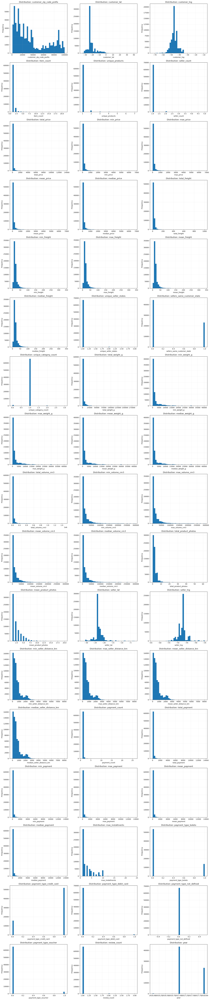

In [64]:
import matplotlib.pyplot as plt

n_cols = 3
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(18, 5 * n_rows)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):
    axes[i].hist(
        train[col].dropna(),
        bins=40
    )
    axes[i].set_title(f"Distribution: {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")
    axes[i].grid(alpha=0.2)

# Hide unused axes
for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

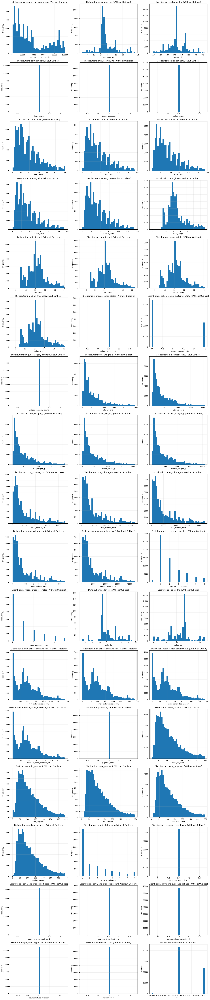

In [65]:
# without outliers

import matplotlib.pyplot as plt
import numpy as np

n_cols = 3
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(18, 5 * n_rows)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):

    data = train[col].dropna()

    # Remove outliers using IQR
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    data_no_outliers = data[
        (data >= lower_bound) &
        (data <= upper_bound)
    ]

    axes[i].hist(
        data_no_outliers,
        bins=40
    )

    axes[i].set_title(f"Distribution: {col} (Without Outliers)")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")
    axes[i].grid(alpha=0.2)

# Hide unused axes
for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

/tmp/ipykernel_829/2058662390.py:10: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2058662390.py:10: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2058662390.py:10: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2058662390.py:10: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2058662390.py:10: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use ori

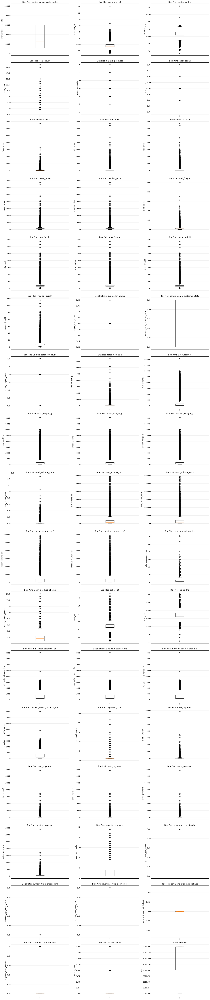

In [66]:
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(18, 5 * n_rows)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):
    axes[i].boxplot(
        train[col].dropna(),
        vert=True
    )
    axes[i].set_title(f"Box Plot: {col}")
    axes[i].set_ylabel(col)
    axes[i].grid(alpha=0.2)

for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

/tmp/ipykernel_829/2512258753.py:27: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2512258753.py:27: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2512258753.py:27: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2512258753.py:27: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i].boxplot(
/tmp/ipykernel_829/2512258753.py:27: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use ori

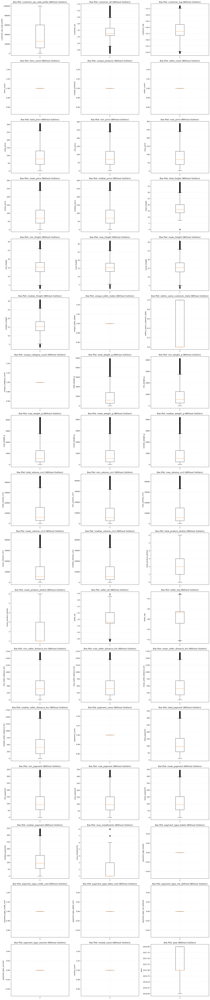

In [67]:
# without outliers
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(18, 5 * n_rows)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):

    data = train[col].dropna()

    # Remove outliers using IQR
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    data_no_outliers = data[
        (data >= lower_bound) &
        (data <= upper_bound)
    ]

    axes[i].boxplot(
        data_no_outliers,
        vert=True
    )

    axes[i].set_title(f"Box Plot: {col} (Without Outliers)")
    axes[i].set_ylabel(col)
    axes[i].grid(alpha=0.2)

for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

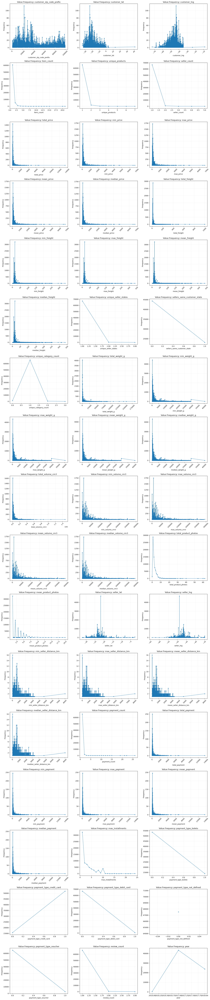

In [68]:
import matplotlib.pyplot as plt
import numpy as np

n_cols = 3
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(18, 5 * n_rows)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):
    counts = train[col].value_counts().sort_index()

    axes[i].plot(
        counts.index,
        counts.values,
        marker="o",
        markersize=3,
        linewidth=1
    )

    axes[i].set_title(f"Value Frequency: {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")
    axes[i].grid(alpha=0.2)

    # Better visibility for wide numeric ranges
    if len(counts) > 50:
        axes[i].tick_params(axis="x", rotation=45)

for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

In [69]:
#################################################################

In [70]:
###################################################################

## seller

### seller_count

DISTRIBUTION ANALYSIS — seller_count

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       5

--- STATISTICS WITH ALL VALUES ---
Mean:                1.012
Median:              1.000
Std:                 0.115
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 5.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,533
Mean:                1.012
Median:              1.000
Std:                 0.115
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 5.000

--- MOST FREQUENT VALUES ---


,frequency
seller_count,
1.0,66757
2.0,742
3.0,31
4.0,2
5.0,1


/tmp/ipykernel_829/3791042492.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


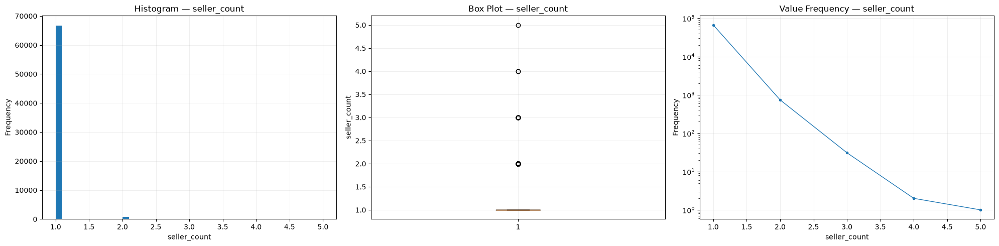

/tmp/ipykernel_829/3791042492.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


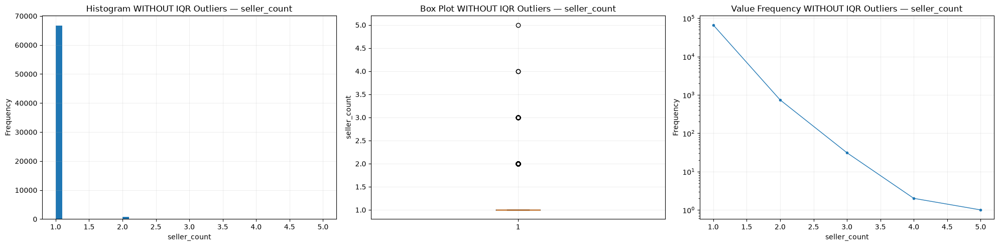


CORRELATION WITH: seller_count


,feature,pearson,spearman
15,unique_seller_states,0.639,0.631
4,unique_products,0.563,0.586
17,unique_category_count,0.304,0.298
3,item_count,0.261,0.323
10,total_freight,0.122,0.133
28,total_product_photos,0.110,0.109
11,min_freight,-0.070,-0.112
23,total_volume_cm3,0.058,0.074
42,max_installments,0.056,0.046
12,max_freight,0.055,0.071



seller_count vs TARGET
Pearson correlation: -0.0259

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: seller_count


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
15,unique_seller_states,0.639,0.639,0.0,0.631,0.631,0.0
4,unique_products,0.563,0.563,0.0,0.586,0.586,0.0
17,unique_category_count,0.304,0.304,0.0,0.298,0.298,0.0
3,item_count,0.261,0.261,0.0,0.323,0.323,0.0
10,total_freight,0.122,0.122,0.0,0.133,0.133,0.0
28,total_product_photos,0.110,0.110,0.0,0.109,0.109,0.0
11,min_freight,-0.070,-0.070,0.0,-0.112,-0.112,0.0
23,total_volume_cm3,0.058,0.058,0.0,0.074,0.074,0.0
42,max_installments,0.056,0.056,0.0,0.046,0.046,0.0
12,max_freight,0.055,0.055,0.0,0.071,0.071,0.0



seller_count vs TARGET
Pearson with all values:       -0.0259
Pearson without IQR outliers:  -0.0259
Change:                         0.0000

seller_count vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
seller_count,,,
1.0,66757,6081,9.11
2.0,742,16,2.16
3.0,31,0,0.00
4.0,2,0,0.00
5.0,1,0,0.00



seller_count DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,1.013,1.0,0.119,1.0,5.0
1,6097,1.003,1.0,0.051,1.0,2.0


In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "seller_count"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

In [123]:
! pip install seaborn

SELLER COUNT DISTRIBUTION
     Original  3+ → 3  3+ → 2
1.0     66757   66757   66757
2.0       742     742     776
3.0        31      34       0
4.0         2       0       0
5.0         1       0       0

PERCENTAGE DISTRIBUTION
     Original  3+ → 3  3+ → 2
1.0     98.85   98.85   98.85
2.0      1.10    1.10    1.15
3.0      0.05    0.05    0.00
4.0      0.00    0.00    0.00
5.0      0.00    0.00    0.00

VALUES AFFECTED
Values >= 3 : 34 (0.05%)
Values >  2 : 34 (0.05%)

TARGET DISTRIBUTION — ORIGINAL
   seller_count  orders  delayed_orders  delayed_rate  avg_delay_days  \
0           1.0   66757            6081          9.11         -10.719   
1           2.0     742              16          2.16         -15.188   
2           3.0      31               0          0.00         -19.603   
3           4.0       2               0          0.00         -20.128   
4           5.0       1               0          0.00         -16.315   

   median_delay_days  
0            -11.596  
1    

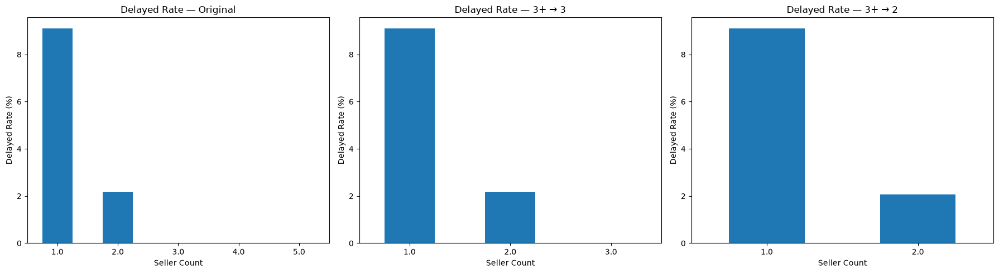

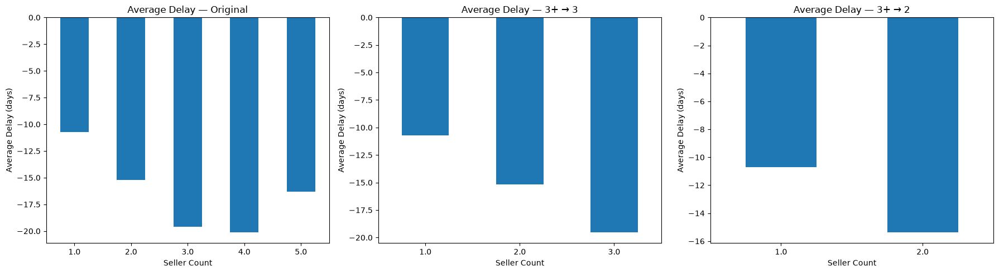


DIRECT TARGET COMPARISON
     Original  3+ → 3  3+ → 2
1.0      9.11    9.11    9.11
2.0      2.16    2.16    2.06
3.0      0.00    0.00     NaN
4.0      0.00     NaN     NaN
5.0      0.00     NaN     NaN

ORIGINAL HIGH SELLER COUNTS
   seller_count  orders  delayed_orders  delayed_rate  avg_delay_days  \
0           3.0      31               0           0.0         -19.603   
1           4.0       2               0           0.0         -20.128   
2           5.0       1               0           0.0         -16.315   

   median_delay_days  
0            -19.158  
1            -20.128  
2            -16.315  


In [124]:
# ============================================================
# SELLER COUNT — CAPPING COMPARISON
# Original vs 3+ → 3 vs 3+ → 2
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

col = "seller_count"

# ------------------------------------------------------------
# 1. Create capped versions
# ------------------------------------------------------------

train["seller_count_cap3"] = train[col].clip(upper=3)
train["seller_count_cap2"] = train[col].clip(upper=2)


# ------------------------------------------------------------
# 2. Distribution of seller_count values
# ------------------------------------------------------------

print("=" * 80)
print("SELLER COUNT DISTRIBUTION")
print("=" * 80)

distribution = pd.DataFrame({
    "Original": train[col].value_counts().sort_index(),
    "3+ → 3": train["seller_count_cap3"].value_counts().sort_index(),
    "3+ → 2": train["seller_count_cap2"].value_counts().sort_index()
}).fillna(0).astype(int)

print(distribution)


# ------------------------------------------------------------
# 3. Percentage distribution
# ------------------------------------------------------------

distribution_pct = (
    distribution
    .div(len(train))
    .mul(100)
    .round(2)
)

print("\n" + "=" * 80)
print("PERCENTAGE DISTRIBUTION")
print("=" * 80)

print(distribution_pct)


# ------------------------------------------------------------
# 4. How many values are affected?
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("VALUES AFFECTED")
print("=" * 80)

n_ge_3 = (train[col] >= 3).sum()
n_ge_3_pct = n_ge_3 / len(train) * 100

n_gt_2 = (train[col] > 2).sum()
n_gt_2_pct = n_gt_2 / len(train) * 100

print(f"Values >= 3 : {n_ge_3:,} ({n_ge_3_pct:.2f}%)")
print(f"Values >  2 : {n_gt_2:,} ({n_gt_2_pct:.2f}%)")


# ------------------------------------------------------------
# 5. Target distribution BEFORE capping
# ------------------------------------------------------------

def target_distribution(data, feature):

    result = (
        data.groupby(feature)
        .agg(
            orders=("order_id", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean"),
            median_delay_days=("delay_days", "median")
        )
        .reset_index()
    )

    result["delayed_rate"] *= 100

    return result.round({
        "delayed_rate": 2,
        "avg_delay_days": 3,
        "median_delay_days": 3
    })


print("\n" + "=" * 80)
print("TARGET DISTRIBUTION — ORIGINAL")
print("=" * 80)

original_target = target_distribution(train, col)

print(original_target)


# ------------------------------------------------------------
# 6. Target distribution AFTER 3+ → 3
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION — 3+ → 3")
print("=" * 80)

cap3_target = target_distribution(train, "seller_count_cap3")

print(cap3_target)


# ------------------------------------------------------------
# 7. Target distribution AFTER 3+ → 2
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION — 3+ → 2")
print("=" * 80)

cap2_target = target_distribution(train, "seller_count_cap2")

print(cap2_target)


# ------------------------------------------------------------
# 8. Pearson + Spearman correlations
# ------------------------------------------------------------

features = {
    "Original": col,
    "3+ → 3": "seller_count_cap3",
    "3+ → 2": "seller_count_cap2"
}

results = []

for name, feature in features.items():

    results.append({
        "version": name,

        "pearson_delayed":
            train[feature].corr(train["delayed"], method="pearson"),

        "spearman_delayed":
            train[feature].corr(train["delayed"], method="spearman"),

        "pearson_delay_days":
            train[feature].corr(train["delay_days"], method="pearson"),

        "spearman_delay_days":
            train[feature].corr(train["delay_days"], method="spearman")
    })

correlation_comparison = pd.DataFrame(results)

print("\n" + "=" * 80)
print("CORRELATION COMPARISON")
print("=" * 80)

print(correlation_comparison.round(5))


# ------------------------------------------------------------
# 9. Correlation changes relative to original
# ------------------------------------------------------------

original = correlation_comparison.iloc[0]

comparison = correlation_comparison.copy()

comparison["Δ Pearson delayed"] = (
    comparison["pearson_delayed"] - original["pearson_delayed"]
)

comparison["Δ Pearson delay_days"] = (
    comparison["pearson_delay_days"] - original["pearson_delay_days"]
)

comparison["Δ Spearman delayed"] = (
    comparison["spearman_delayed"] - original["spearman_delayed"]
)

comparison["Δ Spearman delay_days"] = (
    comparison["spearman_delay_days"] - original["spearman_delay_days"]
)

print("\n" + "=" * 80)
print("CORRELATION CHANGE FROM ORIGINAL")
print("=" * 80)

print(comparison.round(5))


# ------------------------------------------------------------
# 10. Plot delayed rate by seller count
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

versions = [
    ("Original", col),
    ("3+ → 3", "seller_count_cap3"),
    ("3+ → 2", "seller_count_cap2")
]

for ax, (title, feature) in zip(axes, versions):

    temp = (
        train.groupby(feature)["delayed"]
        .mean()
        .mul(100)
    )

    temp.plot(kind="bar", ax=ax)

    ax.set_title(f"Delayed Rate — {title}")
    ax.set_xlabel("Seller Count")
    ax.set_ylabel("Delayed Rate (%)")
    ax.tick_params(axis="x", rotation=0)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 11. Plot average delay by seller count
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (title, feature) in zip(axes, versions):

    temp = train.groupby(feature)["delay_days"].mean()

    temp.plot(kind="bar", ax=ax)

    ax.set_title(f"Average Delay — {title}")
    ax.set_xlabel("Seller Count")
    ax.set_ylabel("Average Delay (days)")
    ax.tick_params(axis="x", rotation=0)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 12. Direct comparison of target behavior
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("DIRECT TARGET COMPARISON")
print("=" * 80)

comparison_target = pd.DataFrame({
    "Original": original_target.set_index(col)["delayed_rate"],
    "3+ → 3": cap3_target.set_index("seller_count_cap3")["delayed_rate"],
    "3+ → 2": cap2_target.set_index("seller_count_cap2")["delayed_rate"]
})

print(comparison_target.round(2))


# ------------------------------------------------------------
# 13. Check original values >= 3 individually
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("ORIGINAL HIGH SELLER COUNTS")
print("=" * 80)

high_values = (
    train[train[col] >= 3]
    .groupby(col)
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

high_values["delayed_rate"] *= 100

print(
    high_values.round({
        "delayed_rate": 2,
        "avg_delay_days": 3,
        "median_delay_days": 3
    })
)

## price

### total_price

DISTRIBUTION ANALYSIS — total_price

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       5,842

--- STATISTICS WITH OUTLIERS ---
Mean:                135.884
Median:              85.000
Std:                 205.188
Min:                 2.290
Q1:                  45.900
Q3:                  149.900
Max:                 13,440.000

--- IQR OUTLIER BOUNDS ---
IQR:                 104.000
Lower bound:         -110.100
Upper bound:         305.900

--- OUTLIERS ---
Outlier count:       5,361
Outlier percentage:  7.94%
Outlier minimum:     306.000
Outlier maximum:     13,440.000

--- WITHOUT OUTLIERS ---
Valid values:        62,172
Mean:                93.988
Median:              78.000
Std:                 66.149
Min:                 2.290
Q1:                  42.900
Q3:                  129.900
Max:                 305.800

--- MOST FREQUENT VALUES ---


,frequency
total_price,
59.90,1442
69.90,1171
89.90,1017
49.90,987
99.90,816
39.90,734
19.90,718
29.90,669
49.00,645


/tmp/ipykernel_829/1200452096.py:108: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


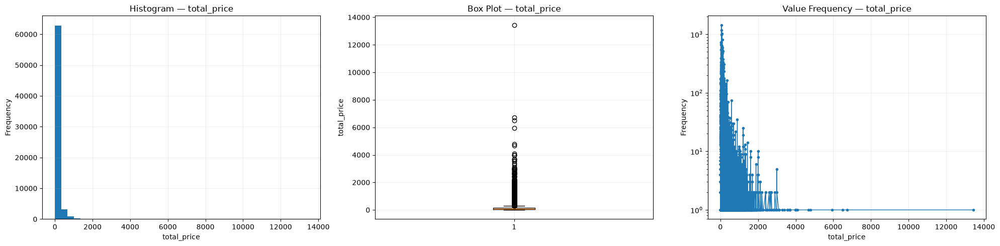

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "total_price"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = x[(x < lower_bound) | (x > upper_bound)]
normal = x[(x >= lower_bound) & (x <= upper_bound)]

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH OUTLIERS ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR OUTLIER BOUNDS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")

print("\n--- OUTLIERS ---")
print(f"Outlier count:       {len(outliers):,}")
print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

if len(outliers) > 0:
    print(f"Outlier minimum:     {outliers.min():,.3f}")
    print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No outliers detected.")

print("\n--- WITHOUT OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = x.value_counts().sort_values(ascending=False).head(15)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

# Log scale can reveal rare values hidden by large frequencies
if counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

/tmp/ipykernel_829/657452262.py:21: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


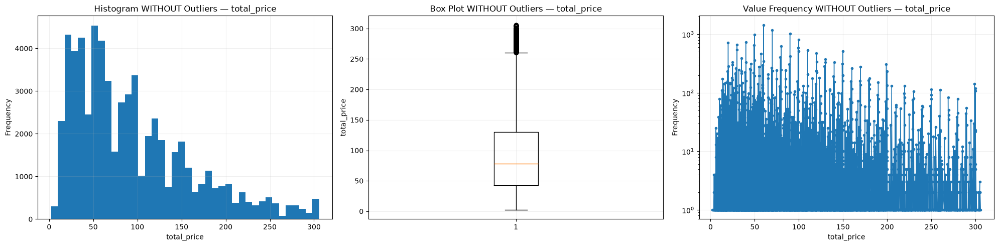

In [73]:
# ============================================================
# Visual analysis WITHOUT OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram without outliers
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot without outliers
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value frequency without outliers
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

In [74]:
# ============================================================
# Correlation of the selected column with other numeric features
# ============================================================

target = "delayed"
numeric_cols = train.select_dtypes(include=np.number).columns.tolist()
# Remove selected column and target
feature_cols = [c for c in numeric_colsif c != col and c != target]
# Keep columns with more than one unique value
feature_cols = [c for c in feature_colsif train[c].nunique(dropna=True) > 1]
# ------------------------------------------------------------
# Pearson correlation
# ------------------------------------------------------------
pearson = train[feature_cols].corrwith(train[col], method="pearson")
# ------------------------------------------------------------
# Spearman correlation
# ------------------------------------------------------------
spearman = train[feature_cols].corrwith(train[col], method="spearman")
# ------------------------------------------------------------
# Create correlation table
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": pearson.index,
    "pearson": pearson.to_numpy(),
    "spearman": spearman.reindex(pearson.index).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(correlation[["feature", "pearson", "spearman"]].round(3))
# ------------------------------------------------------------
# Correlation with target
# ------------------------------------------------------------
if target in train.columns:
    target_corr = train[[col, target]].corr().iloc[0, 1]

    print("\n" + "=" * 80)
    print(f"{col} vs TARGET")
    print("=" * 80)
    print(f"Pearson correlation: {target_corr:.4f}")

CORRELATION WITH: total_price


,feature,pearson,spearman
37,total_payment,0.996,0.991
39,max_payment,0.993,0.985
40,mean_payment,0.989,0.976
41,median_payment,0.988,0.975
38,min_payment,0.981,0.955
7,max_price,0.932,0.959
8,mean_price,0.929,0.954
9,median_price,0.928,0.953
6,min_price,0.925,0.944
10,total_freight,0.415,0.480



total_price vs TARGET
Pearson correlation: 0.0213


In [76]:
train.groupby("delayed")["total_price"].agg(
    ["count", "mean", "median", "std", "min", "max"]
)

,count,mean,median,std,min,max
delayed,,,,,,
0,61436,134.506741,84.99,203.737309,2.29,13440.0
1,6097,149.767376,89.99,218.801051,3.54,2990.0


### min\max\mea\med price

PRICE FEATURES — SUMMARY


,feature,missing,missing_%,unique,mean,median,std,min,max,IQR,outliers,outliers_%
0,min_price,0,0.0,4488,123.677,77.87,185.593,1.200,6735.0,99.66,5032,7.451
1,max_price,0,0.0,4491,124.843,79.00,186.032,2.290,6735.0,98.00,5164,7.647
2,mean_price,0,0.0,5317,124.235,78.97,185.654,1.514,6735.0,98.90,5109,7.565
3,median_price,0,0.0,5033,124.196,78.90,185.659,1.200,6735.0,99.00,5106,7.561



CORRELATION WITH TARGET — delayed


,pearson_correlation
min_price,0.0279
median_price,0.0275
mean_price,0.0274
max_price,0.0267


/tmp/ipykernel_829/2742149782.py:123: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/2742149782.py:123: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/2742149782.py:123: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/2742149782.py:123: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(


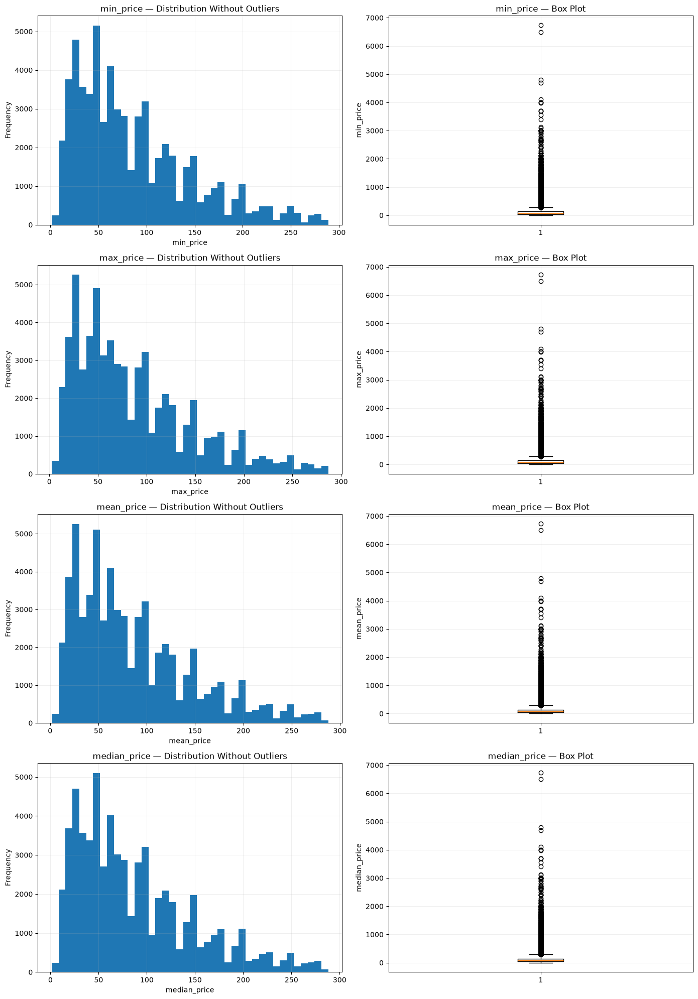

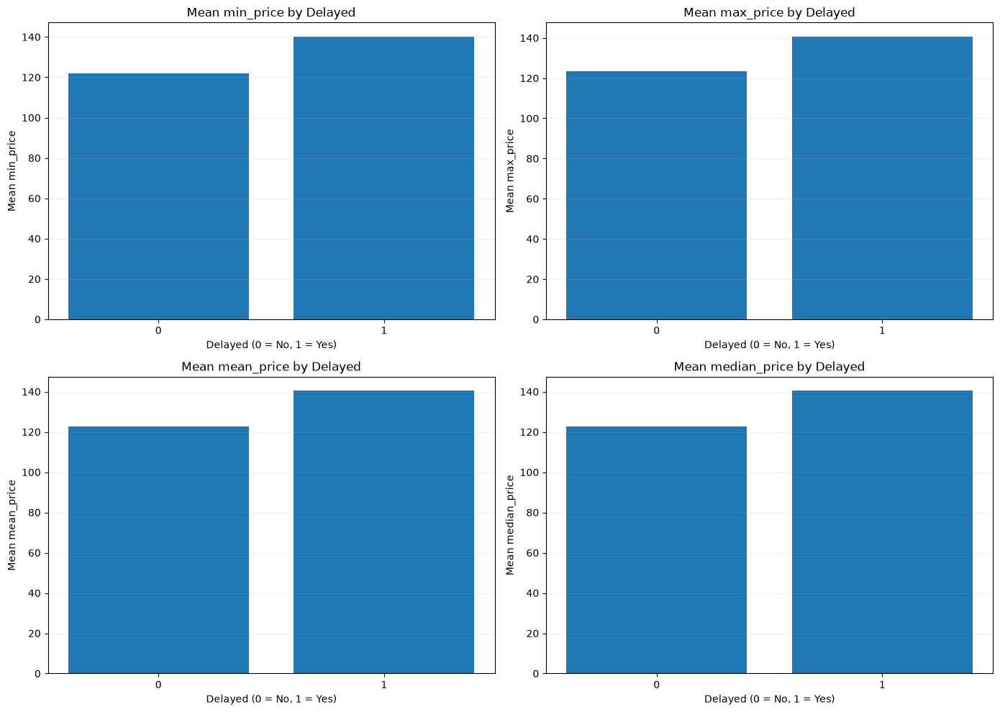


PRICE FEATURES BY TARGET


min_price        max_price         mean_price        median_price  \
             mean median      mean  median       mean median         mean   
delayed                                                                     
0         122.044   75.5   123.278  78.645    122.633   77.0      122.590   
1         140.136   85.5   140.612  86.400    140.374   85.9      140.375   

                
        median  
delayed         
0        76.99  
1        85.90

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

price_cols = [
    "min_price",
    "max_price",
    "mean_price",
    "median_price"
]

target = "delayed"

# ============================================================
# BASIC SUMMARY
# ============================================================

summary = []

for col in price_cols:
    x = train[col].dropna()
    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = x[(x < lower) | (x > upper)]
    summary.append({
        "feature": col,
        "missing": train[col].isna().sum(),
        "missing_%": train[col].isna().mean() * 100,
        "unique": x.nunique(),
        "mean": x.mean(),
        "median": x.median(),
        "std": x.std(),
        "min": x.min(),
        "max": x.max(),
        "IQR": IQR,
        "outliers": len(outliers),
        "outliers_%": len(outliers) / len(x) * 100
    })

summary = pd.DataFrame(summary)
print("=" * 100)
print("PRICE FEATURES — SUMMARY")
print("=" * 100)
display(summary.round(3))


# ============================================================
# CORRELATION WITH TARGET
# ============================================================

target_corr = train[price_cols + [target]].corr()[target].drop(target)

print("\n" + "=" * 100)
print("CORRELATION WITH TARGET — delayed")
print("=" * 100)

display(
    target_corr
    .sort_values(key=abs, ascending=False)
    .rename("pearson_correlation")
    .to_frame()
    .round(4)
)


# ============================================================
# DISTRIBUTIONS + BOXPLOTS
# ============================================================

fig, axes = plt.subplots(
    len(price_cols),
    2,
    figsize=(14, 5 * len(price_cols))
)

for i, col in enumerate(price_cols):

    x = train[col].dropna()

    # IQR
    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    normal = x[
        (x >= lower) &
        (x <= upper)
    ]

    # --------------------------------------------------------
    # Histogram WITHOUT outliers
    # --------------------------------------------------------

    axes[i, 0].hist(
        normal,
        bins=40
    )

    axes[i, 0].set_title(
        f"{col} — Distribution Without Outliers"
    )
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].grid(alpha=0.2)

    # --------------------------------------------------------
    # Boxplot WITH outliers
    # -------------------------------------------------------
    axes[i, 1].boxplot(x,vert=True)
    axes[i, 1].set_title(f"{col} — Box Plot")
    axes[i, 1].set_ylabel(col)
    axes[i, 1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# RELATIONSHIP WITH TARGET
# ============================================================

fig, axes = plt.subplots(2,2,figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(price_cols):
    grouped = train.groupby(target)[col].mean()
    axes[i].bar(grouped.index.astype(str),grouped.values)
    axes[i].set_title( f"Mean {col} by Delayed")
    axes[i].set_xlabel("Delayed (0 = No, 1 = Yes)")
    axes[i].set_ylabel(f"Mean {col}")
    axes[i].grid(axis="y",alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# TARGET GROUP STATISTICS
# ============================================================

print("\n" + "=" * 100)
print("PRICE FEATURES BY TARGET")
print("=" * 100)

target_stats = (train.groupby(target)[price_cols].agg(["mean", "median"]).round(3))
display(target_stats)

In [125]:
# min_prcie & total_price

BASIC STATISTICS
               count        mean         std   min    25%    50%     75%  \
total_price  67533.0  135.884499  205.187627  2.29  45.90  85.00  149.90   
min_price    67533.0  123.677295  185.592769  1.20  39.99  77.87  139.65   

                 max  
total_price  13440.0  
min_price     6735.0  

MISSING VALUES
total_price    0
min_price      0
dtype: int64

FEATURE vs FEATURE CORRELATION
Pearson:
             total_price  min_price
total_price        1.000      0.925
min_price          0.925      1.000

Spearman:
             total_price  min_price
total_price       1.0000     0.9436
min_price         0.9436     1.0000

CORRELATION WITH TARGETS
       feature  pearson_delayed  spearman_delayed  pearson_delay_days  \
0  total_price          0.02131           0.02749             0.00279   
1    min_price          0.02794           0.03464             0.00947   

   spearman_delay_days  
0             -0.02072  
1             -0.00827  

CORRELATION STRENGTH COMPARISON


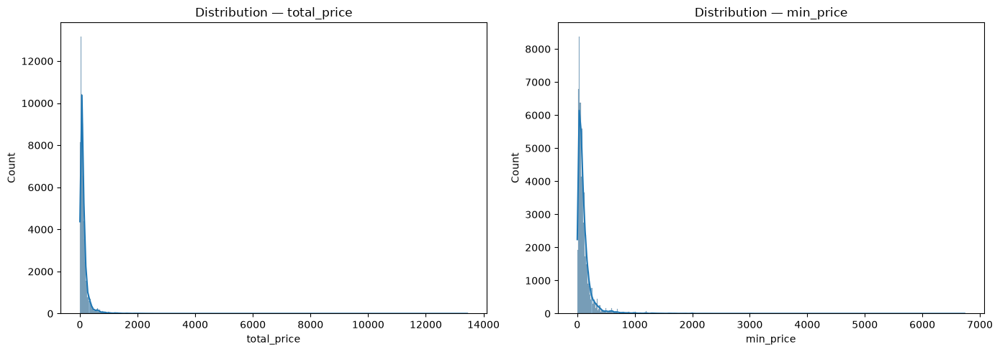

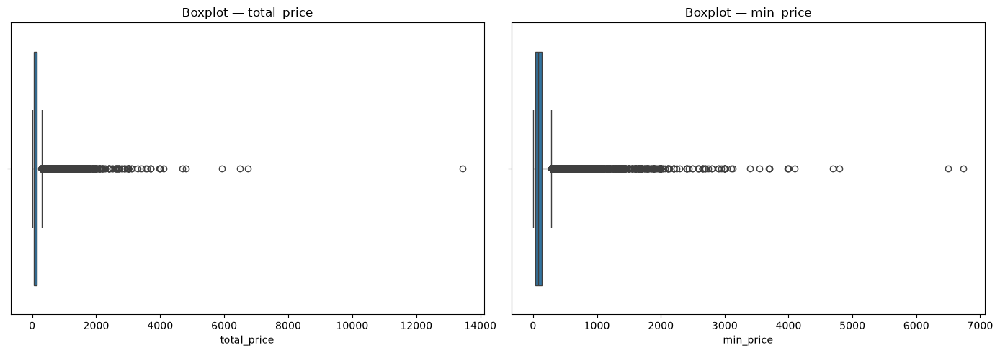

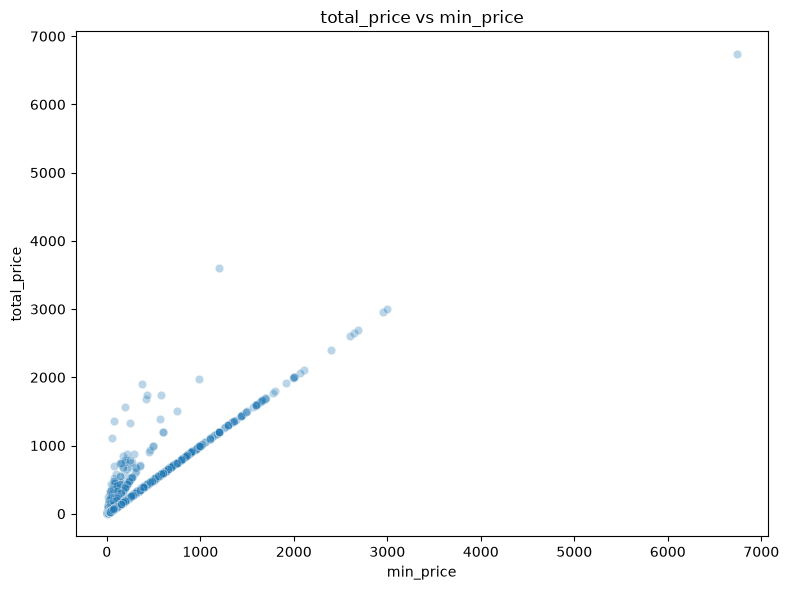

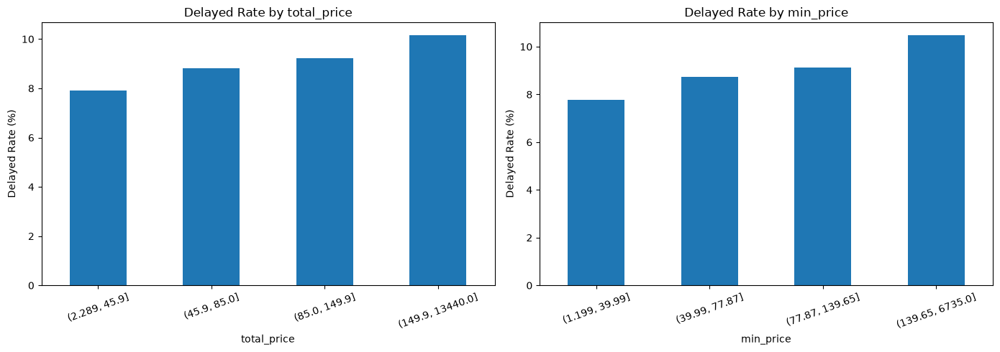

In [127]:
# ============================================================
# TOTAL_PRICE vs MIN_PRICE
# Feature Selection Analysis
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

features = ["total_price", "min_price"]
targets = ["delayed", "delay_days"]

# ------------------------------------------------------------
# 1. Check columns
# ------------------------------------------------------------

missing = [c for c in features + targets if c not in train.columns]

if missing:
    raise KeyError(f"Missing columns: {missing}")


# ------------------------------------------------------------
# 2. Basic statistics
# ------------------------------------------------------------

print("=" * 80)
print("BASIC STATISTICS")
print("=" * 80)

print(train[features].describe().T)


# ------------------------------------------------------------
# 3. Missing values
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("MISSING VALUES")
print("=" * 80)

print(train[features].isna().sum())


# ------------------------------------------------------------
# 4. Correlation between the two features
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FEATURE vs FEATURE CORRELATION")
print("=" * 80)

print("Pearson:")
print(train[features].corr(method="pearson").round(4))

print("\nSpearman:")
print(train[features].corr(method="spearman").round(4))


# ------------------------------------------------------------
# 5. Correlation with targets
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("CORRELATION WITH TARGETS")
print("=" * 80)

rows = []

for feature in features:
    rows.append({
        "feature": feature,

        "pearson_delayed":
            train[feature].corr(train["delayed"], method="pearson"),

        "spearman_delayed":
            train[feature].corr(train["delayed"], method="spearman"),

        "pearson_delay_days":
            train[feature].corr(train["delay_days"], method="pearson"),

        "spearman_delay_days":
            train[feature].corr(train["delay_days"], method="spearman")
    })

correlation_results = pd.DataFrame(rows)

print(correlation_results.round(5))


# ------------------------------------------------------------
# 6. Difference in correlation strength
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("CORRELATION STRENGTH COMPARISON")
print("=" * 80)

for target in targets:

    p = {
        f: abs(train[f].corr(train[target], method="pearson"))
        for f in features
    }

    s = {
        f: abs(train[f].corr(train[target], method="spearman"))
        for f in features
    }

    print(f"\nTarget: {target}")

    print(
        f"Pearson  → total_price: {p['total_price']:.5f} | "
        f"min_price: {p['min_price']:.5f}"
    )

    print(
        f"Spearman → total_price: {s['total_price']:.5f} | "
        f"min_price: {s['min_price']:.5f}"
    )


# ------------------------------------------------------------
# 7. Target statistics by price quartiles
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("TARGET RELATIONSHIP BY QUARTILES")
print("=" * 80)

for feature in features:

    temp = train[[feature, "delayed", "delay_days"]].dropna().copy()

    temp["quartile"] = pd.qcut(
        temp[feature],
        q=4,
        duplicates="drop"
    )

    summary = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean"),
            median_delay_days=("delay_days", "median"),
            min_value=(feature, "min"),
            max_value=(feature, "max")
        )
        .reset_index()
    )

    summary["delayed_rate"] *= 100

    print(f"\n--- {feature} ---")
    print(
        summary.round({
            "delayed_rate": 2,
            "avg_delay_days": 3,
            "median_delay_days": 3,
            "min_value": 2,
            "max_value": 2
        })
    )


# ------------------------------------------------------------
# 8. Compare feature distributions
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, feature in zip(axes, features):

    sns.histplot(
        train[feature].dropna(),
        kde=True,
        ax=ax
    )

    ax.set_title(f"Distribution — {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Count")

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. Boxplots
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, feature in zip(axes, features):

    sns.boxplot(
        x=train[feature],
        ax=ax
    )

    ax.set_title(f"Boxplot — {feature}")
    ax.set_xlabel(feature)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 10. Feature vs Feature scatter
# ------------------------------------------------------------

plt.figure(figsize=(8, 6))

sns.scatterplot(
    data=train.sample(
        min(10000, len(train)),
        random_state=42
    ),
    x="min_price",
    y="total_price",
    alpha=0.3
)

plt.title("total_price vs min_price")
plt.xlabel("min_price")
plt.ylabel("total_price")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 11. Target relationship comparison
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, feature in zip(axes, features):

    temp = train[[feature, "delayed"]].dropna().copy()

    temp["quartile"] = pd.qcut(
        temp[feature],
        q=4,
        duplicates="drop"
    )

    rate = (
        temp.groupby("quartile", observed=True)["delayed"]
        .mean()
        .mul(100)
    )

    rate.plot(kind="bar", ax=ax)

    ax.set_title(f"Delayed Rate by {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Delayed Rate (%)")
    ax.tick_params(axis="x", rotation=20)

plt.tight_layout()
plt.show()

In [129]:
for col in ["total_price", "min_price"]:

    s = train[col]
    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr

    outlier = (s < lower) | (s > upper)

    # --------------------------------------------------------
    # Original
    # --------------------------------------------------------
    before_delayed = train[col].corr(train["delayed"])
    before_days = train[col].corr(train["delay_days"])

    # --------------------------------------------------------
    # Remove ALL outliers
    # --------------------------------------------------------
    clean_all = train.loc[~outlier]

    after_all_delayed = clean_all[col].corr(clean_all["delayed"])
    after_all_days = clean_all[col].corr(clean_all["delay_days"])

    # --------------------------------------------------------
    # Remove ONLY outliers with delayed = 0
    # Keep outliers that caused delay
    # --------------------------------------------------------
    remove_no_delay = outlier & (train["delayed"] == 0)

    clean_selective = train.loc[~remove_no_delay]

    after_selective_delayed = clean_selective[col].corr(
        clean_selective["delayed"]
    )

    after_selective_days = clean_selective[col].corr(
        clean_selective["delay_days"]
    )

    # --------------------------------------------------------
    # Results
    # --------------------------------------------------------
    print("=" * 75)
    print(col)

    print(f"\nTotal outliers: {outlier.sum():,}")
    print(
        f"Outliers causing delay: "
        f"{(outlier & (train['delayed'] == 1)).sum():,}"
    )
    print(
        f"Outliers with NO delay: "
        f"{remove_no_delay.sum():,}"
    )

    print("\nRemoved in selective approach:")
    print(
        f"{remove_no_delay.sum():,} "
        f"({remove_no_delay.mean()*100:.2f}% of all rows)"
    )

    print("\nPearson with delayed:")
    print(f"  Original              : {before_delayed:.5f}")
    print(f"  Remove all outliers   : {after_all_delayed:.5f}")
    print(f"  Selective removal     : {after_selective_delayed:.5f}")

    print("\nPearson with delay_days:")
    print(f"  Original              : {before_days:.5f}")
    print(f"  Remove all outliers   : {after_all_days:.5f}")
    print(f"  Selective removal     : {after_selective_days:.5f}")

total_price

Total outliers: 5,361
Outliers causing delay: 573
Outliers with NO delay: 4,788

Removed in selective approach:
4,788 (7.09% of all rows)

Pearson with delayed:
  Original              : 0.02131
  Remove all outliers   : 0.02186
  Selective removal     : 0.17694

Pearson with delay_days:
  Original              : 0.00279
  Remove all outliers   : -0.00025
  Selective removal     : 0.11213
min_price

Total outliers: 5,032
Outliers causing delay: 578
Outliers with NO delay: 4,454

Removed in selective approach:
4,454 (6.60% of all rows)

Pearson with delayed:
  Original              : 0.02794
  Remove all outliers   : 0.02681
  Selective removal     : 0.18098

Pearson with delay_days:
  Original              : 0.00947
  Remove all outliers   : 0.00973
  Selective removal     : 0.11840


## freight

### total_freight

DISTRIBUTION ANALYSIS — total_freight

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       6,222

--- STATISTICS WITH ALL VALUES ---
Mean:                22.244
Median:              16.790
Std:                 20.000
Min:                 0.000
Q1:                  14.100
Q3:                  23.700
Max:                 1,002.290

--- IQR ANALYSIS ---
IQR:                 9.600
Lower bound:         -0.300
Upper bound:         38.100
Method:              IQR

--- OUTLIERS ---
Outlier count:       6,629
Outlier percentage:  9.82%
Outlier minimum:     38.100
Outlier maximum:     1,002.290

--- WITHOUT IQR OUTLIERS ---
Valid values:        60,904
Mean:                17.621
Median:              16.110
Std:                 6.701
Min:                 0.000
Q1:                  13.510
Q3:                  20.080
Max:                 38.090

--- MOST FREQUENT VALUES ---


,frequency
total_freight,
15.10,2891
7.78,1795
14.10,1483
11.85,1419
16.11,777
8.72,721
16.79,677
14.52,651
10.96,568


/tmp/ipykernel_829/2888608240.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


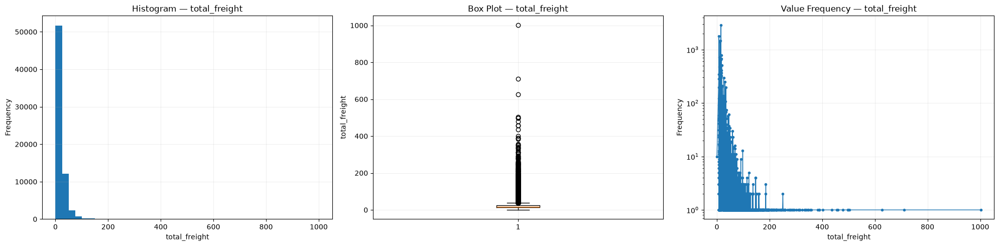

/tmp/ipykernel_829/2888608240.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


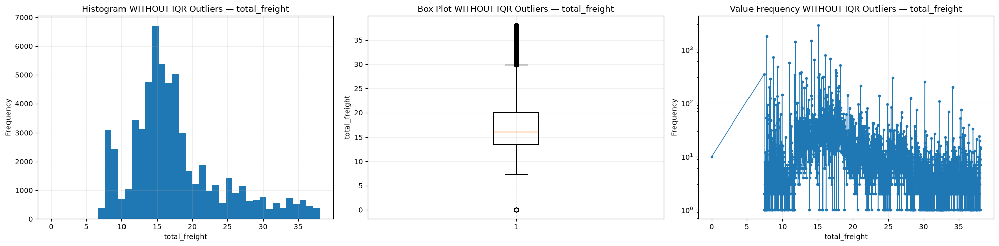


CORRELATION WITH: total_freight


,feature,pearson,spearman
12,max_freight,0.804,0.894
13,mean_freight,0.789,0.878
14,median_freight,0.786,0.877
11,min_freight,0.764,0.841
18,total_weight_g,0.660,0.510
23,total_volume_cm3,0.656,0.430
20,max_weight_g,0.521,0.445
21,mean_weight_g,0.512,0.439
22,median_weight_g,0.511,0.438
19,min_weight_g,0.502,0.425



total_freight vs TARGET
Pearson correlation: 0.0466

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: total_freight


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
12,max_freight,0.804,0.848,0.044,0.894,0.892,-0.003
13,mean_freight,0.789,0.830,0.041,0.878,0.876,-0.002
14,median_freight,0.786,0.830,0.045,0.877,0.877,-0.000
11,min_freight,0.764,0.796,0.031,0.841,0.853,0.012
18,total_weight_g,0.660,0.357,-0.303,0.510,0.415,-0.095
23,total_volume_cm3,0.656,0.330,-0.325,0.430,0.336,-0.094
20,max_weight_g,0.521,0.325,-0.196,0.445,0.367,-0.078
21,mean_weight_g,0.512,0.320,-0.192,0.439,0.362,-0.077
22,median_weight_g,0.511,0.320,-0.191,0.438,0.362,-0.076
19,min_weight_g,0.502,0.315,-0.187,0.425,0.353,-0.072



total_freight vs TARGET
Pearson with all values:       0.0466
Pearson without IQR outliers:  0.0626
Change:                         0.0159

total_freight vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
total_freight,,,
0.00,10,0,0.00
7.39,346,14,4.05
7.40,1,0,0.00
7.41,1,0,0.00
7.42,2,0,0.00
...,...,...,...
497.42,1,0,0.00
502.98,1,0,0.00
626.64,1,0,0.00



total_freight DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,21.951,16.60,19.604,0.00,1002.29
1,6097,25.203,18.12,23.414,7.39,711.33


In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "total_freight"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

### min\max\mean\med fright

FREIGHT FEATURES — SUMMARY


,feature,missing,missing_%,unique,mean,median,std,min,max,IQR,outliers,outliers_%
0,min_freight,0,0.0,5525,19.478,16.11,14.426,0.0,338.3,6.78,7347,10.879
1,max_freight,0,0.0,5257,19.802,16.14,14.521,0.0,338.3,7.28,7055,10.447
2,mean_freight,0,0.0,5840,19.638,16.11,14.379,0.0,338.3,6.85,7103,10.518
3,median_freight,0,0.0,5636,19.634,16.11,14.388,0.0,338.3,6.88,7101,10.515



CORRELATION WITH TARGET — delayed


,pearson_correlation
min_freight,0.0713
median_freight,0.0695
mean_freight,0.0693
max_freight,0.0664


/tmp/ipykernel_829/3678277305.py:116: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/3678277305.py:116: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/3678277305.py:116: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/3678277305.py:116: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(


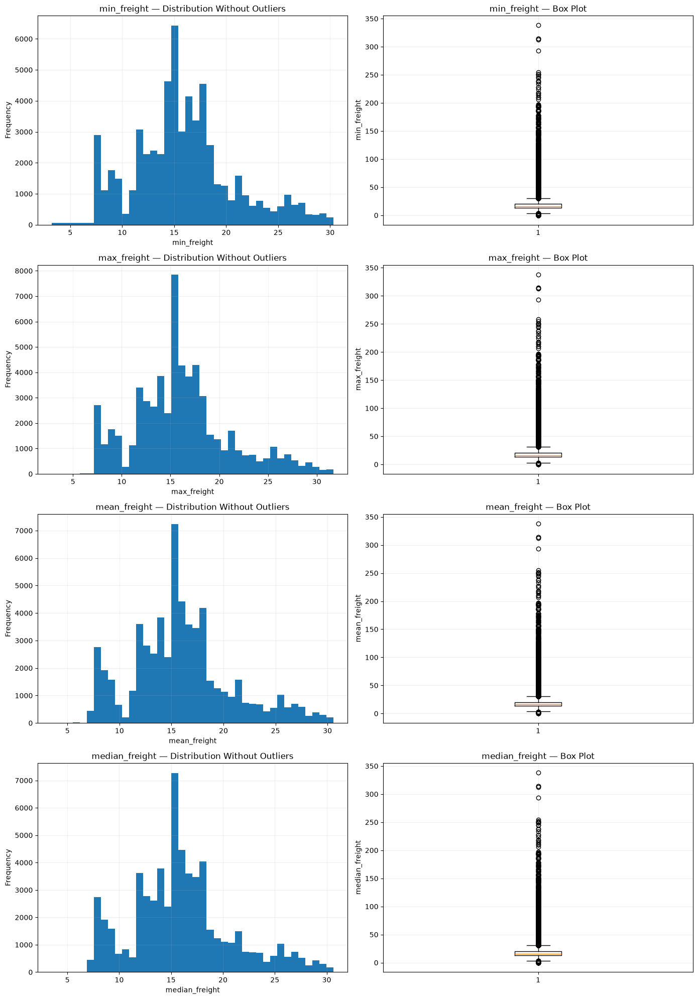

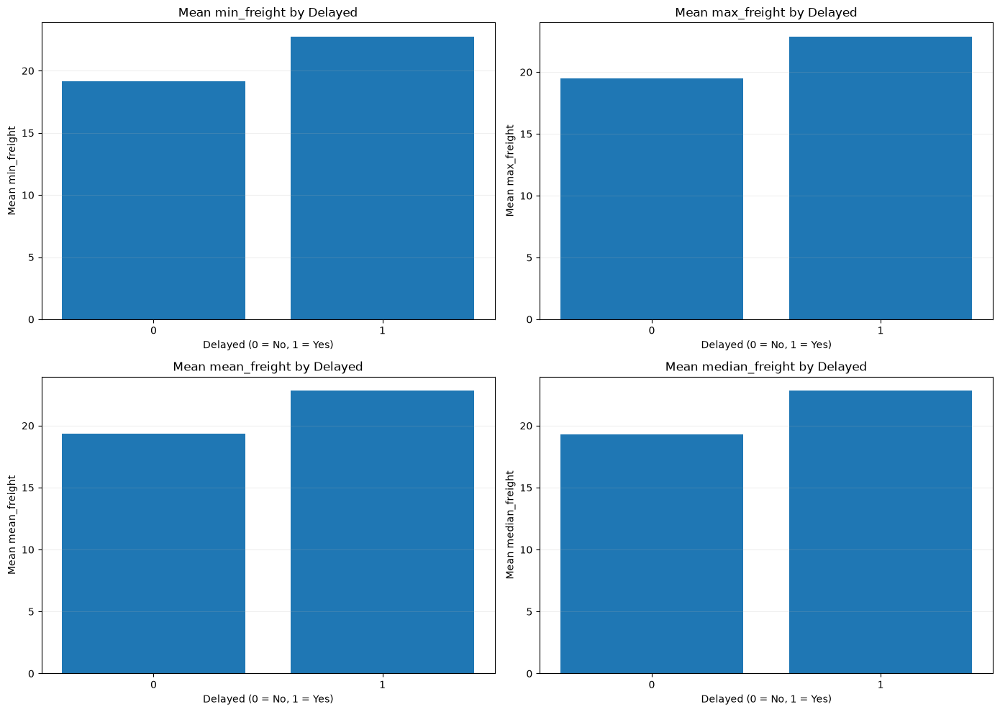


FREIGHT FEATURES BY TARGET


min_freight        max_freight        mean_freight         \
               mean median        mean median         mean median   
delayed                                                             
0            19.154  15.94      19.499  16.11       19.324  16.05   
1            22.741  17.66      22.862  17.67       22.803  17.66   

        median_freight         
                  mean median  
delayed                        
0               19.320  16.05  
1               22.806  17.67

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

freight_cols = [
    "min_freight",
    "max_freight",
    "mean_freight",
    "median_freight"
]

target = "delayed"

# ============================================================
# BASIC SUMMARY + OUTLIERS
# ============================================================

summary = []

for col in freight_cols:

    x = train[col].dropna()

    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = x[(x < lower) | (x > upper)]

    summary.append({
        "feature": col,
        "missing": train[col].isna().sum(),
        "missing_%": train[col].isna().mean() * 100,
        "unique": x.nunique(),
        "mean": x.mean(),
        "median": x.median(),
        "std": x.std(),
        "min": x.min(),
        "max": x.max(),
        "IQR": IQR,
        "outliers": len(outliers),
        "outliers_%": len(outliers) / len(x) * 100
    })

summary = pd.DataFrame(summary)

print("=" * 100)
print("FREIGHT FEATURES — SUMMARY")
print("=" * 100)

display(summary.round(3))


# ============================================================
# CORRELATION WITH TARGET
# ============================================================

target_corr = train[freight_cols + [target]].corr()[target].drop(target)

print("\n" + "=" * 100)
print("CORRELATION WITH TARGET — delayed")
print("=" * 100)

display(
    target_corr
    .sort_values(key=abs, ascending=False)
    .rename("pearson_correlation")
    .to_frame()
    .round(4)
)


# ============================================================
# DISTRIBUTION + BOXPLOT
# ============================================================

fig, axes = plt.subplots(
    len(freight_cols),
    2,
    figsize=(14, 5 * len(freight_cols))
)

for i, col in enumerate(freight_cols):

    x = train[col].dropna()

    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    normal = x[
        (x >= lower) &
        (x <= upper)
    ]

    # Histogram without outliers
    axes[i, 0].hist(
        normal,
        bins=40
    )

    axes[i, 0].set_title(
        f"{col} — Distribution Without Outliers"
    )
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].grid(alpha=0.2)

    # Boxplot with outliers
    axes[i, 1].boxplot(
        x,
        vert=True
    )

    axes[i, 1].set_title(
        f"{col} — Box Plot"
    )
    axes[i, 1].set_ylabel(col)
    axes[i, 1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# RELATIONSHIP WITH TARGET
# ============================================================

fig, axes = plt.subplots(2,2,figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(freight_cols):
    grouped = train.groupby(target)[col].mean()
    axes[i].bar(grouped.index.astype(str),grouped.values)
    axes[i].set_title(f"Mean {col} by Delayed")
    axes[i].set_xlabel("Delayed (0 = No, 1 = Yes)")
    axes[i].set_ylabel(f"Mean {col}")
    axes[i].grid(axis="y",alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# TARGET GROUP STATISTICS
# ============================================================

print("\n" + "=" * 100)
print("FREIGHT FEATURES BY TARGET")
print("=" * 100)
display(train.groupby(target)[freight_cols].agg(["mean", "median"]).round(3))

In [130]:
#######################################################################################

In [131]:
# ============================================================
# TOTAL_FREIGHT vs MIN_FREIGHT
# Feature Selection + Outlier Analysis
# ============================================================

features = ["total_freight", "min_freight"]
targets = ["delayed", "delay_days"]

# ------------------------------------------------------------
# 1. Check columns
# ------------------------------------------------------------

missing = [c for c in features + targets if c not in train.columns]

if missing:
    raise KeyError(f"Missing columns: {missing}")

# ------------------------------------------------------------
# 2. Basic statistics
# ------------------------------------------------------------

print("=" * 80)
print("BASIC STATISTICS")
print("=" * 80)

print(train[features].describe().T)

# ------------------------------------------------------------
# 3. Missing values
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("MISSING VALUES")
print("=" * 80)

print(train[features].isna().sum())

# ------------------------------------------------------------
# 4. Feature vs Feature correlation
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FEATURE vs FEATURE CORRELATION")
print("=" * 80)

print("Pearson:")
print(train[features].corr(method="pearson").round(4))

print("\nSpearman:")
print(train[features].corr(method="spearman").round(4))

# ------------------------------------------------------------
# 5. Correlation with targets
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("CORRELATION WITH TARGETS")
print("=" * 80)

rows = []

for feature in features:
    rows.append({
        "feature": feature,
        "pearson_delayed":
            train[feature].corr(train["delayed"], method="pearson"),
        "spearman_delayed":
            train[feature].corr(train["delayed"], method="spearman"),
        "pearson_delay_days":
            train[feature].corr(train["delay_days"], method="pearson"),
        "spearman_delay_days":
            train[feature].corr(train["delay_days"], method="spearman")
    })

print(pd.DataFrame(rows).round(5))

# ------------------------------------------------------------
# 6. Target relationship by quartiles
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("TARGET RELATIONSHIP BY QUARTILES")
print("=" * 80)

for feature in features:

    temp = train[[feature, "delayed", "delay_days"]].dropna().copy()

    temp["quartile"] = pd.qcut(
        temp[feature],
        q=4,
        duplicates="drop"
    )

    summary = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean"),
            median_delay_days=("delay_days", "median")
        )
        .reset_index()
    )

    summary["delayed_rate"] *= 100

    print(f"\n--- {feature} ---")
    print(summary.round(3))

# ------------------------------------------------------------
# 7. Outliers + correlation before/after
# ------------------------------------------------------------

for col in features:

    s = train[col]

    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (s < lower) | (s > upper)

    # Original
    before_delayed = train[col].corr(train["delayed"])
    before_days = train[col].corr(train["delay_days"])

    # Remove ALL outliers
    clean_all = train.loc[~outlier]

    after_all_delayed = clean_all[col].corr(clean_all["delayed"])
    after_all_days = clean_all[col].corr(clean_all["delay_days"])

    # Remove ONLY outliers with NO delay
    remove_no_delay = outlier & (train["delayed"] == 0)

    clean_selective = train.loc[~remove_no_delay]

    after_selective_delayed = clean_selective[col].corr(
        clean_selective["delayed"]
    )

    after_selective_days = clean_selective[col].corr(
        clean_selective["delay_days"]
    )

    # --------------------------------------------------------
    # Results
    # --------------------------------------------------------

    print("\n" + "=" * 75)
    print(col)

    print(f"\nOutlier limits: {lower:.3f} → {upper:.3f}")

    print(f"Total outliers       : {outlier.sum():,}")
    print(
        f"Outliers with delay  : "
        f"{(outlier & (train['delayed'] == 1)).sum():,}"
    )
    print(
        f"Outliers without delay: "
        f"{remove_no_delay.sum():,}"
    )

    print("\nPearson with delayed:")
    print(f"  Original            : {before_delayed:.5f}")
    print(f"  Remove ALL outliers : {after_all_delayed:.5f}")
    print(f"  Selective removal   : {after_selective_delayed:.5f}")

    print("\nPearson with delay_days:")
    print(f"  Original            : {before_days:.5f}")
    print(f"  Remove ALL outliers : {after_all_days:.5f}")
    print(f"  Selective removal   : {after_selective_days:.5f}")

BASIC STATISTICS
                 count       mean        std  min    25%    50%    75%  \
total_freight  67533.0  22.244256  19.999582  0.0  14.10  16.79  23.70   
min_freight    67533.0  19.477836  14.425945  0.0  13.37  16.11  20.15   

                   max  
total_freight  1002.29  
min_freight     338.30  

MISSING VALUES
total_freight    0
min_freight      0
dtype: int64

FEATURE vs FEATURE CORRELATION
Pearson:
               total_freight  min_freight
total_freight         1.0000       0.7644
min_freight           0.7644       1.0000

Spearman:
               total_freight  min_freight
total_freight         1.0000       0.8408
min_freight           0.8408       1.0000

CORRELATION WITH TARGETS
         feature  pearson_delayed  spearman_delayed  pearson_delay_days  \
0  total_freight          0.04660           0.08159            -0.01329   
1    min_freight          0.07126           0.10193             0.00406   

   spearman_delay_days  
0             -0.09873  
1           

In [132]:
# ============================================================
# SEQUENTIAL OUTLIER REMOVAL
# Freight → Price
# ============================================================

cols = ["total_freight", "min_freight", "total_price", "min_price"]

data = train.copy()

print("=" * 80)
print("SEQUENTIAL CORRELATION AFTER SELECTIVE OUTLIER REMOVAL")
print("=" * 80)


def show_corr(df, stage):
    print(f"\n{'-' * 80}")
    print(stage)
    print(f"Rows: {len(df):,}")

    for col in cols:
        print(
            f"{col:<18} | "
            f"delayed: {df[col].corr(df['delayed']): .5f} | "
            f"delay_days: {df[col].corr(df['delay_days']): .5f}"
        )


# ------------------------------------------------------------
# 1. Original
# ------------------------------------------------------------

show_corr(data, "1. ORIGINAL")


# ------------------------------------------------------------
# Function: remove only outliers with delayed = 0
# ------------------------------------------------------------

def remove_non_delayed_outliers(df, columns):

    mask_remove = pd.Series(False, index=df.index)

    for col in columns:

        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1

        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr

        outlier = (df[col] < lower) | (df[col] > upper)

        # Only remove outliers that did NOT cause delay
        mask_remove |= outlier & (df["delayed"] == 0)

    return df.loc[~mask_remove].copy(), mask_remove


# ------------------------------------------------------------
# 2. Remove non-delayed freight outliers
# ------------------------------------------------------------

data_freight, removed_freight = remove_non_delayed_outliers(
    data,
    ["total_freight", "min_freight"]
)

print(
    f"\nFreight rows removed: "
    f"{removed_freight.sum():,}"
)

show_corr(
    data_freight,
    "2. AFTER REMOVING NON-DELAYED FREIGHT OUTLIERS"
)


# ------------------------------------------------------------
# 3. Remove non-delayed price outliers
#    FROM THE ALREADY CLEANED FREIGHT DATA
# ------------------------------------------------------------

data_final, removed_price = remove_non_delayed_outliers(
    data_freight,
    ["total_price", "min_price"]
)

print(
    f"\nAdditional price rows removed: "
    f"{removed_price.sum():,}"
)

print(
    f"Total rows removed: "
    f"{len(data) - len(data_final):,}"
)

show_corr(
    data_final,
    "3. AFTER FREIGHT + PRICE SELECTIVE OUTLIER REMOVAL"
)


# ------------------------------------------------------------
# 4. Final summary table
# ------------------------------------------------------------

results = []

datasets = {
    "Original": data,
    "After Freight": data_freight,
    "After Freight + Price": data_final
}

for stage, df in datasets.items():

    for col in cols:

        results.append({
            "stage": stage,
            "feature": col,
            "pearson_delayed":
                df[col].corr(df["delayed"]),
            "pearson_delay_days":
                df[col].corr(df["delay_days"])
        })

results = pd.DataFrame(results)

print("\n" + "=" * 80)
print("FINAL SEQUENTIAL SUMMARY")
print("=" * 80)

print(results.round(5).to_string(index=False))

SEQUENTIAL CORRELATION AFTER SELECTIVE OUTLIER REMOVAL

--------------------------------------------------------------------------------
1. ORIGINAL
Rows: 67,533
total_freight      | delayed:  0.04660 | delay_days: -0.01329
min_freight        | delayed:  0.07126 | delay_days:  0.00406
total_price        | delayed:  0.02131 | delay_days:  0.00279
min_price          | delayed:  0.02794 | delay_days:  0.00947

Freight rows removed: 8,192

--------------------------------------------------------------------------------
2. AFTER REMOVING NON-DELAYED FREIGHT OUTLIERS
Rows: 59,341
total_freight      | delayed:  0.26502 | delay_days:  0.13303
min_freight        | delayed:  0.28148 | delay_days:  0.14098
total_price        | delayed:  0.08753 | delay_days:  0.05392
min_price          | delayed:  0.08038 | delay_days:  0.05078

Additional price rows removed: 3,628
Total rows removed: 11,820

--------------------------------------------------------------------------------
3. AFTER FREIGHT + PRICE

## items&products

### item_count

DISTRIBUTION ANALYSIS — item_count

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       17

--- STATISTICS WITH ALL VALUES ---
Mean:                1.142
Median:              1.000
Std:                 0.542
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 21.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,533
Mean:                1.142
Median:              1.000
Std:                 0.542
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 21.000

--- MOST FREQUENT VALUES ---


,frequency
item_count,
1.0,60774
2.0,5201
3.0,903
4.0,363
5.0,134
6.0,115
7.0,13
8.0,8
10.0,6


/tmp/ipykernel_829/1306985235.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


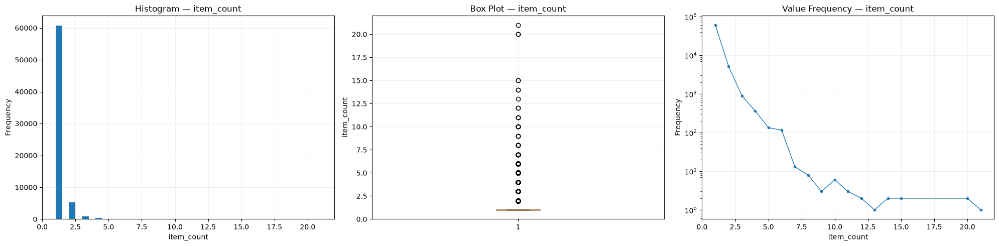

/tmp/ipykernel_829/1306985235.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


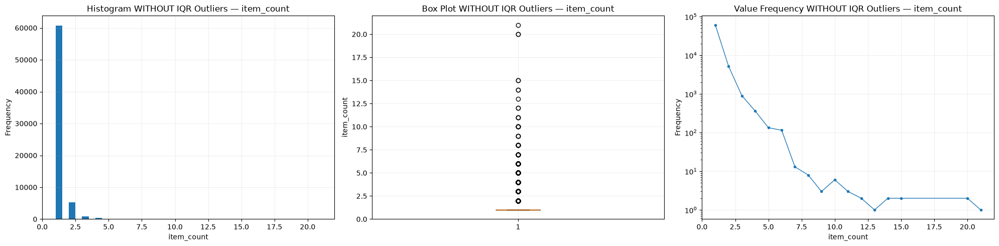


CORRELATION WITH: item_count


,feature,pearson,spearman
10,total_freight,0.475,0.398
3,unique_products,0.457,0.550
28,total_product_photos,0.395,0.290
23,total_volume_cm3,0.279,0.193
4,seller_count,0.261,0.323
18,total_weight_g,0.223,0.185
41,median_payment,0.195,0.220
40,mean_payment,0.195,0.220
39,max_payment,0.194,0.222
38,min_payment,0.194,0.215



item_count vs TARGET
Pearson correlation: -0.0161

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: item_count


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
10,total_freight,0.475,0.475,0.0,0.398,0.398,0.0
3,unique_products,0.457,0.457,0.0,0.550,0.550,0.0
28,total_product_photos,0.395,0.395,0.0,0.290,0.290,0.0
23,total_volume_cm3,0.279,0.279,0.0,0.193,0.193,0.0
4,seller_count,0.261,0.261,0.0,0.323,0.323,0.0
18,total_weight_g,0.223,0.223,0.0,0.185,0.185,0.0
41,median_payment,0.195,0.195,0.0,0.220,0.220,0.0
40,mean_payment,0.195,0.195,0.0,0.220,0.220,0.0
39,max_payment,0.194,0.194,0.0,0.222,0.222,0.0
38,min_payment,0.194,0.194,0.0,0.215,0.215,0.0



item_count vs TARGET
Pearson with all values:       -0.0161
Pearson without IQR outliers:  -0.0161
Change:                         0.0000

item_count vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
item_count,,,
1.0,60774,5601,9.22
2.0,5201,388,7.46
3.0,903,62,6.87
4.0,363,24,6.61
5.0,134,12,8.96
6.0,115,9,7.83
7.0,13,0,0.00
8.0,8,0,0.00
9.0,3,0,0.00



item_count DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,1.145,1.0,0.545,1.0,20.0
1,6097,1.114,1.0,0.511,1.0,21.0


In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "item_count"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()
axes[2].plot(normal_counts.index,normal_counts.values,marker="o",markersize=3,linewidth=1)
axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)
if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")
plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()
feature_cols = [c for c in numeric_colsif c != col and c != target]
feature_cols = [c for c in feature_colsif train[c].nunique(dropna=True) > 1]
# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------
pearson = train[feature_cols].corrwith(train[col],method="pearson")
# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(train[col],method="spearman")
correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values("abs_pearson",ascending=False)
print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)
display(correlation[["feature", "pearson", "spearman"]].round(3))
# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]
print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")
# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(train[col],method="pearson")
spearman_with = train[feature_cols].corrwith(train[col],method="spearman")
# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------
pearson_without = train_normal[feature_cols].corrwith(train_normal[col],method="pearson")
spearman_without = train_normal[feature_cols].corrwith(train_normal[col],method="spearman")
# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(method="pearson").iloc[0, 1]
target_without = train_normal[[col, target]].corr(method="pearson").iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(count="count",delayed="sum",delayed_rate="mean")
target_by_value["delayed_rate"] = (target_by_value["delayed_rate"] * 100).round(2)
display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

In [133]:
# ============================================================
# ITEM_COUNT — TARGET + CAPPING + SELECTIVE OUTLIER REMOVAL
# ============================================================

import pandas as pd

col = "item_count"

# ------------------------------------------------------------
# 1. Delay distribution for every original item_count
# ------------------------------------------------------------

print("=" * 80)
print("DELAY DISTRIBUTION BY ITEM_COUNT")
print("=" * 80)

summary = (
    train.groupby(col)
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

summary["delayed_rate"] *= 100

print(summary.round(3).to_string(index=False))


# ------------------------------------------------------------
# 2. Correlation — ORIGINAL
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("ORIGINAL CORRELATION")
print("=" * 80)

print(f"Pearson  delayed    : {train[col].corr(train['delayed']):.5f}")
print(f"Spearman delayed    : {train[col].corr(train['delayed'], method='spearman'):.5f}")
print(f"Pearson  delay_days : {train[col].corr(train['delay_days']):.5f}")
print(f"Spearman delay_days : {train[col].corr(train['delay_days'], method='spearman'):.5f}")


# ------------------------------------------------------------
# 3. Cap item_count > 6 → 6
# ------------------------------------------------------------

train["item_count_cap6"] = train[col].clip(upper=6)

print("\n" + "=" * 80)
print("AFTER item_count > 6 → 6")
print("=" * 80)

print(
    f"Values changed: "
    f"{(train[col] > 6).sum():,}"
)

print(f"Pearson  delayed    : {train['item_count_cap6'].corr(train['delayed']):.5f}")
print(f"Spearman delayed    : {train['item_count_cap6'].corr(train['delayed'], method='spearman'):.5f}")
print(f"Pearson  delay_days : {train['item_count_cap6'].corr(train['delay_days']):.5f}")
print(f"Spearman delay_days : {train['item_count_cap6'].corr(train['delay_days'], method='spearman'):.5f}")


# ------------------------------------------------------------
# 4. Delay distribution after capping
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("DELAY DISTRIBUTION AFTER CAP6")
print("=" * 80)

summary_cap = (
    train.groupby("item_count_cap6")
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

summary_cap["delayed_rate"] *= 100

print(summary_cap.round(3).to_string(index=False))


# ------------------------------------------------------------
# 5. Remove ONLY non-delayed outliers from PRICE + FREIGHT
# ------------------------------------------------------------

data = train.copy()

price_freight = [
    "total_price",
    "min_price",
    "total_freight",
    "min_freight"
]

remove_mask = pd.Series(False, index=data.index)

print("\n" + "=" * 80)
print("SELECTIVE OUTLIER REMOVAL")
print("=" * 80)

for feature in price_freight:

    q1 = data[feature].quantile(0.25)
    q3 = data[feature].quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (data[feature] < lower) | (data[feature] > upper)

    non_delayed_outlier = outlier & (data["delayed"] == 0)

    remove_mask |= non_delayed_outlier

    print(
        f"{feature:<16} | "
        f"Outliers: {outlier.sum():,} | "
        f"Non-delayed: {non_delayed_outlier.sum():,}"
    )


# ------------------------------------------------------------
# 6. Dataset after selective removal
# ------------------------------------------------------------

clean = data.loc[~remove_mask].copy()

print("\n" + "-" * 80)
print(f"Original rows : {len(data):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean):,}")


# ------------------------------------------------------------
# 7. item_count correlation AFTER price/freight cleaning
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("ITEM_COUNT CORRELATION AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

print(
    f"Original item_count | delayed    : "
    f"{data[col].corr(data['delayed']):.5f}"
)

print(
    f"Cleaned item_count  | delayed    : "
    f"{clean[col].corr(clean['delayed']):.5f}"
)

print(
    f"Original item_count | delay_days : "
    f"{data[col].corr(data['delay_days']):.5f}"
)

print(
    f"Cleaned item_count  | delay_days : "
    f"{clean[col].corr(clean['delay_days']):.5f}"
)


# ------------------------------------------------------------
# 8. Also test CAP6 after price/freight cleaning
# ------------------------------------------------------------

clean["item_count_cap6"] = clean[col].clip(upper=6)

print("\n" + "=" * 80)
print("ITEM_COUNT CAP6 AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

print(
    f"CAP6 | delayed    : "
    f"{clean['item_count_cap6'].corr(clean['delayed']):.5f}"
)

print(
    f"CAP6 | delay_days : "
    f"{clean['item_count_cap6'].corr(clean['delay_days']):.5f}"
)


# ------------------------------------------------------------
# 9. Final sequential comparison
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FINAL SEQUENTIAL COMPARISON")
print("=" * 80)

print(f"""
                         delayed       delay_days
--------------------------------------------------
Original item_count      {train[col].corr(train['delayed']):.5f}        {train[col].corr(train['delay_days']):.5f}
Cap >6 → 6              {train['item_count_cap6'].corr(train['delayed']):.5f}        {train['item_count_cap6'].corr(train['delay_days']):.5f}
After P+F cleaning       {clean[col].corr(clean['delayed']):.5f}        {clean[col].corr(clean['delay_days']):.5f}
Cap6 + P+F cleaning      {clean['item_count_cap6'].corr(clean['delayed']):.5f}        {clean['item_count_cap6'].corr(clean['delay_days']):.5f}
""")

DELAY DISTRIBUTION BY ITEM_COUNT
 item_count  orders  delayed_orders  delayed_rate  avg_delay_days  median_delay_days
        1.0   60774            5601         9.216         -10.659            -11.539
        2.0    5201             388         7.460         -11.723            -12.306
        3.0     903              62         6.866         -11.936            -12.240
        4.0     363              24         6.612         -11.648            -12.236
        5.0     134              12         8.955         -13.135            -13.265
        6.0     115               9         7.826         -12.716            -12.202
        7.0      13               0         0.000         -12.167            -12.190
        8.0       8               0         0.000         -10.798             -9.427
        9.0       3               0         0.000         -15.560            -13.260
       10.0       6               0         0.000         -13.617            -12.676
       11.0       3             

### unique_products

DISTRIBUTION ANALYSIS — unique_products

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       7

--- STATISTICS WITH ALL VALUES ---
Mean:                1.038
Median:              1.000
Std:                 0.222
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 7.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,533
Mean:                1.038
Median:              1.000
Std:                 0.222
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 7.000

--- MOST FREQUENT VALUES ---


,frequency
unique_products,
1.0,65323
2.0,1949
3.0,204
4.0,47
6.0,7
5.0,2
7.0,1


/tmp/ipykernel_829/3332029811.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


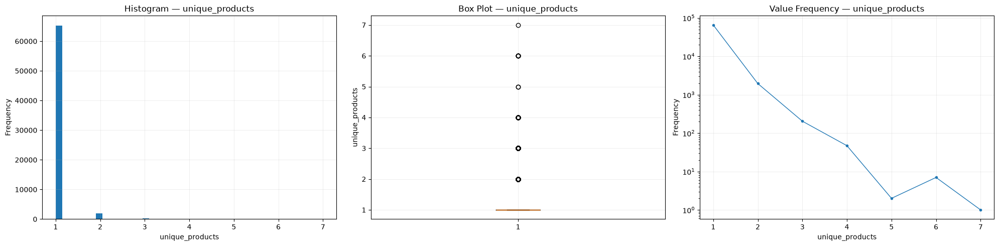

/tmp/ipykernel_829/3332029811.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


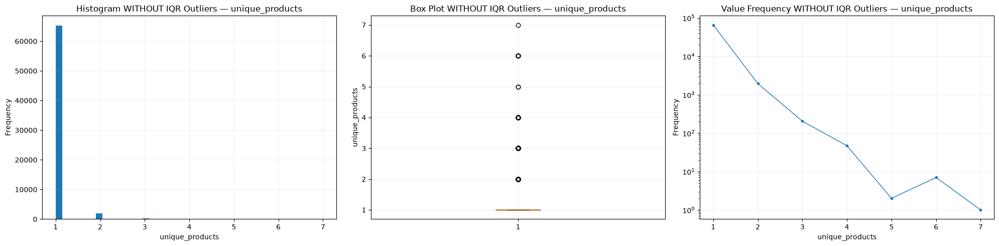


CORRELATION WITH: unique_products


,feature,pearson,spearman
4,seller_count,0.563,0.586
3,item_count,0.457,0.550
15,unique_seller_states,0.354,0.370
17,unique_category_count,0.235,0.246
10,total_freight,0.208,0.216
28,total_product_photos,0.192,0.166
23,total_volume_cm3,0.098,0.084
11,min_freight,-0.080,-0.137
18,total_weight_g,0.075,0.094
37,total_payment,0.073,0.128



unique_products vs TARGET
Pearson correlation: -0.0216

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: unique_products


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
4,seller_count,0.563,0.563,0.0,0.586,0.586,0.0
3,item_count,0.457,0.457,0.0,0.550,0.550,0.0
15,unique_seller_states,0.354,0.354,0.0,0.370,0.370,0.0
17,unique_category_count,0.235,0.235,0.0,0.246,0.246,0.0
10,total_freight,0.208,0.208,0.0,0.216,0.216,0.0
28,total_product_photos,0.192,0.192,0.0,0.166,0.166,0.0
23,total_volume_cm3,0.098,0.098,0.0,0.084,0.084,0.0
11,min_freight,-0.080,-0.080,0.0,-0.137,-0.137,0.0
18,total_weight_g,0.075,0.075,0.0,0.094,0.094,0.0
37,total_payment,0.073,0.073,0.0,0.128,0.128,0.0



unique_products vs TARGET
Pearson with all values:       -0.0216
Pearson without IQR outliers:  -0.0216
Change:                         0.0000

unique_products vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
unique_products,,,
1.0,65323,5971,9.14
2.0,1949,116,5.95
3.0,204,9,4.41
4.0,47,1,2.13
5.0,2,0,0.00
6.0,7,0,0.00
7.0,1,0,0.00



unique_products DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,1.039,1.0,0.227,1.0,7.0
1,6097,1.022,1.0,0.161,1.0,4.0


In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "unique_products"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

In [134]:
# ================================================================
# UNIQUE_PRODUCTS — FULL EDA + CAP4 + PRICE/FREIGHT CLEANING
# ================================================================

col = "unique_products"

# ================================================================
# 1. DELAY DISTRIBUTION AT EACH UNIQUE VALUE
# ================================================================

summary = (
    train.groupby(col)
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

summary["delayed_rate"] *= 100

print("=" * 80)
print("DELAY DISTRIBUTION BY UNIQUE_PRODUCTS")
print("=" * 80)
print(summary.to_string(index=False))


# ================================================================
# 2. ORIGINAL CORRELATION
# ================================================================

print("\n" + "=" * 80)
print("ORIGINAL CORRELATION")
print("=" * 80)

print(f"Pearson  delayed    : {train[col].corr(train['delayed'], method='pearson'):.5f}")
print(f"Spearman delayed    : {train[col].corr(train['delayed'], method='spearman'):.5f}")
print(f"Pearson  delay_days : {train[col].corr(train['delay_days'], method='pearson'):.5f}")
print(f"Spearman delay_days : {train[col].corr(train['delay_days'], method='spearman'):.5f}")


# ================================================================
# 3. CAP > 4 → 4
# ================================================================

train["unique_products_cap4"] = train[col].clip(upper=4)

changed = (train[col] != train["unique_products_cap4"]).sum()

print("\n" + "=" * 80)
print("AFTER unique_products > 4 → 4")
print("=" * 80)

print(f"Values changed: {changed}")

print(
    f"Pearson  delayed    : "
    f"{train['unique_products_cap4'].corr(train['delayed'], method='pearson'):.5f}"
)
print(
    f"Spearman delayed    : "
    f"{train['unique_products_cap4'].corr(train['delayed'], method='spearman'):.5f}"
)
print(
    f"Pearson  delay_days : "
    f"{train['unique_products_cap4'].corr(train['delay_days'], method='pearson'):.5f}"
)
print(
    f"Spearman delay_days : "
    f"{train['unique_products_cap4'].corr(train['delay_days'], method='spearman'):.5f}"
)


# ================================================================
# 4. DELAY DISTRIBUTION AFTER CAP4
# ================================================================

summary_cap4 = (
    train.groupby("unique_products_cap4")
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

summary_cap4["delayed_rate"] *= 100

print("\n" + "=" * 80)
print("DELAY DISTRIBUTION AFTER CAP4")
print("=" * 80)
print(summary_cap4.to_string(index=False))


# ================================================================
# 5. SELECTIVE OUTLIER REMOVAL
#    Remove outliers ONLY when delayed == 0
# ================================================================

price_freight = [
    "total_price",
    "min_price",
    "total_freight",
    "min_freight"
]

data = train.copy()

remove_mask = pd.Series(False, index=data.index)

print("\n" + "=" * 80)
print("SELECTIVE OUTLIER REMOVAL")
print("=" * 80)

for feature in price_freight:

    q1 = data[feature].quantile(0.25)
    q3 = data[feature].quantile(0.75)

    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (data[feature] < lower) | (data[feature] > upper)

    non_delayed_outlier = outlier & (data["delayed"] == 0)

    remove_mask |= non_delayed_outlier

    print(
        f"{feature:<16} | "
        f"Outliers: {outlier.sum():,} | "
        f"Non-delayed: {non_delayed_outlier.sum():,}"
    )

clean = data.loc[~remove_mask].copy()

print("\n" + "-" * 80)
print(f"Original rows : {len(data):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean):,}")


# ================================================================
# 6. UNIQUE_PRODUCTS CORRELATION AFTER CLEANING
# ================================================================

print("\n" + "=" * 80)
print("UNIQUE_PRODUCTS CORRELATION AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

print(
    f"Original unique_products | delayed    : "
    f"{data[col].corr(data['delayed']):.5f}"
)

print(
    f"Cleaned unique_products  | delayed    : "
    f"{clean[col].corr(clean['delayed']):.5f}"
)

print(
    f"Original unique_products | delay_days : "
    f"{data[col].corr(data['delay_days']):.5f}"
)

print(
    f"Cleaned unique_products  | delay_days : "
    f"{clean[col].corr(clean['delay_days']):.5f}"
)


# ================================================================
# 7. CAP4 AFTER PRICE + FREIGHT CLEANING
# ================================================================

print("\n" + "=" * 80)
print("UNIQUE_PRODUCTS CAP4 AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

clean["unique_products_cap4"] = clean[col].clip(upper=4)

print(
    f"CAP4 | delayed    : "
    f"{clean['unique_products_cap4'].corr(clean['delayed']):.5f}"
)

print(
    f"CAP4 | delay_days : "
    f"{clean['unique_products_cap4'].corr(clean['delay_days']):.5f}"
)


# ================================================================
# 8. FINAL SEQUENTIAL COMPARISON
# ================================================================

print("\n" + "=" * 80)
print("FINAL SEQUENTIAL COMPARISON")
print("=" * 80)

print(f"\n{'':30} {'delayed':>12} {'delay_days':>15}")
print("-" * 60)

print(
    f"{'Original unique_products':<30} "
    f"{data[col].corr(data['delayed']):>12.5f} "
    f"{data[col].corr(data['delay_days']):>15.5f}"
)

print(
    f"{'Cap >4 → 4':<30} "
    f"{train['unique_products_cap4'].corr(train['delayed']):>12.5f} "
    f"{train['unique_products_cap4'].corr(train['delay_days']):>15.5f}"
)

print(
    f"{'After P+F cleaning':<30} "
    f"{clean[col].corr(clean['delayed']):>12.5f} "
    f"{clean[col].corr(clean['delay_days']):>15.5f}"
)

print(
    f"{'Cap4 + P+F cleaning':<30} "
    f"{clean['unique_products_cap4'].corr(clean['delayed']):>12.5f} "
    f"{clean['unique_products_cap4'].corr(clean['delay_days']):>15.5f}"
)

DELAY DISTRIBUTION BY UNIQUE_PRODUCTS
 unique_products  orders  delayed_orders  delayed_rate  avg_delay_days  median_delay_days
             1.0   65323            5971      9.140731      -10.695480         -11.558299
             2.0    1949             116      5.951770      -12.782585         -13.203530
             3.0     204               9      4.411765      -14.886114         -14.084965
             4.0      47               1      2.127660      -15.055830         -14.296875
             5.0       2               0      0.000000      -21.371591         -21.371591
             6.0       7               0      0.000000      -19.145845         -16.314664
             7.0       1               0      0.000000       -5.383970          -5.383970

ORIGINAL CORRELATION
Pearson  delayed    : -0.02161
Spearman delayed    : -0.02140
Pearson  delay_days : -0.04159
Spearman delay_days : -0.04670

AFTER unique_products > 4 → 4
Values changed: 10
Pearson  delayed    : -0.02171
Spearman delaye

In [135]:
# ================================================================
# UNIQUE_PRODUCTS >= 4 — REMOVE AND COMPARE
# ================================================================

col = "unique_products"

# ================================================================
# 1. ORIGINAL
# ================================================================

print("=" * 80)
print("ORIGINAL")
print("=" * 80)

print(f"Rows: {len(train):,}")
print(f"unique_products >= 4: {(train[col] >= 4).sum():,}")

print(f"\nPearson  delayed    : {train[col].corr(train['delayed']):.5f}")
print(f"Spearman delayed    : {train[col].corr(train['delayed'], method='spearman'):.5f}")
print(f"Pearson  delay_days : {train[col].corr(train['delay_days']):.5f}")
print(f"Spearman delay_days : {train[col].corr(train['delay_days'], method='spearman'):.5f}")


# ================================================================
# 2. REMOVE unique_products >= 4
# ================================================================

clean_up = train.loc[train[col] < 4].copy()

removed = len(train) - len(clean_up)

print("\n" + "=" * 80)
print("AFTER REMOVING unique_products >= 4")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {removed:,}")
print(f"Remaining     : {len(clean_up):,}")
print(f"Removed %     : {removed / len(train) * 100:.3f}%")


# ================================================================
# 3. CORRELATION AFTER REMOVAL
# ================================================================

print("\n" + "=" * 80)
print("CORRELATION AFTER REMOVAL")
print("=" * 80)

print(f"Pearson  delayed    : {clean_up[col].corr(clean_up['delayed']):.5f}")
print(f"Spearman delayed    : {clean_up[col].corr(clean_up['delayed'], method='spearman'):.5f}")
print(f"Pearson  delay_days : {clean_up[col].corr(clean_up['delay_days']):.5f}")
print(f"Spearman delay_days : {clean_up[col].corr(clean_up['delay_days'], method='spearman'):.5f}")


# ================================================================
# 4. DELAY DISTRIBUTION AFTER REMOVAL
# ================================================================

summary_clean = (
    clean_up.groupby(col)
    .agg(
        orders=("order_id", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

summary_clean["delayed_rate"] *= 100

print("\n" + "=" * 80)
print("DELAY DISTRIBUTION AFTER REMOVAL")
print("=" * 80)

print(summary_clean.to_string(index=False))


# ================================================================
# 5. FINAL COMPARISON
# ================================================================

print("\n" + "=" * 80)
print("FINAL COMPARISON")
print("=" * 80)

print(f"\n{'':30} {'delayed':>12} {'delay_days':>15}")
print("-" * 60)

print(
    f"{'Original':<30} "
    f"{train[col].corr(train['delayed']):>12.5f} "
    f"{train[col].corr(train['delay_days']):>15.5f}"
)

print(
    f"{'Remove >=4':<30} "
    f"{clean_up[col].corr(clean_up['delayed']):>12.5f} "
    f"{clean_up[col].corr(clean_up['delay_days']):>15.5f}"
)

ORIGINAL
Rows: 67,533
unique_products >= 4: 57

Pearson  delayed    : -0.02161
Spearman delayed    : -0.02140
Pearson  delay_days : -0.04159
Spearman delay_days : -0.04670

AFTER REMOVING unique_products >= 4
Original rows : 67,533
Removed rows  : 57
Remaining     : 67,476
Removed %     : 0.084%

CORRELATION AFTER REMOVAL
Pearson  delayed    : -0.02047
Spearman delayed    : -0.02047
Pearson  delay_days : -0.03974
Spearman delay_days : -0.04509

DELAY DISTRIBUTION AFTER REMOVAL
 unique_products  orders  delayed_orders  delayed_rate  avg_delay_days  median_delay_days
             1.0   65323            5971      9.140731      -10.695480         -11.558299
             2.0    1949             116      5.951770      -12.782585         -13.203530
             3.0     204               9      4.411765      -14.886114         -14.084965

FINAL COMPARISON

                                    delayed      delay_days
------------------------------------------------------------
Original          

### unique category

DISTRIBUTION ANALYSIS — unique_category_count

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       4

--- STATISTICS WITH ALL VALUES ---
Mean:                0.989
Median:              1.000
Std:                 0.156
Min:                 0.000
Q1:                  1.000
Q3:                  1.000
Max:                 3.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,533
Mean:                0.989
Median:              1.000
Std:                 0.156
Min:                 0.000
Q1:                  1.000
Q3:                  1.000
Max:                 3.000

--- MOST FREQUENT VALUES ---


,frequency
unique_category_count,
1.0,65890
0.0,1197
2.0,440
3.0,6


/tmp/ipykernel_829/1199735119.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


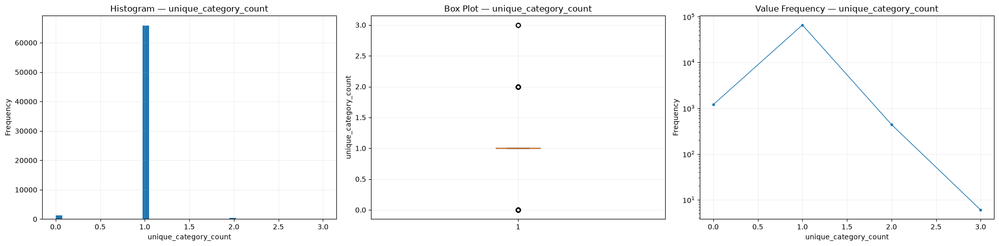

/tmp/ipykernel_829/1199735119.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


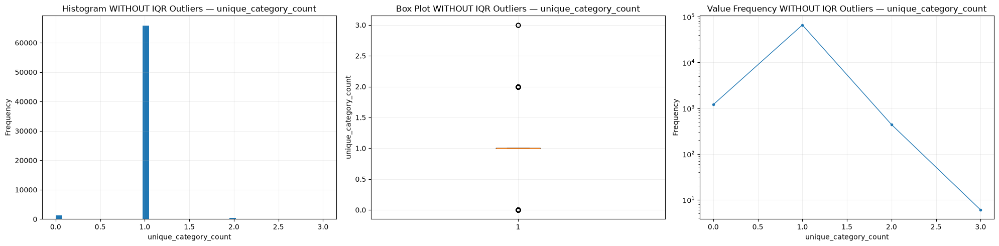


CORRELATION WITH: unique_category_count


,feature,pearson,spearman
5,seller_count,0.304,0.298
4,unique_products,0.235,0.246
16,unique_seller_states,0.196,0.193
28,total_product_photos,0.176,0.248
3,item_count,0.109,0.137
11,total_freight,0.067,0.083
23,total_volume_cm3,0.048,0.078
31,seller_lng,-0.041,-0.060
13,max_freight,0.040,0.058
18,total_weight_g,0.039,0.059



unique_category_count vs TARGET
Pearson correlation: -0.0118

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: unique_category_count


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
5,seller_count,0.304,0.304,0.0,0.298,0.298,0.0
4,unique_products,0.235,0.235,0.0,0.246,0.246,0.0
16,unique_seller_states,0.196,0.196,0.0,0.193,0.193,0.0
28,total_product_photos,0.176,0.176,0.0,0.248,0.248,0.0
3,item_count,0.109,0.109,0.0,0.137,0.137,0.0
11,total_freight,0.067,0.067,0.0,0.083,0.083,0.0
23,total_volume_cm3,0.048,0.048,0.0,0.078,0.078,0.0
31,seller_lng,-0.041,-0.041,0.0,-0.060,-0.060,0.0
13,max_freight,0.040,0.040,0.0,0.058,0.058,0.0
18,total_weight_g,0.039,0.039,0.0,0.059,0.059,0.0



unique_category_count vs TARGET
Pearson with all values:       -0.0118
Pearson without IQR outliers:  -0.0118
Change:                         0.0000

unique_category_count vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
unique_category_count,,,
0.0,1197,114,9.52
1.0,65890,5972,9.06
2.0,440,11,2.50
3.0,6,0,0.00



unique_category_count DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,0.990,1.0,0.158,0.0,3.0
1,6097,0.983,1.0,0.142,0.0,2.0


In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "unique_category_count"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

### item weight

SUMMARY
                   count  missing  missing_%  unique     mean    50%      std  \
total_weight_g   67533.0        0       0.00    2389  2465.22  800.0  4909.09   
min_weight_g     67517.0       16       0.02    1812  2152.68  700.0  3856.86   
max_weight_g     67517.0       16       0.02    1816  2191.86  700.0  3894.88   
mean_weight_g    67517.0       16       0.02    2272  2171.51  700.0  3866.28   
median_weight_g  67517.0       16       0.02    2087  2170.33  700.0  3867.08   

                 min       max  outliers  outlier_%  
total_weight_g   0.0  184400.0      9508      14.08  
min_weight_g     2.0   40425.0      9677      14.33  
max_weight_g     2.0   40425.0      9814      14.53  
mean_weight_g    2.0   40425.0      9768      14.46  
median_weight_g  2.0   40425.0      9757      14.45  

CORRELATION WITH DELAYED
min_weight_g       0.027
median_weight_g    0.026
mean_weight_g      0.026
max_weight_g       0.025
total_weight_g     0.019
Name: delayed, dtype: float64


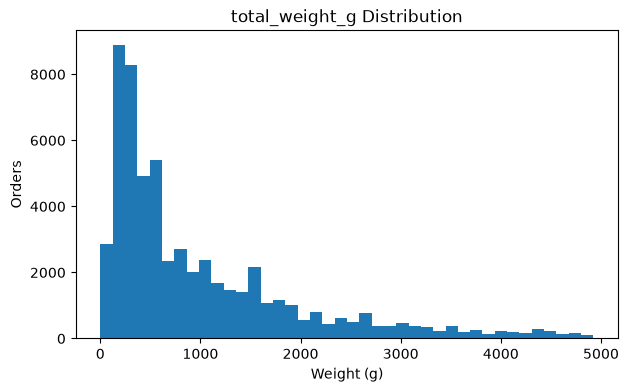

/tmp/ipykernel_829/2439834780.py:83: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


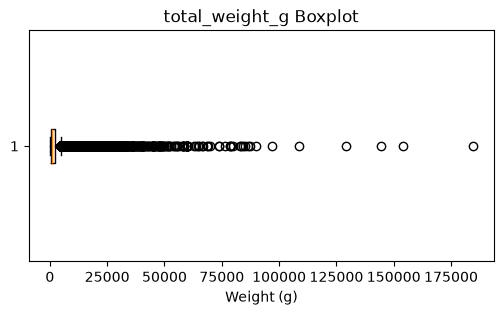

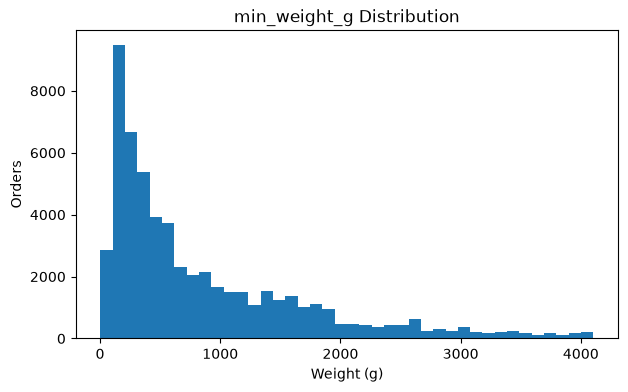

/tmp/ipykernel_829/2439834780.py:83: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


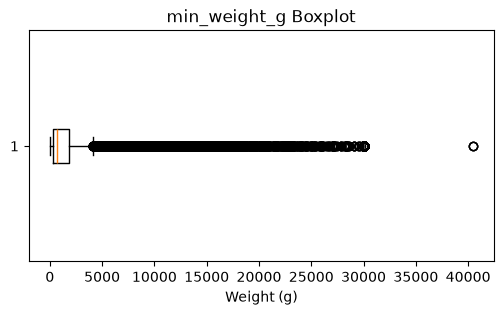

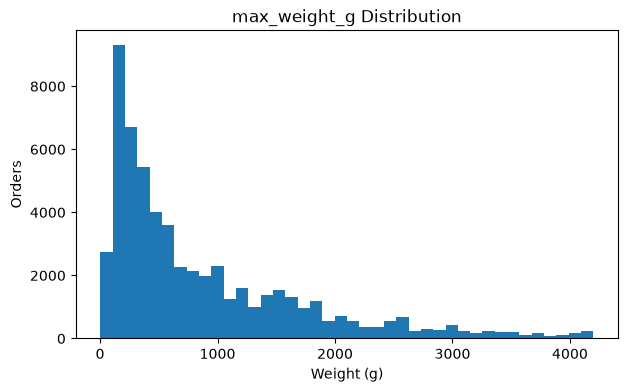

/tmp/ipykernel_829/2439834780.py:83: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


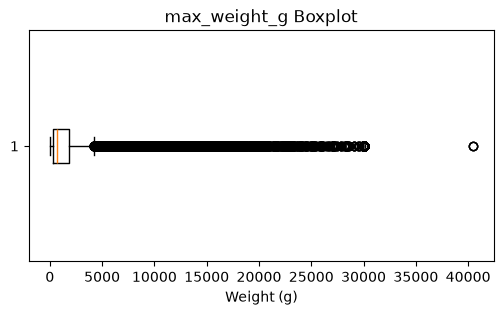

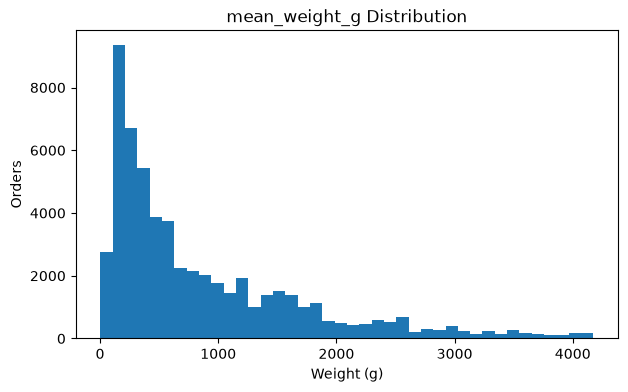

/tmp/ipykernel_829/2439834780.py:83: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


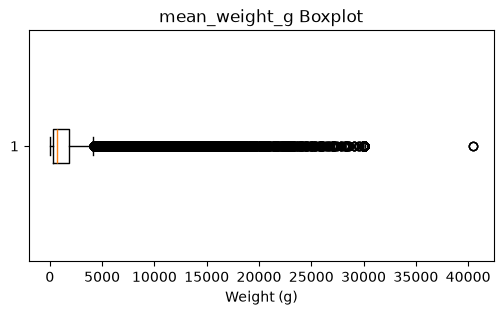

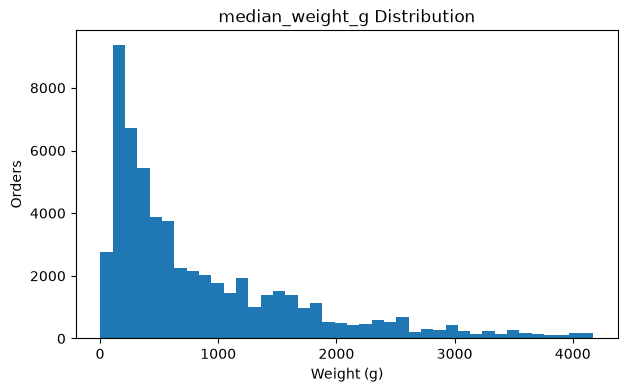

/tmp/ipykernel_829/2439834780.py:83: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


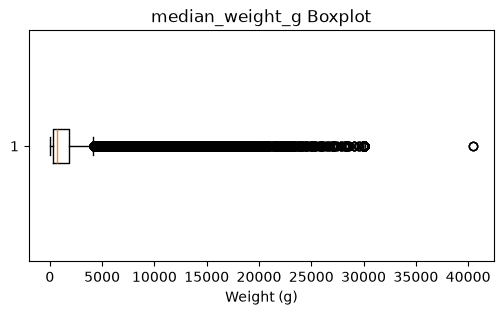

In [83]:
weight_cols = [
    "total_weight_g",
    "min_weight_g",
    "max_weight_g",
    "mean_weight_g",
    "median_weight_g"
]

target = "delayed"

# ============================================================
# WEIGHT EDA
# ============================================================

# 1. Summary + Missing + Outliers
summary = train[weight_cols].describe().T
summary["missing"] = train[weight_cols].isna().sum()
summary["missing_%"] = train[weight_cols].isna().mean() * 100
summary["unique"] = train[weight_cols].nunique()
summary["outliers"] = 0
summary["outlier_%"] = 0.0

for col in weight_cols:
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    outliers = (
        (train[col] < q1 - 1.5 * iqr) |
        (train[col] > q3 + 1.5 * iqr)
    )
    summary.loc[col, "outliers"] = outliers.sum()
    summary.loc[col, "outlier_%"] = outliers.mean() * 100

print("=" * 70)
print("SUMMARY")
print("=" * 70)
print(summary[
    ["count", "missing", "missing_%", "unique",
     "mean", "50%", "std", "min", "max",
     "outliers", "outlier_%"]
].round(2))


# 2. Correlation with target
print("\n" + "=" * 70)
print("CORRELATION WITH DELAYED")
print("=" * 70)

corr = train[weight_cols + [target]].corr()[target].drop(target)
print(corr.sort_values(ascending=False).round(3))


# 3. Weight by delayed status
print("\n" + "=" * 70)
print("WEIGHT BY DELAY STATUS")
print("=" * 70)

comparison = train.groupby(target)[weight_cols].agg(["count", "mean", "median"])
print(comparison.round(2))


# 4. Distribution + Boxplot
for col in weight_cols:

    # Remove outliers only for histogram
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    clean = train[col][
        (train[col] >= q1 - 1.5 * iqr) &
        (train[col] <= q3 + 1.5 * iqr)
    ].dropna()

    # Distribution
    plt.figure(figsize=(7, 4))
    plt.hist(clean, bins=40)
    plt.title(f"{col} Distribution")
    plt.xlabel("Weight (g)")
    plt.ylabel("Orders")
    plt.show()

    # Boxplot — keep outliers
    plt.figure(figsize=(6, 3))
    plt.boxplot(train[col].dropna(), vert=False)
    plt.title(f"{col} Boxplot")
    plt.xlabel("Weight (g)")
    plt.show()

In [136]:
# ================================================================
# WEIGHT — OUTLIERS BEFORE / AFTER
# REMOVE NON-DELAYED OUTLIERS FROM 3 FEATURES
# ================================================================

weight_cols = [
    "min_weight_g",
    "mean_weight_g",
    "total_weight_g"
]

# ================================================================
# 1. ORIGINAL CORRELATION
# ================================================================

print("=" * 80)
print("ORIGINAL CORRELATION WITH TARGET")
print("=" * 80)

for col in weight_cols:
    print(
        f"{col:<18} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.5f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.5f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.5f}"
    )


# ================================================================
# 2. OUTLIER COUNTS
# ================================================================

print("\n" + "=" * 80)
print("OUTLIER ANALYSIS")
print("=" * 80)

remove_mask = pd.Series(False, index=train.index)

for col in weight_cols:

    q1 = train[col].quantile(0.25)
    q3 = train[col].quantile(0.75)

    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (train[col] < lower) | (train[col] > upper)

    non_delayed_outlier = outlier & (train["delayed"] == 0)

    remove_mask |= non_delayed_outlier

    print(
        f"\n{col}"
        f"\n  Q1                 : {q1:.3f}"
        f"\n  Q3                 : {q3:.3f}"
        f"\n  Lower bound        : {lower:.3f}"
        f"\n  Upper bound        : {upper:.3f}"
        f"\n  Total outliers     : {outlier.sum():,}"
        f"\n  Delayed outliers   : {(outlier & (train['delayed'] == 1)).sum():,}"
        f"\n  Non-delayed outliers: {non_delayed_outlier.sum():,}"
    )


# ================================================================
# 3. CREATE CLEAN DATASET
# ================================================================

clean_weight = train.loc[~remove_mask].copy()

print("\n" + "=" * 80)
print("DATASET SIZE")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean_weight):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.3f}%")


# ================================================================
# 4. CORRELATION AFTER REMOVING NON-DELAYED OUTLIERS
# ================================================================

print("\n" + "=" * 80)
print("CORRELATION AFTER REMOVING NON-DELAYED OUTLIERS")
print("=" * 80)

for col in weight_cols:
    print(
        f"{col:<18} | "
        f"Pearson delayed: {clean_weight[col].corr(clean_weight['delayed']):.5f} | "
        f"Spearman delayed: {clean_weight[col].corr(clean_weight['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {clean_weight[col].corr(clean_weight['delay_days']):.5f} | "
        f"Spearman delay_days: {clean_weight[col].corr(clean_weight['delay_days'], method='spearman'):.5f}"
    )


# ================================================================
# 5. BEFORE vs AFTER — COMPACT COMPARISON
# ================================================================

print("\n" + "=" * 80)
print("BEFORE vs AFTER")
print("=" * 80)

for col in weight_cols:

    p_before_d = train[col].corr(train["delayed"])
    p_after_d = clean_weight[col].corr(clean_weight["delayed"])

    s_before_d = train[col].corr(train["delayed"], method="spearman")
    s_after_d = clean_weight[col].corr(clean_weight["delayed"], method="spearman")

    p_before_days = train[col].corr(train["delay_days"])
    p_after_days = clean_weight[col].corr(clean_weight["delay_days"])

    s_before_days = train[col].corr(train["delay_days"], method="spearman")
    s_after_days = clean_weight[col].corr(clean_weight["delay_days"], method="spearman")

    print(f"\n{col}")
    print("-" * 70)
    print(f"{'':22} {'Before':>12} {'After':>12} {'Change':>12}")
    print(
        f"{'Pearson delayed':<22} "
        f"{p_before_d:>12.5f} "
        f"{p_after_d:>12.5f} "
        f"{p_after_d - p_before_d:>12.5f}"
    )
    print(
        f"{'Spearman delayed':<22} "
        f"{s_before_d:>12.5f} "
        f"{s_after_d:>12.5f} "
        f"{s_after_d - s_before_d:>12.5f}"
    )
    print(
        f"{'Pearson delay_days':<22} "
        f"{p_before_days:>12.5f} "
        f"{p_after_days:>12.5f} "
        f"{p_after_days - p_before_days:>12.5f}"
    )
    print(
        f"{'Spearman delay_days':<22} "
        f"{s_before_days:>12.5f} "
        f"{s_after_days:>12.5f} "
        f"{s_after_days - s_before_days:>12.5f}"
    )


# ================================================================
# 6. DELAY RATE BY WEIGHT QUARTILES — BEFORE
# ================================================================

print("\n" + "=" * 80)
print("DELAY RATE BY WEIGHT QUARTILES — BEFORE")
print("=" * 80)

for col in weight_cols:

    temp = train[[col, "delayed", "delay_days"]].dropna().copy()
    temp["quartile"] = pd.qcut(
        temp[col],
        q=4,
        duplicates="drop"
    )

    result = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .reset_index()
    )

    result["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    print(result.to_string(index=False))


# ================================================================
# 7. DELAY RATE BY WEIGHT QUARTILES — AFTER
# ================================================================

print("\n" + "=" * 80)
print("DELAY RATE BY WEIGHT QUARTILES — AFTER CLEANING")
print("=" * 80)

for col in weight_cols:

    temp = clean_weight[[col, "delayed", "delay_days"]].dropna().copy()
    temp["quartile"] = pd.qcut(
        temp[col],
        q=4,
        duplicates="drop"
    )

    result = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .reset_index()
    )

    result["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    print(result.to_string(index=False))

ORIGINAL CORRELATION WITH TARGET
min_weight_g       | Pearson delayed: 0.02657 | Spearman delayed: 0.02217 | Pearson delay_days: 0.01890 | Spearman delay_days: 0.00483
mean_weight_g      | Pearson delayed: 0.02567 | Spearman delayed: 0.02046 | Pearson delay_days: 0.01727 | Spearman delay_days: 0.00049
total_weight_g     | Pearson delayed: 0.01940 | Spearman delayed: 0.01678 | Pearson delay_days: 0.00961 | Spearman delay_days: -0.00512

OUTLIER ANALYSIS

min_weight_g
  Q1                 : 300.000
  Q3                 : 1825.000
  Lower bound        : -1987.500
  Upper bound        : 4112.500
  Total outliers     : 9,677
  Delayed outliers   : 983
  Non-delayed outliers: 8,694

mean_weight_g
  Q1                 : 300.000
  Q3                 : 1850.000
  Lower bound        : -2025.000
  Upper bound        : 4175.000
  Total outliers     : 9,768
  Delayed outliers   : 984
  Non-delayed outliers: 8,784

total_weight_g
  Q1                 : 300.000
  Q3                 : 2150.000
  Lower

In [137]:
# ================================================================
# REMOVE NON-DELAYED OUTLIERS FROM
# WEIGHT + PRICE + FREIGHT
# ================================================================

cols = [
    "min_weight_g",
    "mean_weight_g",
    "total_weight_g",
    "total_price",
    "min_price",
    "total_freight",
    "min_freight"
]

remove_mask = pd.Series(False, index=train.index)

print("=" * 80)
print("OUTLIER ANALYSIS — WEIGHT + PRICE + FREIGHT")
print("=" * 80)

for col in cols:

    q1 = train[col].quantile(0.25)
    q3 = train[col].quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (train[col] < lower) | (train[col] > upper)

    delayed_outlier = outlier & (train["delayed"] == 1)
    non_delayed_outlier = outlier & (train["delayed"] == 0)

    remove_mask |= non_delayed_outlier

    print(
        f"{col:<18} | "
        f"Outliers: {outlier.sum():,} | "
        f"Delayed: {delayed_outlier.sum():,} | "
        f"Non-delayed: {non_delayed_outlier.sum():,}"
    )


# ================================================================
# CLEAN DATA
# ================================================================

clean_all = train.loc[~remove_mask].copy()

print("\n" + "-" * 80)
print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean_all):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.3f}%")


# ================================================================
# CORRELATION BEFORE vs AFTER
# ================================================================

print("\n" + "=" * 80)
print("CORRELATION — BEFORE vs AFTER")
print("=" * 80)

for col in cols:

    print(f"\n{col}")
    print("-" * 70)

    print(
        f"Pearson delayed    : "
        f"{train[col].corr(train['delayed']):.5f} → "
        f"{clean_all[col].corr(clean_all['delayed']):.5f}"
    )

    print(
        f"Spearman delayed   : "
        f"{train[col].corr(train['delayed'], method='spearman'):.5f} → "
        f"{clean_all[col].corr(clean_all['delayed'], method='spearman'):.5f}"
    )

    print(
        f"Pearson delay_days : "
        f"{train[col].corr(train['delay_days']):.5f} → "
        f"{clean_all[col].corr(clean_all['delay_days']):.5f}"
    )

    print(
        f"Spearman delay_days: "
        f"{train[col].corr(train['delay_days'], method='spearman'):.5f} → "
        f"{clean_all[col].corr(clean_all['delay_days'], method='spearman'):.5f}"
    )


# ================================================================
# TARGET DISTRIBUTION BEFORE vs AFTER
# ================================================================

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION")
print("=" * 80)

print("\nBEFORE:")
print(f"Rows          : {len(train):,}")
print(f"Delayed       : {train['delayed'].sum():,}")
print(f"Delayed rate  : {train['delayed'].mean() * 100:.3f}%")
print(f"Mean delay    : {train['delay_days'].mean():.3f}")

print("\nAFTER:")
print(f"Rows          : {len(clean_all):,}")
print(f"Delayed       : {clean_all['delayed'].sum():,}")
print(f"Delayed rate  : {clean_all['delayed'].mean() * 100:.3f}%")
print(f"Mean delay    : {clean_all['delay_days'].mean():.3f}")

OUTLIER ANALYSIS — WEIGHT + PRICE + FREIGHT
min_weight_g       | Outliers: 9,677 | Delayed: 983 | Non-delayed: 8,694
mean_weight_g      | Outliers: 9,768 | Delayed: 984 | Non-delayed: 8,784
total_weight_g     | Outliers: 9,508 | Delayed: 957 | Non-delayed: 8,551
total_price        | Outliers: 5,361 | Delayed: 573 | Non-delayed: 4,788
min_price          | Outliers: 5,032 | Delayed: 578 | Non-delayed: 4,454
total_freight      | Outliers: 6,629 | Delayed: 799 | Non-delayed: 5,830
min_freight        | Outliers: 7,347 | Delayed: 935 | Non-delayed: 6,412

--------------------------------------------------------------------------------
Original rows : 67,533
Removed rows  : 15,626
Remaining     : 51,907
Removed %     : 23.138%

CORRELATION — BEFORE vs AFTER

min_weight_g
----------------------------------------------------------------------
Pearson delayed    : 0.02657 → 0.30263
Spearman delayed   : 0.02217 → 0.11969
Pearson delay_days : 0.01890 → 0.21452
Spearman delay_days: 0.00483 → 0.0613

### volume

SUMMARY
                     count  missing  missing_%  unique      mean     50%  \
total_volume_cm3   67533.0        0       0.00    5086  18083.26  7728.0   
min_volume_cm3     67517.0       16       0.02    3707  15714.88  6750.0   
max_volume_cm3     67517.0       16       0.02    3719  15977.19  6912.0   
mean_volume_cm3    67517.0       16       0.02    4650  15842.18  6859.0   
median_volume_cm3  67517.0       16       0.02    4408  15836.06  6851.0   

                        std    min        max  outliers  outlier_%  
total_volume_cm3   31438.20    0.0  1476000.0      6620       9.80  
min_volume_cm3     24108.85  288.0   294000.0      5964       8.83  
max_volume_cm3     24340.63  288.0   294000.0      5829       8.63  
mean_volume_cm3    24160.94  288.0   294000.0      5983       8.86  
median_volume_cm3  24164.19  288.0   294000.0      5984       8.86  

CORRELATION WITH DELAYED
min_volume_cm3       0.022
median_volume_cm3    0.021
mean_volume_cm3      0.021
max_volume_cm3

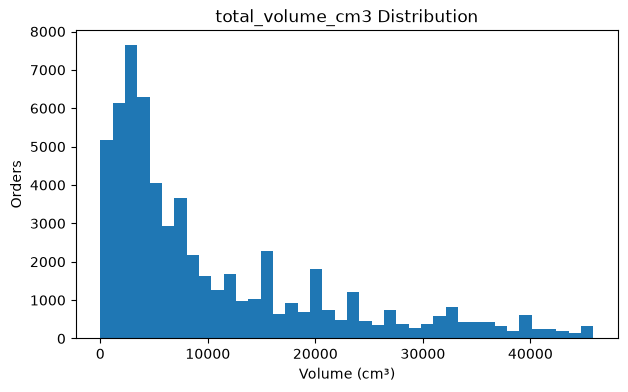

/tmp/ipykernel_829/3074015557.py:89: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


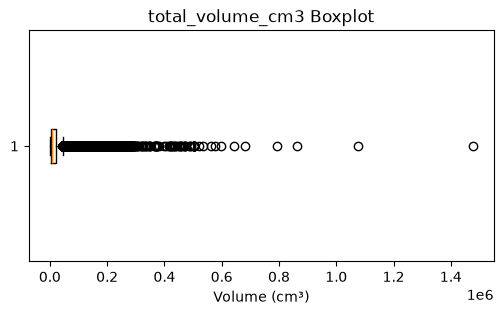

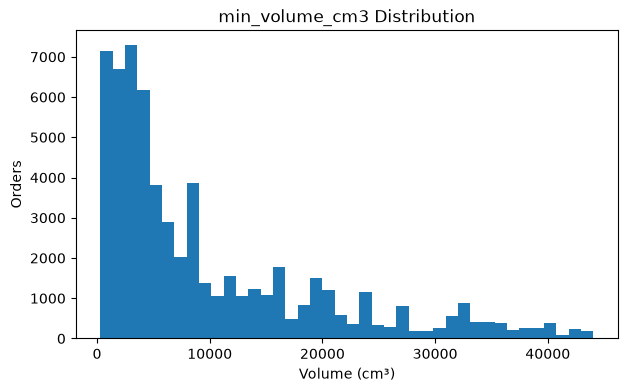

/tmp/ipykernel_829/3074015557.py:89: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


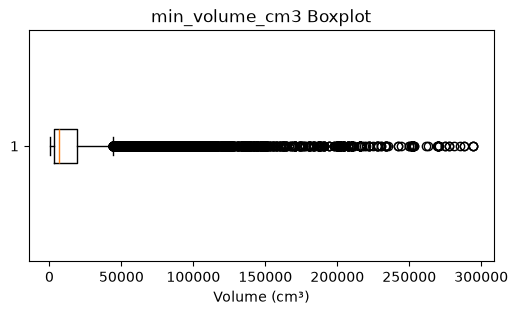

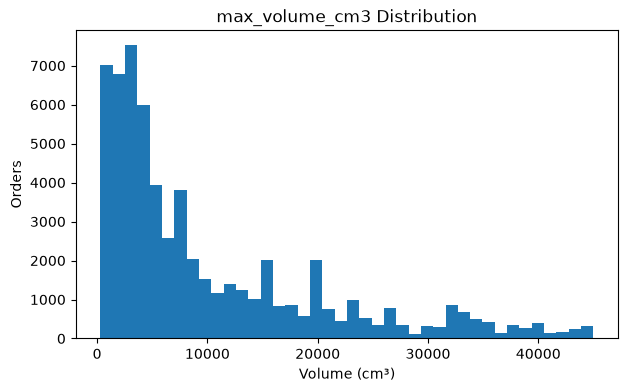

/tmp/ipykernel_829/3074015557.py:89: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


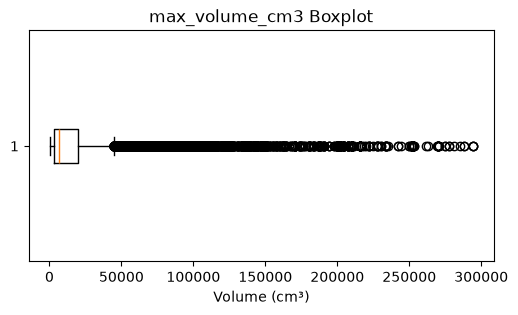

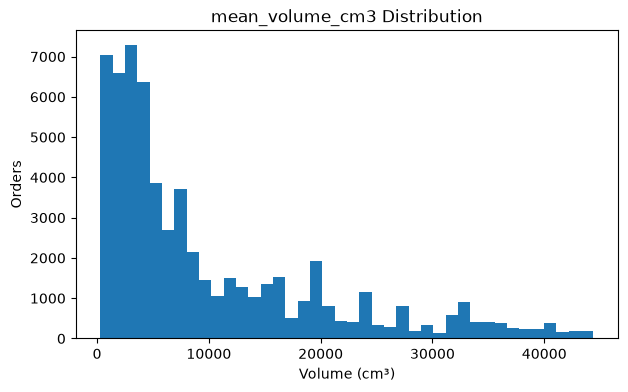

/tmp/ipykernel_829/3074015557.py:89: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


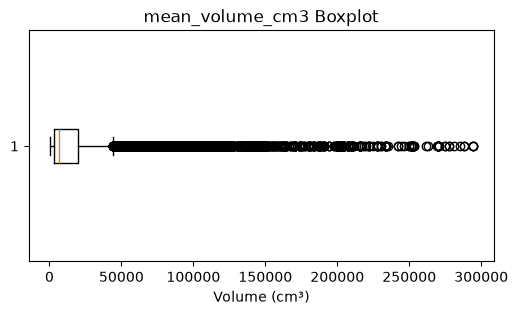

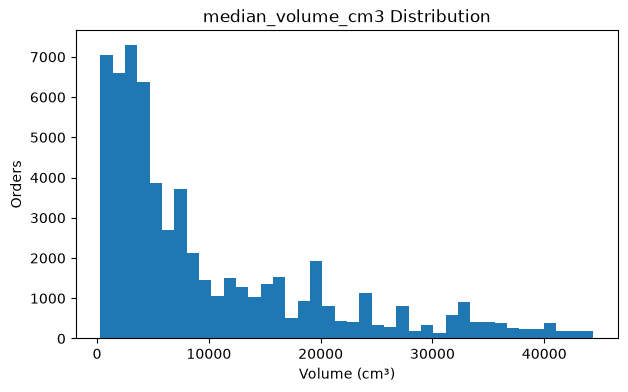

/tmp/ipykernel_829/3074015557.py:89: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


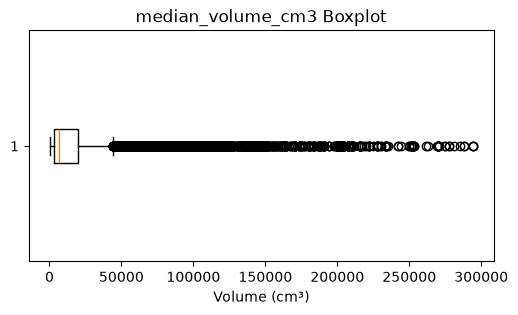

In [84]:
volume_cols = [
    "total_volume_cm3",
    "min_volume_cm3",
    "max_volume_cm3",
    "mean_volume_cm3",
    "median_volume_cm3"
]

target = "delayed"

# ============================================================
# VOLUME EDA
# ============================================================

summary = train[volume_cols].describe().T
summary["missing"] = train[volume_cols].isna().sum()
summary["missing_%"] = train[volume_cols].isna().mean() * 100
summary["unique"] = train[volume_cols].nunique()
summary["outliers"] = 0
summary["outlier_%"] = 0.0

for col in volume_cols:
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    outliers = (
        (train[col] < q1 - 1.5 * iqr) |
        (train[col] > q3 + 1.5 * iqr)
    )

    summary.loc[col, "outliers"] = outliers.sum()
    summary.loc[col, "outlier_%"] = outliers.mean() * 100

# 1. Summary
print("=" * 70)
print("SUMMARY")
print("=" * 70)

print(summary[
    ["count", "missing", "missing_%", "unique",
     "mean", "50%", "std", "min", "max",
     "outliers", "outlier_%"]
].round(2))


# 2. Correlation with target
print("\n" + "=" * 70)
print("CORRELATION WITH DELAYED")
print("=" * 70)

corr = train[volume_cols + [target]].corr()[target].drop(target)
print(corr.sort_values(ascending=False).round(3))


# 3. Volume by delayed status
print("\n" + "=" * 70)
print("VOLUME BY DELAY STATUS")
print("=" * 70)

comparison = train.groupby(target)[volume_cols].agg(
    ["count", "mean", "median"]
)

print(comparison.round(2))


# 4. Distributions + Boxplots
for col in volume_cols:

    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    # Remove outliers only for visualization
    clean = train[col][
        (train[col] >= q1 - 1.5 * iqr) &
        (train[col] <= q3 + 1.5 * iqr)
    ].dropna()

    # Distribution
    plt.figure(figsize=(7, 4))
    plt.hist(clean, bins=40)
    plt.title(f"{col} Distribution")
    plt.xlabel("Volume (cm³)")
    plt.ylabel("Orders")
    plt.show()

    # Boxplot — outliers retained
    plt.figure(figsize=(6, 3))
    plt.boxplot(train[col].dropna(), vert=False)
    plt.title(f"{col} Boxplot")
    plt.xlabel("Volume (cm³)")
    plt.show()

In [138]:
# ================================================================
# VOLUME — CORRELATION + OUTLIERS + BEFORE/AFTER
# ================================================================

volume_cols = [
    "total_volume_cm3",
    "min_volume_cm3",
    "max_volume_cm3",
    "mean_volume_cm3",
    "median_volume_cm3"
]


# ================================================================
# 1. ORIGINAL CORRELATION
# ================================================================

print("=" * 80)
print("ORIGINAL CORRELATION WITH TARGET")
print("=" * 80)

for col in volume_cols:
    print(
        f"{col:<20} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.5f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.5f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.5f}"
    )


# ================================================================
# 2. OUTLIER ANALYSIS
# ================================================================

print("\n" + "=" * 80)
print("OUTLIER ANALYSIS")
print("=" * 80)

remove_mask = pd.Series(False, index=train.index)

for col in volume_cols:

    q1 = train[col].quantile(0.25)
    q3 = train[col].quantile(0.75)

    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (train[col] < lower) | (train[col] > upper)

    delayed_outlier = outlier & (train["delayed"] == 1)
    non_delayed_outlier = outlier & (train["delayed"] == 0)

    # Remove ONLY non-delayed outliers
    remove_mask |= non_delayed_outlier

    print(
        f"\n{col}"
        f"\n  Q1                  : {q1:.3f}"
        f"\n  Q3                  : {q3:.3f}"
        f"\n  Lower bound         : {lower:.3f}"
        f"\n  Upper bound         : {upper:.3f}"
        f"\n  Total outliers      : {outlier.sum():,}"
        f"\n  Delayed outliers    : {delayed_outlier.sum():,}"
        f"\n  Non-delayed outliers: {non_delayed_outlier.sum():,}"
    )


# ================================================================
# 3. CLEAN DATASET
# ================================================================

clean_volume = train.loc[~remove_mask].copy()

print("\n" + "=" * 80)
print("DATASET SIZE")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean_volume):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.3f}%")


# ================================================================
# 4. CORRELATION AFTER REMOVING NON-DELAYED OUTLIERS
# ================================================================

print("\n" + "=" * 80)
print("CORRELATION AFTER REMOVING NON-DELAYED OUTLIERS")
print("=" * 80)

for col in volume_cols:
    print(
        f"{col:<20} | "
        f"Pearson delayed: {clean_volume[col].corr(clean_volume['delayed']):.5f} | "
        f"Spearman delayed: {clean_volume[col].corr(clean_volume['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {clean_volume[col].corr(clean_volume['delay_days']):.5f} | "
        f"Spearman delay_days: {clean_volume[col].corr(clean_volume['delay_days'], method='spearman'):.5f}"
    )


# ================================================================
# 5. BEFORE vs AFTER
# ================================================================

print("\n" + "=" * 80)
print("BEFORE vs AFTER")
print("=" * 80)

for col in volume_cols:

    p_before_d = train[col].corr(train["delayed"])
    p_after_d = clean_volume[col].corr(clean_volume["delayed"])

    s_before_d = train[col].corr(
        train["delayed"], method="spearman"
    )
    s_after_d = clean_volume[col].corr(
        clean_volume["delayed"], method="spearman"
    )

    p_before_days = train[col].corr(train["delay_days"])
    p_after_days = clean_volume[col].corr(clean_volume["delay_days"])

    s_before_days = train[col].corr(
        train["delay_days"], method="spearman"
    )
    s_after_days = clean_volume[col].corr(
        clean_volume["delay_days"], method="spearman"
    )

    print(f"\n{col}")
    print("-" * 70)

    print(
        f"{'':22} {'Before':>12} {'After':>12} {'Change':>12}"
    )

    print(
        f"{'Pearson delayed':<22} "
        f"{p_before_d:>12.5f} "
        f"{p_after_d:>12.5f} "
        f"{p_after_d - p_before_d:>12.5f}"
    )

    print(
        f"{'Spearman delayed':<22} "
        f"{s_before_d:>12.5f} "
        f"{s_after_d:>12.5f} "
        f"{s_after_d - s_before_d:>12.5f}"
    )

    print(
        f"{'Pearson delay_days':<22} "
        f"{p_before_days:>12.5f} "
        f"{p_after_days:>12.5f} "
        f"{p_after_days - p_before_days:>12.5f}"
    )

    print(
        f"{'Spearman delay_days':<22} "
        f"{s_before_days:>12.5f} "
        f"{s_after_days:>12.5f} "
        f"{s_after_days - s_before_days:>12.5f}"
    )


# ================================================================
# 6. TARGET DISTRIBUTION
# ================================================================

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION")
print("=" * 80)

print("\nBEFORE:")
print(f"Rows         : {len(train):,}")
print(f"Delayed      : {train['delayed'].sum():,}")
print(f"Delayed rate : {train['delayed'].mean() * 100:.3f}%")
print(f"Mean delay   : {train['delay_days'].mean():.3f}")

print("\nAFTER:")
print(f"Rows         : {len(clean_volume):,}")
print(f"Delayed      : {clean_volume['delayed'].sum():,}")
print(f"Delayed rate : {clean_volume['delayed'].mean() * 100:.3f}%")
print(f"Mean delay   : {clean_volume['delay_days'].mean():.3f}")


# ================================================================
# 7. DELAY RATE BY QUARTILES — BEFORE
# ================================================================

print("\n" + "=" * 80)
print("DELAY RATE BY VOLUME QUARTILES — BEFORE")
print("=" * 80)

for col in volume_cols:

    temp = train[[col, "delayed", "delay_days"]].dropna().copy()

    temp["quartile"] = pd.qcut(
        temp[col],
        q=4,
        duplicates="drop"
    )

    result = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .reset_index()
    )

    result["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    print(result.to_string(index=False))


# ================================================================
# 8. DELAY RATE BY QUARTILES — AFTER
# ================================================================

print("\n" + "=" * 80)
print("DELAY RATE BY VOLUME QUARTILES — AFTER CLEANING")
print("=" * 80)

for col in volume_cols:

    temp = clean_volume[[col, "delayed", "delay_days"]].dropna().copy()

    temp["quartile"] = pd.qcut(
        temp[col],
        q=4,
        duplicates="drop"
    )

    result = (
        temp.groupby("quartile", observed=True)
        .agg(
            orders=("delayed", "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .reset_index()
    )

    result["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    print(result.to_string(index=False))

ORIGINAL CORRELATION WITH TARGET
total_volume_cm3     | Pearson delayed: 0.01410 | Spearman delayed: 0.01011 | Pearson delay_days: 0.00590 | Spearman delay_days: -0.01160
min_volume_cm3       | Pearson delayed: 0.02248 | Spearman delayed: 0.01517 | Pearson delay_days: 0.01531 | Spearman delay_days: -0.00272
max_volume_cm3       | Pearson delayed: 0.02009 | Spearman delayed: 0.01281 | Pearson delay_days: 0.01221 | Spearman delay_days: -0.00812
mean_volume_cm3      | Pearson delayed: 0.02136 | Spearman delayed: 0.01360 | Pearson delay_days: 0.01388 | Spearman delay_days: -0.00628
median_volume_cm3    | Pearson delayed: 0.02140 | Spearman delayed: 0.01368 | Pearson delay_days: 0.01401 | Spearman delay_days: -0.00592

OUTLIER ANALYSIS

total_volume_cm3
  Q1                  : 3024.000
  Q3                  : 20160.000
  Lower bound         : -22680.000
  Upper bound         : 45864.000
  Total outliers      : 6,620
  Delayed outliers    : 686
  Non-delayed outliers: 5,934

min_volume_cm3
 

In [140]:
cols = [
    "total_price", "min_price",
    "total_freight", "min_freight",
    "min_weight_g",  "min_volume_cm3", 
]

remove_mask = pd.Series(False, index=train.index)

for col in cols:
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    outlier = (train[col] < q1 - 1.5 * iqr) | (train[col] > q3 + 1.5 * iqr)
    remove_mask |= outlier & (train["delayed"] == 0)

clean = train.loc[~remove_mask]

print(f"Rows: {len(train):,} → {len(clean):,}")
print(f"Removed: {remove_mask.sum():,} ({remove_mask.mean()*100:.2f}%)")

print("\nCORRELATION: BEFORE → AFTER")
for col in cols:
    p1 = train[col].corr(train["delayed"])
    p2 = clean[col].corr(clean["delayed"])
    d1 = train[col].corr(train["delay_days"])
    d2 = clean[col].corr(clean["delay_days"])

    print(f"{col:20} delayed: {p1:.4f} → {p2:.4f} | delay_days: {d1:.4f} → {d2:.4f}")

Rows: 67,533 → 51,234
Removed: 16,299 (24.13%)

CORRELATION: BEFORE → AFTER
total_price          delayed: 0.0213 → 0.2318 | delay_days: 0.0028 → 0.1598
min_price            delayed: 0.0279 → 0.2228 | delay_days: 0.0095 → 0.1549
total_freight        delayed: 0.0466 → 0.2886 | delay_days: -0.0133 → 0.1574
min_freight          delayed: 0.0713 → 0.3157 | delay_days: 0.0041 → 0.1727
min_weight_g         delayed: 0.0266 → 0.3074 | delay_days: 0.0189 → 0.2186
min_volume_cm3       delayed: 0.0225 → 0.2297 | delay_days: 0.0153 → 0.1636


In [141]:
cols = [
    "total_price", "min_price",
    "total_freight", "min_freight",
    "min_weight_g"
]

remove_mask = pd.Series(False, index=train.index)

for col in cols:
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    outlier = (train[col] < q1 - 1.5 * iqr) | (train[col] > q3 + 1.5 * iqr)
    remove_mask |= outlier & (train["delayed"] == 0)

clean = train.loc[~remove_mask]

# Correlation
print(f"Rows: {len(train):,} → {len(clean):,}")
print(f"Removed: {remove_mask.sum():,} ({remove_mask.mean()*100:.2f}%)")

print("\nCORRELATION: BEFORE → AFTER")
for col in cols:
    p1 = train[col].corr(train["delayed"])
    p2 = clean[col].corr(clean["delayed"])
    d1 = train[col].corr(train["delay_days"])
    d2 = clean[col].corr(clean["delay_days"])

    print(f"{col:20} delayed: {p1:.4f} → {p2:.4f} | delay_days: {d1:.4f} → {d2:.4f}")

# --------------------------------------------------
# Remaining outliers in min_volume_cm3
# --------------------------------------------------

col = "min_volume_cm3"

q1, q3 = train[col].quantile([0.25, 0.75])
iqr = q3 - q1
lower = q1 - 1.5 * iqr
upper = q3 + 1.5 * iqr

volume_outlier = (
    (clean[col] < lower) |
    (clean[col] > upper)
)

print("\nVOLUME OUTLIERS AFTER CLEANING PRICE + FREIGHT + WEIGHT")
print(f"Original volume outliers : {((train[col] < lower) | (train[col] > upper)).sum():,}")
print(f"Remaining volume outliers: {volume_outlier.sum():,}")
print(f"Removed volume outliers  : {((train[col] < lower) | (train[col] > upper)).sum() - volume_outlier.sum():,}")

Rows: 67,533 → 52,092
Removed: 15,441 (22.86%)

CORRELATION: BEFORE → AFTER
total_price          delayed: 0.0213 → 0.2295 | delay_days: 0.0028 → 0.1575
min_price            delayed: 0.0279 → 0.2204 | delay_days: 0.0095 → 0.1525
total_freight        delayed: 0.0466 → 0.2872 | delay_days: -0.0133 → 0.1555
min_freight          delayed: 0.0713 → 0.3135 | delay_days: 0.0041 → 0.1701
min_weight_g         delayed: 0.0266 → 0.3010 | delay_days: 0.0189 → 0.2138

VOLUME OUTLIERS AFTER CLEANING PRICE + FREIGHT + WEIGHT
Original volume outliers : 5,964
Remaining volume outliers: 1,506
Removed volume outliers  : 4,458


### photos

SUMMARY
                        count  missing  missing_%  unique  mean  50%   std  \
total_product_photos  67533.0        0       0.00      37  2.47  2.0  2.23   
mean_product_photos   66336.0     1197       1.77      58  2.25  2.0  1.74   

                      min   max  outliers  outlier_%  
total_product_photos  0.0  62.0      3117       4.62  
mean_product_photos   1.0  20.0      1936       2.87  

CORRELATION WITH DELAYED
mean_product_photos    -0.007
total_product_photos   -0.013
Name: delayed, dtype: float64

PHOTOS BY DELAY STATUS
        total_product_photos              mean_product_photos             
                       count  mean median               count  mean median
delayed                                                                   
0                      61436  2.48    2.0               60353  2.25    2.0
1                       6097  2.38    2.0                5983  2.20    1.0


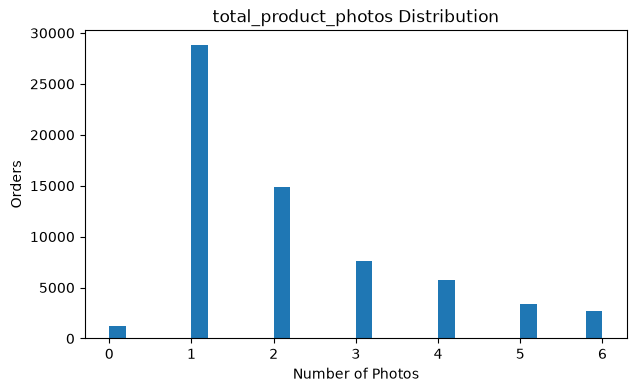

/tmp/ipykernel_829/4173482619.py:85: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


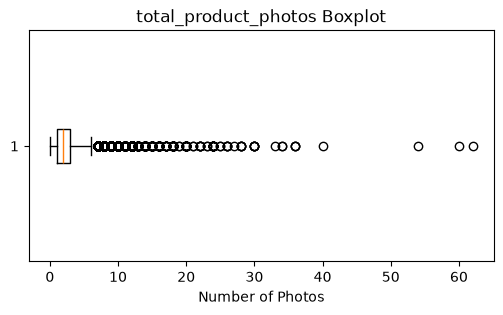

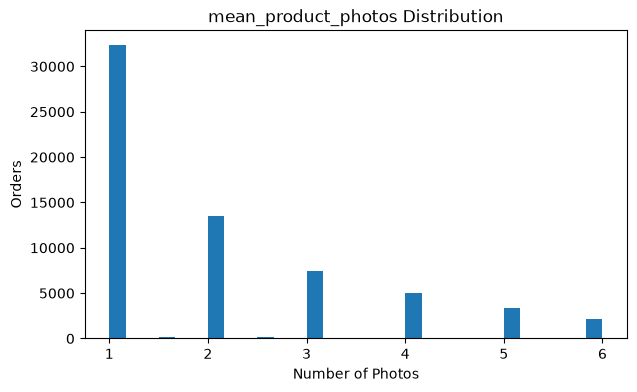

/tmp/ipykernel_829/4173482619.py:85: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train[col].dropna(), vert=False)


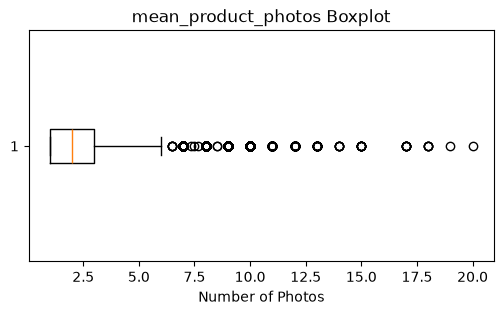

In [85]:
photo_cols = [
    "total_product_photos",
    "mean_product_photos"
]

target = "delayed"

# ============================================================
# PRODUCT PHOTOS EDA
# ============================================================

summary = train[photo_cols].describe().T
summary["missing"] = train[photo_cols].isna().sum()
summary["missing_%"] = train[photo_cols].isna().mean() * 100
summary["unique"] = train[photo_cols].nunique()
summary["outliers"] = 0
summary["outlier_%"] = 0.0

for col in photo_cols:
    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    outliers = (
        (train[col] < q1 - 1.5 * iqr) |
        (train[col] > q3 + 1.5 * iqr)
    )

    summary.loc[col, "outliers"] = outliers.sum()
    summary.loc[col, "outlier_%"] = outliers.mean() * 100

# 1. Summary
print("=" * 70)
print("SUMMARY")
print("=" * 70)

print(summary[
    ["count", "missing", "missing_%", "unique",
     "mean", "50%", "std", "min", "max",
     "outliers", "outlier_%"]
].round(2))


# 2. Correlation with target
print("\n" + "=" * 70)
print("CORRELATION WITH DELAYED")
print("=" * 70)

corr = train[photo_cols + [target]].corr()[target].drop(target)
print(corr.sort_values(ascending=False).round(3))


# 3. Photos by delayed status
print("\n" + "=" * 70)
print("PHOTOS BY DELAY STATUS")
print("=" * 70)

comparison = train.groupby(target)[photo_cols].agg(
    ["count", "mean", "median"]
)

print(comparison.round(2))


# 4. Distributions + Boxplots
for col in photo_cols:

    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    clean = train[col][
        (train[col] >= q1 - 1.5 * iqr) &
        (train[col] <= q3 + 1.5 * iqr)
    ].dropna()

    # Distribution
    plt.figure(figsize=(7, 4))
    plt.hist(clean, bins=30)
    plt.title(f"{col} Distribution")
    plt.xlabel("Number of Photos")
    plt.ylabel("Orders")
    plt.show()

    # Boxplot
    plt.figure(figsize=(6, 3))
    plt.boxplot(train[col].dropna(), vert=False)
    plt.title(f"{col} Boxplot")
    plt.xlabel("Number of Photos")
    plt.show()

In [142]:
photo_cols = [
    "total_product_photos",
    "mean_product_photos"
]

print("=" * 80)
print("PRODUCT PHOTOS — EDA")
print("=" * 80)

for col in photo_cols:

    s = train[col]

    print(f"\n{col}")
    print("-" * 60)

    print(f"Missing     : {s.isna().sum():,}")
    print(f"Unique      : {s.nunique():,}")
    print(f"Min         : {s.min():.2f}")
    print(f"Max         : {s.max():.2f}")
    print(f"Mean        : {s.mean():.2f}")
    print(f"Median      : {s.median():.2f}")

    # Correlation
    print(
        f"Pearson delayed     : {s.corr(train['delayed']):.5f}"
    )
    print(
        f"Spearman delayed    : {s.corr(train['delayed'], method='spearman'):.5f}"
    )
    print(
        f"Pearson delay_days  : {s.corr(train['delay_days']):.5f}"
    )
    print(
        f"Spearman delay_days : {s.corr(train['delay_days'], method='spearman'):.5f}"
    )

    # IQR outliers
    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (s < lower) | (s > upper)

    print(f"\nQ1          : {q1:.2f}")
    print(f"Q3          : {q3:.2f}")
    print(f"Lower bound : {lower:.2f}")
    print(f"Upper bound : {upper:.2f}")
    print(f"Outliers    : {outlier.sum():,}")

    # Target distribution by quartile
    temp = train[[col, "delayed", "delay_days"]].copy()
    temp["quartile"] = pd.qcut(temp[col], 4, duplicates="drop")

    print("\nDELAY RATE BY QUARTILE")
    print(
        temp.groupby("quartile", observed=True)
        .agg(
            orders=(col, "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .assign(delayed_rate=lambda x: x["delayed_rate"] * 100)
    )

PRODUCT PHOTOS — EDA

total_product_photos
------------------------------------------------------------
Missing     : 0
Unique      : 37
Min         : 0.00
Max         : 62.00
Mean        : 2.47
Median      : 2.00
Pearson delayed     : -0.01254
Spearman delayed    : -0.01993
Pearson delay_days  : -0.01676
Spearman delay_days : -0.01482

Q1          : 1.00
Q3          : 3.00
Lower bound : -2.00
Upper bound : 6.00
Outliers    : 3,117

DELAY RATE BY QUARTILE
               orders  delayed_orders  delayed_rate  avg_delay_days
quartile                                                           
(-0.001, 1.0]   30002            2898      9.659356      -10.505586
(1.0, 2.0]      14917            1298      8.701482      -10.902810
(2.0, 3.0]       7629             691      9.057544      -10.820275
(3.0, 62.0]     14985            1210      8.074741      -11.152950

mean_product_photos
------------------------------------------------------------
Missing     : 1,197
Unique      : 58
Min         :

In [143]:
photo_cols = [
    "total_product_photos",
    "mean_product_photos"
]

# ============================================================
# ORIGINAL CORRELATION
# ============================================================

print("=" * 80)
print("ORIGINAL CORRELATION WITH TARGET")
print("=" * 80)

for col in photo_cols:
    print(
        f"{col:25} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.5f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.5f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.5f}"
    )


# ============================================================
# OUTLIER ANALYSIS + REMOVE NON-DELAYED OUTLIERS
# ============================================================

remove_mask = pd.Series(False, index=train.index)

print("\n" + "=" * 80)
print("OUTLIER ANALYSIS")
print("=" * 80)

for col in photo_cols:

    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (train[col] < lower) | (train[col] > upper)

    delayed_outliers = (outlier & (train["delayed"] == 1)).sum()
    non_delayed_outliers = (outlier & (train["delayed"] == 0)).sum()

    print(f"\n{col}")
    print(f"Q1                   : {q1:.3f}")
    print(f"Q3                   : {q3:.3f}")
    print(f"Lower bound          : {lower:.3f}")
    print(f"Upper bound          : {upper:.3f}")
    print(f"Total outliers       : {outlier.sum():,}")
    print(f"Delayed outliers     : {delayed_outliers:,}")
    print(f"Non-delayed outliers : {non_delayed_outliers:,}")

    # Remove only non-delayed outliers
    remove_mask |= outlier & (train["delayed"] == 0)


clean = train.loc[~remove_mask].copy()


# ============================================================
# DATASET SIZE
# ============================================================

print("\n" + "=" * 80)
print("DATASET SIZE")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.3f}%")


# ============================================================
# CORRELATION BEFORE vs AFTER
# ============================================================

print("\n" + "=" * 80)
print("CORRELATION — BEFORE vs AFTER")
print("=" * 80)

for col in photo_cols:

    p_before = train[col].corr(train["delayed"])
    p_after = clean[col].corr(clean["delayed"])

    s_before = train[col].corr(
        train["delayed"], method="spearman"
    )
    s_after = clean[col].corr(
        clean["delayed"], method="spearman"
    )

    d_before = train[col].corr(train["delay_days"])
    d_after = clean[col].corr(clean["delay_days"])

    sd_before = train[col].corr(
        train["delay_days"], method="spearman"
    )
    sd_after = clean[col].corr(
        clean["delay_days"], method="spearman"
    )

    print(f"\n{col}")
    print("-" * 70)

    print(
        f"Pearson delayed    : "
        f"{p_before:.5f} → {p_after:.5f}"
    )

    print(
        f"Spearman delayed   : "
        f"{s_before:.5f} → {s_after:.5f}"
    )

    print(
        f"Pearson delay_days : "
        f"{d_before:.5f} → {d_after:.5f}"
    )

    print(
        f"Spearman delay_days: "
        f"{sd_before:.5f} → {sd_after:.5f}"
    )


# ============================================================
# TARGET DISTRIBUTION BEFORE vs AFTER
# ============================================================

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION")
print("=" * 80)

for name, df in [("BEFORE", train), ("AFTER", clean)]:

    print(f"\n{name}")
    print(f"Rows         : {len(df):,}")
    print(f"Delayed      : {df['delayed'].sum():,}")
    print(f"Delayed rate : {df['delayed'].mean() * 100:.3f}%")
    print(f"Mean delay   : {df['delay_days'].mean():.3f}")


# ============================================================
# DELAY RATE BY PHOTO QUARTILES
# ============================================================

print("\n" + "=" * 80)
print("DELAY RATE BY PHOTO QUARTILES — BEFORE")
print("=" * 80)

for col in photo_cols:

    temp = train[[col, "delayed", "delay_days"]].copy()
    temp["quartile"] = pd.qcut(
        temp[col], 4, duplicates="drop"
    )

    print(f"\n--- {col} ---")

    print(
        temp.groupby("quartile", observed=True)
        .agg(
            orders=(col, "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .assign(
            delayed_rate=lambda x: x["delayed_rate"] * 100
        )
    )


print("\n" + "=" * 80)
print("DELAY RATE BY PHOTO QUARTILES — AFTER")
print("=" * 80)

for col in photo_cols:

    temp = clean[[col, "delayed", "delay_days"]].copy()
    temp["quartile"] = pd.qcut(
        temp[col], 4, duplicates="drop"
    )

    print(f"\n--- {col} ---")

    print(
        temp.groupby("quartile", observed=True)
        .agg(
            orders=(col, "size"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean")
        )
        .assign(
            delayed_rate=lambda x: x["delayed_rate"] * 100
        )
    )

ORIGINAL CORRELATION WITH TARGET
total_product_photos      | Pearson delayed: -0.01254 | Spearman delayed: -0.01993 | Pearson delay_days: -0.01676 | Spearman delay_days: -0.01482
mean_product_photos       | Pearson delayed: -0.00741 | Spearman delayed: -0.01362 | Pearson delay_days: -0.00377 | Spearman delay_days: -0.00328

OUTLIER ANALYSIS

total_product_photos
Q1                   : 1.000
Q3                   : 3.000
Lower bound          : -2.000
Upper bound          : 6.000
Total outliers       : 3,117
Delayed outliers     : 272
Non-delayed outliers : 2,845

mean_product_photos
Q1                   : 1.000
Q3                   : 3.000
Lower bound          : -2.000
Upper bound          : 6.000
Total outliers       : 1,936
Delayed outliers     : 188
Non-delayed outliers : 1,748

DATASET SIZE
Original rows : 67,533
Removed rows  : 2,845
Remaining     : 64,688
Removed %     : 4.213%

CORRELATION — BEFORE vs AFTER

total_product_photos
----------------------------------------------------

## Payment

### payment_count

DISTRIBUTION ANALYSIS — payment_count

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      1
Valid values:        67,532
Unique values:       19

--- STATISTICS WITH ALL VALUES ---
Mean:                1.048
Median:              1.000
Std:                 0.397
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 26.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,532
Mean:                1.048
Median:              1.000
Std:                 0.397
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 26.000

--- MOST FREQUENT VALUES ---


,frequency
payment_count,
1.0,65403
2.0,1714
3.0,218
4.0,74
5.0,35
6.0,27
7.0,19
8.0,9
11.0,8


/tmp/ipykernel_829/526878474.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


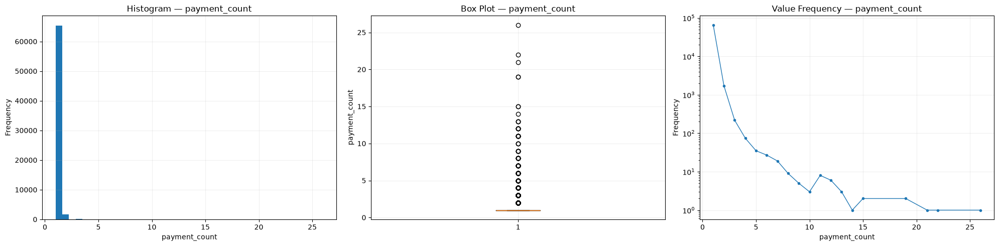

/tmp/ipykernel_829/526878474.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


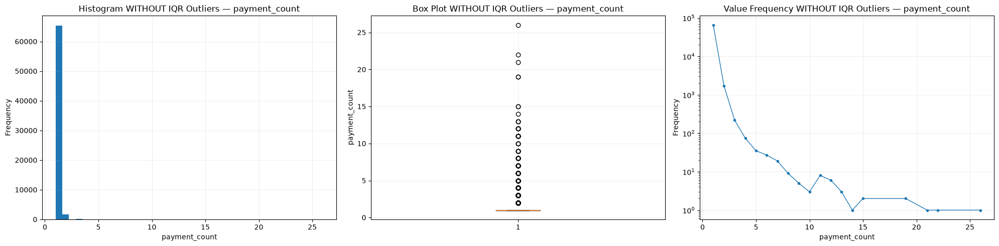


CORRELATION WITH: payment_count


,feature,pearson,spearman
46,payment_type_voucher,0.547,0.796
38,min_payment,-0.072,-0.240
43,payment_type_boleto,-0.061,-0.092
41,median_payment,-0.057,-0.168
40,mean_payment,-0.056,-0.165
42,max_installments,-0.045,-0.067
39,max_payment,-0.037,-0.093
49,year,-0.018,-0.019
5,seller_count,0.018,0.012
16,unique_seller_states,0.013,0.009



payment_count vs TARGET
Pearson correlation: -0.0059

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: payment_count


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
46,payment_type_voucher,0.547,0.547,0.0,0.796,0.796,0.0
38,min_payment,-0.072,-0.072,0.0,-0.240,-0.240,0.0
43,payment_type_boleto,-0.061,-0.061,0.0,-0.092,-0.092,0.0
41,median_payment,-0.057,-0.057,0.0,-0.168,-0.168,0.0
40,mean_payment,-0.056,-0.056,0.0,-0.165,-0.165,0.0
42,max_installments,-0.045,-0.045,0.0,-0.067,-0.067,0.0
39,max_payment,-0.037,-0.037,0.0,-0.093,-0.093,0.0
49,year,-0.018,-0.018,0.0,-0.019,-0.019,0.0
5,seller_count,0.018,0.018,0.0,0.012,0.012,0.0
16,unique_seller_states,0.013,0.013,0.0,0.009,0.009,0.0



payment_count vs TARGET
Pearson with all values:       -0.0059
Pearson without IQR outliers:  -0.0059
Change:                         0.0000

payment_count vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
payment_count,,,
1.0,65403,5928,9.06
2.0,1714,130,7.58
3.0,218,22,10.09
4.0,74,6,8.11
5.0,35,3,8.57
6.0,27,2,7.41
7.0,19,4,21.05
8.0,9,1,11.11
9.0,5,0,0.00



payment_count DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,1.048,1.0,0.405,1.0,26.0
1,6096,1.040,1.0,0.301,1.0,8.0


In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "payment_count"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

### total_payment

DISTRIBUTION ANALYSIS — total_payment

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      1
Valid values:        67,532
Unique values:       21,015

--- STATISTICS WITH ALL VALUES ---
Mean:                158.168
Median:              104.190
Std:                 214.278
Min:                 10.070
Q1:                  61.630
Q3:                  175.485
Max:                 13,664.080

--- IQR ANALYSIS ---
IQR:                 113.855
Lower bound:         -109.152
Upper bound:         346.267
Method:              IQR

--- OUTLIERS ---
Outlier count:       5,308
Outlier percentage:  7.86%
Outlier minimum:     346.380
Outlier maximum:     13,664.080

--- WITHOUT IQR OUTLIERS ---
Valid values:        62,224
Mean:                114.304
Median:              96.020
Std:                 71.917
Min:                 10.070
Q1:                  58.477
Q3:                  154.572
Max:                 346.210

--- MOST FREQUENT VALUES ---


,frequency
total_payment,
77.57,250
35.00,164
73.34,161
116.94,131
107.78,117
56.78,114
65.00,112
86.15,104
67.50,104


/tmp/ipykernel_829/1824392270.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


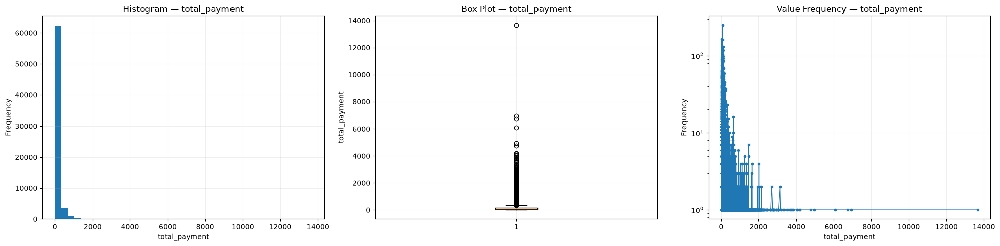

/tmp/ipykernel_829/1824392270.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


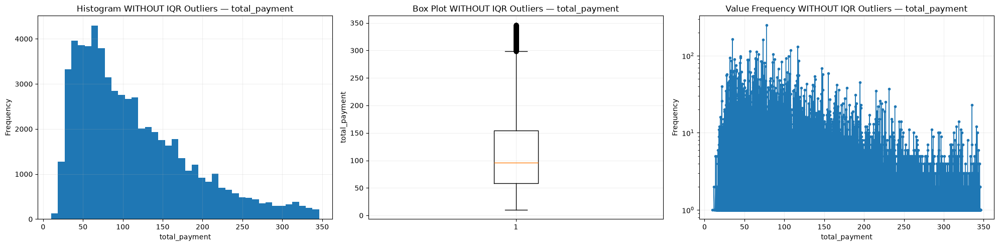


CORRELATION WITH: total_payment


,feature,pearson,spearman
39,max_payment,0.997,0.994
6,total_price,0.996,0.991
40,mean_payment,0.992,0.985
41,median_payment,0.992,0.984
38,min_payment,0.984,0.964
8,max_price,0.920,0.936
9,mean_price,0.917,0.931
10,median_price,0.916,0.930
7,min_price,0.913,0.920
11,total_freight,0.490,0.570



total_payment vs TARGET
Pearson correlation: 0.0248

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: total_payment


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
39,max_payment,0.997,0.994,-0.003,0.994,0.992,-0.001
6,total_price,0.996,0.987,-0.010,0.991,0.988,-0.003
40,mean_payment,0.992,0.985,-0.007,0.985,0.981,-0.004
41,median_payment,0.992,0.984,-0.008,0.984,0.980,-0.003
38,min_payment,0.984,0.970,-0.014,0.964,0.959,-0.005
8,max_price,0.920,0.915,-0.005,0.936,0.925,-0.011
9,mean_price,0.917,0.909,-0.008,0.931,0.919,-0.012
10,median_price,0.916,0.908,-0.008,0.930,0.918,-0.011
7,min_price,0.913,0.900,-0.012,0.920,0.908,-0.012
11,total_freight,0.490,0.475,-0.015,0.570,0.520,-0.050



total_payment vs TARGET
Pearson with all values:       0.0248
Pearson without IQR outliers:  0.0286
Change:                         0.0038

total_payment vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
total_payment,,,
10.07,1,0,0.0
11.62,1,0,0.0
11.63,2,0,0.0
12.28,1,0,0.0
12.89,1,0,0.0
...,...,...,...
4950.34,1,0,0.0
6081.54,1,0,0.0
6726.66,1,0,0.0



total_payment DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,156.497,103.050,212.634,10.07,13664.08
1,6096,175.008,113.855,229.531,15.86,3184.55


In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "total_payment"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

### min\max\mean\med payment

PAYMENT FEATURES — SUMMARY


,feature,missing,missing_%,unique,mean,median,std,min,max,IQR,outliers,outliers_%
0,min_payment,1,0.001,21619,154.333,101.60,211.736,0.000,13664.08,114.240,5196,7.694
1,max_payment,1,0.001,21195,156.612,102.78,212.636,4.070,13664.08,113.510,5263,7.793
2,mean_payment,1,0.001,21953,155.447,102.03,211.779,1.738,13664.08,113.681,5235,7.752
3,median_payment,1,0.001,21809,155.417,102.03,211.793,0.250,13664.08,113.731,5234,7.750



CORRELATION WITH TARGET — delayed


,pearson_correlation
min_payment,0.0257
mean_payment,0.0252
median_payment,0.0252
max_payment,0.0248


/tmp/ipykernel_829/1907343582.py:124: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/1907343582.py:124: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/1907343582.py:124: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(
/tmp/ipykernel_829/1907343582.py:124: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(


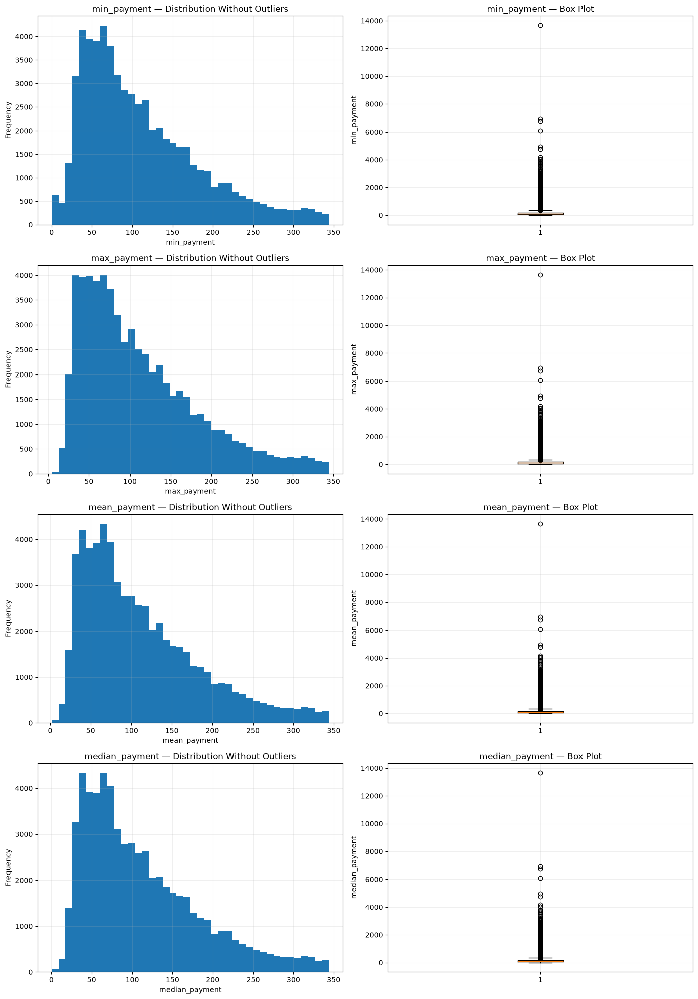

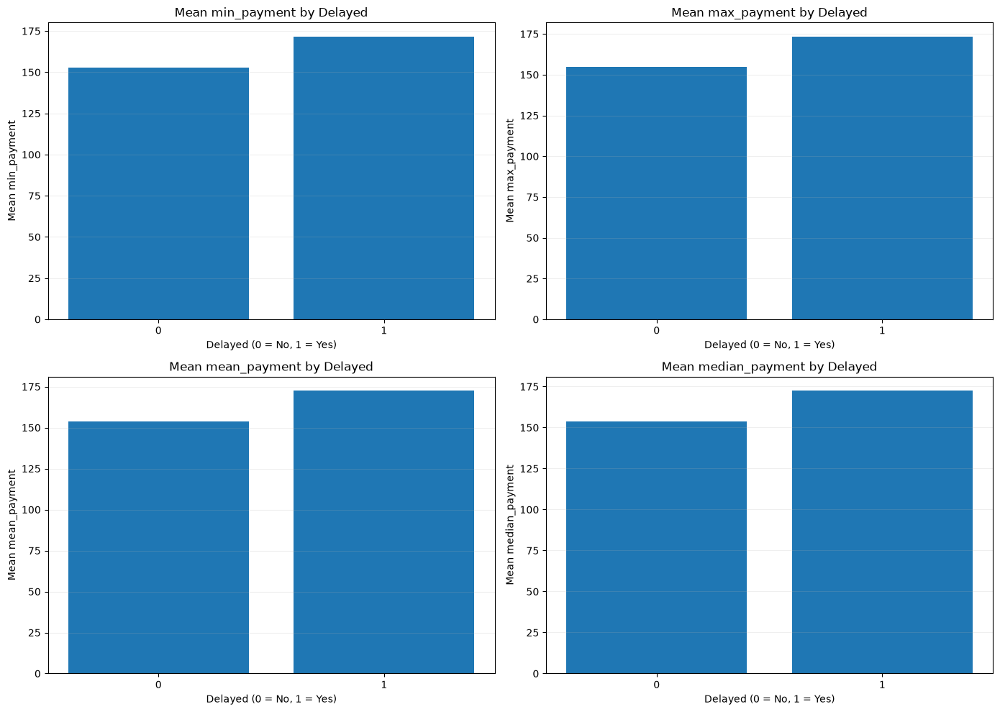


PAYMENT FEATURES BY TARGET


min_payment          max_payment         mean_payment           \
               mean   median        mean  median         mean   median   
delayed                                                                  
0           152.622  100.350     154.952  102.03      153.763  101.220   
1           171.574  111.395     173.339  112.71      172.420  112.235   

        median_payment           
                  mean   median  
delayed                          
0              153.735  101.195  
1              172.367  112.160

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

payment_cols = [
    "min_payment",
    "max_payment",
    "mean_payment",
    "median_payment"
]

target = "delayed"

# ============================================================
# SUMMARY + MISSING + OUTLIERS
# ============================================================

summary = []

for col in payment_cols:

    x = train[col].dropna()

    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = x[
        (x < lower) |
        (x > upper)
    ]

    summary.append({
        "feature": col,
        "missing": train[col].isna().sum(),
        "missing_%": train[col].isna().mean() * 100,
        "unique": x.nunique(),
        "mean": x.mean(),
        "median": x.median(),
        "std": x.std(),
        "min": x.min(),
        "max": x.max(),
        "IQR": IQR,
        "outliers": len(outliers),
        "outliers_%": len(outliers) / len(x) * 100
    })

summary = pd.DataFrame(summary)

print("=" * 100)
print("PAYMENT FEATURES — SUMMARY")
print("=" * 100)

display(summary.round(3))


# ============================================================
# CORRELATION WITH TARGET
# ============================================================

target_corr = (
    train[payment_cols + [target]]
    .corr()[target]
    .drop(target)
)

print("\n" + "=" * 100)
print("CORRELATION WITH TARGET — delayed")
print("=" * 100)

display(
    target_corr
    .sort_values(key=abs, ascending=False)
    .rename("pearson_correlation")
    .to_frame()
    .round(4)
)


# ============================================================
# DISTRIBUTION + BOXPLOT
# ============================================================

fig, axes = plt.subplots(
    len(payment_cols),
    2,
    figsize=(14, 5 * len(payment_cols))
)

for i, col in enumerate(payment_cols):

    x = train[col].dropna()

    # IQR
    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    normal = x[
        (x >= lower) &
        (x <= upper)
    ]

    # Histogram without outliers
    axes[i, 0].hist(
        normal,
        bins=40
    )

    axes[i, 0].set_title(
        f"{col} — Distribution Without Outliers"
    )
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].grid(alpha=0.2)

    # Boxplot with outliers
    axes[i, 1].boxplot(
        x,
        vert=True
    )

    axes[i, 1].set_title(
        f"{col} — Box Plot"
    )
    axes[i, 1].set_ylabel(col)
    axes[i, 1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# RELATIONSHIP WITH TARGET
# ============================================================

fig, axes = plt.subplots(
    2,
    2,
    figsize=(14, 10)
)

axes = axes.flatten()

for i, col in enumerate(payment_cols):

    grouped = train.groupby(target)[col].mean()

    axes[i].bar(
        grouped.index.astype(str),
        grouped.values
    )

    axes[i].set_title(
        f"Mean {col} by Delayed"
    )
    axes[i].set_xlabel("Delayed (0 = No, 1 = Yes)")
    axes[i].set_ylabel(f"Mean {col}")
    axes[i].grid(
        axis="y",
        alpha=0.2
    )

plt.tight_layout()
plt.show()


# ============================================================
# TARGET GROUP STATISTICS
# ============================================================

print("\n" + "=" * 100)
print("PAYMENT FEATURES BY TARGET")
print("=" * 100)

display(
    train
    .groupby(target)[payment_cols]
    .agg(["mean", "median"])
    .round(3)
)

### max_installments

DISTRIBUTION ANALYSIS — max_installments

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      1
Valid values:        67,532
Unique values:       22

--- STATISTICS WITH ALL VALUES ---
Mean:                2.974
Median:              2.000
Std:                 2.755
Min:                 1.000
Q1:                  1.000
Q3:                  4.000
Max:                 24.000

--- IQR ANALYSIS ---
IQR:                 3.000
Lower bound:         -3.500
Upper bound:         8.500
Method:              IQR

--- OUTLIERS ---
Outlier count:       4,677
Outlier percentage:  6.93%
Outlier minimum:     9.000
Outlier maximum:     24.000

--- WITHOUT IQR OUTLIERS ---
Valid values:        62,855
Mean:                2.441
Median:              1.000
Std:                 1.978
Min:                 1.000
Q1:                  1.000
Q3:                  3.000
Max:                 8.000

--- MOST FREQUENT VALUES ---


,frequency
max_installments,
1.0,32358
2.0,8330
3.0,7220
4.0,4853
10.0,3959
5.0,3624
6.0,2690
8.0,2645
7.0,1135


/tmp/ipykernel_829/2273314929.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


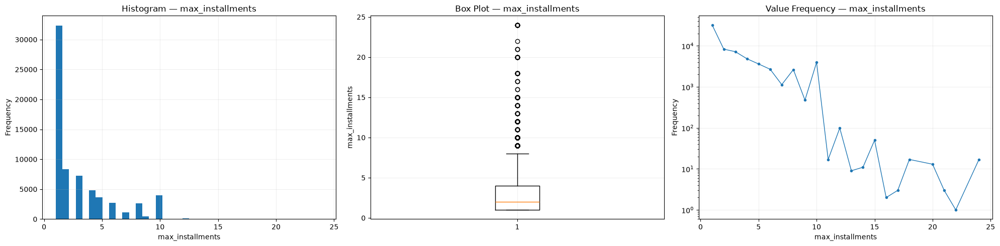

/tmp/ipykernel_829/2273314929.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


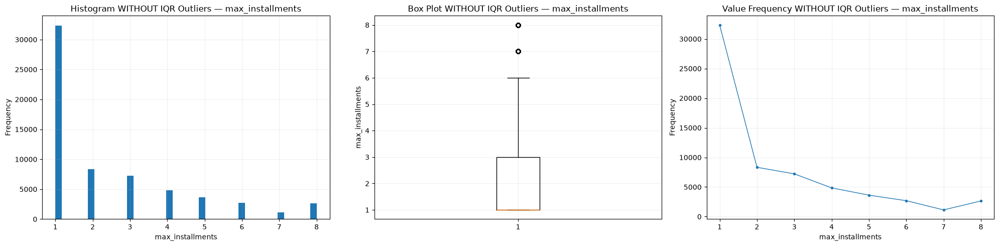


CORRELATION WITH: max_installments


,feature,pearson,spearman
44,payment_type_credit_card,0.395,0.528
43,payment_type_boleto,-0.365,-0.488
40,max_payment,0.317,0.376
41,mean_payment,0.317,0.378
42,median_payment,0.317,0.378
8,max_price,0.317,0.355
38,total_payment,0.316,0.372
39,min_payment,0.316,0.376
9,mean_price,0.315,0.352
10,median_price,0.315,0.351



max_installments vs TARGET
Pearson correlation: 0.0172

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: max_installments


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
44,payment_type_credit_card,0.395,0.421,0.026,0.528,0.523,-0.004
43,payment_type_boleto,-0.365,-0.388,-0.023,-0.488,-0.483,0.005
40,max_payment,0.317,0.215,-0.103,0.376,0.293,-0.083
41,mean_payment,0.317,0.216,-0.101,0.378,0.297,-0.081
42,median_payment,0.317,0.216,-0.101,0.378,0.297,-0.081
8,max_price,0.317,0.230,-0.087,0.355,0.281,-0.074
38,total_payment,0.316,0.214,-0.103,0.372,0.289,-0.083
39,min_payment,0.316,0.216,-0.100,0.376,0.298,-0.078
9,mean_price,0.315,0.229,-0.086,0.352,0.279,-0.073
10,median_price,0.315,0.229,-0.086,0.351,0.279,-0.073



max_installments vs TARGET
Pearson with all values:       0.0172
Pearson without IQR outliers:  0.0173
Change:                         0.0001

max_installments vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
max_installments,,,
1.0,32358,2777,8.58
2.0,8330,746,8.96
3.0,7220,666,9.22
4.0,4853,464,9.56
5.0,3624,330,9.11
6.0,2690,256,9.52
7.0,1135,111,9.78
8.0,2645,286,10.81
9.0,476,54,11.34



max_installments DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,2.959,2.0,2.745,1.0,24.0
1,6096,3.125,2.0,2.848,1.0,24.0


In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "max_installments"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

### payment type

PAYMENT TYPES — SUMMARY


,feature,missing,missing_%,unique,count_1,count_0,usage_%
0,payment_type_boleto,1,0.001,2,13901,53631,20.584
1,payment_type_credit_card,1,0.001,2,51825,15707,76.741
2,payment_type_debit_card,1,0.001,2,698,66834,1.034
3,payment_type_not_defined,1,0.001,1,0,67532,0.000
4,payment_type_voucher,1,0.001,2,2730,64802,4.043



CORRELATION WITH TARGET — delayed


,pearson_correlation
payment_type_voucher,-0.0098
payment_type_boleto,0.0068
payment_type_credit_card,-0.0053
payment_type_debit_card,0.0031
payment_type_not_defined,NaN



PAYMENT TYPE vs DELAY


,payment_type,value,orders,delayed_count,delayed_rate_%
0,payment_type_boleto,0,53631,4788,8.93
1,payment_type_boleto,1,13901,1308,9.41
2,payment_type_credit_card,0,15707,1461,9.30
3,payment_type_credit_card,1,51825,4635,8.94
4,payment_type_debit_card,0,66834,6027,9.02
5,payment_type_debit_card,1,698,69,9.89
6,payment_type_not_defined,0,67532,6096,9.03
7,payment_type_voucher,0,64802,5887,9.08
8,payment_type_voucher,1,2730,209,7.66



DELAYED RATE — PAYMENT TYPE = 1


,delayed_rate_%
payment_type_debit_card,9.89
payment_type_boleto,9.41
payment_type_credit_card,8.94
payment_type_voucher,7.66
payment_type_not_defined,NaN


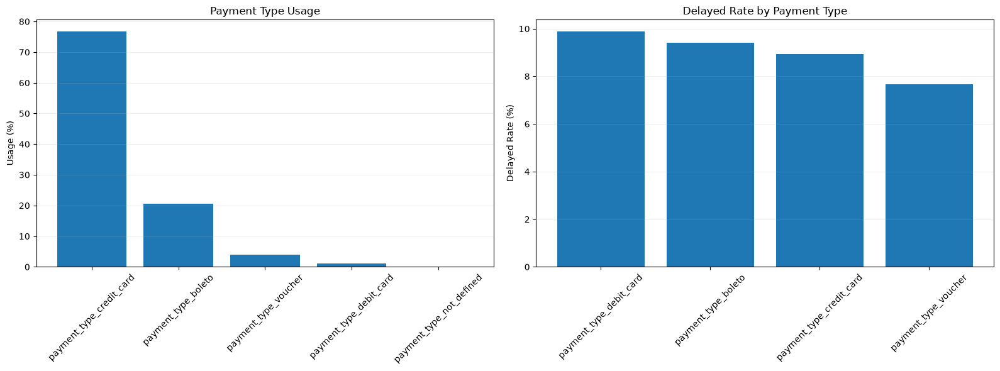

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

payment_type_cols = [
    "payment_type_boleto",
    "payment_type_credit_card",
    "payment_type_debit_card",
    "payment_type_not_defined",
    "payment_type_voucher"
]

target = "delayed"


# ============================================================
# BASIC SUMMARY
# ============================================================

summary = []

for col in payment_type_cols:

    valid = train[col].dropna()

    summary.append({
        "feature": col,
        "missing": train[col].isna().sum(),
        "missing_%": train[col].isna().mean() * 100,
        "unique": valid.nunique(),
        "count_1": (valid == 1).sum(),
        "count_0": (valid == 0).sum(),
        "usage_%": (valid == 1).mean() * 100
    })

summary = pd.DataFrame(summary)

print("=" * 100)
print("PAYMENT TYPES — SUMMARY")
print("=" * 100)

display(summary.round(3))


# ============================================================
# CORRELATION WITH TARGET
# ============================================================

correlation = (
    train[payment_type_cols + [target]]
    .corr()[target]
    .drop(target)
    .sort_values(key=abs, ascending=False)
)

print("\n" + "=" * 100)
print("CORRELATION WITH TARGET — delayed")
print("=" * 100)

display(
    correlation
    .rename("pearson_correlation")
    .to_frame()
    .round(4)
)


# ============================================================
# DELAYED RATE BY PAYMENT TYPE
# ============================================================

results = []

for col in payment_type_cols:

    temp = train[[col, target]].dropna()

    grouped = (
        temp.groupby(col)[target]
        .agg(
            orders="count",
            delayed_count="sum",
            delayed_rate="mean"
        )
    )

    for value, row in grouped.iterrows():

        results.append({
            "payment_type": col,
            "value": int(value),
            "orders": int(row["orders"]),
            "delayed_count": int(row["delayed_count"]),
            "delayed_rate_%": row["delayed_rate"] * 100
        })

payment_target = pd.DataFrame(results)

print("\n" + "=" * 100)
print("PAYMENT TYPE vs DELAY")
print("=" * 100)

display(
    payment_target.round(2)
)


# ============================================================
# DELAYED RATE FOR USERS OF EACH PAYMENT TYPE
# ============================================================

delayed_rates = {}

for col in payment_type_cols:

    mask = train[col] == 1

    delayed_rates[col] = (
        train.loc[mask, target].mean() * 100
    )

delayed_rates = (
    pd.Series(delayed_rates)
    .sort_values(ascending=False)
)

print("\n" + "=" * 100)
print("DELAYED RATE — PAYMENT TYPE = 1")
print("=" * 100)

display(
    delayed_rates
    .rename("delayed_rate_%")
    .to_frame()
    .round(2)
)


# ============================================================
# VISUALIZATION
# ============================================================

fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6)
)

# ------------------------------------------------------------
# 1. Payment type usage
# ------------------------------------------------------------

usage = (
    train[payment_type_cols]
    .mean()
    .sort_values(ascending=False)
    * 100
)

axes[0].bar(
    usage.index,
    usage.values
)

axes[0].set_title("Payment Type Usage")
axes[0].set_ylabel("Usage (%)")
axes[0].tick_params(
    axis="x",
    rotation=45
)
axes[0].grid(
    axis="y",
    alpha=0.2
)


# ------------------------------------------------------------
# 2. Delayed rate
# ------------------------------------------------------------

axes[1].bar(
    delayed_rates.index,
    delayed_rates.values
)

axes[1].set_title("Delayed Rate by Payment Type")
axes[1].set_ylabel("Delayed Rate (%)")
axes[1].tick_params(
    axis="x",
    rotation=45
)
axes[1].grid(
    axis="y",
    alpha=0.2
)

plt.tight_layout()
plt.show()

### All

In [145]:
payment_cols = [
    "payment_count",
    "total_payment",
    "min_payment",
    "max_payment",
    "mean_payment",
    "median_payment",
    "max_installments"
]

price_freight_cols = [
    "total_price",
    "min_price",
    "total_freight",
    "min_freight"
]

# ============================================================
# 1. ORIGINAL CORRELATION + PAYMENT OUTLIERS
# ============================================================

print("=" * 80)
print("PAYMENT — ORIGINAL CORRELATION & OUTLIERS")
print("=" * 80)

for col in payment_cols:

    s = train[col]

    p_delayed = s.corr(train["delayed"])
    s_delayed = s.corr(train["delayed"], method="spearman")
    p_days = s.corr(train["delay_days"])
    s_days = s.corr(train["delay_days"], method="spearman")

    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (s < lower) | (s > upper)

    print(f"\n{col}")
    print(f"Pearson delayed    : {p_delayed:.5f}")
    print(f"Spearman delayed   : {s_delayed:.5f}")
    print(f"Pearson delay_days : {p_days:.5f}")
    print(f"Spearman delay_days: {s_days:.5f}")
    print(f"Q1 / Q3            : {q1:.3f} / {q3:.3f}")
    print(f"Lower / Upper      : {lower:.3f} / {upper:.3f}")
    print(f"Total outliers     : {outlier.sum():,}")
    print(f"Delayed outliers   : {(outlier & (train['delayed'] == 1)).sum():,}")
    print(f"Non-delayed        : {(outlier & (train['delayed'] == 0)).sum():,}")


# ============================================================
# 2. REMOVE NON-DELAYED OUTLIERS FROM PRICE + FREIGHT ONLY
# ============================================================

remove_mask = pd.Series(False, index=train.index)

for col in price_freight_cols:

    q1, q3 = train[col].quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (train[col] < lower) | (train[col] > upper)

    remove_mask |= outlier & (train["delayed"] == 0)

clean = train.loc[~remove_mask].copy()


print("\n" + "=" * 80)
print("AFTER REMOVING NON-DELAYED PRICE + FREIGHT OUTLIERS")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.2f}%")


# ============================================================
# 3. PAYMENT OUTLIERS REMAINING AFTER PRICE + FREIGHT CLEANING
# ============================================================

print("\n" + "=" * 80)
print("REMAINING PAYMENT OUTLIERS")
print("=" * 80)

for col in payment_cols:

    # نفس حدود IQR الأصلية حتى تكون المقارنة عادلة
    s_original = train[col]

    q1, q3 = s_original.quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    remaining_outlier = (
        (clean[col] < lower) |
        (clean[col] > upper)
    )

    print(
        f"{col:20} | "
        f"Original outliers: "
        f"{((s_original < lower) | (s_original > upper)).sum():,} "
        f"| Remaining: {remaining_outlier.sum():,}"
    )


# ============================================================
# 4. PAYMENT CORRELATION BEFORE → AFTER PRICE + FREIGHT
# ============================================================

print("\n" + "=" * 80)
print("PAYMENT CORRELATION — BEFORE → AFTER")
print("=" * 80)

for col in payment_cols:

    p_before = train[col].corr(train["delayed"])
    p_after = clean[col].corr(clean["delayed"])

    d_before = train[col].corr(train["delay_days"])
    d_after = clean[col].corr(clean["delay_days"])

    print(
        f"{col:20} | "
        f"delayed: {p_before:.5f} → {p_after:.5f} "
        f"| delay_days: {d_before:.5f} → {d_after:.5f}"
    )

PAYMENT — ORIGINAL CORRELATION & OUTLIERS

payment_count
Pearson delayed    : -0.00589
Spearman delayed   : -0.00711
Pearson delay_days : -0.00269
Spearman delay_days: -0.00735
Q1 / Q3            : 1.000 / 1.000
Lower / Upper      : 1.000 / 1.000
Total outliers     : 2,129
Delayed outliers   : 168
Non-delayed        : 1,961

total_payment
Pearson delayed    : 0.02476
Spearman delayed   : 0.03540
Pearson delay_days : 0.00138
Spearman delay_days: -0.03073
Q1 / Q3            : 61.630 / 175.485
Lower / Upper      : -109.152 / 346.267
Total outliers     : 5,308
Delayed outliers   : 574
Non-delayed        : 4,734

min_payment
Pearson delayed    : 0.02565
Spearman delayed   : 0.03628
Pearson delay_days : 0.00199
Spearman delay_days: -0.02790
Q1 / Q3            : 58.600 / 172.840
Lower / Upper      : -112.760 / 344.200
Total outliers     : 5,196
Delayed outliers   : 566
Non-delayed        : 4,630

max_payment
Pearson delayed    : 0.02478
Spearman delayed   : 0.03552
Pearson delay_days : 0.0014

## review

### review_count

DISTRIBUTION ANALYSIS — review_count

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      515
Valid values:        67,018
Unique values:       3

--- STATISTICS WITH ALL VALUES ---
Mean:                1.007
Median:              1.000
Std:                 0.086
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 3.000

--- IQR ANALYSIS ---
IQR:                 0.000
Lower bound:         1.000
Upper bound:         1.000
Method:              Not applied (IQR = 0)

--- OUTLIERS ---
No IQR outliers were identified.
Reason: IQR = 0, so the IQR rule is not informative for this distribution.

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,018
Mean:                1.007
Median:              1.000
Std:                 0.086
Min:                 1.000
Q1:                  1.000
Q3:                  1.000
Max:                 3.000

--- MOST FREQUENT VALUES ---


,frequency
review_count,
1.0,66535
2.0,479
3.0,4


/tmp/ipykernel_829/2186417641.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


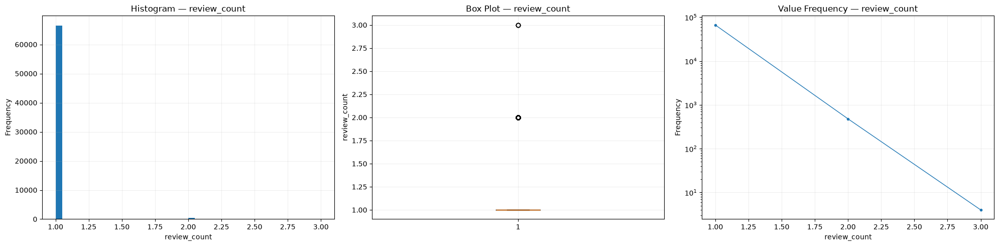

/tmp/ipykernel_829/2186417641.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


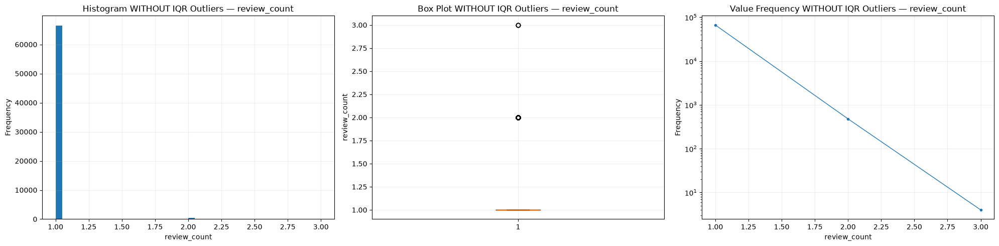


CORRELATION WITH: review_count


,feature,pearson,spearman
4,unique_products,0.026,0.021
30,mean_product_photos,-0.025,-0.025
43,max_installments,0.021,0.018
29,total_product_photos,-0.016,-0.017
32,seller_lng,-0.015,-0.011
7,min_price,-0.014,-0.017
3,item_count,0.014,0.014
10,median_price,-0.014,-0.016
9,mean_price,-0.014,-0.016
8,max_price,-0.014,-0.016



review_count vs TARGET
Pearson correlation: -0.0039

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: review_count


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
4,unique_products,0.026,0.026,0.0,0.021,0.021,0.0
30,mean_product_photos,-0.025,-0.025,0.0,-0.025,-0.025,0.0
43,max_installments,0.021,0.021,0.0,0.018,0.018,0.0
29,total_product_photos,-0.016,-0.016,0.0,-0.017,-0.017,0.0
32,seller_lng,-0.015,-0.015,0.0,-0.011,-0.011,0.0
7,min_price,-0.014,-0.014,0.0,-0.017,-0.017,0.0
3,item_count,0.014,0.014,0.0,0.014,0.014,0.0
10,median_price,-0.014,-0.014,0.0,-0.016,-0.016,0.0
9,mean_price,-0.014,-0.014,0.0,-0.016,-0.016,0.0
8,max_price,-0.014,-0.014,0.0,-0.016,-0.016,0.0



review_count vs TARGET
Pearson with all values:       -0.0039
Pearson without IQR outliers:  -0.0039
Change:                         0.0000

review_count vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
review_count,,,
1.0,66535,5923,8.90
2.0,479,37,7.72
3.0,4,0,0.00



review_count DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61058,1.007,1.0,0.086,1.0,3.0
1,5960,1.006,1.0,0.079,1.0,2.0


In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "review_count"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

# 4- Categorical Data

## order_status

CATEGORICAL ANALYSIS — order_status

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique categories:   2
Data type:           category

--- CATEGORY FREQUENCY ---


,frequency,percentage
order_status,,
canceled,6,0.01
delivered,67527,99.99



--- MOST FREQUENT CATEGORIES ---


,frequency,percentage
order_status,,
delivered,67527,99.99
canceled,6,0.01



--- LEAST FREQUENT CATEGORIES ---


,frequency,percentage
order_status,,
canceled,6,0.01
delivered,67527,99.99



order_status vs TARGET — GROUPED ANALYSIS


,count,delayed,not_delayed,delayed_rate
order_status,,,,
canceled,6,1,5,16.67
delivered,67527,6096,61431,9.03



--- TARGET DISTRIBUTION WITHIN EACH CATEGORY (%) ---


delayed,0,1
order_status,,
canceled,83.33,16.67
delivered,90.97,9.03



--- CATEGORY DISTRIBUTION WITHIN EACH TARGET CLASS (%) ---


order_status,canceled,delivered
delayed,,
0,0.01,99.99
1,0.02,99.98



order_status vs TARGET — CHI-SQUARE TEST
Chi-square statistic: 0.0000
Degrees of freedom:  1
P-value:             1.000000
Cramér's V:          0.0000
Result: No statistically significant association with the target.


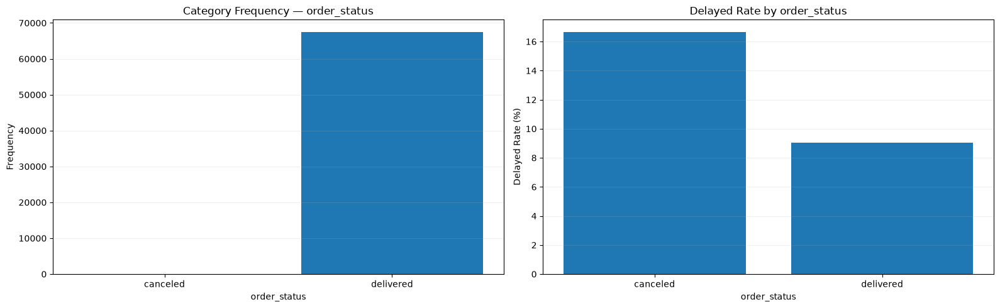


order_status vs TARGET — COUNTS


delayed,0,1
order_status,,
canceled,5,1
delivered,61431,6096


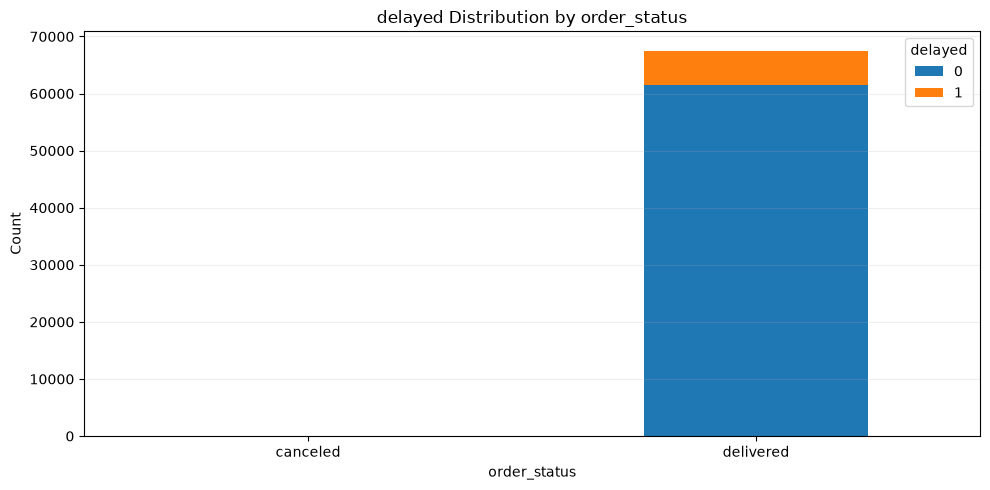


order_status — DELAYED RATE RANKING


,count,delayed,not_delayed,delayed_rate
order_status,,,,
canceled,6,1,5,16.67
delivered,67527,6096,61431,9.03


In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# ============================================================
# Select ONE categorical column
# ============================================================

col = "order_status"
target = "delayed"

# Convert to categorical
train[col] = train[col].astype("category")

x = train[col].dropna()

# ============================================================
# Basic information
# ============================================================

print("=" * 80)
print(f"CATEGORICAL ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique categories:   {x.nunique():,}")
print(f"Data type:           {train[col].dtype}")

# ============================================================
# Frequency analysis
# ============================================================

frequency = x.value_counts().sort_index()
percentage = (frequency / len(x) * 100).round(2)

frequency_table = pd.DataFrame({
    "frequency": frequency,
    "percentage": percentage
})

print("\n--- CATEGORY FREQUENCY ---")
display(frequency_table)

# ============================================================
# Most / least frequent categories
# ============================================================

print("\n--- MOST FREQUENT CATEGORIES ---")

display(
    frequency_table.sort_values(
        "frequency",
        ascending=False
    ).head(15)
)

print("\n--- LEAST FREQUENT CATEGORIES ---")

display(
    frequency_table.sort_values(
        "frequency",
        ascending=True
    ).head(15)
)

# ============================================================
# Target relationship by category
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_category = train.groupby(
    col,
    observed=False
)[target].agg(
    count="count",
    delayed="sum",
    not_delayed=lambda x: (x == 0).sum(),
    delayed_rate="mean"
)

target_by_category["delayed_rate"] = (
    target_by_category["delayed_rate"] * 100
).round(2)

display(target_by_category)

# ============================================================
# Target distribution within each category
# ============================================================

target_distribution = pd.crosstab(
    train[col],
    train[target],
    normalize="index"
) * 100

target_distribution = target_distribution.round(2)

print("\n--- TARGET DISTRIBUTION WITHIN EACH CATEGORY (%) ---")

display(target_distribution)

# ============================================================
# Target distribution across categories
# ============================================================

target_distribution_global = pd.crosstab(
    train[target],
    train[col],
    normalize="index"
) * 100

target_distribution_global = target_distribution_global.round(2)

print("\n--- CATEGORY DISTRIBUTION WITHIN EACH TARGET CLASS (%) ---")

display(target_distribution_global)

# ============================================================
# Chi-Square test
# ============================================================

contingency_table = pd.crosstab(
    train[col],
    train[target]
)

chi2, p_value, dof, expected = chi2_contingency(
    contingency_table
)

n = contingency_table.to_numpy().sum()
min_dimension = min(
    contingency_table.shape[0] - 1,
    contingency_table.shape[1] - 1
)

cramers_v = np.sqrt(
    chi2 / (n * min_dimension)
) if min_dimension > 0 else np.nan

print("\n" + "=" * 80)
print(f"{col} vs TARGET — CHI-SQUARE TEST")
print("=" * 80)

print(f"Chi-square statistic: {chi2:.4f}")
print(f"Degrees of freedom:  {dof}")
print(f"P-value:             {p_value:.6f}")
print(f"Cramér's V:          {cramers_v:.4f}")

if p_value < 0.05:
    print("Result: Significant association with the target.")
else:
    print("Result: No statistically significant association with the target.")

# ============================================================
# Target distribution by category — ALL DATA
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# ------------------------------------------------------------
# 1. Category frequency
# ------------------------------------------------------------

axes[0].bar(
    frequency.index.astype(str),
    frequency.values
)

axes[0].set_title(f"Category Frequency — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(axis="y", alpha=0.2)

# ------------------------------------------------------------
# 2. Delayed rate by category
# ------------------------------------------------------------

delayed_rate = target_by_category["delayed_rate"]

axes[1].bar(
    delayed_rate.index.astype(str),
    delayed_rate.values
)

axes[1].set_title(f"Delayed Rate by {col}")
axes[1].set_xlabel(col)
axes[1].set_ylabel("Delayed Rate (%)")
axes[1].grid(axis="y", alpha=0.2)

plt.tight_layout()
plt.show()

# ============================================================
# Target count by category
# ============================================================

target_counts = pd.crosstab(
    train[col],
    train[target]
)

print("\n" + "=" * 80)
print(f"{col} vs TARGET — COUNTS")
print("=" * 80)

display(target_counts)

# ============================================================
# Stacked bar — target distribution
# ============================================================

target_counts.plot(
    kind="bar",
    stacked=True,
    figsize=(10, 5)
)

plt.title(f"{target} Distribution by {col}")
plt.xlabel(col)
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# Delayed rate comparison
# ============================================================

print("\n" + "=" * 80)
print(f"{col} — DELAYED RATE RANKING")
print("=" * 80)

display(
    target_by_category[
        ["count", "delayed", "not_delayed", "delayed_rate"]
    ].sort_values(
        "delayed_rate",
        ascending=False
    )
)

# 5- Date\Time Data

In [96]:
# Done in Notebook number 3

## review

REVIEW DATE FEATURES — BASIC INFORMATION


,missing,missing_%,unique,min_date,max_date
review_creation_min,45592,67.51,494,2016-10-06 00:00:00,2018-05-23 00:00:00
review_creation_max,45592,67.51,493,2016-10-06 00:00:00,2018-05-23 00:00:00
review_creation_median,1360,2.01,657,2016-10-06 00:00:00,2018-05-27 00:00:00
review_answer_min,515,0.76,66473,2016-10-07 18:32:28,2018-10-24 18:26:25
review_answer_max,515,0.76,66469,2016-10-07 18:32:28,2018-10-24 18:26:25
review_answer_median,2201,3.26,64928,2016-10-07 18:32:28,2018-10-24 18:26:25



DATE COVERAGE
review_creation_min            2016-10-06 00:00:00  →  2018-05-23 00:00:00
review_creation_max            2016-10-06 00:00:00  →  2018-05-23 00:00:00
review_creation_median         2016-10-06 00:00:00  →  2018-05-27 00:00:00
review_answer_min              2016-10-07 18:32:28  →  2018-10-24 18:26:25
review_answer_max              2016-10-07 18:32:28  →  2018-10-24 18:26:25
review_answer_median           2016-10-07 18:32:28  →  2018-10-24 18:26:25

DELAYED RATE BY REVIEW YEAR

--- review_creation_min ---


,count,delayed,delayed_rate
year,,,
2016,75,2,2.67
2017,13383,791,5.91
2018,8483,1187,13.99



--- review_creation_max ---


,count,delayed,delayed_rate
year,,,
2016,75,2,2.67
2017,13381,791,5.91
2018,8485,1187,13.99



--- review_creation_median ---


,count,delayed,delayed_rate
year,,,
2016,268,3,1.12
2017,40406,2373,5.87
2018,25499,3509,13.76



--- review_answer_min ---


,count,delayed,delayed_rate
year,,,
2016,257,3,1.17
2017,40281,2303,5.72
2018,26480,3654,13.80



--- review_answer_max ---


,count,delayed,delayed_rate
year,,,
2016,257,3,1.17
2017,40274,2302,5.72
2018,26487,3655,13.80



--- review_answer_median ---


,count,delayed,delayed_rate
year,,,
2016,255,3,1.18
2017,39286,2240,5.70
2018,25791,3562,13.81



DELAYED RATE BY REVIEW MONTH

--- review_creation_min ---


,count,delayed,delayed_rate
month,,,
1,2057,151,7.34
2,2352,151,6.42
3,3245,554,17.07
4,2564,360,14.04
5,1300,117,9.00
6,1081,33,3.05
7,1122,45,4.01
8,1365,41,3.00
9,1326,52,3.92



--- review_creation_max ---


,count,delayed,delayed_rate
month,,,
1,2059,151,7.33
2,2346,151,6.44
3,3249,553,17.02
4,2566,361,14.07
5,1296,117,9.03
6,1083,33,3.05
7,1123,45,4.01
8,1364,41,3.01
9,1327,52,3.92



--- review_creation_median ---


,count,delayed,delayed_rate
month,,,
1,6194,398,6.43
2,7173,450,6.27
3,9662,1594,16.50
4,7840,1137,14.50
5,3934,343,8.72
6,3208,108,3.37
7,3310,117,3.53
8,4276,130,3.04
9,3958,148,3.74



--- review_answer_min ---


,count,delayed,delayed_rate
month,,,
1,6309,485,7.69
2,7222,439,6.08
3,9502,1440,15.15
4,8491,1295,15.25
5,3987,388,9.73
6,3287,114,3.47
7,3432,129,3.76
8,4205,129,3.07
9,3977,146,3.67



--- review_answer_max ---


,count,delayed,delayed_rate
month,,,
1,6305,486,7.71
2,7216,438,6.07
3,9509,1440,15.14
4,8500,1296,15.25
5,3982,388,9.74
6,3290,114,3.47
7,3431,129,3.76
8,4204,129,3.07
9,3977,145,3.65



--- review_answer_median ---


,count,delayed,delayed_rate
month,,,
1,6146,476,7.74
2,7031,424,6.03
3,9264,1406,15.18
4,8269,1259,15.23
5,3904,381,9.76
6,3204,112,3.50
7,3360,128,3.81
8,4102,125,3.05
9,3865,137,3.54



DELAYED RATE BY REVIEW WEEKDAY

--- review_creation_min ---


,count,delayed,delayed_rate
weekday,,,
Monday,316,0,0.00
Tuesday,3967,94,2.37
Wednesday,4321,375,8.68
Thursday,4323,422,9.76
Friday,3793,370,9.75
Saturday,3802,389,10.23
Sunday,1419,330,23.26



--- review_creation_max ---


,count,delayed,delayed_rate
weekday,,,
Monday,313,0,0.00
Tuesday,3964,95,2.40
Wednesday,4318,375,8.68
Thursday,4327,420,9.71
Friday,3801,373,9.81
Saturday,3797,390,10.27
Sunday,1421,327,23.01



--- review_creation_median ---


,count,delayed,delayed_rate
weekday,,,
Monday,974,10,1.03
Tuesday,11978,283,2.36
Wednesday,12985,1106,8.52
Thursday,12762,1180,9.25
Friday,11660,1166,10.00
Saturday,11564,1147,9.92
Sunday,4250,993,23.36



--- review_answer_min ---


,count,delayed,delayed_rate
weekday,,,
Monday,9497,817,8.60
Tuesday,7776,684,8.80
Wednesday,10544,887,8.41
Thursday,10737,964,8.98
Friday,11500,1012,8.80
Saturday,8813,776,8.81
Sunday,8151,820,10.06



--- review_answer_max ---


,count,delayed,delayed_rate
weekday,,,
Monday,9489,816,8.60
Tuesday,7776,679,8.73
Wednesday,10528,886,8.42
Thursday,10750,966,8.99
Friday,11488,1013,8.82
Saturday,8824,775,8.78
Sunday,8163,825,10.11



--- review_answer_median ---


,count,delayed,delayed_rate
weekday,,,
Monday,9231,791,8.57
Tuesday,7580,664,8.76
Wednesday,10273,864,8.41
Thursday,10473,946,9.03
Friday,11201,990,8.84
Saturday,8588,750,8.73
Sunday,7986,800,10.02



REVIEW CREATION → ANSWER DURATION

--- DURATION STATISTICS ---


,value
count,64487.00
mean,3.29
std,11.29
min,0.09
25%,1.02
50%,1.66
75%,3.11
max,518.70


Missing: 3,046
Negative durations: 0

REVIEW ANSWER DURATION vs TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,58757,3.33,1.68,11.37,0.09,518.70
1,5730,2.94,1.46,10.44,0.10,284.06



CORRELATION WITH TARGET


,pearson_correlation
review_creation_median,0.1684
review_answer_median,0.1677
review_answer_min,0.1674
review_answer_max,0.1674
review_creation_max,0.1643
review_creation_min,0.1643
review_answer_duration_days,-0.0098



REVIEW DATE AVAILABILITY vs TARGET


,count,delayed,delayed_rate
has_review_dates,,,
False,515,137,26.60
True,67018,5960,8.89


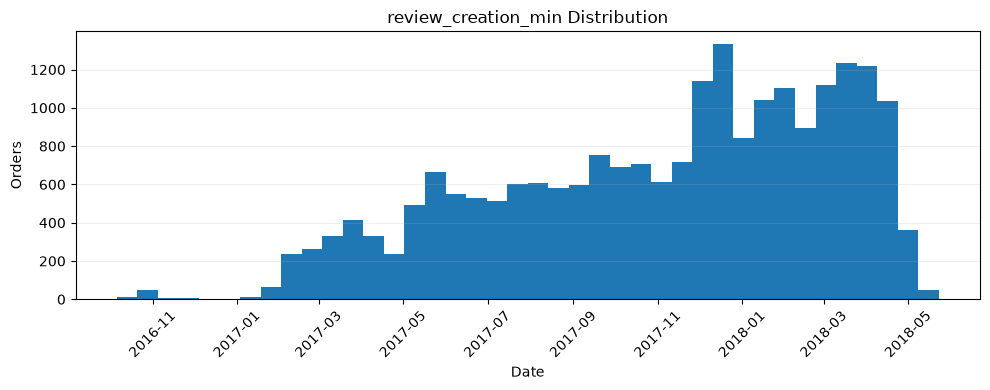

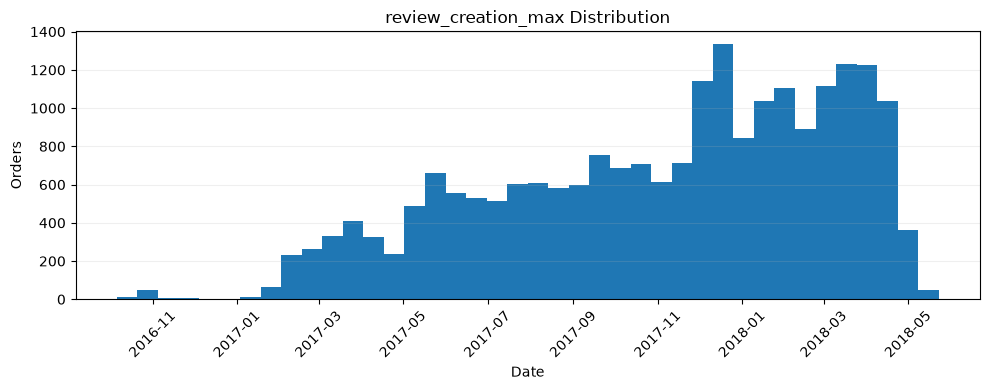

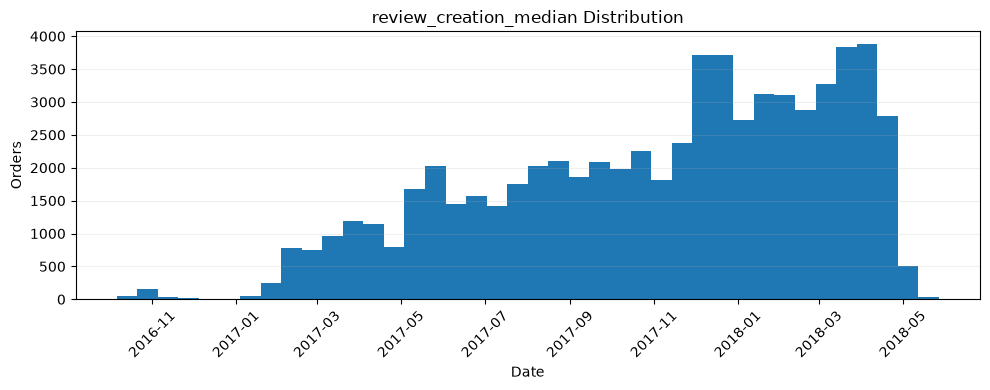

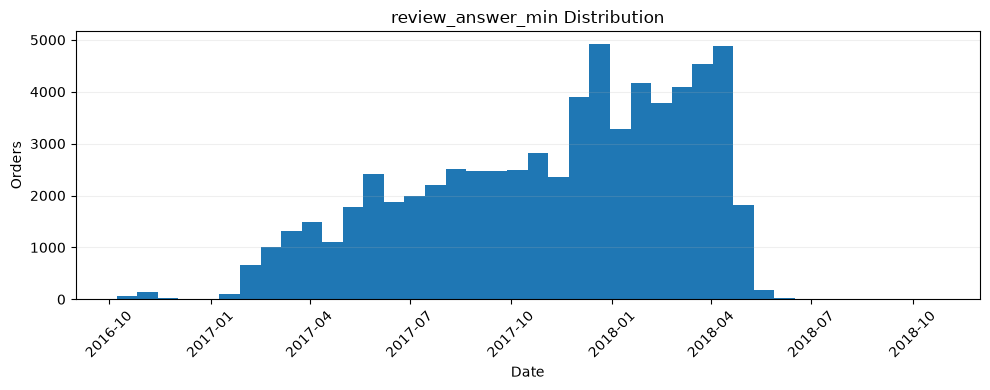

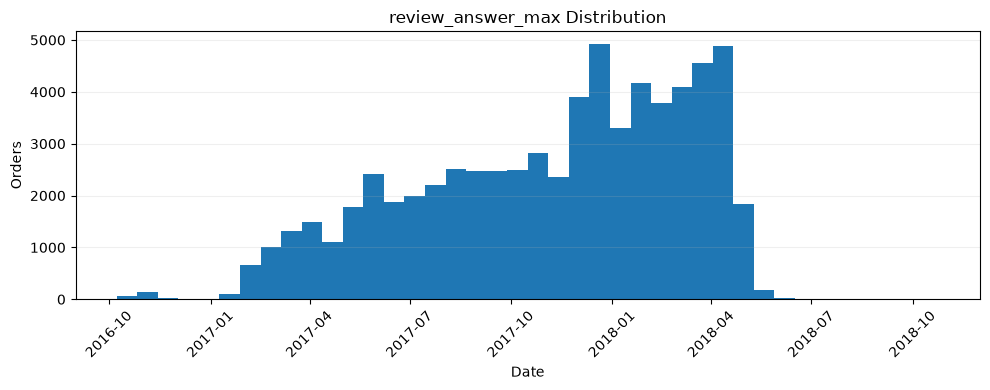

...

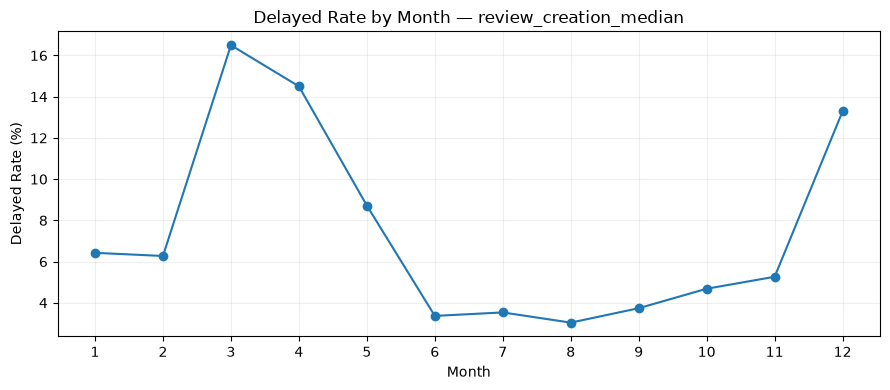

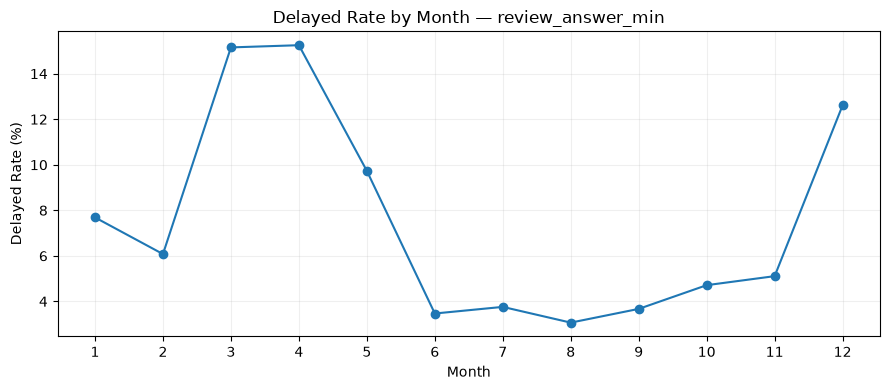

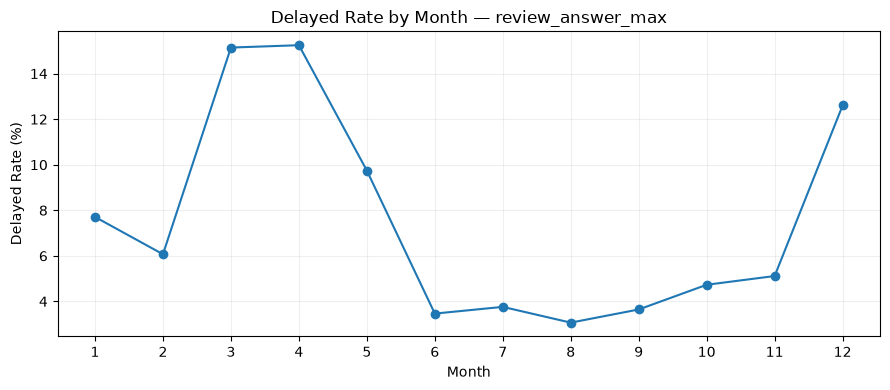

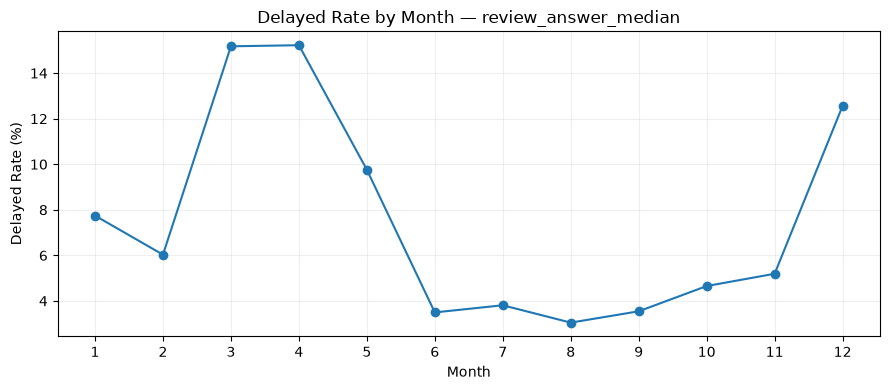

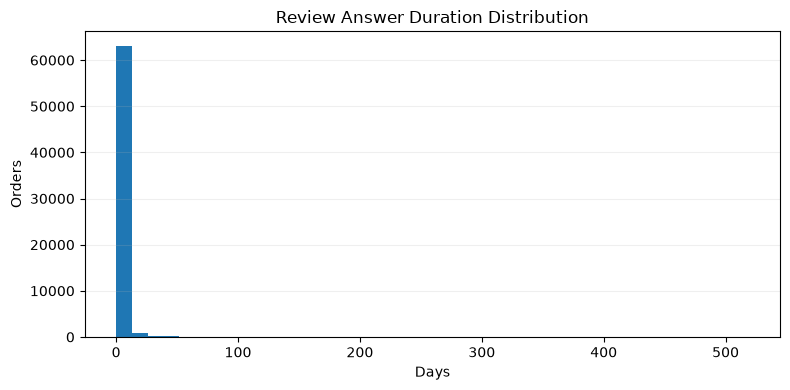

In [146]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# REVIEW DATE FEATURES — EDA
# ============================================================

review_date_cols = [
    "review_creation_min",
    "review_creation_max",
    "review_creation_median",
    "review_answer_min",
    "review_answer_max",
    "review_answer_median"
]

target = "delayed"

# ============================================================
# Convert to datetime
# ============================================================

for col in review_date_cols:
    train[col] = pd.to_datetime(
        train[col],
        errors="coerce"
    )

# ============================================================
# Basic information
# ============================================================

print("=" * 90)
print("REVIEW DATE FEATURES — BASIC INFORMATION")
print("=" * 90)

summary = pd.DataFrame(index=review_date_cols)

summary["missing"] = train[review_date_cols].isna().sum()
summary["missing_%"] = (
    train[review_date_cols].isna().mean() * 100
).round(2)

summary["unique"] = train[review_date_cols].nunique()

summary["min_date"] = train[review_date_cols].min()
summary["max_date"] = train[review_date_cols].max()

display(summary)

# ============================================================
# Date coverage
# ============================================================

print("\n" + "=" * 90)
print("DATE COVERAGE")
print("=" * 90)

for col in review_date_cols:
    print(
        f"{col:30} "
        f"{train[col].min()}  →  {train[col].max()}"
    )

# ============================================================
# Relationship with target — year
# ============================================================

print("\n" + "=" * 90)
print("DELAYED RATE BY REVIEW YEAR")
print("=" * 90)

for col in review_date_cols:

    temp = train[[col, target]].dropna().copy()

    temp["year"] = temp[col].dt.year

    yearly = (
        temp.groupby("year")[target]
        .agg(
            count="count",
            delayed="sum",
            delayed_rate="mean"
        )
    )

    yearly["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    display(yearly.round(2))

# ============================================================
# Relationship with target — month
# ============================================================

print("\n" + "=" * 90)
print("DELAYED RATE BY REVIEW MONTH")
print("=" * 90)

for col in review_date_cols:

    temp = train[[col, target]].dropna().copy()

    temp["month"] = temp[col].dt.month

    monthly = (
        temp.groupby("month")[target]
        .agg(
            count="count",
            delayed="sum",
            delayed_rate="mean"
        )
    )

    monthly["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    display(monthly.round(2))

# ============================================================
# Relationship with target — weekday
# ============================================================

print("\n" + "=" * 90)
print("DELAYED RATE BY REVIEW WEEKDAY")
print("=" * 90)

for col in review_date_cols:

    temp = train[[col, target]].dropna().copy()

    temp["weekday"] = temp[col].dt.day_name()

    weekday_order = [
        "Monday",
        "Tuesday",
        "Wednesday",
        "Thursday",
        "Friday",
        "Saturday",
        "Sunday"
    ]

    temp["weekday"] = pd.Categorical(
        temp["weekday"],
        categories=weekday_order,
        ordered=True
    )

    weekday = (
        temp.groupby("weekday", observed=False)[target]
        .agg(
            count="count",
            delayed="sum",
            delayed_rate="mean"
        )
    )

    weekday["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    display(weekday.round(2))

# ============================================================
# Review creation → review answer duration
# ============================================================

print("\n" + "=" * 90)
print("REVIEW CREATION → ANSWER DURATION")
print("=" * 90)

train["review_answer_duration_days"] = (
    train["review_answer_median"]
    -
    train["review_creation_median"]
).dt.total_seconds() / (24 * 3600)

duration = train["review_answer_duration_days"]

print("\n--- DURATION STATISTICS ---")

display(
    duration.describe().to_frame("value").round(2)
)

print(f"Missing: {duration.isna().sum():,}")

# Negative durations are logically invalid
negative_duration = (duration < 0).sum()

print(f"Negative durations: {negative_duration:,}")

# ============================================================
# Duration vs target
# ============================================================

print("\n" + "=" * 90)
print("REVIEW ANSWER DURATION vs TARGET")
print("=" * 90)

duration_target = (
    train.groupby(target)["review_answer_duration_days"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    )
)

display(duration_target.round(2))

# ============================================================
# Correlation with target
# ============================================================

print("\n" + "=" * 90)
print("CORRELATION WITH TARGET")
print("=" * 90)

correlation = {}

for col in review_date_cols:

    temp = train[[col, target]].dropna().copy()

    # Convert datetime to days since earliest date
    date_numeric = (
        temp[col] - temp[col].min()
    ).dt.total_seconds() / (24 * 3600)

    correlation[col] = date_numeric.corr(
        temp[target]
    )

# Duration correlation
correlation["review_answer_duration_days"] = (
    train[
        [
            "review_answer_duration_days",
            target
        ]
    ]
    .corr()
    .loc[
        "review_answer_duration_days",
        target
    ]
)

correlation = pd.Series(
    correlation,
    name="pearson_correlation"
).sort_values(
    ascending=False
)

display(correlation.round(4).to_frame())

# ============================================================
# Review presence / missingness vs target
# ============================================================

print("\n" + "=" * 90)
print("REVIEW DATE AVAILABILITY vs TARGET")
print("=" * 90)

train["has_review_dates"] = (
    train[review_date_cols].notna().any(axis=1)
)

availability = (
    train.groupby("has_review_dates")[target]
    .agg(
        count="count",
        delayed="sum",
        delayed_rate="mean"
    )
)

availability["delayed_rate"] *= 100

display(availability.round(2))

# ============================================================
# Plot — Review date distributions
# ============================================================

for col in review_date_cols:

    dates = train[col].dropna()

    plt.figure(figsize=(10, 4))

    plt.hist(
        dates,
        bins=40
    )

    plt.title(f"{col} Distribution")
    plt.xlabel("Date")
    plt.ylabel("Orders")
    plt.xticks(rotation=45)
    plt.grid(axis="y", alpha=0.2)

    plt.tight_layout()
    plt.show()

# ============================================================
# Plot — Delayed rate by month
# ============================================================

for col in review_date_cols:

    temp = train[[col, target]].dropna().copy()

    temp["month"] = temp[col].dt.month

    monthly_rate = (
        temp.groupby("month")[target]
        .mean() * 100
    )

    plt.figure(figsize=(9, 4))

    plt.plot(
        monthly_rate.index,
        monthly_rate.values,
        marker="o"
    )

    plt.title(f"Delayed Rate by Month — {col}")
    plt.xlabel("Month")
    plt.ylabel("Delayed Rate (%)")
    plt.xticks(range(1, 13))
    plt.grid(alpha=0.2)

    plt.tight_layout()
    plt.show()

# ============================================================
# Plot — Review answer duration
# ============================================================

plt.figure(figsize=(8, 4))

valid_duration = train[
    "review_answer_duration_days"
].dropna()

plt.hist(
    valid_duration[
        valid_duration >= 0
    ],
    bins=40
)

plt.title("Review Answer Duration Distribution")
plt.xlabel("Days")
plt.ylabel("Orders")
plt.grid(axis="y", alpha=0.2)

plt.tight_layout()
plt.show()

## shipping

SHIPPING LIMIT DATES — SUMMARY


,feature,missing,missing_%,unique,min_date,max_date
0,shipping_limit_min,0,0.000000,64123,2016-09-19 23:11:33,2020-04-09 22:35:08
1,shipping_limit_max,0,0.000000,64129,2016-09-19 23:11:33,2020-04-09 22:35:08
2,shipping_limit_median,1691,2.503961,62610,2016-09-19 23:11:33,2020-04-09 22:35:08


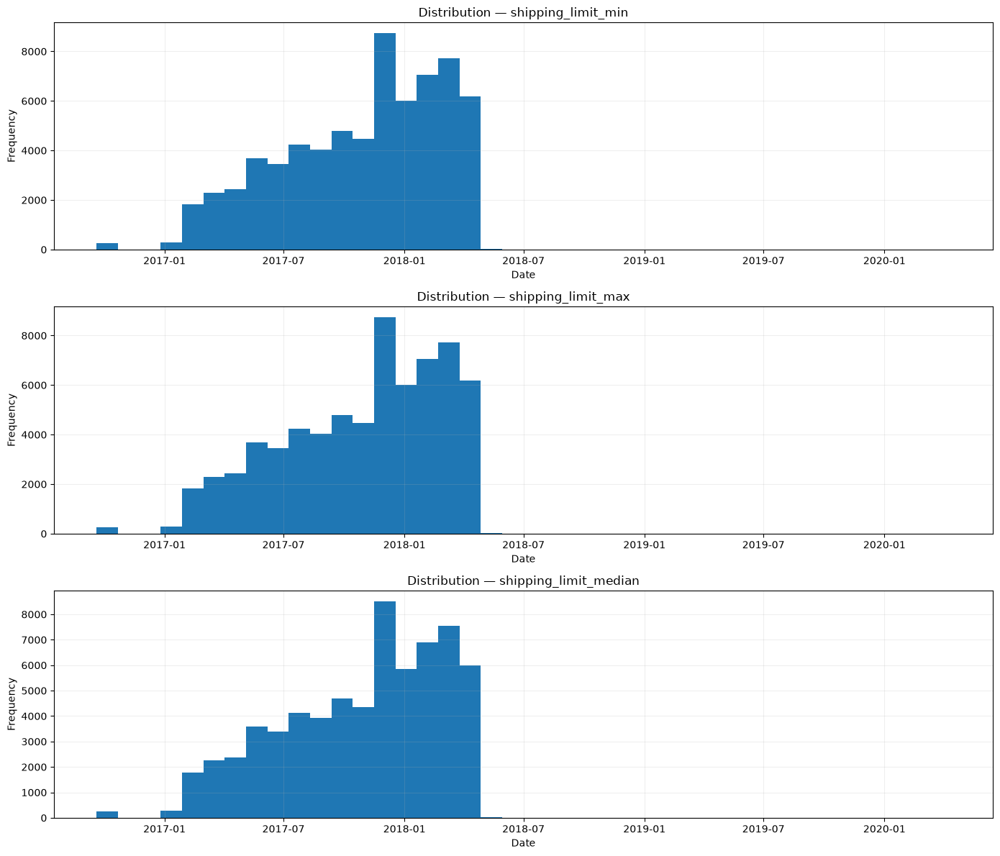


SHIPPING LIMIT DATES BY TARGET


,shipping_limit_min,shipping_limit_max,shipping_limit_median
delayed,,,
0,2017-10-22 14:40:40.879126,2017-10-22 14:45:30.526906,2017-10-22 14:15:13.404591
1,2017-12-19 23:01:38.249794,2017-12-19 23:01:38.249794,2017-12-19 19:03:41.638674



shipping_limit_min — YEAR × TARGET


delayed,0,1
year,,
2016,268,4
2017,39629,2825
2018,21538,3268
2020,1,0



shipping_limit_max — YEAR × TARGET


delayed,0,1
year,,
2016,268,4
2017,39629,2825
2018,21538,3268
2020,1,0



shipping_limit_median — YEAR × TARGET


delayed,0,1
year,,
2016,260,4
2017,38632,2753
2018,21007,3185
2020,1,0



RELATIONSHIP STRENGTH WITH TARGET

shipping_limit_min
Pearson:   0.1367
Spearman:  0.1442

shipping_limit_max
Pearson:   0.1367
Spearman:  0.1442

shipping_limit_median
Pearson:   0.1364
Spearman:  0.1440


In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

shipping_cols = [
    "shipping_limit_min",
    "shipping_limit_max",
    "shipping_limit_median"
]

target = "delayed"

# ============================================================
# Convert to datetime
# ============================================================

for col in shipping_cols:
    train[col] = pd.to_datetime(train[col], errors="coerce")


# ============================================================
# Basic summary
# ============================================================

summary = []

for col in shipping_cols:

    x = train[col].dropna()

    summary.append({
        "feature": col,
        "missing": train[col].isna().sum(),
        "missing_%": train[col].isna().mean() * 100,
        "unique": x.nunique(),
        "min_date": x.min(),
        "max_date": x.max()
    })

summary = pd.DataFrame(summary)

print("=" * 100)
print("SHIPPING LIMIT DATES — SUMMARY")
print("=" * 100)

display(summary)


# ============================================================
# Distribution over time
# ============================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(14, 12)
)

for i, col in enumerate(shipping_cols):

    dates = train[col].dropna()

    axes[i].hist(
        dates,
        bins=40
    )

    axes[i].set_title(
        f"Distribution — {col}"
    )
    axes[i].set_xlabel("Date")
    axes[i].set_ylabel("Frequency")
    axes[i].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# Relationship with target
# ============================================================

target_dates = (
    train
    .groupby(target)[shipping_cols]
    .mean()
)

print("\n" + "=" * 100)
print("SHIPPING LIMIT DATES BY TARGET")
print("=" * 100)

display(target_dates)


# ============================================================
# Year distribution by target
# ============================================================

for col in shipping_cols:

    temp = train[[col, target]].dropna().copy()

    temp["year"] = temp[col].dt.year

    yearly = (
        temp
        .groupby(["year", target])
        .size()
        .unstack(fill_value=0)
    )

    print(f"\n{col} — YEAR × TARGET")

    display(yearly)


# ============================================================
# Correlation with target
# ============================================================

print("\n" + "=" * 100)
print("RELATIONSHIP STRENGTH WITH TARGET")
print("=" * 100)

for col in shipping_cols:

    temp = train[[col, target]].dropna().copy()

    # Convert date to days from the earliest date
    temp["date_numeric"] = (
        temp[col] - train[col].min()
    ).dt.total_seconds() / (24 * 3600)

    pearson = temp["date_numeric"].corr(
        temp[target],
        method="pearson"
    )

    spearman = temp["date_numeric"].corr(
        temp[target],
        method="spearman"
    )

    print(f"\n{col}")
    print(f"Pearson:   {pearson:.4f}")
    print(f"Spearman:  {spearman:.4f}")

## Purchase


PURCHASE TIME — SUMMARY
                      count  missing  missing_%  unique                 min  \
purchase_time_min     67533        0        0.0   67155 2016-09-15 12:16:38   
purchase_time_max     67533        0        0.0   67155 2016-09-15 12:16:38   
purchase_time_median  67533        0        0.0   67155 2016-09-15 12:16:38   

                                     max  
purchase_time_min    2018-04-15 20:07:56  
purchase_time_max    2018-04-15 20:07:56  
purchase_time_median 2018-04-15 20:07:56  

PURCHASE TIME — CONSISTENCY CHECK
Invalid min <= median <= max rows: 0

PURCHASE TIME SPAN
count    67533.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: purchase_time_span_hours, dtype: float64

PURCHASE PERIOD
First purchase: 2016-09-15 12:16:38
Last purchase:  2018-04-15 20:07:56

DELAYED RATE BY PURCHASE YEAR
               orders  delayed_orders  delayed_rate
purchase_year                          

/tmp/ipykernel_63/2430506246.py:38: UserWarning: obj.round has no effect with datetime, timedelta, or period dtypes. Use obj.dt.round(...) instead.
  print(purchase_summary.round(2))


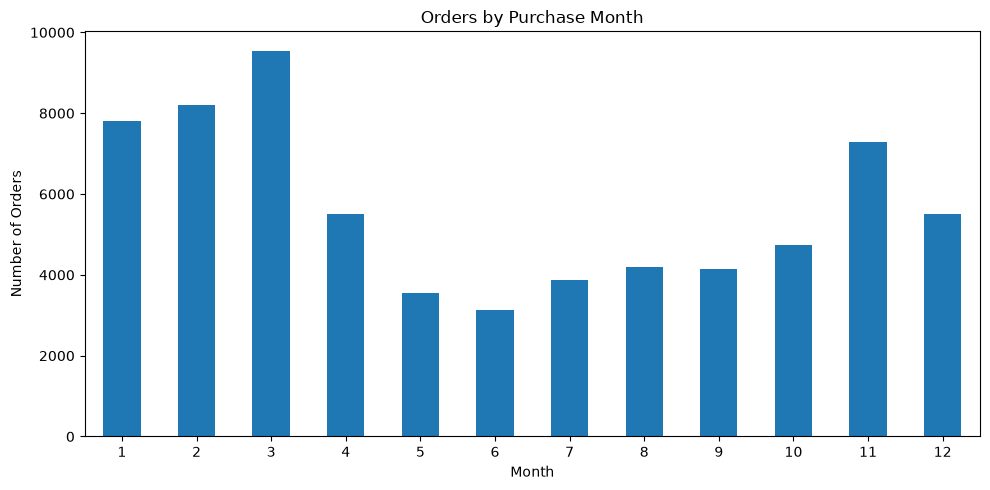

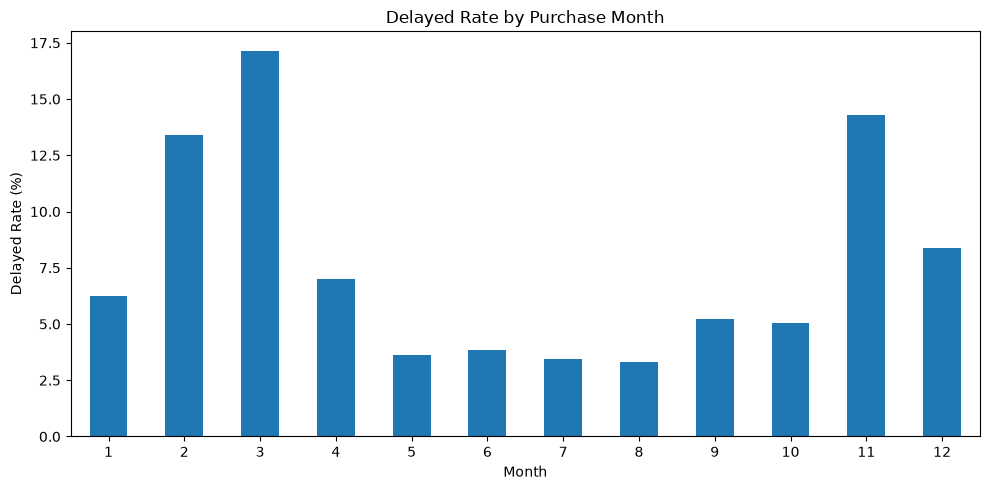

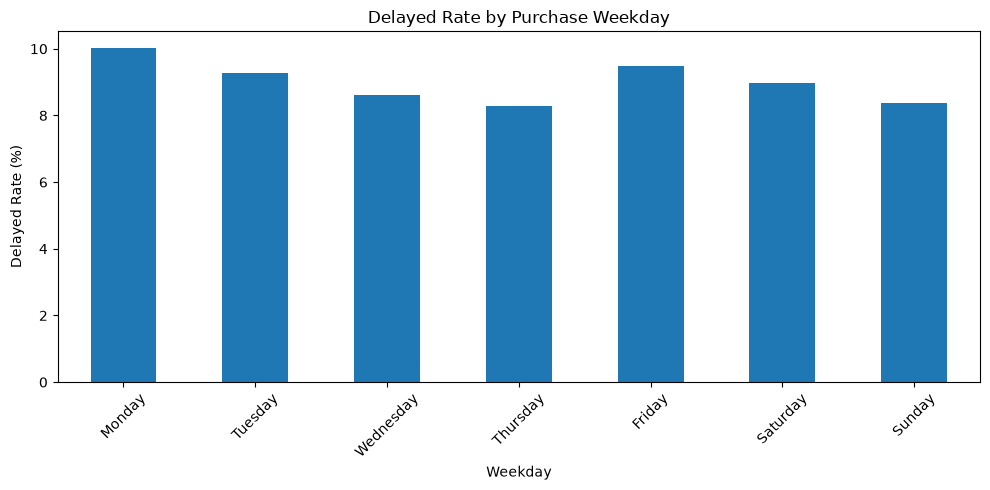

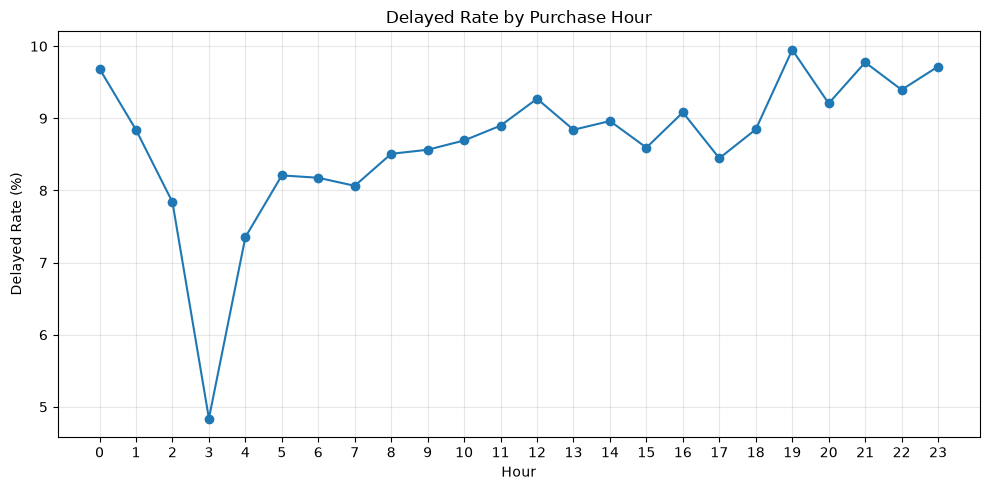

In [9]:
# ============================================================
# PURCHASE TIME — DATETIME EDA
# ============================================================

purchase_cols = [
    "purchase_time_min",
    "purchase_time_max",
    "purchase_time_median"
]

# ------------------------------------------------------------
# 1. Convert all purchase-time columns to datetime
# ------------------------------------------------------------

for col in purchase_cols:
    train[col] = pd.to_datetime(
        train[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# 2. Basic summary
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("PURCHASE TIME — SUMMARY")
print("=" * 100)

purchase_summary = pd.DataFrame({
    "count": train[purchase_cols].count(),
    "missing": train[purchase_cols].isna().sum(),
    "missing_%": train[purchase_cols].isna().mean() * 100,
    "unique": train[purchase_cols].nunique(),
    "min": train[purchase_cols].min(),
    "max": train[purchase_cols].max()
})

print(purchase_summary.round(2))

# ------------------------------------------------------------
# 3. Check consistency between min / median / max
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("PURCHASE TIME — CONSISTENCY CHECK")
print("=" * 100)

invalid_order = (
    (train["purchase_time_min"] > train["purchase_time_median"]) |
    (train["purchase_time_median"] > train["purchase_time_max"])
).sum()

print(
    f"Invalid min <= median <= max rows: "
    f"{invalid_order:,}"
)

# ------------------------------------------------------------
# 4. Purchase time span within order
# ------------------------------------------------------------

train["purchase_time_span_hours"] = (
    (
        train["purchase_time_max"]
        -
        train["purchase_time_min"]
    ).dt.total_seconds() / 3600
)

print("\n" + "=" * 100)
print("PURCHASE TIME SPAN")
print("=" * 100)

print(
    train["purchase_time_span_hours"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 5. Extract temporal features for EDA
# ------------------------------------------------------------

train["purchase_year"] = train["purchase_time_min"].dt.year
train["purchase_month"] = train["purchase_time_min"].dt.month
train["purchase_day"] = train["purchase_time_min"].dt.day
train["purchase_weekday"] = train["purchase_time_min"].dt.day_name()
train["purchase_hour"] = train["purchase_time_min"].dt.hour
train["purchase_quarter"] = train["purchase_time_min"].dt.quarter

# ------------------------------------------------------------
# 6. Purchase time range
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("PURCHASE PERIOD")
print("=" * 100)

print(
    f"First purchase: "
    f"{train['purchase_time_min'].min()}"
)

print(
    f"Last purchase:  "
    f"{train['purchase_time_max'].max()}"
)

# ------------------------------------------------------------
# 7. Delayed rate by purchase year
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELAYED RATE BY PURCHASE YEAR")
print("=" * 100)

year_delay = (
    train.groupby("purchase_year")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
)

year_delay["delayed_rate"] *= 100

print(year_delay.round(2))

# ------------------------------------------------------------
# 8. Delayed rate by purchase month
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELAYED RATE BY PURCHASE MONTH")
print("=" * 100)

month_delay = (
    train.groupby("purchase_month")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
)

month_delay["delayed_rate"] *= 100

print(month_delay.round(2))

# ------------------------------------------------------------
# 9. Delayed rate by weekday
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELAYED RATE BY PURCHASE WEEKDAY")
print("=" * 100)

weekday_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday"
]

weekday_delay = (
    train.groupby("purchase_weekday")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
    .reindex(weekday_order)
)

weekday_delay["delayed_rate"] *= 100

print(weekday_delay.round(2))

# ------------------------------------------------------------
# 10. Delayed rate by purchase hour
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELAYED RATE BY PURCHASE HOUR")
print("=" * 100)

hour_delay = (
    train.groupby("purchase_hour")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
)

hour_delay["delayed_rate"] *= 100

print(hour_delay.round(2))

# ------------------------------------------------------------
# 11. Visualizations
# ------------------------------------------------------------

import matplotlib.pyplot as plt

# Purchase month distribution
plt.figure(figsize=(10, 5))
train["purchase_month"].value_counts().sort_index().plot(kind="bar")
plt.title("Orders by Purchase Month")
plt.xlabel("Month")
plt.ylabel("Number of Orders")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Delayed rate by month
plt.figure(figsize=(10, 5))
month_delay["delayed_rate"].plot(kind="bar")
plt.title("Delayed Rate by Purchase Month")
plt.xlabel("Month")
plt.ylabel("Delayed Rate (%)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Delayed rate by weekday
plt.figure(figsize=(10, 5))
weekday_delay["delayed_rate"].plot(kind="bar")
plt.title("Delayed Rate by Purchase Weekday")
plt.xlabel("Weekday")
plt.ylabel("Delayed Rate (%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Delayed rate by hour
plt.figure(figsize=(10, 5))
hour_delay["delayed_rate"].plot(kind="line", marker="o")
plt.title("Delayed Rate by Purchase Hour")
plt.xlabel("Hour")
plt.ylabel("Delayed Rate (%)")
plt.xticks(range(24))
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [10]:
# ================================================================
# PURCHASE TIME — EDA
# ================================================================

purchase_cols = [
    "purchase_time_min",
    "purchase_time_max",
    "purchase_time_median"
]

price_freight_cols = [
    "total_price",
    "min_price",
    "total_freight",
    "min_freight"
]

# ------------------------------------------------
# 1. DATETIME CONVERSION — WITHOUT MODIFYING TRAIN
# ------------------------------------------------

purchase = train[purchase_cols].copy()

for col in purchase_cols:
    purchase[col] = pd.to_datetime(purchase[col], errors="coerce")


# ------------------------------------------------
# 2. BASIC INFORMATION
# ------------------------------------------------

print("=" * 80)
print("PURCHASE TIME — BASIC INFO")
print("=" * 80)

for col in purchase_cols:
    s = purchase[col]

    print(f"\n{col}")
    print(f"  Missing       : {s.isna().sum()}")
    print(f"  Unique        : {s.nunique(dropna=True):,}")
    print(f"  Min           : {s.min()}")
    print(f"  Max           : {s.max()}")
    print(f"  Median        : {s.median()}")


# ------------------------------------------------
# 3. TEMPORAL CONSISTENCY
# ------------------------------------------------

print("\n" + "=" * 80)
print("PURCHASE TIME — CONSISTENCY")
print("=" * 80)

invalid_min_max = purchase["purchase_time_min"] > purchase["purchase_time_max"]
invalid_min_median = purchase["purchase_time_median"] < purchase["purchase_time_min"]
invalid_median_max = purchase["purchase_time_median"] > purchase["purchase_time_max"]

print(f"min > max           : {invalid_min_max.sum():,}")
print(f"median < min        : {invalid_min_median.sum():,}")
print(f"median > max        : {invalid_median_max.sum():,}")


# ------------------------------------------------
# 4. DURATION BETWEEN PURCHASE TIMES
# ------------------------------------------------

purchase["min_max_hours"] = (
    purchase["purchase_time_max"] -
    purchase["purchase_time_min"]
).dt.total_seconds() / 3600

purchase["min_median_hours"] = (
    purchase["purchase_time_median"] -
    purchase["purchase_time_min"]
).dt.total_seconds() / 3600

purchase["median_max_hours"] = (
    purchase["purchase_time_max"] -
    purchase["purchase_time_median"]
).dt.total_seconds() / 3600

print("\n" + "=" * 80)
print("PURCHASE TIME — TIME SPANS")
print("=" * 80)

for col in [
    "min_max_hours",
    "min_median_hours",
    "median_max_hours"
]:
    print(
        f"{col:25} | "
        f"min={purchase[col].min():.4f} | "
        f"median={purchase[col].median():.4f} | "
        f"max={purchase[col].max():.4f}"
    )

print("\nNegative durations:")
for col in [
    "min_max_hours",
    "min_median_hours",
    "median_max_hours"
]:
    print(f"{col:25}: {(purchase[col] < 0).sum():,}")


# ------------------------------------------------
# 5. DUPLICATE / FREQUENCY CHECK
# ------------------------------------------------

print("\n" + "=" * 80)
print("PURCHASE TIME — DUPLICATES")
print("=" * 80)

for col in purchase_cols:
    counts = purchase[col].value_counts(dropna=False)

    print(f"\n{col}")
    print(f"  Unique values : {len(counts):,}")
    print(f"  Repeated      : {(counts > 1).sum():,}")
    print(f"  Appears once  : {(counts == 1).sum():,}")
    print(f"  Max frequency : {counts.max():,}")


# ------------------------------------------------
# 6. CONVERT DATETIME → NUMERIC FOR CORRELATION
# ------------------------------------------------
# Seconds since Unix epoch.
# This is only for statistical analysis.

purchase_numeric = pd.DataFrame(index=train.index)

for col in purchase_cols:
    purchase_numeric[col] = purchase[col].astype("int64") / 10**9

purchase_numeric = purchase_numeric.replace(
    [-np.inf, np.inf],
    np.nan
)


# ------------------------------------------------
# 7. CORRELATION WITH TARGETS
# ------------------------------------------------

print("\n" + "=" * 80)
print("PURCHASE TIME — CORRELATION WITH TARGET")
print("=" * 80)

for col in purchase_cols:

    p_delayed = purchase_numeric[col].corr(
        train["delayed"]
    )

    s_delayed = purchase_numeric[col].corr(
        train["delayed"],
        method="spearman"
    )

    p_days = purchase_numeric[col].corr(
        train["delay_days"]
    )

    s_days = purchase_numeric[col].corr(
        train["delay_days"],
        method="spearman"
    )

    print(
        f"{col:25} | "
        f"delayed Pearson: {p_delayed:.5f} | "
        f"Spearman: {s_delayed:.5f} | "
        f"delay_days Pearson: {p_days:.5f} | "
        f"Spearman: {s_days:.5f}"
    )


# ------------------------------------------------
# 8. IQR OUTLIERS
# ------------------------------------------------
# For datetime converted to seconds.
# This identifies statistically extreme dates,
# NOT incorrect dates.

print("\n" + "=" * 80)
print("PURCHASE TIME — IQR OUTLIERS")
print("=" * 80)

purchase_outlier_masks = {}

for col in purchase_cols:

    s = purchase_numeric[col].dropna()

    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (
        (purchase_numeric[col] < lower) |
        (purchase_numeric[col] > upper)
    )

    purchase_outlier_masks[col] = outlier

    print(
        f"{col:25} | "
        f"Q1={pd.to_datetime(q1, unit='s')} | "
        f"Q3={pd.to_datetime(q3, unit='s')} | "
        f"Outliers={outlier.sum():,}"
    )


# ------------------------------------------------
# 9. TARGET DISTRIBUTION BY PURCHASE TIME QUARTILES
# ------------------------------------------------

print("\n" + "=" * 80)
print("DELAY RATE BY PURCHASE TIME QUARTILES")
print("=" * 80)

for col in purchase_cols:

    temp = pd.DataFrame({
        "feature": purchase_numeric[col],
        "delayed": train["delayed"],
        "delay_days": train["delay_days"]
    }).dropna()

    temp["quartile"] = pd.qcut(
        temp["feature"],
        q=4,
        duplicates="drop"
    )

    result = temp.groupby(
        "quartile",
        observed=True
    ).agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )

    result["delayed_rate"] *= 100

    print(f"\n{col}")
    print(result.round(3).to_string())


# ------------------------------------------------
# 10. REMOVE NON-DELAYED PRICE + FREIGHT OUTLIERS
#     ONLY FOR SENSITIVITY ANALYSIS
# ------------------------------------------------

remove_mask = pd.Series(False, index=train.index)

for col in price_freight_cols:

    s = train[col]

    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (
        (s < lower) |
        (s > upper)
    )

    remove_mask |= (
        outlier &
        (train["delayed"] == 0)
    )

clean = train.loc[~remove_mask].copy()


# ------------------------------------------------
# 11. CORRELATION BEFORE → AFTER PRICE/FREIGHT
# ------------------------------------------------

print("\n" + "=" * 80)
print("PURCHASE CORRELATION — BEFORE → AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

for col in purchase_cols:

    clean_purchase = pd.to_datetime(
        clean[col],
        errors="coerce"
    )

    clean_numeric = (
        clean_purchase.astype("int64") / 10**9
    )

    before_delayed = purchase_numeric[col].corr(
        train["delayed"]
    )

    after_delayed = clean_numeric.corr(
        clean["delayed"]
    )

    before_days = purchase_numeric[col].corr(
        train["delay_days"]
    )

    after_days = clean_numeric.corr(
        clean["delay_days"]
    )

    print(
        f"{col:25} | "
        f"delayed: {before_delayed:.5f} → {after_delayed:.5f} | "
        f"delay_days: {before_days:.5f} → {after_days:.5f}"
    )


# ------------------------------------------------
# 12. HOW MANY PURCHASE OUTLIERS REMAIN?
#     USING ORIGINAL IQR BOUNDS
# ------------------------------------------------

print("\n" + "=" * 80)
print("REMAINING PURCHASE OUTLIERS AFTER PRICE + FREIGHT CLEANING")
print("=" * 80)

for col in purchase_cols:

    s_original = purchase_numeric[col].dropna()

    q1, q3 = s_original.quantile([0.25, 0.75])
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    clean_purchase_numeric = (
        pd.to_datetime(
            clean[col],
            errors="coerce"
        ).astype("int64") / 10**9
    )

    remaining_outliers = (
        (clean_purchase_numeric < lower) |
        (clean_purchase_numeric > upper)
    )

    print(
        f"{col:25} | "
        f"Original: {purchase_outlier_masks[col].sum():,} | "
        f"Remaining: {remaining_outliers.sum():,}"
    )


# ------------------------------------------------
# 13. SUMMARY
# ------------------------------------------------

print("\n" + "=" * 80)
print("SUMMARY")
print("=" * 80)

print(f"Original rows : {len(train):,}")
print(f"Removed rows  : {remove_mask.sum():,}")
print(f"Remaining     : {len(clean):,}")
print(f"Removed %     : {remove_mask.mean() * 100:.2f}%")

PURCHASE TIME — BASIC INFO

purchase_time_min
  Missing       : 0
  Unique        : 67,155
  Min           : 2016-09-15 12:16:38
  Max           : 2018-04-15 20:07:56
  Median        : 2017-11-18 22:53:19

purchase_time_max
  Missing       : 0
  Unique        : 67,155
  Min           : 2016-09-15 12:16:38
  Max           : 2018-04-15 20:07:56
  Median        : 2017-11-18 22:53:19

purchase_time_median
  Missing       : 0
  Unique        : 67,155
  Min           : 2016-09-15 12:16:38
  Max           : 2018-04-15 20:07:56
  Median        : 2017-11-18 22:53:19

PURCHASE TIME — CONSISTENCY
min > max           : 0
median < min        : 0
median > max        : 0

PURCHASE TIME — TIME SPANS
min_max_hours             | min=0.0000 | median=0.0000 | max=0.0000
min_median_hours          | min=0.0000 | median=0.0000 | max=0.0000
median_max_hours          | min=0.0000 | median=0.0000 | max=0.0000

Negative durations:
min_max_hours            : 0
min_median_hours         : 0
median_max_hours        

In [11]:
# ================================================================
# PURCHASE TIME — TEMPORAL FEATURES ANALYSIS
# ================================================================

purchase = pd.to_datetime(
    train["purchase_time_min"],
    errors="coerce"
)

temp = pd.DataFrame(index=train.index)

temp["purchase_year"] = purchase.dt.year
temp["purchase_month"] = purchase.dt.month
temp["purchase_weekday"] = purchase.dt.weekday
temp["purchase_hour"] = purchase.dt.hour
temp["purchase_quarter"] = purchase.dt.quarter

# ================================================================
# 1. BASIC DISTRIBUTION
# ================================================================

print("=" * 80)
print("TEMPORAL FEATURES — DISTRIBUTION")
print("=" * 80)

for col in temp.columns:
    print(f"\n{col}")
    print(temp[col].value_counts().sort_index().to_string())


# ================================================================
# 2. CORRELATION WITH TARGETS
# ================================================================

print("\n" + "=" * 80)
print("TEMPORAL FEATURES — CORRELATION")
print("=" * 80)

for col in temp.columns:

    pearson_delayed = temp[col].corr(train["delayed"])
    spearman_delayed = temp[col].corr(
        train["delayed"],
        method="spearman"
    )

    pearson_days = temp[col].corr(train["delay_days"])
    spearman_days = temp[col].corr(
        train["delay_days"],
        method="spearman"
    )

    print(
        f"{col:20} | "
        f"delayed: Pearson={pearson_delayed:.5f}, "
        f"Spearman={spearman_delayed:.5f} | "
        f"delay_days: Pearson={pearson_days:.5f}, "
        f"Spearman={spearman_days:.5f}"
    )


# ================================================================
# 3. DELAY DISTRIBUTION BY EACH TEMPORAL FEATURE
# ================================================================

print("\n" + "=" * 80)
print("DELAY DISTRIBUTION BY TEMPORAL FEATURES")
print("=" * 80)

for col in temp.columns:

    result = pd.DataFrame({
        col: temp[col],
        "delayed": train["delayed"],
        "delay_days": train["delay_days"]
    }).groupby(col).agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )

    result["delayed_rate"] *= 100

    print(f"\n--- {col} ---")
    print(result.round(3).to_string())


# ================================================================
# 4. IQR OUTLIERS OF ORIGINAL PURCHASE TIMESTAMP
# ================================================================

purchase_numeric = purchase.astype("int64") / 10**9

q1, q3 = purchase_numeric.quantile([0.25, 0.75])
iqr = q3 - q1

lower = q1 - 1.5 * iqr
upper = q3 + 1.5 * iqr

purchase_outlier = (
    (purchase_numeric < lower) |
    (purchase_numeric > upper)
)

print("\n" + "=" * 80)
print("PURCHASE TIME OUTLIERS")
print("=" * 80)

print(f"Q1                  : {pd.to_datetime(q1, unit='s')}")
print(f"Q3                  : {pd.to_datetime(q3, unit='s')}")
print(f"Lower bound         : {pd.to_datetime(lower, unit='s')}")
print(f"Upper bound         : {pd.to_datetime(upper, unit='s')}")
print(f"Outliers            : {purchase_outlier.sum():,}")
print(f"Outlier percentage  : {purchase_outlier.mean() * 100:.3f}%")


# ================================================================
# 5. WHO ARE THE 99 OUTLIERS?
# ================================================================

print("\n" + "=" * 80)
print("PURCHASE TIME OUTLIERS — TARGET DISTRIBUTION")
print("=" * 80)

outlier_target = train.loc[purchase_outlier, [
    "delayed",
    "delay_days"
]].agg({
    "delayed": ["count", "sum", "mean"],
    "delay_days": ["mean", "median", "min", "max"]
})

print(outlier_target)


# ================================================================
# 6. CREATE CLEAN DATASET — REMOVE ONLY PURCHASE TIME OUTLIERS
# ================================================================

clean_purchase = train.loc[~purchase_outlier].copy()

clean_purchase_time = pd.to_datetime(
    clean_purchase["purchase_time_min"],
    errors="coerce"
)

clean_temp = pd.DataFrame(index=clean_purchase.index)

clean_temp["purchase_year"] = clean_purchase_time.dt.year
clean_temp["purchase_month"] = clean_purchase_time.dt.month
clean_temp["purchase_weekday"] = clean_purchase_time.dt.weekday
clean_temp["purchase_hour"] = clean_purchase_time.dt.hour
clean_temp["purchase_quarter"] = clean_purchase_time.dt.quarter


# ================================================================
# 7. TARGET DISTRIBUTION BEFORE → AFTER
# ================================================================

print("\n" + "=" * 80)
print("TARGET DISTRIBUTION — BEFORE → AFTER REMOVING PURCHASE OUTLIERS")
print("=" * 80)

print(
    f"Rows       : {len(train):,} → {len(clean_purchase):,}"
)

print(
    f"Delayed    : {train['delayed'].sum():,} → "
    f"{clean_purchase['delayed'].sum():,}"
)

print(
    f"Delayed %  : {train['delayed'].mean()*100:.3f}% → "
    f"{clean_purchase['delayed'].mean()*100:.3f}%"
)

print(
    f"Mean delay : {train['delay_days'].mean():.3f} → "
    f"{clean_purchase['delay_days'].mean():.3f}"
)


# ================================================================
# 8. CORRELATION BEFORE → AFTER REMOVING THE 99 OUTLIERS
# ================================================================

print("\n" + "=" * 80)
print("TEMPORAL CORRELATION — BEFORE → AFTER")
print("=" * 80)

for col in temp.columns:

    before_delayed = temp[col].corr(
        train["delayed"]
    )

    after_delayed = clean_temp[col].corr(
        clean_purchase["delayed"]
    )

    before_days = temp[col].corr(
        train["delay_days"]
    )

    after_days = clean_temp[col].corr(
        clean_purchase["delay_days"]
    )

    print(
        f"{col:20} | "
        f"delayed: {before_delayed:.5f} → {after_delayed:.5f} | "
        f"delay_days: {before_days:.5f} → {after_days:.5f}"
    )


# ================================================================
# 9. DELAY RATE BEFORE → AFTER
# ================================================================

print("\n" + "=" * 80)
print("DELAY RATE — BEFORE → AFTER PURCHASE OUTLIER REMOVAL")
print("=" * 80)

for col in temp.columns:

    before = pd.DataFrame({
        col: temp[col],
        "delayed": train["delayed"],
        "delay_days": train["delay_days"]
    }).groupby(col).agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean")
    )

    after = pd.DataFrame({
        col: clean_temp[col],
        "delayed": clean_purchase["delayed"],
        "delay_days": clean_purchase["delay_days"]
    }).groupby(col).agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean")
    )

    before["delayed_rate"] *= 100
    after["delayed_rate"] *= 100

    print(f"\n--- {col} ---")

    comparison = before[[
        "orders",
        "delayed_rate",
        "avg_delay_days"
    ]].join(
        after[[
            "orders",
            "delayed_rate",
            "avg_delay_days"
        ]],
        lsuffix="_before",
        rsuffix="_after"
    )

    print(comparison.round(3).to_string())


# ================================================================
# 10. HOW MANY OUTLIERS REMAIN IN TEMPORAL FEATURES?
# ================================================================

print("\n" + "=" * 80)
print("SUMMARY")
print("=" * 80)

print(f"Original rows       : {len(train):,}")
print(f"Purchase outliers   : {purchase_outlier.sum():,}")
print(f"Remaining rows      : {len(clean_purchase):,}")
print(f"Removed %           : {purchase_outlier.mean()*100:.3f}%")

TEMPORAL FEATURES — DISTRIBUTION

purchase_year
purchase_year
2016      272
2017    43426
2018    23835

purchase_month
purchase_month
1     7819
2     8209
3     9549
4     5510
5     3545
6     3135
7     3872
8     4193
9     4151
10    4748
11    7288
12    5514

purchase_weekday
purchase_weekday
0    10736
1    10729
2    10339
3    10005
4     9885
5     7594
6     8245

purchase_hour
purchase_hour
0     1662
1      837
2      370
3      186
4      136
5      134
6      318
7      806
8     1951
9     3211
10    4187
11    4450
12    4023
13    4411
14    4541
15    4445
16    4470
17    4191
18    3877
19    4060
20    4138
21    4194
22    4023
23    2912

purchase_quarter
purchase_quarter
1    25577
2    12190
3    12216
4    17550

TEMPORAL FEATURES — CORRELATION
purchase_year        | delayed: Pearson=0.11545, Spearman=0.11550 | delay_days: Pearson=0.15058, Spearman=0.14915
purchase_month       | delayed: Pearson=-0.03407, Spearman=-0.03215 | delay_days: Pearson=0.00887, Spe

## Approval


APPROVAL TIME — SUMMARY
                      count  missing  missing_%  unique                 min  \
approval_time_min     67519       14   0.020731   63153 2016-09-15 12:16:38   
approval_time_max     67519       14   0.020731   63153 2016-09-15 12:16:38   
approval_time_median  67519       14   0.020731   63153 2016-09-15 12:16:38   

                                     max  
approval_time_min    2018-04-24 18:04:50  
approval_time_max    2018-04-24 18:04:50  
approval_time_median 2018-04-24 18:04:50  

APPROVAL TIME — CONSISTENCY CHECK
Invalid min <= median <= max rows: 0

PURCHASE → APPROVAL TIME
count    67519.00
mean         9.93
std         20.42
min          0.00
25%          0.21
50%          0.31
75%         13.45
max        741.44
Name: purchase_to_approval_hours, dtype: float64

Negative purchase → approval durations: 0

DELAYED RATE BY APPROVAL HOUR
               orders  delayed_orders  delayed_rate
approval_hour                                      
0.0              

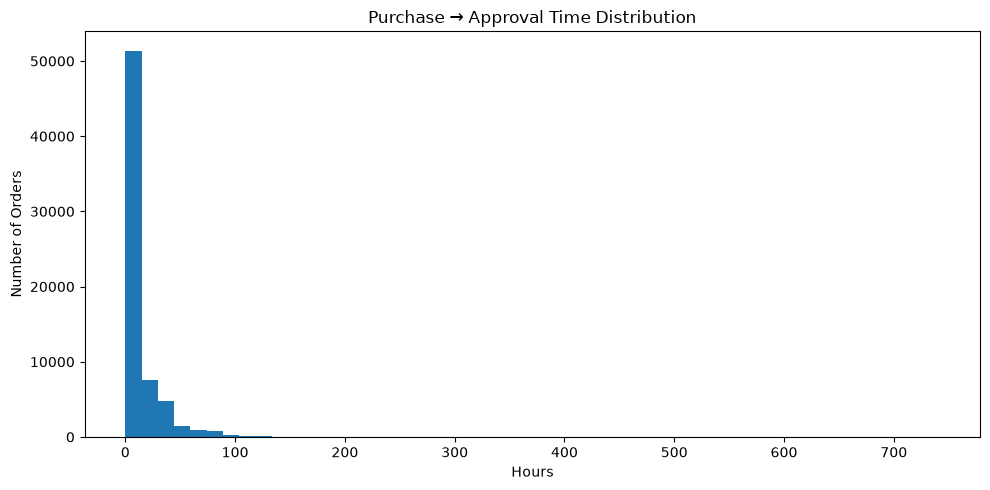

<Figure size 800x500 with 0 Axes>

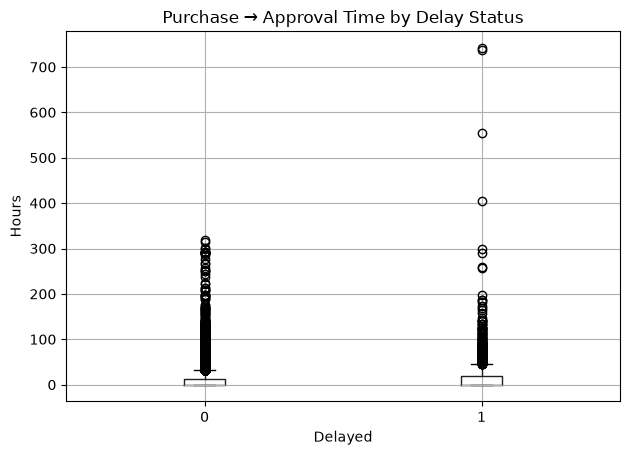

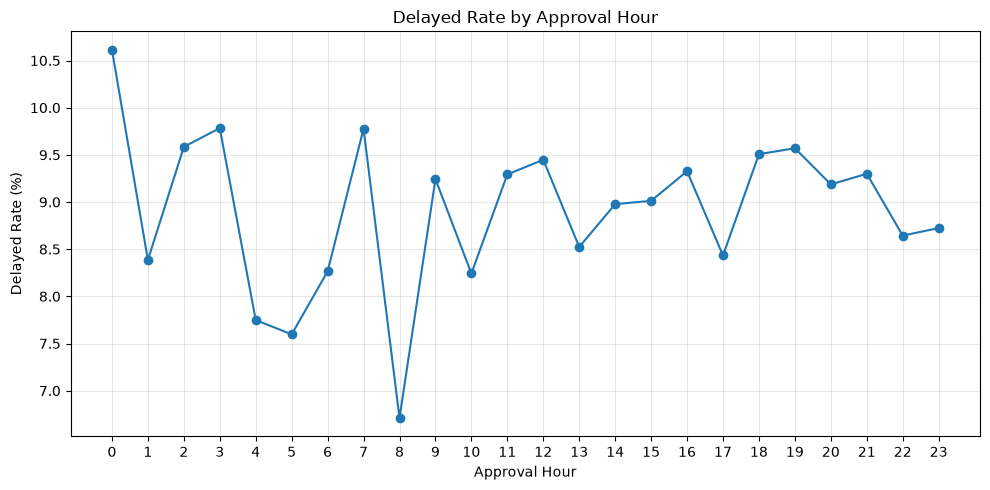

In [13]:
# ============================================================
# APPROVAL TIME — DATETIME EDA
# ============================================================

approval_cols = [
    "approval_time_min",
    "approval_time_max",
    "approval_time_median"
]

# ------------------------------------------------------------
# 1. Convert to datetime
# ------------------------------------------------------------

for col in approval_cols:
    train[col] = pd.to_datetime(
        train[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# 2. Basic summary
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("APPROVAL TIME — SUMMARY")
print("=" * 100)

approval_summary = pd.DataFrame({
    "count": train[approval_cols].count(),
    "missing": train[approval_cols].isna().sum(),
    "missing_%": train[approval_cols].isna().mean() * 100,
    "unique": train[approval_cols].nunique(),
    "min": train[approval_cols].min(),
    "max": train[approval_cols].max()
})

print(approval_summary)

# ------------------------------------------------------------
# 3. Consistency check
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("APPROVAL TIME — CONSISTENCY CHECK")
print("=" * 100)

invalid_order = (
    (train["approval_time_min"] > train["approval_time_median"]) |
    (train["approval_time_median"] > train["approval_time_max"])
).sum()

print(
    f"Invalid min <= median <= max rows: "
    f"{invalid_order:,}"
)

# ------------------------------------------------------------
# 4. Approval time span
# ------------------------------------------------------------

train["approval_time_span_hours"] = (
    (
        train["approval_time_max"]
        -
        train["approval_time_min"]
    ).dt.total_seconds() / 3600
)

# print("\n" + "=" * 100)
# print("APPROVAL TIME SPAN")
# print("=" * 100)

# print(
#     train["approval_time_span_hours"]
#     .describe()
#     .round(2)
# )

# ------------------------------------------------------------
# 5. Purchase → Approval time
# ------------------------------------------------------------

train["purchase_to_approval_hours"] = (
    (
        train["approval_time_median"]
        -
        train["purchase_time_median"]
    ).dt.total_seconds() / 3600
)

print("\n" + "=" * 100)
print("PURCHASE → APPROVAL TIME")
print("=" * 100)

print(
    train["purchase_to_approval_hours"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 6. Invalid / negative durations
# ------------------------------------------------------------

negative_duration = (
    train["purchase_to_approval_hours"] < 0
).sum()

print(
    f"\nNegative purchase → approval durations: "
    f"{negative_duration:,}"
)

# ------------------------------------------------------------
# 7. Approval hour
# ------------------------------------------------------------

train["approval_hour"] = (
    train["approval_time_median"].dt.hour
)

hour_delay = (
    train.groupby("approval_hour")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
)

hour_delay["delayed_rate"] *= 100

print("\n" + "=" * 100)
print("DELAYED RATE BY APPROVAL HOUR")
print("=" * 100)

print(hour_delay.round(2))

# ------------------------------------------------------------
# 8. Purchase → Approval vs Delayed
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("PURCHASE → APPROVAL VS DELAY")
print("=" * 100)

approval_delay_comparison = (
    train.groupby("delayed")["purchase_to_approval_hours"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    )
)

print(
    approval_delay_comparison.round(2)
)

# ------------------------------------------------------------
# 9. Visualization
# ------------------------------------------------------------

import matplotlib.pyplot as plt

# Purchase → Approval distribution
plt.figure(figsize=(10, 5))
train["purchase_to_approval_hours"].plot(
    kind="hist",
    bins=50
)
plt.title("Purchase → Approval Time Distribution")
plt.xlabel("Hours")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()

# Purchase → Approval by target
plt.figure(figsize=(8, 5))
train.boxplot(
    column="purchase_to_approval_hours",
    by="delayed"
)
plt.title("Purchase → Approval Time by Delay Status")
plt.suptitle("")
plt.xlabel("Delayed")
plt.ylabel("Hours")
plt.tight_layout()
plt.show()

# Delayed rate by approval hour
plt.figure(figsize=(10, 5))
hour_delay["delayed_rate"].plot(
    kind="line",
    marker="o"
)
plt.title("Delayed Rate by Approval Hour")
plt.xlabel("Approval Hour")
plt.ylabel("Delayed Rate (%)")
plt.xticks(range(24))
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [14]:
# ============================================================
# APPROVAL TIME EDA
# ============================================================

approval_cols = [
    "approval_time_min",
    "approval_time_max",
    "approval_time_median"
]

print("=" * 90)
print("APPROVAL TIME — BASIC INFORMATION")
print("=" * 90)

for col in approval_cols:

    s = pd.to_datetime(train[col], errors="coerce")

    print(f"\n{col}")
    print(f"Missing  : {s.isna().sum():,}")
    print(f"Unique   : {s.nunique():,}")
    print(f"Min      : {s.min()}")
    print(f"Max      : {s.max()}")
    print(f"Median   : {s.median()}")


# ============================================================
# 1. CONSISTENCY BETWEEN MIN / MAX / MEDIAN
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — CONSISTENCY")
print("=" * 90)

t_min = pd.to_datetime(train["approval_time_min"], errors="coerce")
t_max = pd.to_datetime(train["approval_time_max"], errors="coerce")
t_med = pd.to_datetime(train["approval_time_median"], errors="coerce")

print(
    "min > max:",
    (t_min > t_max).sum()
)

print(
    "min > median:",
    (t_min > t_med).sum()
)

print(
    "median > max:",
    (t_med > t_max).sum()
)

print(
    "min = max = median:",
    ((t_min == t_max) & (t_min == t_med)).sum()
)

print(
    "Any inconsistency:",
    (
        (t_min > t_max) |
        (t_min > t_med) |
        (t_med > t_max)
    ).sum()
)


# ============================================================
# 2. TIME DIFFERENCES
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — INTERNAL DIFFERENCES")
print("=" * 90)

approval_range_hours = (
    (t_max - t_min).dt.total_seconds() / 3600
)

min_median_hours = (
    (t_med - t_min).dt.total_seconds() / 3600
)

median_max_hours = (
    (t_max - t_med).dt.total_seconds() / 3600
)

print(
    f"Min-Max > 0 hours      : "
    f"{(approval_range_hours > 0).sum():,}"
)

print(
    f"Min-Median > 0 hours   : "
    f"{(min_median_hours > 0).sum():,}"
)

print(
    f"Median-Max > 0 hours   : "
    f"{(median_max_hours > 0).sum():,}"
)

print(
    f"Max approval range     : "
    f"{approval_range_hours.max():.3f} hours"
)

print(
    f"Median approval range  : "
    f"{approval_range_hours.median():.3f} hours"
)


# ============================================================
# 3. DUPLICATE / FREQUENCY CHECK
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — DUPLICATE VALUES")
print("=" * 90)

for col in approval_cols:

    counts = train[col].value_counts(dropna=False)

    print(f"\n{col}")
    print(f"Repeated values: {(counts > 1).sum():,}")
    print(f"Unique once    : {(counts == 1).sum():,}")
    print(f"Maximum freq   : {counts.max():,}")


# ============================================================
# 4. IQR OUTLIERS
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — IQR OUTLIERS")
print("=" * 90)

for col in approval_cols:

    s = pd.to_datetime(train[col], errors="coerce")

    # Convert timestamp to seconds for IQR calculation
    numeric = s.astype("int64") / 1e9
    numeric = numeric.replace(-9.22e9, np.nan).dropna()

    q1 = numeric.quantile(0.25)
    q3 = numeric.quantile(0.75)

    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (
        (numeric < lower) |
        (numeric > upper)
    )

    print(
        f"\n{col}"
        f"\nQ1       : {pd.to_datetime(q1, unit='s')}"
        f"\nQ3       : {pd.to_datetime(q3, unit='s')}"
        f"\nLower    : {pd.to_datetime(lower, unit='s')}"
        f"\nUpper    : {pd.to_datetime(upper, unit='s')}"
        f"\nOutliers : {outlier.sum():,} ({outlier.mean()*100:.2f}%)"
    )


# ============================================================
# 5. CORRELATION WITH TARGET
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — TARGET CORRELATION")
print("=" * 90)

for col in approval_cols:

    s = pd.to_datetime(train[col], errors="coerce")

    # Convert datetime to numeric seconds
    s_numeric = s.astype("int64") / 1e9
    s_numeric = s_numeric.replace(-9.22e9, np.nan)

    pearson_delayed = s_numeric.corr(
        train["delayed"],
        method="pearson"
    )

    spearman_delayed = s_numeric.corr(
        train["delayed"],
        method="spearman"
    )

    pearson_days = s_numeric.corr(
        train["delay_days"],
        method="pearson"
    )

    spearman_days = s_numeric.corr(
        train["delay_days"],
        method="spearman"
    )

    print(
        f"{col:25} | "
        f"Pearson delayed: {pearson_delayed:.5f} | "
        f"Spearman delayed: {spearman_delayed:.5f} | "
        f"Pearson delay_days: {pearson_days:.5f} | "
        f"Spearman delay_days: {spearman_days:.5f}"
    )


# ============================================================
# 6. FEATURE-FEATURE CORRELATION
# ============================================================

print("\n" + "=" * 90)
print("APPROVAL TIME — FEATURE CORRELATION")
print("=" * 90)

approval_numeric = pd.DataFrame({
    "approval_min": t_min.astype("int64") / 1e9,
    "approval_max": t_max.astype("int64") / 1e9,
    "approval_median": t_med.astype("int64") / 1e9
})

print("\nPearson:")
print(
    approval_numeric
    .corr(method="pearson")
    .round(5)
)

print("\nSpearman:")
print(
    approval_numeric
    .corr(method="spearman")
    .round(5)
)


# ============================================================
# 7. TARGET RATE BY APPROVAL TIME QUARTILES
# ============================================================

print("\n" + "=" * 90)
print("DELAY DISTRIBUTION BY APPROVAL TIME QUARTILES")
print("=" * 90)

for col in approval_cols:

    temp = train.copy()

    temp["_approval_time"] = pd.to_datetime(
        temp[col],
        errors="coerce"
    )

    temp["_approval_numeric"] = (
        temp["_approval_time"].astype("int64") / 1e9
    )

    temp["_approval_q"] = pd.qcut(
        temp["_approval_numeric"],
        4,
        duplicates="drop"
    )

    stats = (
        temp.groupby("_approval_q", observed=True)
        .agg(
            orders=("order_id", "count"),
            delayed_orders=("delayed", "sum"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean"),
            median_delay_days=("delay_days", "median")
        )
    )

    stats["delayed_rate"] *= 100

    print(f"\n{col}")
    print(stats.round(3).to_string())


# ============================================================
# 8. OUTLIER SENSITIVITY ANALYSIS
# Remove ONLY approval-time IQR outliers
# This is for EDA comparison only.
# ============================================================

print("\n" + "=" * 90)
print("OUTLIER SENSITIVITY — APPROVAL TIME")
print("=" * 90)

for col in approval_cols:

    s = pd.to_datetime(train[col], errors="coerce")
    numeric = s.astype("int64") / 1e9
    numeric = numeric.replace(-9.22e9, np.nan)

    q1 = numeric.quantile(0.25)
    q3 = numeric.quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outlier = (
        (numeric < lower) |
        (numeric > upper)
    )

    clean = train.loc[~outlier].copy()

    print(f"\n{col}")
    print(f"Original rows : {len(train):,}")
    print(f"Removed       : {outlier.sum():,}")
    print(f"Remaining     : {len(clean):,}")

    print(
        f"Pearson delayed: "
        f"{train[col].astype('int64').corr(train['delayed']):.5f}"
        f" → "
        f"{clean[col].astype('int64').corr(clean['delayed']):.5f}"
    )

    print(
        f"Pearson delay_days: "
        f"{train[col].astype('int64').corr(train['delay_days']):.5f}"
        f" → "
        f"{clean[col].astype('int64').corr(clean['delay_days']):.5f}"
    )

APPROVAL TIME — BASIC INFORMATION

approval_time_min
Missing  : 14
Unique   : 63,153
Min      : 2016-09-15 12:16:38
Max      : 2018-04-24 18:04:50
Median   : 2017-11-19 14:55:29

approval_time_max
Missing  : 14
Unique   : 63,153
Min      : 2016-09-15 12:16:38
Max      : 2018-04-24 18:04:50
Median   : 2017-11-19 14:55:29

approval_time_median
Missing  : 14
Unique   : 63,153
Min      : 2016-09-15 12:16:38
Max      : 2018-04-24 18:04:50
Median   : 2017-11-19 14:55:29

APPROVAL TIME — CONSISTENCY
min > max: 0
min > median: 0
median > max: 0
min = max = median: 67519
Any inconsistency: 0

APPROVAL TIME — INTERNAL DIFFERENCES
Min-Max > 0 hours      : 0
Min-Median > 0 hours   : 0
Median-Max > 0 hours   : 0
Max approval range     : 0.000 hours
Median approval range  : 0.000 hours

APPROVAL TIME — DUPLICATE VALUES

approval_time_min
Repeated values: 3,654
Unique once    : 59,500
Maximum freq   : 14

approval_time_max
Repeated values: 3,654
Unique once    : 59,500
Maximum freq   : 14

approval_t

In [102]:
# purchase vs. approval

PURCHASE → APPROVAL DURATION
count    67519.000
mean         9.931
std         20.421
min          0.000
25%          0.205
50%          0.308
75%         13.448
max        741.444

DURATION VALIDITY
Missing duration: 14
Negative duration: 0
Exactly 0 hours: 1244
More than 1 hour: 23596
More than 24 hours: 11759
More than 7 days: 61

APPROVAL DURATION — IQR OUTLIERS
Q1       : 0.205 hours
Q3       : 13.448 hours
IQR      : 13.243 hours
Lower    : -19.660 hours
Upper    : 33.313 hours
Outliers : 7,181 (10.63%)

PURCHASE TIME ↔ APPROVAL TIME
Pearson : 0.029371048876470553
Spearman: 0.9999577222895433

APPROVAL DURATION ↔ TARGET
delayed      | Pearson: 0.03521 | Spearman: 0.04729
delay_days   | Pearson: 0.04721 | Spearman: 0.09752

TARGET BY APPROVAL DURATION QUARTILES
                   orders  delayed_orders  delayed_rate  avg_delay_days  median_delay_days
duration_quartile                                                                         
(-0.001, 0.205]     16885            1243

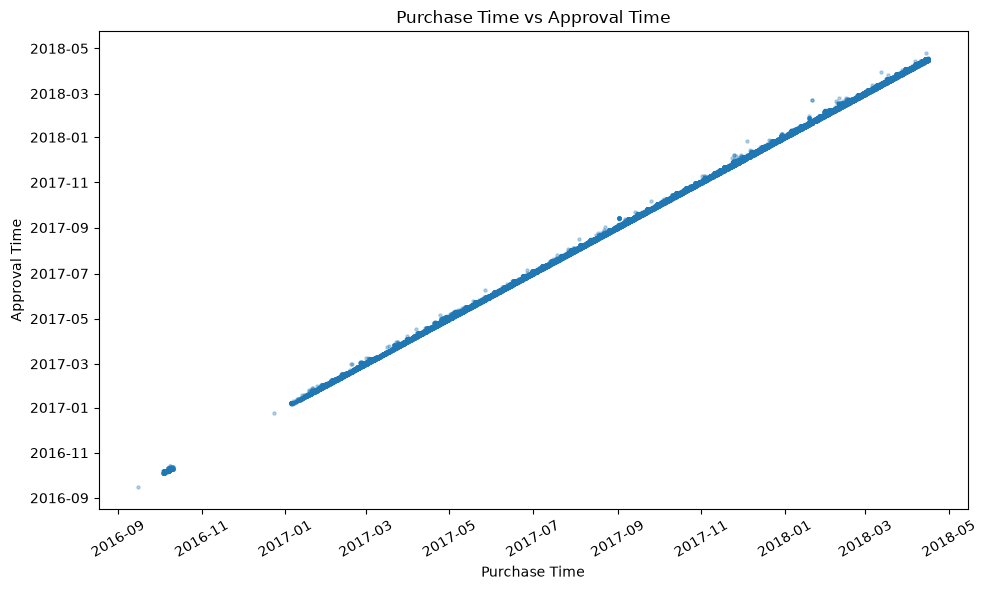

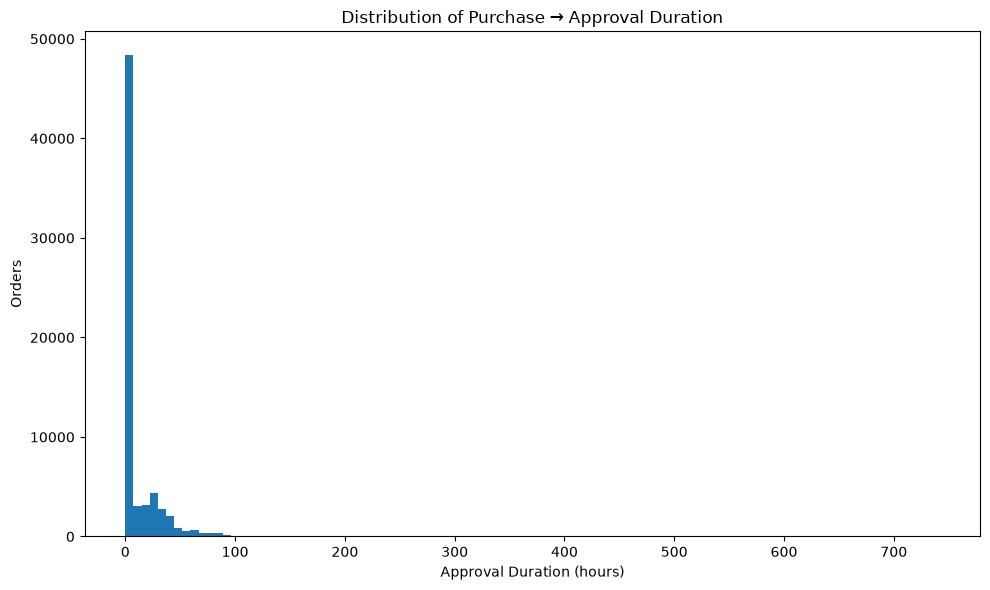

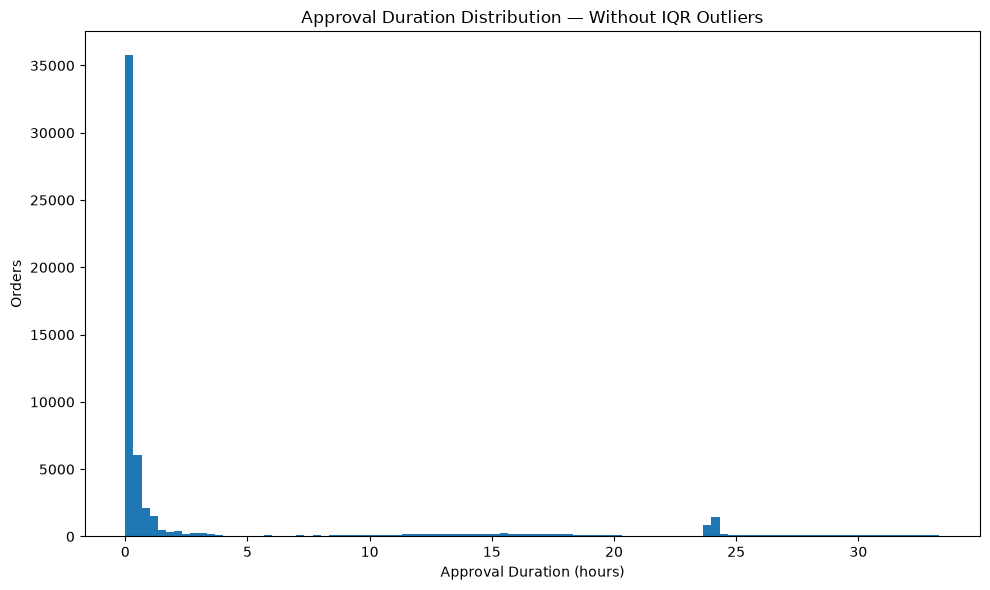

/tmp/ipykernel_63/425615717.py:263: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(


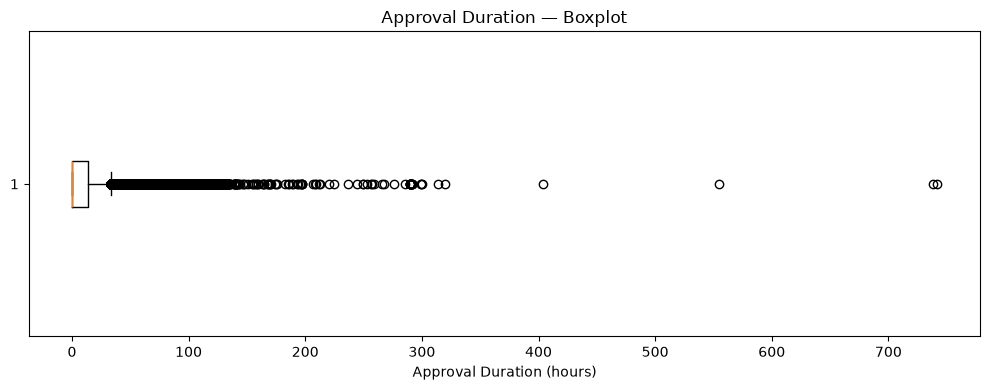

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# PURCHASE → APPROVAL TIME
# ============================================================

temp = train[
    ["purchase_time_min", "approval_time_min"]
].copy()

temp["purchase_time_min"] = pd.to_datetime(
    temp["purchase_time_min"],
    errors="coerce"
)

temp["approval_time_min"] = pd.to_datetime(
    temp["approval_time_min"],
    errors="coerce"
)

# Approval duration in hours
temp["approval_duration_hours"] = (
    temp["approval_time_min"] - temp["purchase_time_min"]
).dt.total_seconds() / 3600


# ============================================================
# 1. BASIC STATISTICS
# ============================================================

print("=" * 90)
print("PURCHASE → APPROVAL DURATION")
print("=" * 90)

print(temp["approval_duration_hours"].describe().round(3).to_string())


# ============================================================
# 2. INVALID / NEGATIVE DURATIONS
# ============================================================

print("\n" + "=" * 90)
print("DURATION VALIDITY")
print("=" * 90)

print(
    "Missing duration:",
    temp["approval_duration_hours"].isna().sum()
)

print(
    "Negative duration:",
    (temp["approval_duration_hours"] < 0).sum()
)

print(
    "Exactly 0 hours:",
    (temp["approval_duration_hours"] == 0).sum()
)

print(
    "More than 1 hour:",
    (temp["approval_duration_hours"] > 1).sum()
)

print(
    "More than 24 hours:",
    (temp["approval_duration_hours"] > 24).sum()
)

print(
    "More than 7 days:",
    (temp["approval_duration_hours"] > 24 * 7).sum()
)


# ============================================================
# 3. IQR OUTLIERS — APPROVAL DURATION
# ============================================================

s = temp["approval_duration_hours"].dropna()

q1 = s.quantile(0.25)
q3 = s.quantile(0.75)
iqr = q3 - q1

lower = q1 - 1.5 * iqr
upper = q3 + 1.5 * iqr

outlier = (
    (temp["approval_duration_hours"] < lower) |
    (temp["approval_duration_hours"] > upper)
)

print("\n" + "=" * 90)
print("APPROVAL DURATION — IQR OUTLIERS")
print("=" * 90)

print(f"Q1       : {q1:.3f} hours")
print(f"Q3       : {q3:.3f} hours")
print(f"IQR      : {iqr:.3f} hours")
print(f"Lower    : {lower:.3f} hours")
print(f"Upper    : {upper:.3f} hours")
print(f"Outliers : {outlier.sum():,} ({outlier.mean()*100:.2f}%)")


# ============================================================
# 4. CORRELATION — PURCHASE TIME VS APPROVAL TIME
# ============================================================

print("\n" + "=" * 90)
print("PURCHASE TIME ↔ APPROVAL TIME")
print("=" * 90)

purchase_numeric = (
    temp["purchase_time_min"].astype("int64") / 1e9
)

approval_numeric = (
    temp["approval_time_min"].astype("int64") / 1e9
)

print(
    "Pearson :",
    purchase_numeric.corr(approval_numeric)
)

print(
    "Spearman:",
    purchase_numeric.corr(
        approval_numeric,
        method="spearman"
    )
)


# ============================================================
# 5. CORRELATION — APPROVAL DURATION VS TARGET
# ============================================================

temp_target = temp.join(
    train[["delayed", "delay_days"]]
)

print("\n" + "=" * 90)
print("APPROVAL DURATION ↔ TARGET")
print("=" * 90)

for target in ["delayed", "delay_days"]:

    print(
        f"{target:12} | "
        f"Pearson: "
        f"{temp_target['approval_duration_hours'].corr(temp_target[target]):.5f} | "
        f"Spearman: "
        f"{temp_target['approval_duration_hours'].corr(temp_target[target], method='spearman'):.5f}"
    )


# ============================================================
# 6. DURATION QUARTILES — TARGET
# ============================================================

temp_target["duration_quartile"] = pd.qcut(
    temp_target["approval_duration_hours"],
    4,
    duplicates="drop"
)

duration_stats = (
    temp_target
    .groupby("duration_quartile", observed=True)
    .agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
)

duration_stats["delayed_rate"] *= 100

print("\n" + "=" * 90)
print("TARGET BY APPROVAL DURATION QUARTILES")
print("=" * 90)

print(duration_stats.round(3).to_string())


# ============================================================
# 7. SCATTER — PURCHASE TIME VS APPROVAL TIME
# ============================================================

plt.figure(figsize=(10, 6))

plt.scatter(
    temp["purchase_time_min"],
    temp["approval_time_min"],
    s=5,
    alpha=0.3
)

plt.xlabel("Purchase Time")
plt.ylabel("Approval Time")
plt.title("Purchase Time vs Approval Time")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


# ============================================================
# 8. DISTRIBUTION — APPROVAL DURATION
# ============================================================

plt.figure(figsize=(10, 6))

plt.hist(
    temp["approval_duration_hours"].dropna(),
    bins=100
)

plt.xlabel("Approval Duration (hours)")
plt.ylabel("Orders")
plt.title("Distribution of Purchase → Approval Duration")
plt.tight_layout()
plt.show()


# ============================================================
# 9. DISTRIBUTION WITHOUT EXTREME OUTLIERS
# Only for visualization — DO NOT DELETE DATA
# ============================================================

plt.figure(figsize=(10, 6))

plt.hist(
    temp.loc[
        temp["approval_duration_hours"].between(
            lower,
            upper
        ),
        "approval_duration_hours"
    ],
    bins=100
)

plt.xlabel("Approval Duration (hours)")
plt.ylabel("Orders")
plt.title("Approval Duration Distribution — Without IQR Outliers")
plt.tight_layout()
plt.show()


# ============================================================
# 10. BOX PLOT
# ============================================================

plt.figure(figsize=(10, 4))

plt.boxplot(
    temp["approval_duration_hours"].dropna(),
    vert=False
)

plt.xlabel("Approval Duration (hours)")
plt.title("Approval Duration — Boxplot")
plt.tight_layout()
plt.show()

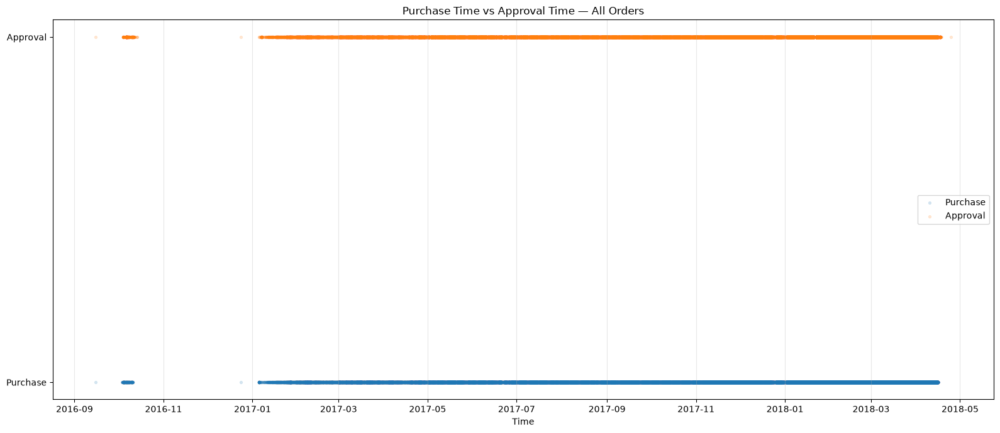

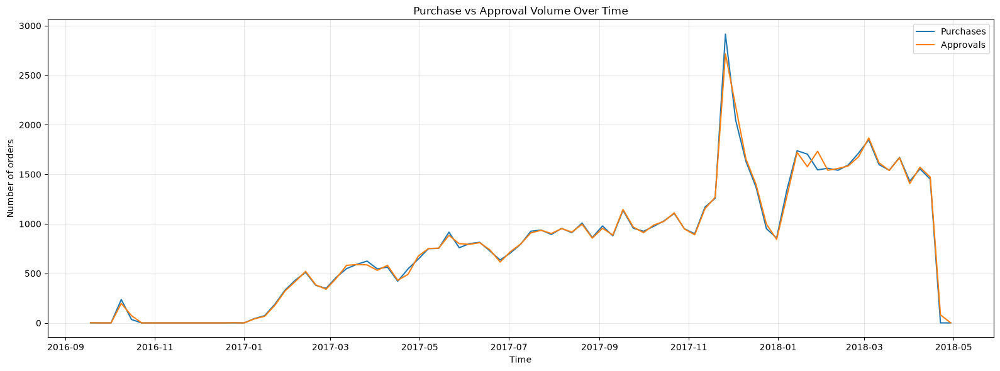

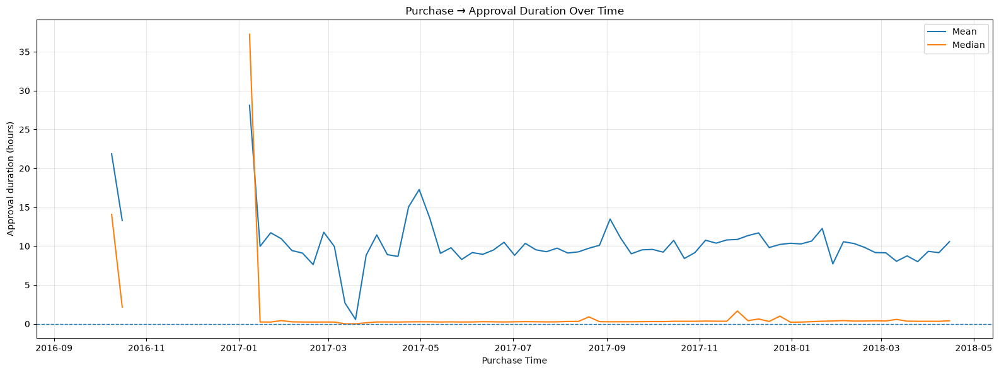

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# PURCHASE TIME vs APPROVAL TIME — ALL ORDERS
# ============================================================

df = train[
    ["purchase_time_min", "approval_time_min"]
].copy()

df["purchase_time_min"] = pd.to_datetime(df["purchase_time_min"])
df["approval_time_min"] = pd.to_datetime(df["approval_time_min"])

# ------------------------------------------------------------
# 1. ALL PURCHASE & APPROVAL TIMES OVER THE TIMELINE
# ------------------------------------------------------------

plt.figure(figsize=(16, 7))

plt.scatter(
    df["purchase_time_min"],
    [1] * len(df),
    alpha=0.15,
    s=8,
    label="Purchase"
)

plt.scatter(
    df["approval_time_min"],
    [2] * len(df),
    alpha=0.15,
    s=8,
    label="Approval"
)

plt.yticks([1, 2], ["Purchase", "Approval"])
plt.xlabel("Time")
plt.title("Purchase Time vs Approval Time — All Orders")
plt.grid(axis="x", alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 2. WEEKLY DISTRIBUTION OF PURCHASE & APPROVAL
# ------------------------------------------------------------

weekly_purchase = (
    df.groupby(pd.Grouper(key="purchase_time_min", freq="W"))
      .size()
      .reset_index(name="purchase_count")
)

weekly_approval = (
    df.groupby(pd.Grouper(key="approval_time_min", freq="W"))
      .size()
      .reset_index(name="approval_count")
)

weekly = pd.merge(
    weekly_purchase,
    weekly_approval,
    left_on="purchase_time_min",
    right_on="approval_time_min",
    how="outer"
)

weekly["time"] = (
    weekly["purchase_time_min"]
    .combine_first(weekly["approval_time_min"])
)

weekly = weekly.sort_values("time").fillna(0)

plt.figure(figsize=(16, 6))

plt.plot(
    weekly["time"],
    weekly["purchase_count"],
    label="Purchases"
)

plt.plot(
    weekly["time"],
    weekly["approval_count"],
    label="Approvals"
)

plt.xlabel("Time")
plt.ylabel("Number of orders")
plt.title("Purchase vs Approval Volume Over Time")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 3. APPROVAL DELAY DISTRIBUTION OVER TIME
# ------------------------------------------------------------

df["approval_duration_hours"] = (
    df["approval_time_min"] -
    df["purchase_time_min"]
).dt.total_seconds() / 3600

duration_weekly = (
    df.groupby(
        pd.Grouper(
            key="purchase_time_min",
            freq="W"
        )
    )["approval_duration_hours"]
    .agg(["mean", "median"])
    .reset_index()
)

plt.figure(figsize=(16, 6))

plt.plot(
    duration_weekly["purchase_time_min"],
    duration_weekly["mean"],
    label="Mean"
)

plt.plot(
    duration_weekly["purchase_time_min"],
    duration_weekly["median"],
    label="Median"
)

plt.axhline(0, linestyle="--", linewidth=1)

plt.xlabel("Purchase Time")
plt.ylabel("Approval duration (hours)")
plt.title("Purchase → Approval Duration Over Time")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

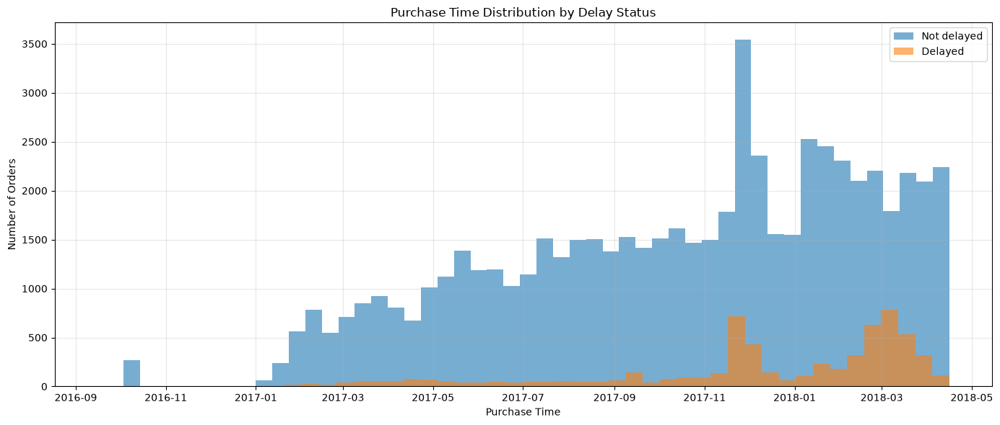

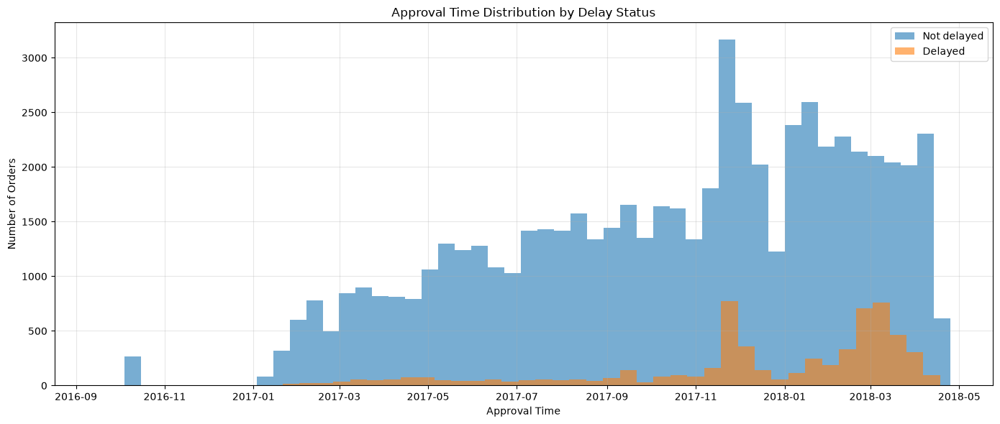

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

df = train[
    ["purchase_time_min", "approval_time_min", "delayed", "delay_days"]
].copy()

df["purchase_time_min"] = pd.to_datetime(df["purchase_time_min"])
df["approval_time_min"] = pd.to_datetime(df["approval_time_min"])

# ------------------------------------------------------------
# Purchase time distribution by target
# ------------------------------------------------------------

plt.figure(figsize=(14, 6))

plt.hist(
    df.loc[df["delayed"] == 0, "purchase_time_min"],
    bins=50,
    alpha=0.6,
    label="Not delayed"
)

plt.hist(
    df.loc[df["delayed"] == 1, "purchase_time_min"],
    bins=50,
    alpha=0.6,
    label="Delayed"
)

plt.xlabel("Purchase Time")
plt.ylabel("Number of Orders")
plt.title("Purchase Time Distribution by Delay Status")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Approval time distribution by target
# ------------------------------------------------------------

plt.figure(figsize=(14, 6))

plt.hist(
    df.loc[df["delayed"] == 0, "approval_time_min"],
    bins=50,
    alpha=0.6,
    label="Not delayed"
)

plt.hist(
    df.loc[df["delayed"] == 1, "approval_time_min"],
    bins=50,
    alpha=0.6,
    label="Delayed"
)

plt.xlabel("Approval Time")
plt.ylabel("Number of Orders")
plt.title("Approval Time Distribution by Delay Status")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [24]:
###########################################################

TEMPORAL FEATURES — QUICK SUMMARY


,feature,missing,unique,min,max,mean,outliers,outlier_%,pearson_delayed,spearman_delayed,pearson_delay_days,spearman_delay_days
0,purchase_year,0,3,2016.0,2018.0000,2017.3489,0,0.0000,0.1154,0.1155,0.1506,0.1491
1,purchase_month,0,12,1.0,12.0000,5.9716,0,0.0000,-0.0341,-0.0322,0.0089,0.0320
2,purchase_day,0,31,1.0,31.0000,15.4944,0,0.0000,0.0253,0.0254,0.0402,0.0468
3,purchase_quarter,0,4,1.0,4.0000,2.3219,0,0.0000,-0.0512,-0.0567,-0.0143,-0.0019
4,purchase_hour,0,24,0.0,23.0000,14.7795,0,0.0000,0.0091,0.0103,0.0234,0.0317
5,purchase_weekday,0,7,0.0,6.0000,2.7898,0,0.0000,-0.0119,-0.0121,-0.0281,-0.0382
6,purchase_is_weekend,0,2,0.0,1.0000,0.2345,15839,23.4537,-0.0071,-0.0071,-0.0272,-0.0393
7,approval_year,14,3,2016.0,2018.0000,2017.3498,0,0.0000,0.1149,0.1150,0.1499,0.1483
8,approval_month,14,12,1.0,12.0000,5.9795,0,0.0000,-0.0329,-0.0308,0.0102,0.0336
9,approval_day,14,31,1.0,31.0000,15.4808,0,0.0000,0.0218,0.0217,0.0349,0.0442



FEATURE-FEATURE SPEARMAN CORRELATION


,purchase_year,purchase_month,purchase_day,purchase_quarter,purchase_hour,purchase_weekday,purchase_is_weekend,approval_year,approval_month,approval_day,approval_quarter,approval_hour,approval_weekday,approval_is_weekend,approval_duration_hours
purchase_year,1.000,-0.738,-0.074,-0.731,-0.009,-0.005,0.003,0.998,-0.737,-0.071,-0.730,0.003,-0.011,-0.008,0.060
purchase_month,-0.738,1.000,0.019,0.962,0.000,0.025,0.008,-0.735,0.995,0.022,0.959,-0.013,0.029,0.021,0.042
purchase_day,-0.074,0.019,1.000,0.028,-0.007,-0.024,-0.021,-0.071,0.023,0.906,0.029,-0.004,-0.023,-0.021,-0.004
purchase_quarter,-0.731,0.962,0.028,1.000,0.003,0.017,0.007,-0.729,0.958,0.028,0.996,-0.015,0.020,0.017,0.058
purchase_hour,-0.009,0.000,-0.007,0.003,1.000,0.012,0.048,-0.010,0.002,-0.007,0.005,0.595,0.003,0.036,-0.045
purchase_weekday,-0.005,0.025,-0.024,0.017,0.012,1.000,0.742,-0.003,0.021,-0.015,0.017,0.035,0.742,0.621,-0.030
purchase_is_weekend,0.003,0.008,-0.021,0.007,0.048,0.742,1.000,0.005,0.005,-0.008,0.006,0.068,0.456,0.716,-0.045
approval_year,0.998,-0.735,-0.071,-0.729,-0.010,-0.003,0.005,1.000,-0.739,-0.073,-0.732,0.002,-0.012,-0.009,0.063
approval_month,-0.737,0.995,0.023,0.958,0.002,0.021,0.005,-0.739,1.000,0.017,0.962,-0.015,0.031,0.022,0.044
approval_day,-0.071,0.022,0.906,0.028,-0.007,-0.015,-0.008,-0.073,0.017,1.000,0.028,-0.009,-0.040,-0.019,-0.005


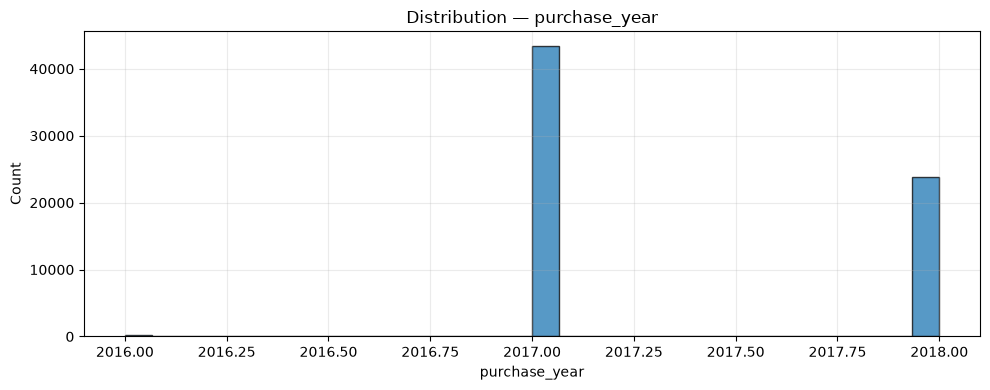

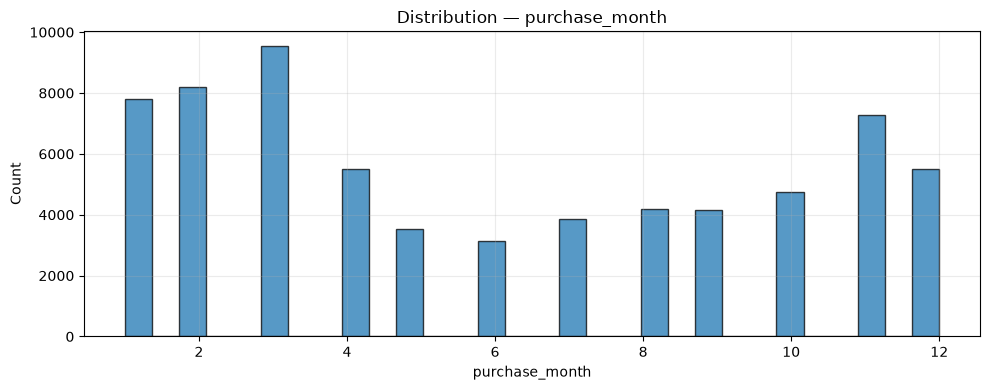

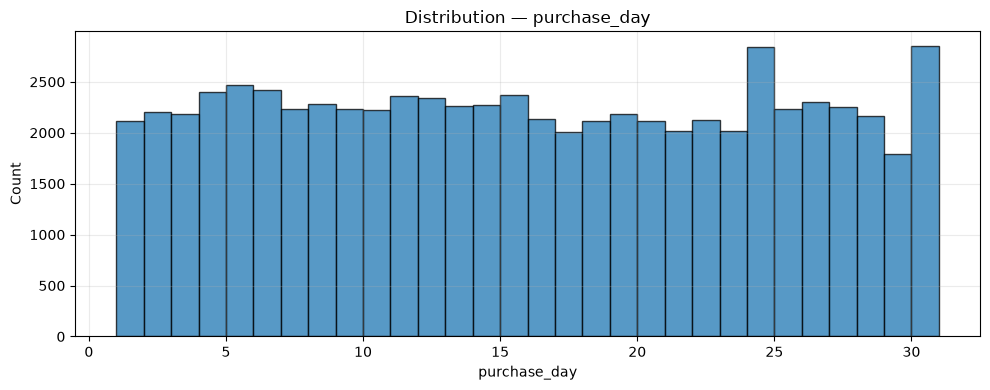

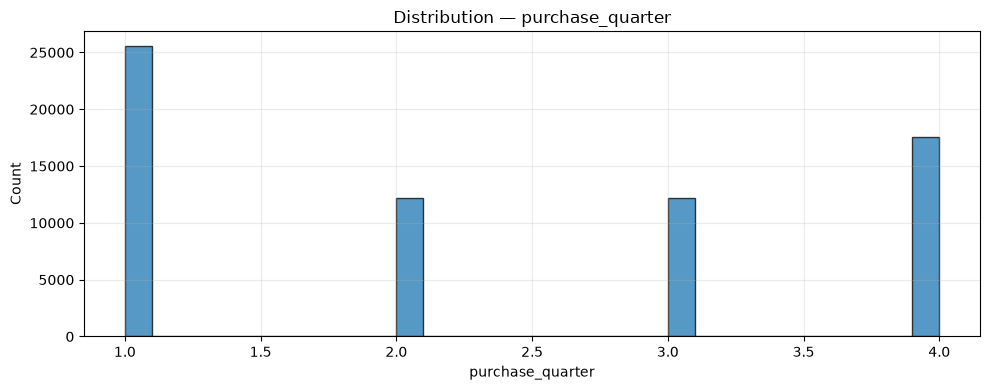

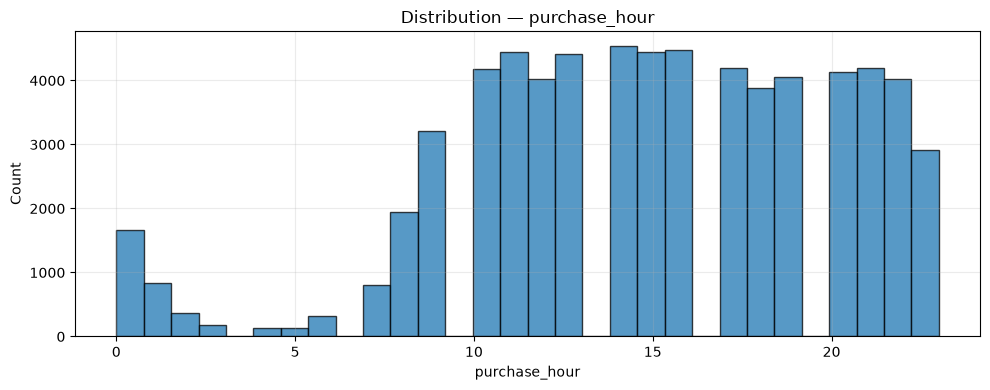

...

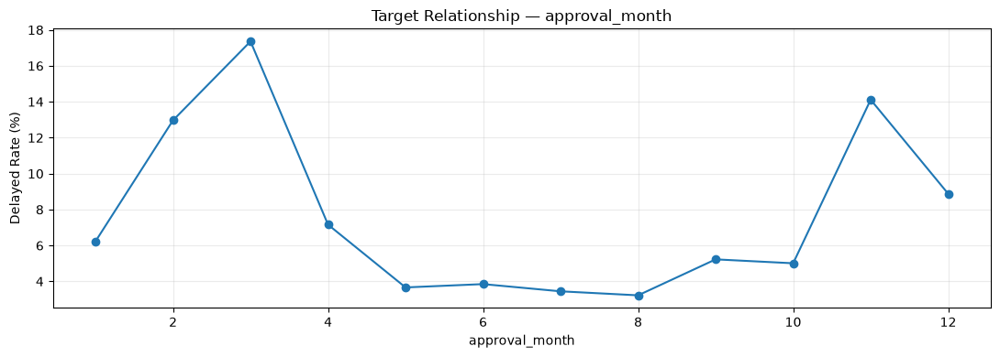

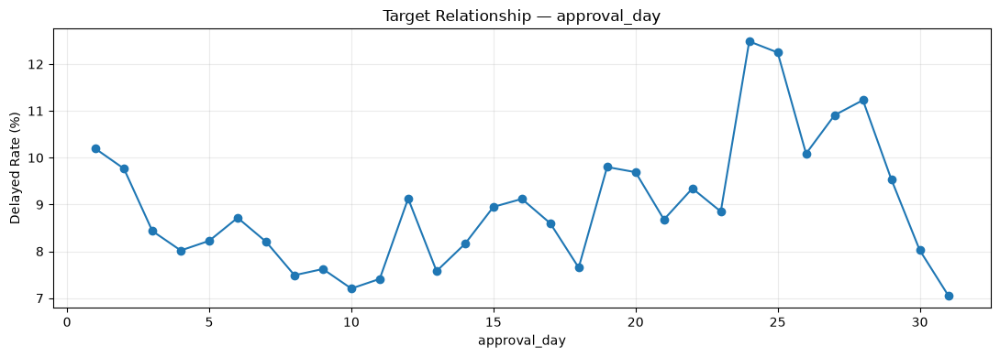

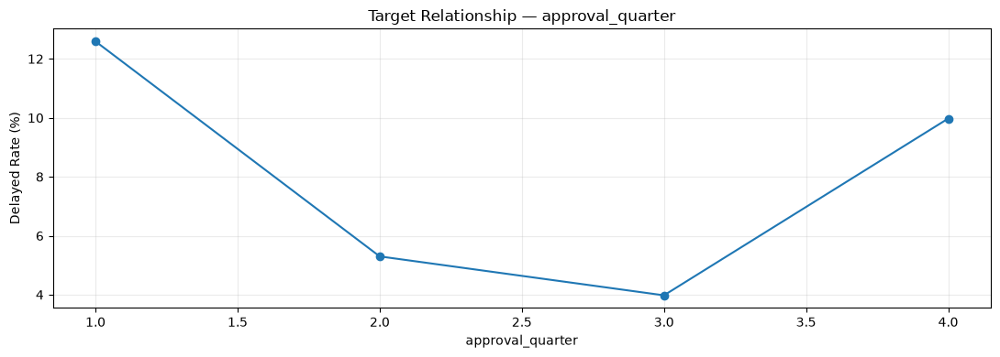

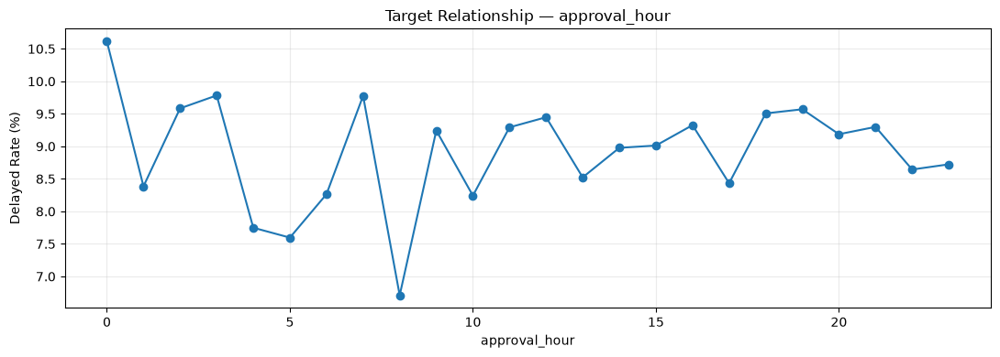

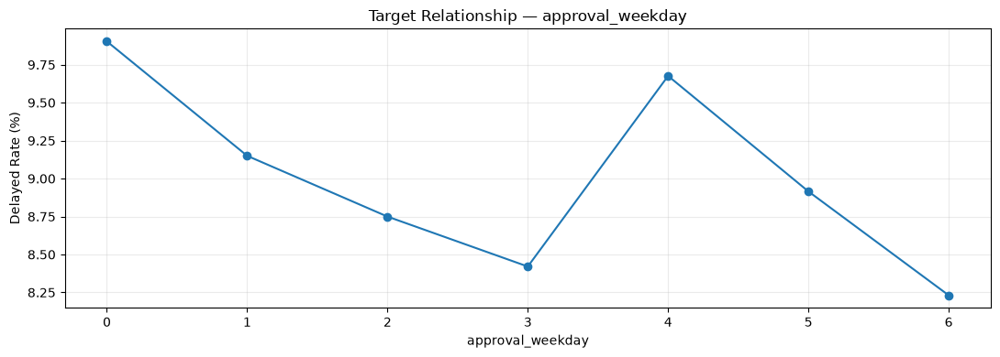


APPROVAL DURATION — TARGET RELATIONSHIP


,duration_group,orders,delayed_rate,avg_delay_days,median_delay_days
0,"(-0.001, 0.161]",6776,6.966,-11.832,-12.759
1,"(0.161, 0.192]",6786,7.574,-11.595,-12.323
2,"(0.192, 0.219]",6763,7.645,-11.562,-12.334
3,"(0.219, 0.253]",6737,7.511,-11.482,-12.262
4,"(0.253, 0.308]",6705,8.516,-10.636,-11.973
5,"(0.308, 0.526]",6745,11.105,-9.916,-11.181
6,"(0.526, 3.19]",6751,10.635,-10.348,-11.193
7,"(3.19, 19.807]",6752,8.605,-10.833,-11.345
8,"(19.807, 34.381]",6752,10.515,-9.868,-10.576
9,"(34.381, 741.444]",6752,11.241,-9.622,-10.261


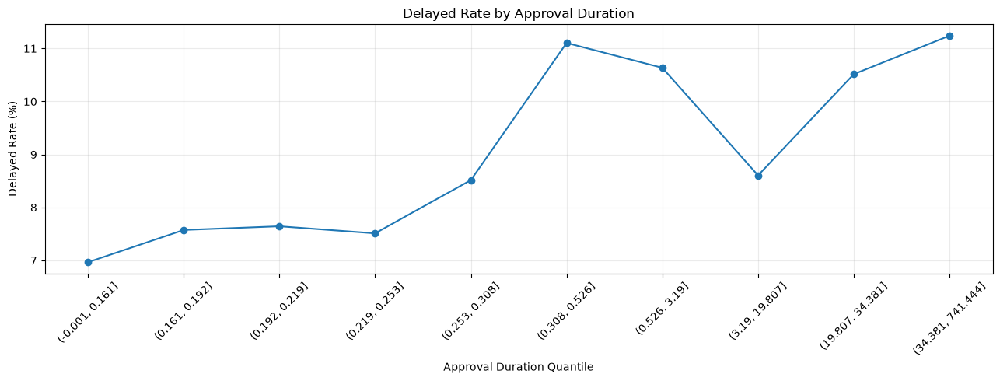

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# TEMPORAL FEATURES — PURCHASE & APPROVAL
# ============================================================

df = train[
    [
        "purchase_time_min",
        "approval_time_min",
        "delayed",
        "delay_days"
    ]
].copy()

df["purchase_time_min"] = pd.to_datetime(df["purchase_time_min"])
df["approval_time_min"] = pd.to_datetime(df["approval_time_min"])

# ------------------------------------------------------------
# CREATE TEMPORAL FEATURES
# ------------------------------------------------------------

for prefix, col in [
    ("purchase", "purchase_time_min"),
    ("approval", "approval_time_min")
]:
    df[f"{prefix}_year"] = df[col].dt.year
    df[f"{prefix}_month"] = df[col].dt.month
    df[f"{prefix}_day"] = df[col].dt.day
    df[f"{prefix}_quarter"] = df[col].dt.quarter
    df[f"{prefix}_hour"] = df[col].dt.hour
    df[f"{prefix}_weekday"] = df[col].dt.weekday
    df[f"{prefix}_is_weekend"] = (
        df[f"{prefix}_weekday"] >= 5
    ).astype(int)

# Purchase → Approval duration
df["approval_duration_hours"] = (
    df["approval_time_min"] -
    df["purchase_time_min"]
).dt.total_seconds() / 3600


# ============================================================
# FEATURE LIST
# ============================================================

temporal_cols = [
    "purchase_year",
    "purchase_month",
    "purchase_day",
    "purchase_quarter",
    "purchase_hour",
    "purchase_weekday",
    "purchase_is_weekend",

    "approval_year",
    "approval_month",
    "approval_day",
    "approval_quarter",
    "approval_hour",
    "approval_weekday",
    "approval_is_weekend",

    "approval_duration_hours"
]


# ============================================================
# 1. QUICK SUMMARY
# ============================================================

summary = []

for col in temporal_cols:

    s = df[col]

    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outliers = ((s < lower) | (s > upper)).sum()

    summary.append({
        "feature": col,
        "missing": s.isna().sum(),
        "unique": s.nunique(),
        "min": s.min(),
        "max": s.max(),
        "mean": s.mean(),
        "outliers": outliers,
        "outlier_%": outliers / len(df) * 100,
        "pearson_delayed": s.corr(df["delayed"]),
        "spearman_delayed": s.corr(df["delayed"], method="spearman"),
        "pearson_delay_days": s.corr(df["delay_days"]),
        "spearman_delay_days": s.corr(
            df["delay_days"],
            method="spearman"
        )
    })

summary = pd.DataFrame(summary)

print("=" * 110)
print("TEMPORAL FEATURES — QUICK SUMMARY")
print("=" * 110)

display(summary.round(4))


# ============================================================
# 2. FEATURE-FEATURE CORRELATION
# ============================================================

print("\n" + "=" * 110)
print("FEATURE-FEATURE SPEARMAN CORRELATION")
print("=" * 110)

corr = df[temporal_cols].corr(method="spearman")

display(corr.round(3))


# ============================================================
# 3. VISUAL DISTRIBUTIONS
# ============================================================

plot_cols = [
    "purchase_year",
    "purchase_month",
    "purchase_day",
    "purchase_quarter",
    "purchase_hour",
    "purchase_weekday",
    "approval_year",
    "approval_month",
    "approval_day",
    "approval_quarter",
    "approval_hour",
    "approval_weekday",
    "approval_duration_hours"
]

for col in plot_cols:

    plt.figure(figsize=(10, 4))

    plt.hist(
        df[col].dropna(),
        bins=30,
        edgecolor="black",
        alpha=0.75
    )

    plt.title(f"Distribution — {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.grid(alpha=0.25)

    plt.tight_layout()
    plt.show()



# ============================================================
# 5. DELAY RATE BY TEMPORAL FEATURE
# ============================================================

group_cols = [
    "purchase_year",
    "purchase_month",
    "purchase_day",
    "purchase_quarter",
    "purchase_hour",
    "purchase_weekday",
    "approval_year",
    "approval_month",
    "approval_day",
    "approval_quarter",
    "approval_hour",
    "approval_weekday"
]

for col in group_cols:

    grouped = (
        df.groupby(col)
          .agg(
              orders=("delayed", "size"),
              delayed_rate=("delayed", "mean"),
              avg_delay_days=("delay_days", "mean")
          )
          .reset_index()
    )

    grouped["delayed_rate"] *= 100

    fig, ax1 = plt.subplots(figsize=(11, 4))

    ax1.plot(
        grouped[col],
        grouped["delayed_rate"],
        marker="o"
    )

    ax1.set_xlabel(col)
    ax1.set_ylabel("Delayed Rate (%)")
    ax1.set_title(f"Target Relationship — {col}")
    ax1.grid(alpha=0.25)

    plt.tight_layout()
    plt.show()


# ============================================================
# 6. APPROVAL DURATION — TARGET RELATIONSHIP
# ============================================================

duration_groups = pd.qcut(
    df["approval_duration_hours"],
    q=10,
    duplicates="drop"
)

duration_target = (
    df.assign(duration_group=duration_groups)
      .groupby("duration_group", observed=True)
      .agg(
          orders=("delayed", "size"),
          delayed_rate=("delayed", "mean"),
          avg_delay_days=("delay_days", "mean"),
          median_delay_days=("delay_days", "median")
      )
      .reset_index()
)

duration_target["delayed_rate"] *= 100

print("\n" + "=" * 110)
print("APPROVAL DURATION — TARGET RELATIONSHIP")
print("=" * 110)

display(duration_target.round(3))

plt.figure(figsize=(13, 5))

plt.plot(
    duration_target["duration_group"].astype(str),
    duration_target["delayed_rate"],
    marker="o"
)

plt.xlabel("Approval Duration Quantile")
plt.ylabel("Delayed Rate (%)")
plt.title("Delayed Rate by Approval Duration")
plt.xticks(rotation=45)
plt.grid(alpha=0.25)

plt.tight_layout()
plt.show()

,feature,missing,unique,min,max,mean,median,outliers_IQR,outlier_%,pearson_delayed,spearman_delayed,pearson_delay_days,spearman_delay_days
0,purchase_year,0,3,2016.0,2018.0000,2017.3489,2017.0000,0,0.0000,0.1154,0.1155,0.1506,0.1491
1,purchase_month,0,12,1.0,12.0000,5.9716,5.0000,0,0.0000,-0.0341,-0.0322,0.0089,0.0320
2,purchase_day,0,31,1.0,31.0000,15.4944,15.0000,0,0.0000,0.0253,0.0254,0.0402,0.0468
3,purchase_quarter,0,4,1.0,4.0000,2.3219,2.0000,0,0.0000,-0.0512,-0.0567,-0.0143,-0.0019
4,purchase_hour,0,24,0.0,23.0000,14.7795,15.0000,0,0.0000,0.0091,0.0103,0.0234,0.0317
5,purchase_weekday,0,7,0.0,6.0000,2.7898,3.0000,0,0.0000,-0.0119,-0.0121,-0.0281,-0.0382
6,purchase_is_weekend,0,2,0.0,1.0000,0.2345,0.0000,15839,23.4537,-0.0071,-0.0071,-0.0272,-0.0393
7,approval_year,14,3,2016.0,2018.0000,2017.3498,2017.0000,0,0.0000,0.1149,0.1150,0.1499,0.1483
8,approval_month,14,12,1.0,12.0000,5.9795,5.0000,0,0.0000,-0.0329,-0.0308,0.0102,0.0336
9,approval_day,14,31,1.0,31.0000,15.4808,15.0000,0,0.0000,0.0218,0.0217,0.0349,0.0442


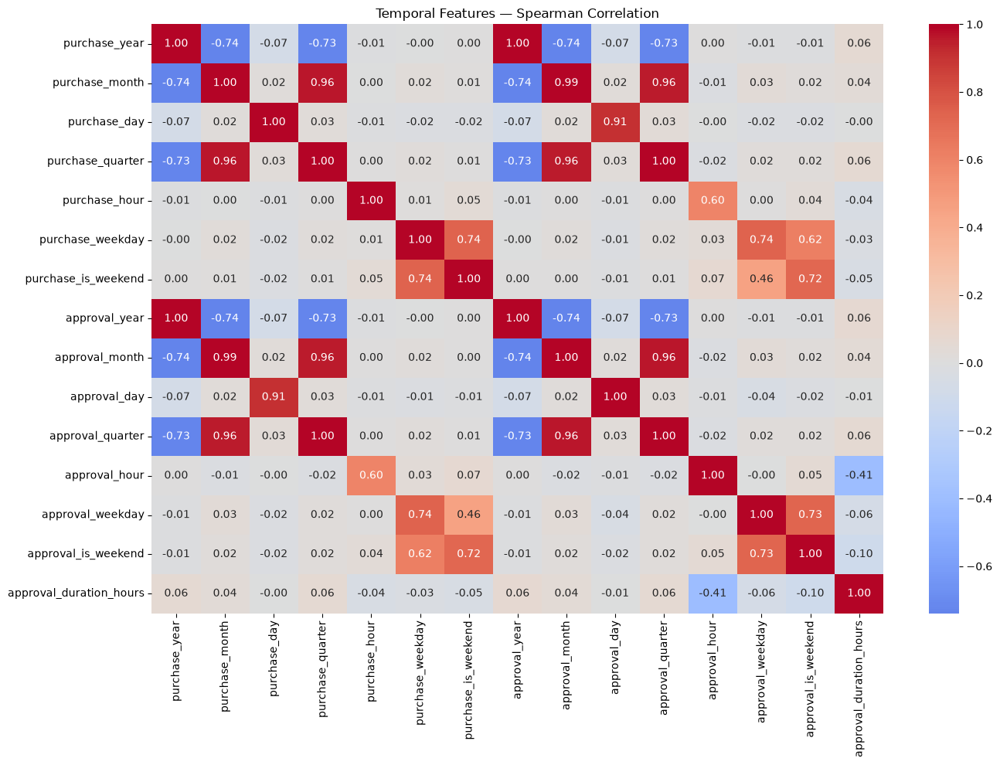

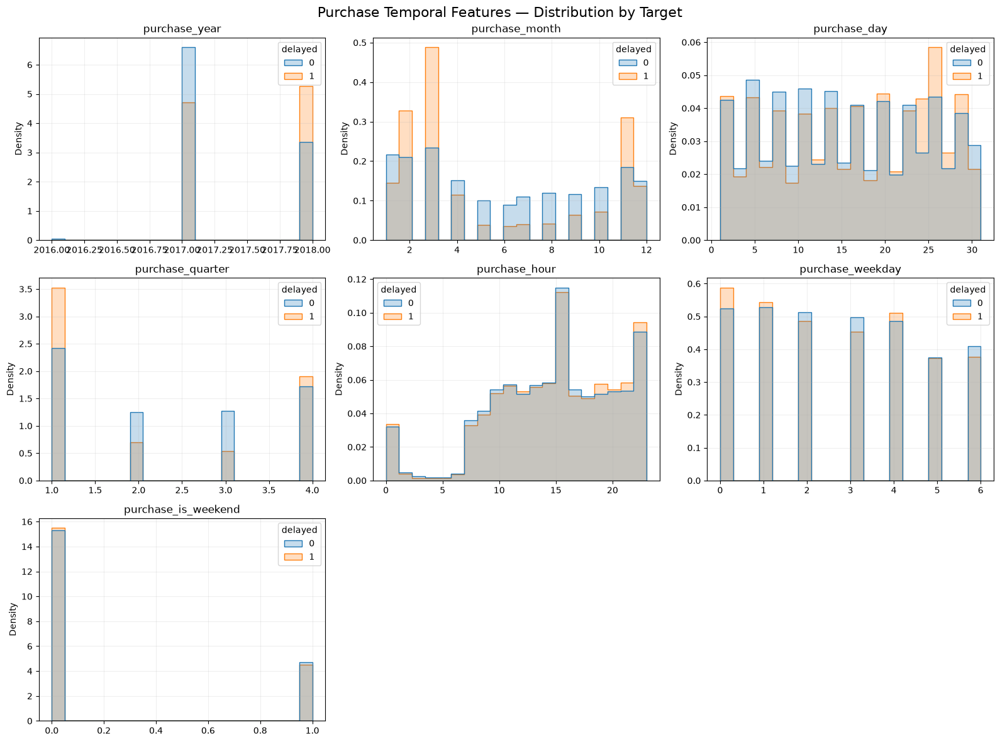

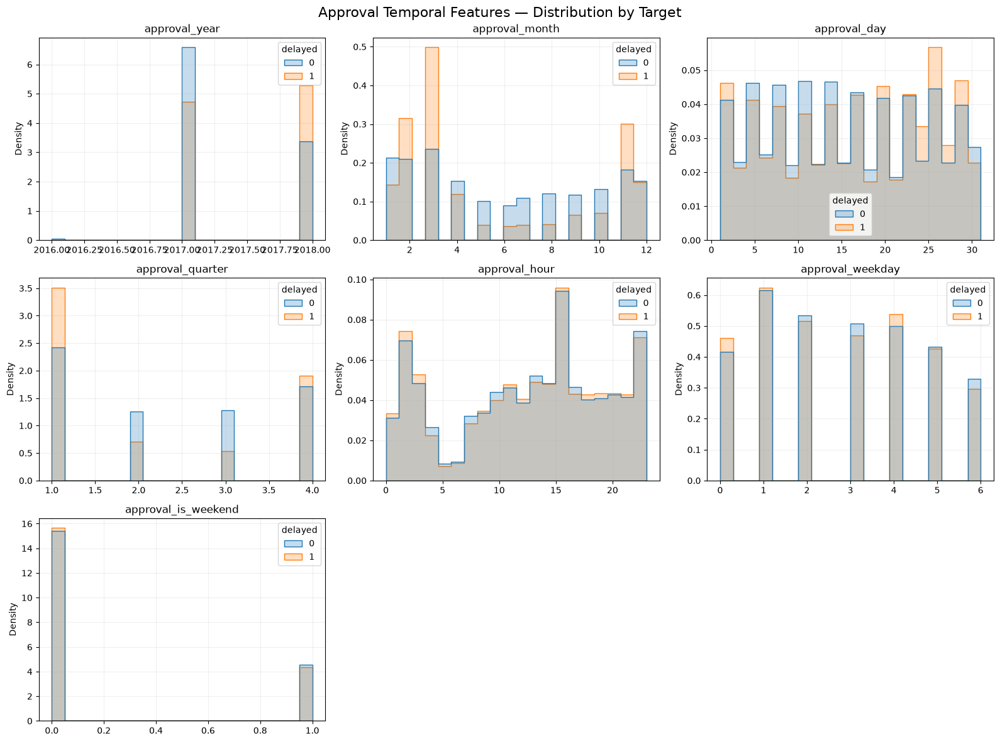

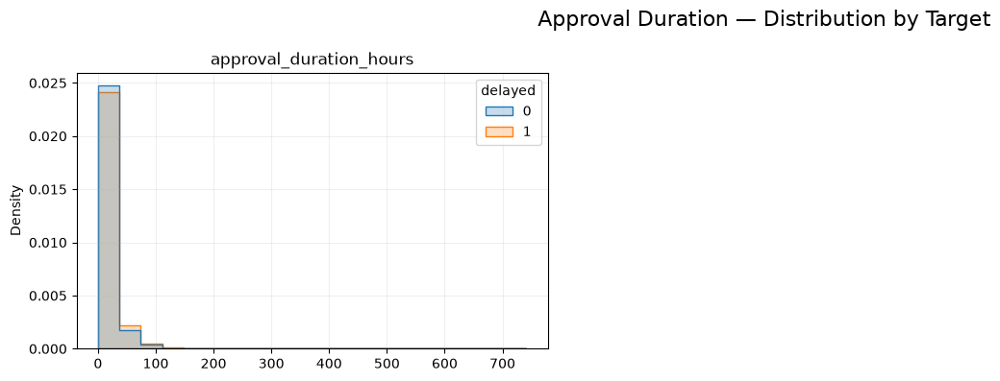

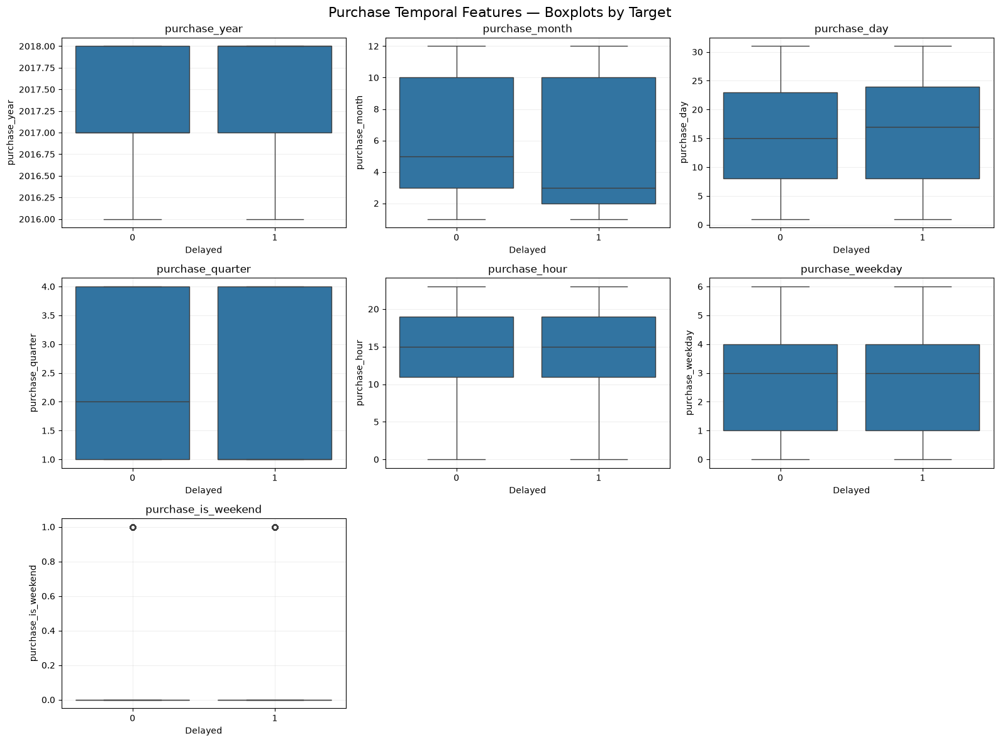

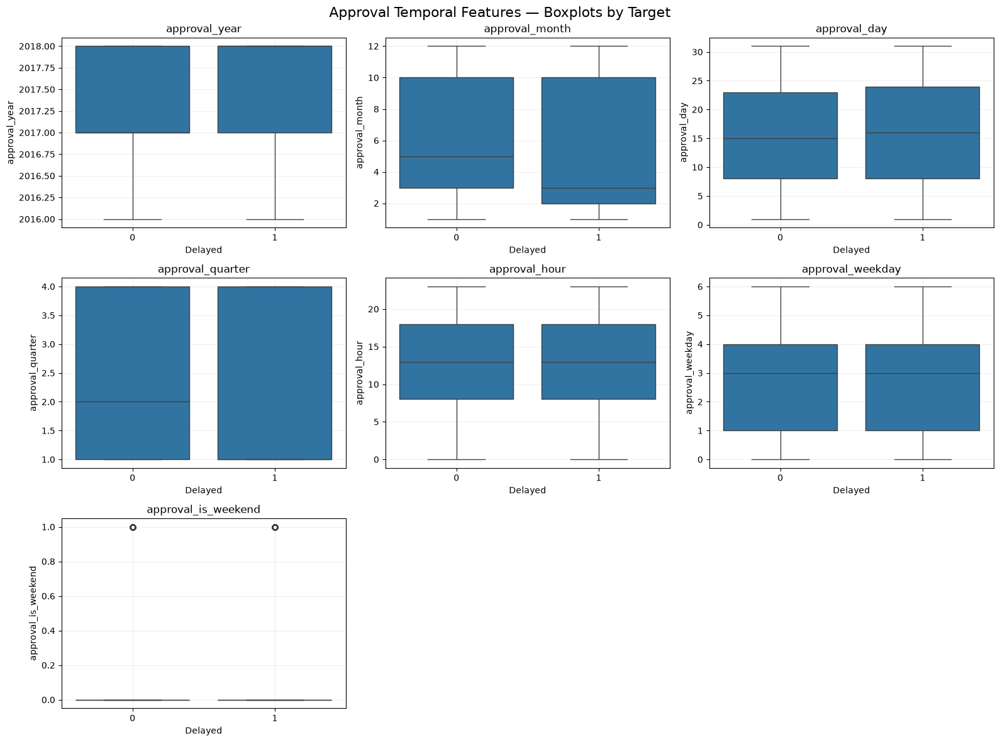

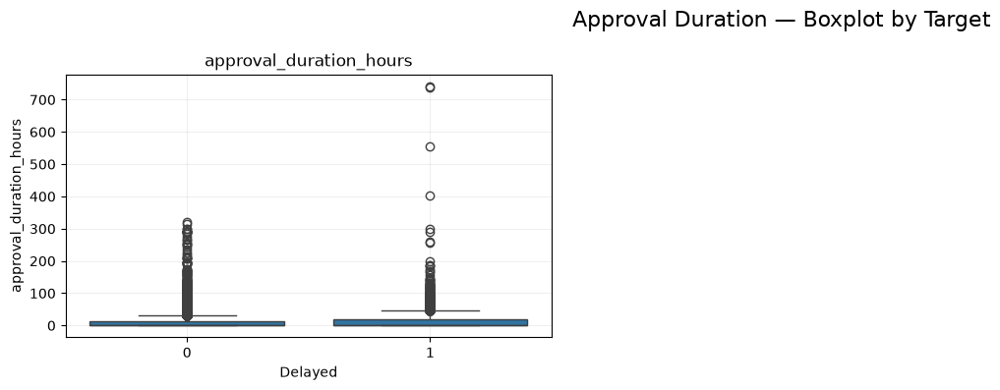

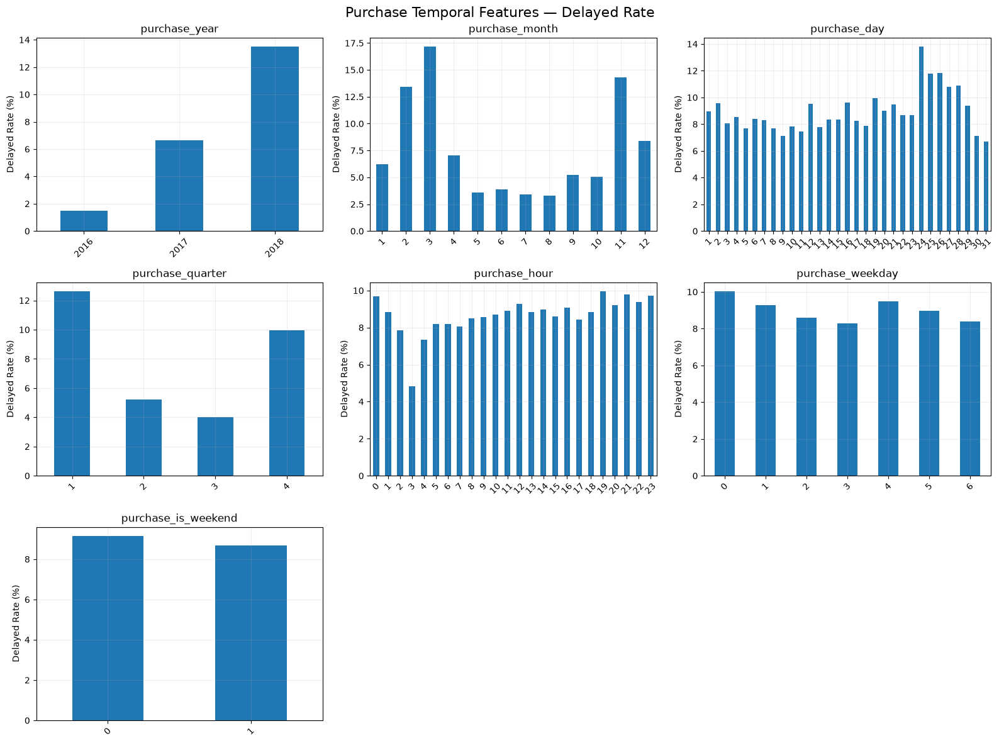

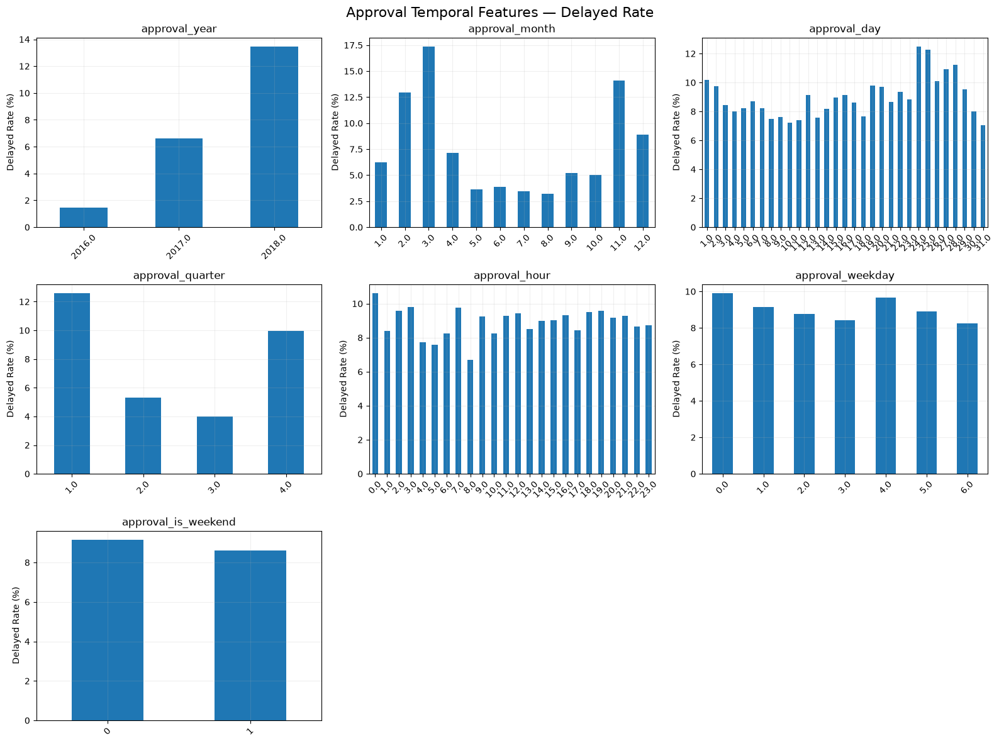


Approval Duration — Target Relationship


,orders,delayed_orders,delayed_rate,avg_delay_days
approval_duration_bin,,,,
"(-0.001, 0.161]",6776,472,6.966,-11.832
"(0.161, 0.192]",6786,514,7.574,-11.595
"(0.192, 0.219]",6763,517,7.645,-11.562
"(0.219, 0.253]",6737,506,7.511,-11.482
"(0.253, 0.308]",6705,571,8.516,-10.636
"(0.308, 0.526]",6745,749,11.105,-9.916
"(0.526, 3.19]",6751,718,10.635,-10.348
"(3.19, 19.807]",6752,581,8.605,-10.833
"(19.807, 34.381]",6752,710,10.515,-9.868


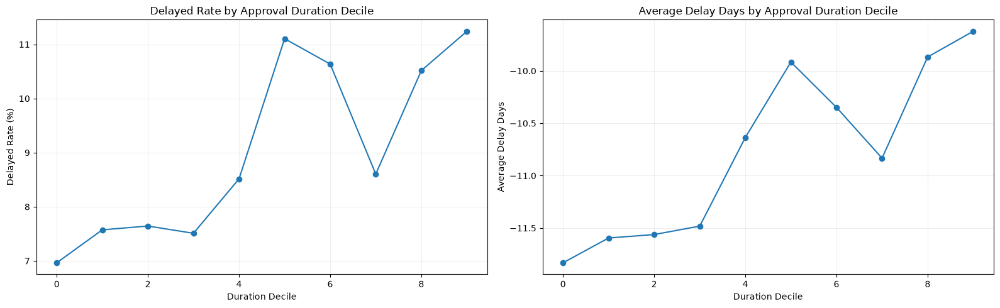

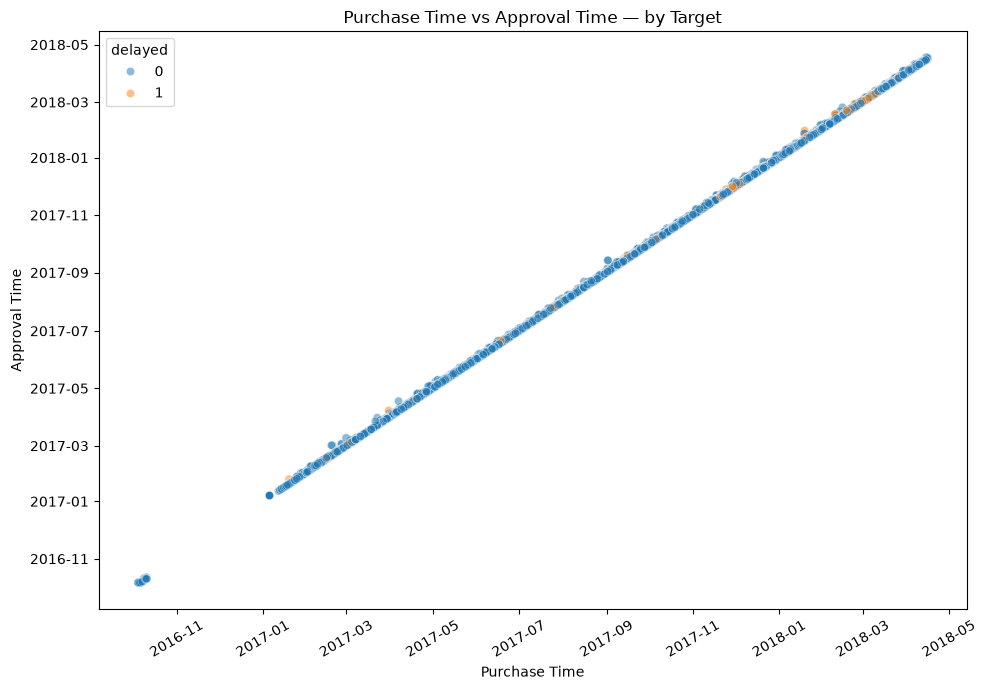

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 1. COPY + DATETIME
# ============================================================

df = train[
    [
        "purchase_time_min",
        "approval_time_min",
        "delayed",
        "delay_days"
    ]
].copy()

df["purchase_time_min"] = pd.to_datetime(df["purchase_time_min"])
df["approval_time_min"] = pd.to_datetime(df["approval_time_min"])


# ============================================================
# 2. DERIVE TEMPORAL FEATURES
# ============================================================

# Purchase
df["purchase_year"] = df["purchase_time_min"].dt.year
df["purchase_month"] = df["purchase_time_min"].dt.month
df["purchase_day"] = df["purchase_time_min"].dt.day
df["purchase_quarter"] = df["purchase_time_min"].dt.quarter
df["purchase_hour"] = df["purchase_time_min"].dt.hour
df["purchase_weekday"] = df["purchase_time_min"].dt.weekday
df["purchase_is_weekend"] = (df["purchase_weekday"] >= 5).astype(int)

# Approval
df["approval_year"] = df["approval_time_min"].dt.year
df["approval_month"] = df["approval_time_min"].dt.month
df["approval_day"] = df["approval_time_min"].dt.day
df["approval_quarter"] = df["approval_time_min"].dt.quarter
df["approval_hour"] = df["approval_time_min"].dt.hour
df["approval_weekday"] = df["approval_time_min"].dt.weekday
df["approval_is_weekend"] = (df["approval_weekday"] >= 5).astype(int)

# Purchase → Approval
df["approval_duration_hours"] = (
    df["approval_time_min"] - df["purchase_time_min"]
).dt.total_seconds() / 3600


# ============================================================
# 3. FEATURE LISTS
# ============================================================

purchase_cols = [
    "purchase_year",
    "purchase_month",
    "purchase_day",
    "purchase_quarter",
    "purchase_hour",
    "purchase_weekday",
    "purchase_is_weekend"
]

approval_cols = [
    "approval_year",
    "approval_month",
    "approval_day",
    "approval_quarter",
    "approval_hour",
    "approval_weekday",
    "approval_is_weekend"
]

duration_cols = [
    "approval_duration_hours"
]

temporal_cols = purchase_cols + approval_cols + duration_cols


# ============================================================
# 4. SUMMARY + OUTLIERS + TARGET CORRELATION
# ============================================================

summary = []

for col in temporal_cols:

    s = df[col].dropna()

    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1

    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    outliers = ((s < lower) | (s > upper)).sum()

    summary.append({
        "feature": col,
        "missing": df[col].isna().sum(),
        "unique": df[col].nunique(),
        "min": s.min(),
        "max": s.max(),
        "mean": s.mean(),
        "median": s.median(),
        "outliers_IQR": outliers,
        "outlier_%": outliers / len(s) * 100,
        "pearson_delayed": df[col].corr(df["delayed"]),
        "spearman_delayed": df[col].corr(df["delayed"], method="spearman"),
        "pearson_delay_days": df[col].corr(df["delay_days"]),
        "spearman_delay_days": df[col].corr(
            df["delay_days"], method="spearman"
        )
    })

summary = pd.DataFrame(summary)

display(summary.round(4))


# ============================================================
# 5. FEATURE-FEATURE CORRELATION
# ============================================================

plt.figure(figsize=(14, 10))

corr = df[temporal_cols].corr(method="spearman")

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0
)

plt.title("Temporal Features — Spearman Correlation")
plt.tight_layout()
plt.show()


# ============================================================
# 6. HISTOGRAMS — ALL TEMPORAL FEATURES
# ============================================================

def plot_hist_grid(columns, title, ncols=3):

    n = len(columns)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(16, 4 * nrows)
    )

    axes = np.array(axes).reshape(-1)

    for ax, col in zip(axes, columns):

        sns.histplot(
            data=df,
            x=col,
            hue="delayed",
            bins=20,
            kde=False,
            element="step",
            stat="density",
            common_norm=False,
            ax=ax
        )

        ax.set_title(col)
        ax.set_xlabel("")
        ax.grid(alpha=0.2)

    # Hide empty cells
    for ax in axes[n:]:
        ax.set_visible(False)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


# Purchase
plot_hist_grid(
    purchase_cols,
    "Purchase Temporal Features — Distribution by Target"
)

# Approval
plot_hist_grid(
    approval_cols,
    "Approval Temporal Features — Distribution by Target"
)

# Duration
plot_hist_grid(
    duration_cols,
    "Approval Duration — Distribution by Target"
)


# ============================================================
# 7. BOXPLOTS — PURCHASE
# ============================================================

def plot_box_grid(columns, title, ncols=3):

    n = len(columns)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(16, 4 * nrows)
    )

    axes = np.array(axes).reshape(-1)

    for ax, col in zip(axes, columns):

        sns.boxplot(
            data=df,
            x="delayed",
            y=col,
            ax=ax
        )

        ax.set_title(col)
        ax.set_xlabel("Delayed")
        ax.grid(alpha=0.2)

    for ax in axes[n:]:
        ax.set_visible(False)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


plot_box_grid(
    purchase_cols,
    "Purchase Temporal Features — Boxplots by Target"
)


# ============================================================
# 8. BOXPLOTS — APPROVAL
# ============================================================

plot_box_grid(
    approval_cols,
    "Approval Temporal Features — Boxplots by Target"
)


# ============================================================
# 9. APPROVAL DURATION BOXPLOT
# ============================================================

plot_box_grid(
    duration_cols,
    "Approval Duration — Boxplot by Target"
)


# ============================================================
# 10. DELAY RATE BY TEMPORAL FEATURE
# ============================================================

def plot_delay_rate_grid(columns, title, ncols=3):

    n = len(columns)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(16, 4 * nrows)
    )

    axes = np.array(axes).reshape(-1)

    for ax, col in zip(axes, columns):

        rate = (
            df.groupby(col, observed=True)["delayed"]
            .mean()
            .mul(100)
        )

        rate.plot(
            kind="bar",
            ax=ax
        )

        ax.set_title(col)
        ax.set_ylabel("Delayed Rate (%)")
        ax.set_xlabel("")
        ax.tick_params(axis="x", rotation=45)
        ax.grid(alpha=0.2)

    for ax in axes[n:]:
        ax.set_visible(False)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


# Purchase target relationship
plot_delay_rate_grid(
    purchase_cols,
    "Purchase Temporal Features — Delayed Rate"
)

# Approval target relationship
plot_delay_rate_grid(
    approval_cols,
    "Approval Temporal Features — Delayed Rate"
)


# ============================================================
# 11. APPROVAL DURATION — TARGET RELATIONSHIP
# ============================================================

df["approval_duration_bin"] = pd.qcut(
    df["approval_duration_hours"],
    q=10,
    duplicates="drop"
)

duration_target = (
    df.groupby("approval_duration_bin", observed=True)
    .agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean")
    )
)

duration_target["delayed_rate"] *= 100

print("\nApproval Duration — Target Relationship")
display(duration_target.round(3))


fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Delayed rate
axes[0].plot(
    range(len(duration_target)),
    duration_target["delayed_rate"],
    marker="o"
)

axes[0].set_title("Delayed Rate by Approval Duration Decile")
axes[0].set_xlabel("Duration Decile")
axes[0].set_ylabel("Delayed Rate (%)")
axes[0].grid(alpha=0.2)

# Average delay
axes[1].plot(
    range(len(duration_target)),
    duration_target["avg_delay_days"],
    marker="o"
)

axes[1].set_title("Average Delay Days by Approval Duration Decile")
axes[1].set_xlabel("Duration Decile")
axes[1].set_ylabel("Average Delay Days")
axes[1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# 12. PURCHASE vs APPROVAL — DIRECT RELATIONSHIP
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(
        min(10000, len(df)),
        random_state=42
    ),
    x="purchase_time_min",
    y="approval_time_min",
    hue="delayed",
    alpha=0.5
)

plt.title("Purchase Time vs Approval Time — by Target")
plt.xlabel("Purchase Time")
plt.ylabel("Approval Time")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

## Carrier


CARRIER DATE — SUMMARY
                     count  missing  missing_%  unique                 min  \
carrier_date_min     67532        1   0.001481   63242 2016-10-08 10:34:01   
carrier_date_max     67532        1   0.001481   63242 2016-10-08 10:34:01   
carrier_date_median  67532        1   0.001481   63242 2016-10-08 10:34:01   

                                    max  
carrier_date_min    2018-05-08 14:04:00  
carrier_date_max    2018-05-08 14:04:00  
carrier_date_median 2018-05-08 14:04:00  

CARRIER DATE — CONSISTENCY CHECK
Invalid min <= median <= max rows: 0

PURCHASE → CARRIER
count    67532.00
mean        83.24
std         89.40
min          0.26
25%         30.31
50%         58.69
75%        103.40
max       3018.61
Name: purchase_to_carrier_hours, dtype: float64

APPROVAL → CARRIER
count    67518.00
mean        73.31
std         87.44
min       -224.93
25%         24.61
50%         49.00
75%         93.16
max       3018.30
Name: approval_to_carrier_hours, dtype: float64


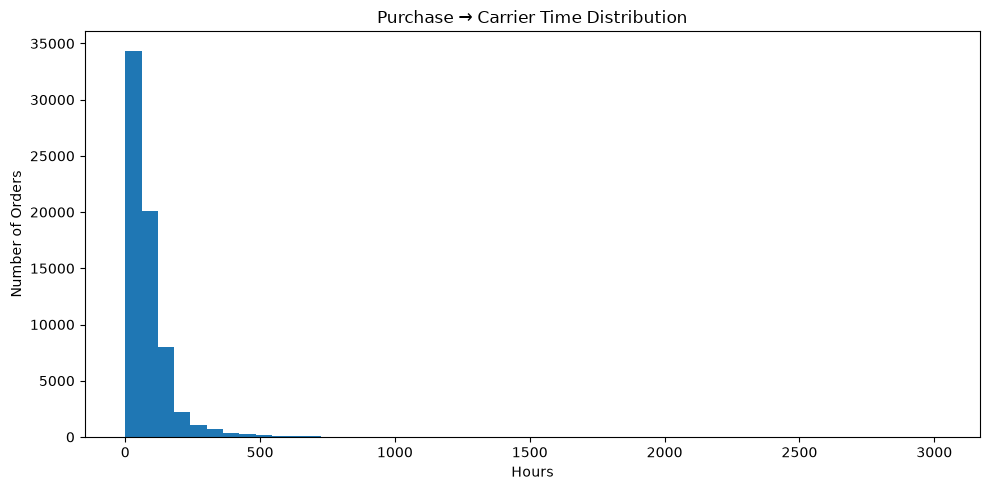

<Figure size 800x500 with 0 Axes>

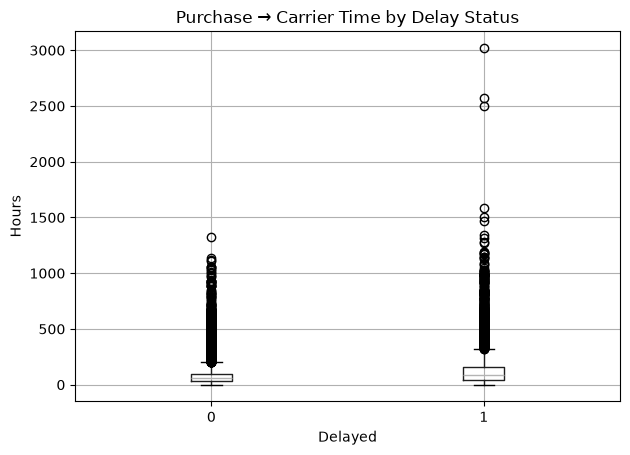

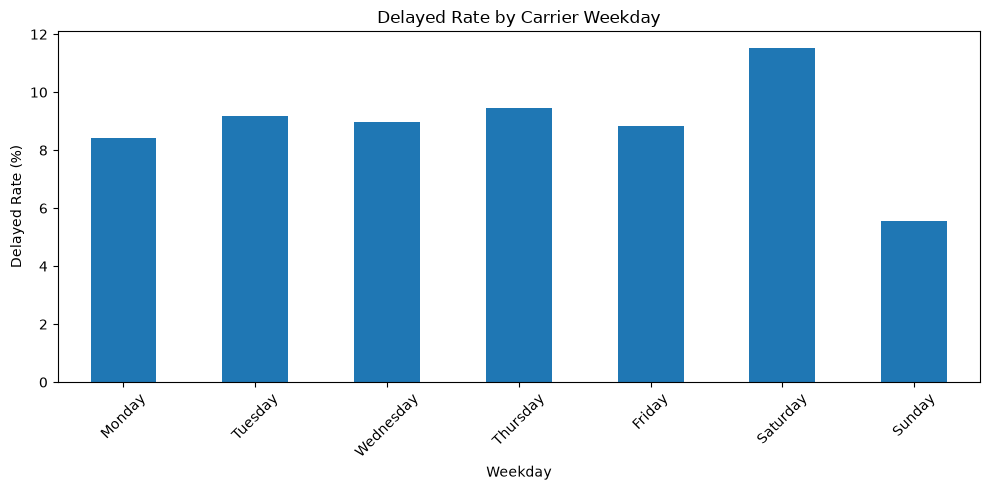

In [104]:
# ============================================================
# CARRIER DATE — DATETIME EDA
# ============================================================

carrier_cols = [
    "carrier_date_min",
    "carrier_date_max",
    "carrier_date_median"
]

# ------------------------------------------------------------
# 1. Convert to datetime
# ------------------------------------------------------------

for col in carrier_cols:
    train[col] = pd.to_datetime(
        train[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# 2. Basic summary
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("CARRIER DATE — SUMMARY")
print("=" * 100)

carrier_summary = pd.DataFrame({
    "count": train[carrier_cols].count(),
    "missing": train[carrier_cols].isna().sum(),
    "missing_%": train[carrier_cols].isna().mean() * 100,
    "unique": train[carrier_cols].nunique(),
    "min": train[carrier_cols].min(),
    "max": train[carrier_cols].max()
})

print(carrier_summary)

# ------------------------------------------------------------
# 3. Consistency check
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("CARRIER DATE — CONSISTENCY CHECK")
print("=" * 100)

invalid_order = (
    (train["carrier_date_min"] > train["carrier_date_median"]) |
    (train["carrier_date_median"] > train["carrier_date_max"])
).sum()

print(
    f"Invalid min <= median <= max rows: "
    f"{invalid_order:,}"
)

# ------------------------------------------------------------
# 4. Carrier handling time
# Purchase → Carrier
# ------------------------------------------------------------

train["purchase_to_carrier_hours"] = (
    (
        train["carrier_date_median"]
        -
        train["purchase_time_median"]
    ).dt.total_seconds() / 3600
)

print("\n" + "=" * 100)
print("PURCHASE → CARRIER")
print("=" * 100)

print(
    train["purchase_to_carrier_hours"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 5. Approval → Carrier
# ------------------------------------------------------------

train["approval_to_carrier_hours"] = (
    (
        train["carrier_date_median"]
        -
        train["approval_time_median"]
    ).dt.total_seconds() / 3600
)

print("\n" + "=" * 100)
print("APPROVAL → CARRIER")
print("=" * 100)

print(
    train["approval_to_carrier_hours"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 6. Negative durations
# ------------------------------------------------------------

negative_purchase_carrier = (
    train["purchase_to_carrier_hours"] < 0
).sum()

negative_approval_carrier = (
    train["approval_to_carrier_hours"] < 0
).sum()

print(
    f"\nNegative purchase → carrier durations: "
    f"{negative_purchase_carrier:,}"
)

print(
    f"Negative approval → carrier durations: "
    f"{negative_approval_carrier:,}"
)

# ------------------------------------------------------------
# 7. Carrier date — hour / weekday
# ------------------------------------------------------------

train["carrier_hour"] = (
    train["carrier_date_median"].dt.hour
)

train["carrier_weekday"] = (
    train["carrier_date_median"].dt.day_name()
)

# ------------------------------------------------------------
# 8. Delayed rate by carrier weekday
# ------------------------------------------------------------

weekday_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday"
]

carrier_weekday_delay = (
    train.groupby("carrier_weekday")["delayed"]
    .agg(
        orders="count",
        delayed_orders="sum",
        delayed_rate="mean"
    )
    .reindex(weekday_order)
)

carrier_weekday_delay["delayed_rate"] *= 100

print("\n" + "=" * 100)
print("DELAYED RATE BY CARRIER WEEKDAY")
print("=" * 100)

print(carrier_weekday_delay.round(2))

# ------------------------------------------------------------
# 9. Purchase → Carrier vs target
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("PURCHASE → CARRIER VS DELAY")
print("=" * 100)

carrier_delay_comparison = (
    train.groupby("delayed")["purchase_to_carrier_hours"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    )
)

print(
    carrier_delay_comparison.round(2)
)

# ------------------------------------------------------------
# 10. Visualization
# ------------------------------------------------------------

import matplotlib.pyplot as plt

# Purchase → Carrier distribution
plt.figure(figsize=(10, 5))
train["purchase_to_carrier_hours"].plot(
    kind="hist",
    bins=50
)
plt.title("Purchase → Carrier Time Distribution")
plt.xlabel("Hours")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()

# Purchase → Carrier by delay
plt.figure(figsize=(8, 5))
train.boxplot(
    column="purchase_to_carrier_hours",
    by="delayed"
)
plt.title("Purchase → Carrier Time by Delay Status")
plt.suptitle("")
plt.xlabel("Delayed")
plt.ylabel("Hours")
plt.tight_layout()
plt.show()

# Delayed rate by carrier weekday
plt.figure(figsize=(10, 5))
carrier_weekday_delay["delayed_rate"].plot(
    kind="bar"
)
plt.title("Delayed Rate by Carrier Weekday")
plt.xlabel("Weekday")
plt.ylabel("Delayed Rate (%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## year

YEAR — TEMPORAL ANALYSIS

--- Summary ---
count    67533.000000
mean      2017.348911
std          0.485006
min       2016.000000
25%       2017.000000
50%       2017.000000
75%       2018.000000
max       2018.000000
Name: year, dtype: float64

--- Unique years ---
[np.int64(2016), np.int64(2017), np.int64(2018)]

--- Year Summary ---


,year,orders,delayed_orders,delayed_rate,avg_delay_days,median_delay_days
0,2016,272,4,1.47,-35.74,-38.66
1,2017,43426,2878,6.63,-11.65,-12.28
2,2018,23835,3215,13.49,-8.89,-10.22



--- Delay Rate by Year ---


year
2016     1.47
2017     6.63
2018    13.49
Name: delayed_rate_%, dtype: float64

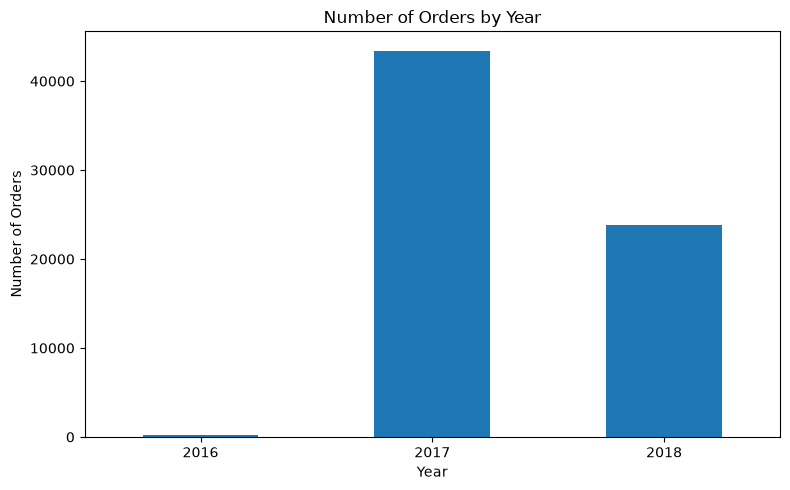

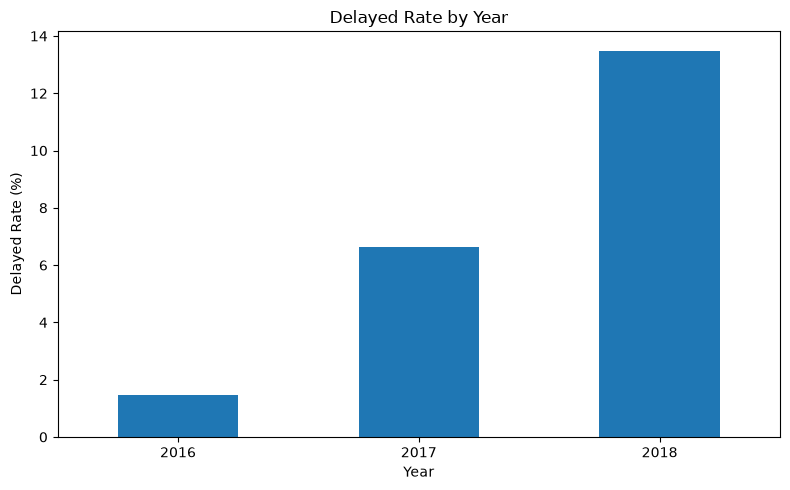

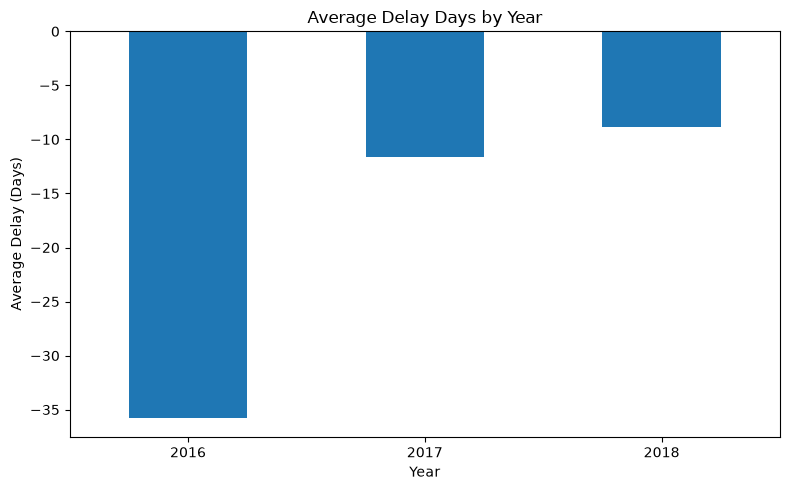

In [105]:
# ============================================================
# YEAR — TEMPORAL EDA
# ============================================================

print("=" * 90)
print("YEAR — TEMPORAL ANALYSIS")
print("=" * 90)

# Summary
print("\n--- Summary ---")
print(train["year"].describe())

print("\n--- Unique years ---")
print(sorted(train["year"].unique()))

# Orders per year
year_summary = (
    train.groupby("year")
    .agg(
        orders=("order_id", "count"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

year_summary["delayed_rate"] *= 100

print("\n--- Year Summary ---")
display(year_summary.round(2))


# ------------------------------------------------------------
# Target comparison
# ------------------------------------------------------------

print("\n--- Delay Rate by Year ---")
display(
    train.groupby("year")["delayed"]
    .mean()
    .mul(100)
    .round(2)
    .rename("delayed_rate_%")
)


# ------------------------------------------------------------
# Plot 1 — Number of orders per year
# ------------------------------------------------------------

plt.figure(figsize=(8, 5))

train["year"].value_counts().sort_index().plot(kind="bar")

plt.title("Number of Orders by Year")
plt.xlabel("Year")
plt.ylabel("Number of Orders")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Plot 2 — Delayed rate by year
# ------------------------------------------------------------

plt.figure(figsize=(8, 5))

(
    train.groupby("year")["delayed"]
    .mean()
    .mul(100)
    .sort_index()
    .plot(kind="bar")
)

plt.title("Delayed Rate by Year")
plt.xlabel("Year")
plt.ylabel("Delayed Rate (%)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Plot 3 — Average delay by year
# ------------------------------------------------------------

plt.figure(figsize=(8, 5))

(
    train.groupby("year")["delay_days"]
    .mean()
    .sort_index()
    .plot(kind="bar")
)

plt.title("Average Delay Days by Year")
plt.xlabel("Year")
plt.ylabel("Average Delay (Days)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

DISTRIBUTION ANALYSIS — year

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique values:       3

--- STATISTICS WITH ALL VALUES ---
Mean:                2,017.349
Median:              2,017.000
Std:                 0.485
Min:                 2,016.000
Q1:                  2,017.000
Q3:                  2,018.000
Max:                 2,018.000

--- IQR ANALYSIS ---
IQR:                 1.000
Lower bound:         2,015.500
Upper bound:         2,019.500
Method:              IQR

--- OUTLIERS ---
Outlier count:       0
Outlier percentage:  0.00%

--- WITHOUT IQR OUTLIERS ---
Valid values:        67,533
Mean:                2,017.349
Median:              2,017.000
Std:                 0.485
Min:                 2,016.000
Q1:                  2,017.000
Q3:                  2,018.000
Max:                 2,018.000

--- MOST FREQUENT VALUES ---


,frequency
year,
2017,43426
2018,23835
2016,272


/tmp/ipykernel_829/1542385404.py:136: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(x, vert=True)


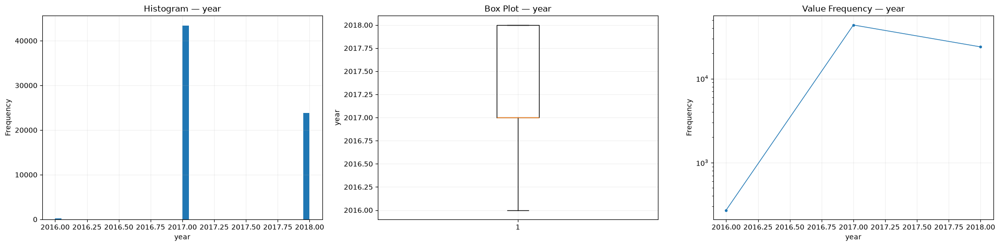

/tmp/ipykernel_829/1542385404.py:186: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[1].boxplot(normal, vert=True)


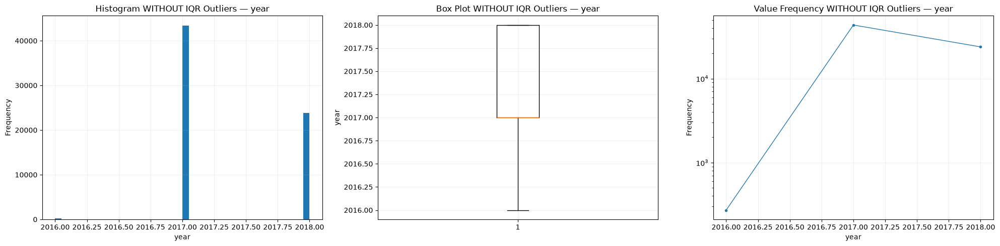


CORRELATION WITH: year


,feature,pearson,spearman
51,purchase_year,1.000,1.000
52,purchase_month,-0.727,-0.738
55,purchase_quarter,-0.718,-0.731
49,delay_days,0.151,0.149
53,purchase_day,-0.070,-0.074
...,...,...,...
32,seller_lng,-0.006,-0.010
54,purchase_hour,-0.004,-0.009
16,unique_seller_states,0.004,0.004
48,review_count,-0.001,-0.002



year vs TARGET
Pearson correlation: 0.1154

CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS
Selected column: year


,feature,pearson_with,pearson_without,pearson_change,spearman_with,spearman_without,spearman_change
51,purchase_year,1.000,1.000,0.0,1.000,1.000,0.0
52,purchase_month,-0.727,-0.727,0.0,-0.738,-0.738,0.0
55,purchase_quarter,-0.718,-0.718,0.0,-0.731,-0.731,0.0
49,delay_days,0.151,0.151,0.0,0.149,0.149,0.0
53,purchase_day,-0.070,-0.070,0.0,-0.074,-0.074,0.0
...,...,...,...,...,...,...,...
32,seller_lng,-0.006,-0.006,0.0,-0.010,-0.010,0.0
54,purchase_hour,-0.004,-0.004,0.0,-0.009,-0.009,0.0
16,unique_seller_states,0.004,0.004,0.0,0.004,0.004,0.0
48,review_count,-0.001,-0.001,0.0,-0.002,-0.002,0.0



year vs TARGET
Pearson with all values:       0.1154
Pearson without IQR outliers:  0.1154
Change:                         0.0000

year vs TARGET — GROUPED ANALYSIS


,count,delayed,delayed_rate
year,,,
2016,272,4,1.47
2017,43426,2878,6.63
2018,23835,3215,13.49



year DISTRIBUTION BY TARGET


,count,mean,median,std,min,max
delayed,,,,,,
0,61436,2017.331,2017.0,0.480,2016,2018
1,6097,2017.527,2018.0,0.501,2016,2018


In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Select ONE numeric column
# ============================================================

col = "year"
target = "delayed"

x = train[col].dropna()

# ============================================================
# Basic statistics
# ============================================================

Q1 = x.quantile(0.25)
Q2 = x.quantile(0.50)
Q3 = x.quantile(0.75)
IQR = Q3 - Q1

# ============================================================
# IQR OUTLIER DETECTION
# ============================================================

if IQR > 0:
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (x < lower_bound) | (x > upper_bound)
    outliers = x[outlier_mask]
    normal = x[~outlier_mask]

    outlier_method = "IQR"

else:
    # When IQR = 0, the IQR rule is not suitable for this
    # discrete / highly concentrated distribution.
    lower_bound = Q1
    upper_bound = Q3

    outliers = pd.Series(dtype=x.dtype)
    normal = x.copy()

    outlier_method = "Not applied (IQR = 0)"

# ============================================================
# Numerical summary
# ============================================================

print("=" * 80)
print(f"DISTRIBUTION ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique values:       {x.nunique():,}")

print("\n--- STATISTICS WITH ALL VALUES ---")
print(f"Mean:                {x.mean():,.3f}")
print(f"Median:              {Q2:,.3f}")
print(f"Std:                 {x.std():,.3f}")
print(f"Min:                 {x.min():,.3f}")
print(f"Q1:                  {Q1:,.3f}")
print(f"Q3:                  {Q3:,.3f}")
print(f"Max:                 {x.max():,.3f}")

print("\n--- IQR ANALYSIS ---")
print(f"IQR:                 {IQR:,.3f}")
print(f"Lower bound:         {lower_bound:,.3f}")
print(f"Upper bound:         {upper_bound:,.3f}")
print(f"Method:              {outlier_method}")

print("\n--- OUTLIERS ---")

if IQR > 0:
    print(f"Outlier count:       {len(outliers):,}")
    print(f"Outlier percentage:  {len(outliers) / len(x) * 100:.2f}%")

    if len(outliers) > 0:
        print(f"Outlier minimum:     {outliers.min():,.3f}")
        print(f"Outlier maximum:     {outliers.max():,.3f}")
else:
    print("No IQR outliers were identified.")
    print("Reason: IQR = 0, so the IQR rule is not informative for this distribution.")

print("\n--- WITHOUT IQR OUTLIERS ---")
print(f"Valid values:        {len(normal):,}")
print(f"Mean:                {normal.mean():,.3f}")
print(f"Median:              {normal.median():,.3f}")
print(f"Std:                 {normal.std():,.3f}")
print(f"Min:                 {normal.min():,.3f}")
print(f"Q1:                  {normal.quantile(0.25):,.3f}")
print(f"Q3:                  {normal.quantile(0.75):,.3f}")
print(f"Max:                 {normal.max():,.3f}")

# ============================================================
# Most frequent values
# ============================================================

print("\n--- MOST FREQUENT VALUES ---")

frequency = (
    x.value_counts()
    .sort_values(ascending=False)
    .head(15)
)

display(
    frequency.rename("frequency").to_frame()
)

# ============================================================
# Visual analysis — ALL VALUES
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(x, bins=40)
axes[0].set_title(f"Histogram — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(x, vert=True)
axes[1].set_title(f"Box Plot — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

counts = x.value_counts().sort_index()

axes[2].plot(
    counts.index,
    counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(counts) > 0 and counts.max() / max(counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Visual analysis — WITHOUT IQR OUTLIERS
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# ------------------------------------------------------------
# 1. Histogram
# ------------------------------------------------------------

axes[0].hist(normal, bins=40)
axes[0].set_title(f"Histogram WITHOUT IQR Outliers — {col}")
axes[0].set_xlabel(col)
axes[0].set_ylabel("Frequency")
axes[0].grid(alpha=0.2)

# ------------------------------------------------------------
# 2. Box Plot
# ------------------------------------------------------------

axes[1].boxplot(normal, vert=True)
axes[1].set_title(f"Box Plot WITHOUT IQR Outliers — {col}")
axes[1].set_ylabel(col)
axes[1].grid(alpha=0.2)

# ------------------------------------------------------------
# 3. Value Frequency
# ------------------------------------------------------------

normal_counts = normal.value_counts().sort_index()

axes[2].plot(
    normal_counts.index,
    normal_counts.values,
    marker="o",
    markersize=3,
    linewidth=1
)

axes[2].set_title(f"Value Frequency WITHOUT IQR Outliers — {col}")
axes[2].set_xlabel(col)
axes[2].set_ylabel("Frequency")
axes[2].grid(alpha=0.2)

if len(normal_counts) > 0 and normal_counts.max() / max(normal_counts.min(), 1) > 100:
    axes[2].set_yscale("log")

plt.tight_layout()
plt.show()

# ============================================================
# Correlation with other numeric features
# ============================================================

numeric_cols = train.select_dtypes(include=np.number).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c != col and c != target
]

feature_cols = [
    c for c in feature_cols
    if train[c].nunique(dropna=True) > 1
]

# ------------------------------------------------------------
# Pearson
# ------------------------------------------------------------

pearson = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

# ------------------------------------------------------------
# Spearman
# ------------------------------------------------------------

spearman = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson": pearson.reindex(feature_cols).to_numpy(),
    "spearman": spearman.reindex(feature_cols).to_numpy()
})

correlation["abs_pearson"] = correlation["pearson"].abs()
correlation["abs_spearman"] = correlation["spearman"].abs()

correlation = correlation.sort_values(
    "abs_pearson",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION WITH: {col}")
print("=" * 80)

display(
    correlation[
        ["feature", "pearson", "spearman"]
    ].round(3)
)

# ============================================================
# Relationship with target
# ============================================================

target_corr = train[[col, target]].corr().iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson correlation: {target_corr:.4f}")

# ============================================================
# Correlation — ALL VALUES vs WITHOUT IQR OUTLIERS
# ============================================================

normal_mask = train[col].notna()

if IQR > 0:
    normal_mask &= train[col].between(
        lower_bound,
        upper_bound
    )

train_normal = train.loc[normal_mask].copy()

# ------------------------------------------------------------
# With all values
# ------------------------------------------------------------

pearson_with = train[feature_cols].corrwith(
    train[col],
    method="pearson"
)

spearman_with = train[feature_cols].corrwith(
    train[col],
    method="spearman"
)

# ------------------------------------------------------------
# Without IQR outliers
# ------------------------------------------------------------

pearson_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="pearson"
)

spearman_without = train_normal[feature_cols].corrwith(
    train_normal[col],
    method="spearman"
)

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

correlation = pd.DataFrame({
    "feature": feature_cols,
    "pearson_with": pearson_with.reindex(feature_cols).to_numpy(),
    "pearson_without": pearson_without.reindex(feature_cols).to_numpy(),
    "spearman_with": spearman_with.reindex(feature_cols).to_numpy(),
    "spearman_without": spearman_without.reindex(feature_cols).to_numpy()
})

correlation["pearson_change"] = (
    correlation["pearson_without"] -
    correlation["pearson_with"]
)

correlation["spearman_change"] = (
    correlation["spearman_without"] -
    correlation["spearman_with"]
)

correlation["abs_pearson_with"] = (
    correlation["pearson_with"].abs()
)

correlation = correlation.sort_values(
    "abs_pearson_with",
    ascending=False
)

print("\n" + "=" * 80)
print(f"CORRELATION — ALL VALUES vs WITHOUT IQR OUTLIERS")
print(f"Selected column: {col}")
print("=" * 80)

display(
    correlation[
        [
            "feature",
            "pearson_with",
            "pearson_without",
            "pearson_change",
            "spearman_with",
            "spearman_without",
            "spearman_change"
        ]
    ].round(3)
)

# ============================================================
# Target relationship — all values vs without IQR outliers
# ============================================================

target_with = train[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

target_without = train_normal[[col, target]].corr(
    method="pearson"
).iloc[0, 1]

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)
print(f"Pearson with all values:       {target_with:.4f}")
print(f"Pearson without IQR outliers:  {target_without:.4f}")
print(f"Change:                         {target_without - target_with:.4f}")

# ============================================================
# Target relationship by value
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET — GROUPED ANALYSIS")
print("=" * 80)

target_by_value = train.groupby(col)[target].agg(
    count="count",
    delayed="sum",
    delayed_rate="mean"
)

target_by_value["delayed_rate"] = (
    target_by_value["delayed_rate"] * 100
).round(2)

display(target_by_value)

# ============================================================
# Target distribution by delayed class
# ============================================================

print("\n" + "=" * 80)
print(f"{col} DISTRIBUTION BY TARGET")
print("=" * 80)

display(
    train.groupby(target)[col].agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    ).round(3)
)

## month

PURCHASE MONTH EDA

--- Summary ---
Unique months: 12
Missing: 0


,count,mean,std,min,25%,50%,75%,max
purchase_month,67533.0,5.97,3.76,1.0,3.0,5.0,10.0,12.0



--- Purchase Month vs Target ---


,purchase_month,orders,delayed_orders,delayed_rate,avg_delay_days,median_delay_days
0,1,7819,487,6.23,-13.63,-13.36
1,2,8209,1102,13.42,-9.82,-11.18
2,3,9549,1638,17.15,-7.34,-8.35
3,4,5510,387,7.02,-11.66,-12.43
4,5,3545,128,3.61,-12.96,-13.43
5,6,3135,121,3.86,-12.01,-12.42
6,7,3872,133,3.43,-11.72,-12.23
7,8,4193,139,3.32,-12.33,-12.43
8,9,4151,217,5.23,-10.58,-11.12
9,10,4748,240,5.05,-12.58,-12.13



PURCHASE MONTH vs TARGET — PEARSON
Pearson with delay_days: 0.0089
Pearson with delayed: -0.0341


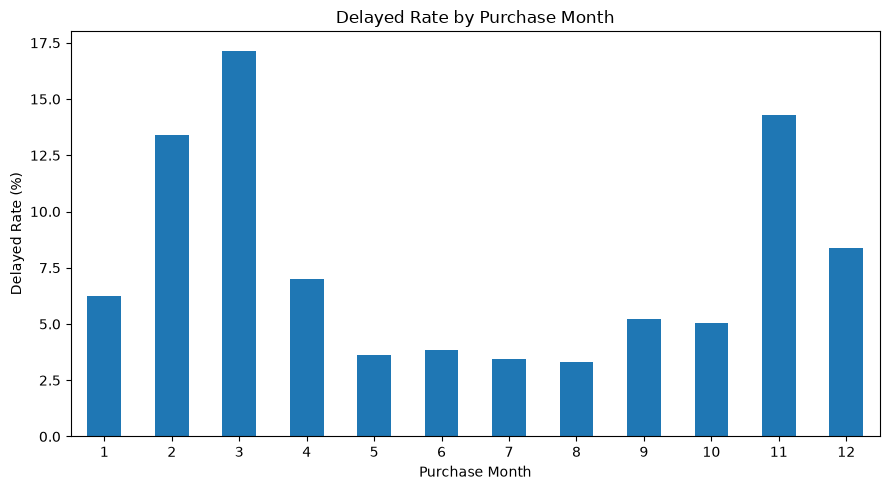

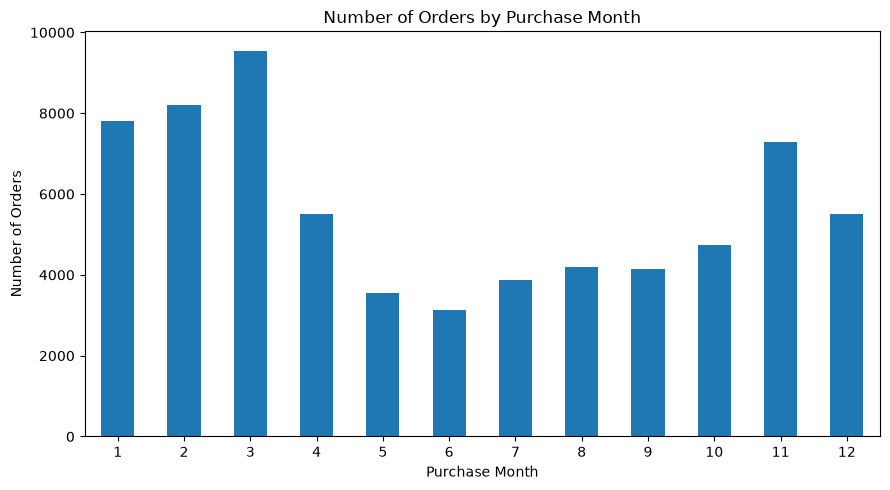

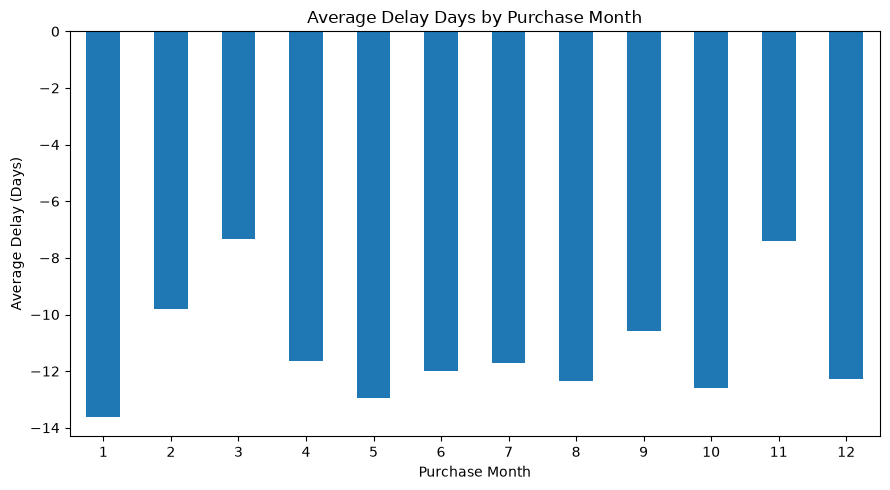

<Figure size 1000x500 with 0 Axes>

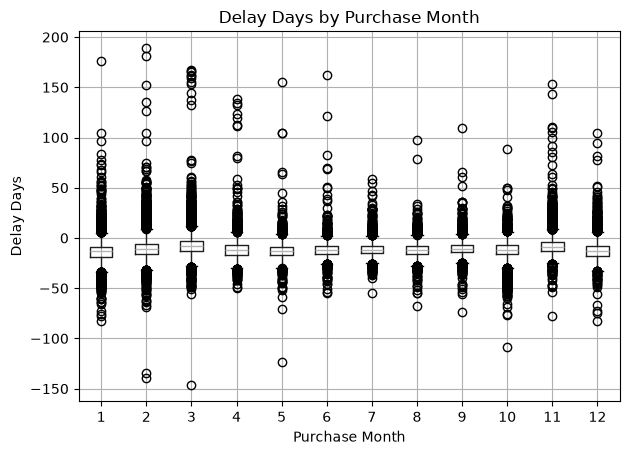

In [107]:
# ============================================================
# PURCHASE MONTH — TEMPORAL EDA
# ============================================================

print("=" * 90)
print("PURCHASE MONTH EDA")
print("=" * 90)


# ============================================================
# 1. EXTRACT MONTH
# ============================================================

train["purchase_month"] = train["purchase_time_min"].dt.month


# ============================================================
# 2. SUMMARY
# ============================================================

print("\n--- Summary ---")

print("Unique months:", train["purchase_month"].nunique())
print("Missing:", train["purchase_month"].isna().sum())

display(
    train["purchase_month"]
    .describe()
    .to_frame()
    .T
    .round(2)
)


# ============================================================
# 3. ORDERS + TARGET BY MONTH
# ============================================================

month_summary = (
    train.groupby("purchase_month")
    .agg(
        orders=("order_id", "count"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

month_summary["delayed_rate"] *= 100

print("\n--- Purchase Month vs Target ---")

display(
    month_summary.round(2)
)


# ============================================================
# 4. PEARSON CORRELATION
# ============================================================

print("\n" + "=" * 90)
print("PURCHASE MONTH vs TARGET — PEARSON")
print("=" * 90)

print(
    "Pearson with delay_days:",
    train[
        ["purchase_month", "delay_days"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)

print(
    "Pearson with delayed:",
    train[
        ["purchase_month", "delayed"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)


# ============================================================
# 5. DELAY RATE BY MONTH
# ============================================================

plt.figure(figsize=(9, 5))

(
    month_summary
    .set_index("purchase_month")["delayed_rate"]
    .plot(kind="bar")
)

plt.title("Delayed Rate by Purchase Month")
plt.xlabel("Purchase Month")
plt.ylabel("Delayed Rate (%)")
plt.xticks(range(12), range(1, 13), rotation=0)
plt.tight_layout()
plt.show()


# ============================================================
# 6. NUMBER OF ORDERS BY MONTH
# ============================================================

plt.figure(figsize=(9, 5))

(
    month_summary
    .set_index("purchase_month")["orders"]
    .plot(kind="bar")
)

plt.title("Number of Orders by Purchase Month")
plt.xlabel("Purchase Month")
plt.ylabel("Number of Orders")
plt.xticks(range(12), range(1, 13), rotation=0)
plt.tight_layout()
plt.show()


# ============================================================
# 7. AVERAGE DELAY BY MONTH
# ============================================================

plt.figure(figsize=(9, 5))

(
    month_summary
    .set_index("purchase_month")["avg_delay_days"]
    .plot(kind="bar")
)

plt.title("Average Delay Days by Purchase Month")
plt.xlabel("Purchase Month")
plt.ylabel("Average Delay (Days)")
plt.xticks(range(12), range(1, 13), rotation=0)
plt.tight_layout()
plt.show()


# ============================================================
# 8. DELAY DISTRIBUTION BY MONTH
# ============================================================

plt.figure(figsize=(10, 5))

train.boxplot(
    column="delay_days",
    by="purchase_month"
)

plt.title("Delay Days by Purchase Month")
plt.suptitle("")
plt.xlabel("Purchase Month")
plt.ylabel("Delay Days")
plt.tight_layout()
plt.show()

## Delivered&Estimated


DELIVERED DATE — SUMMARY
                       count  missing  missing_%  unique                 min  \
delivered_date_min     67533        0        0.0   66958 2016-10-11 13:46:32   
delivered_date_max     67533        0        0.0   66958 2016-10-11 13:46:32   
delivered_date_median  67533        0        0.0   66958 2016-10-11 13:46:32   

                                      max  
delivered_date_min    2018-09-19 23:24:07  
delivered_date_max    2018-09-19 23:24:07  
delivered_date_median 2018-09-19 23:24:07  

ESTIMATED DELIVERY DATE — SUMMARY
                                count  missing  missing_%  unique        min  \
estimated_delivery_date_min     67533        0        0.0     356 2016-10-04   
estimated_delivery_date_max     67533        0        0.0     356 2016-10-04   
estimated_delivery_date_median  67533        0        0.0     356 2016-10-04   

                                      max  
estimated_delivery_date_min    2018-08-03  
estimated_delivery_date_max    20

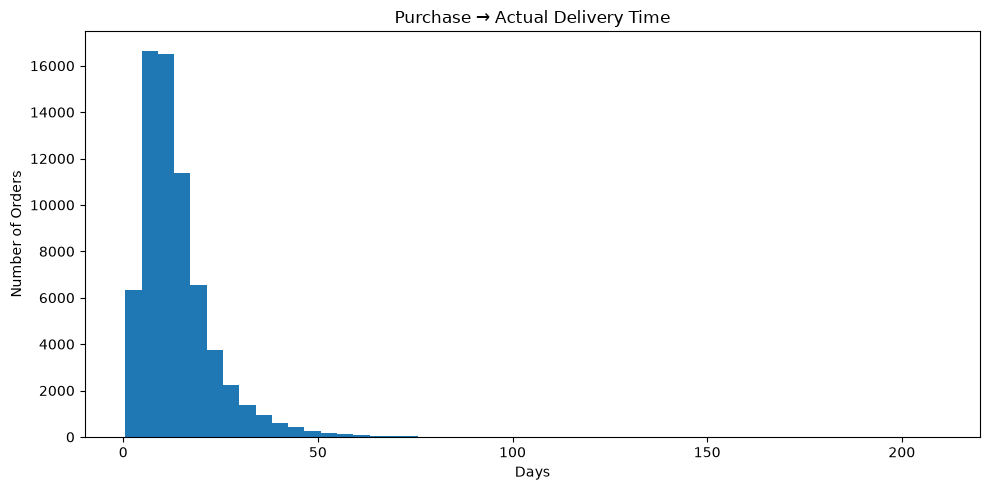

<Figure size 800x500 with 0 Axes>

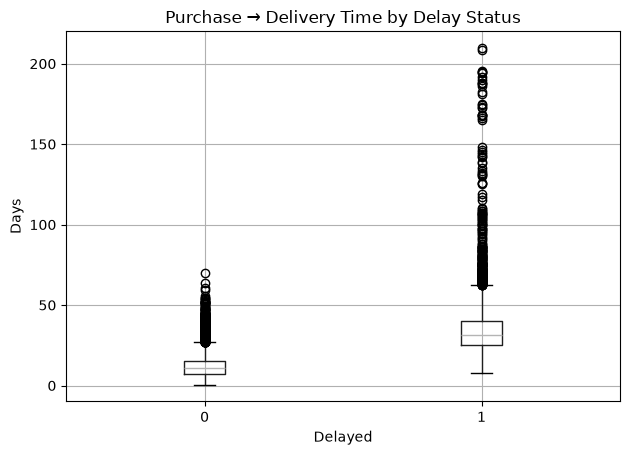

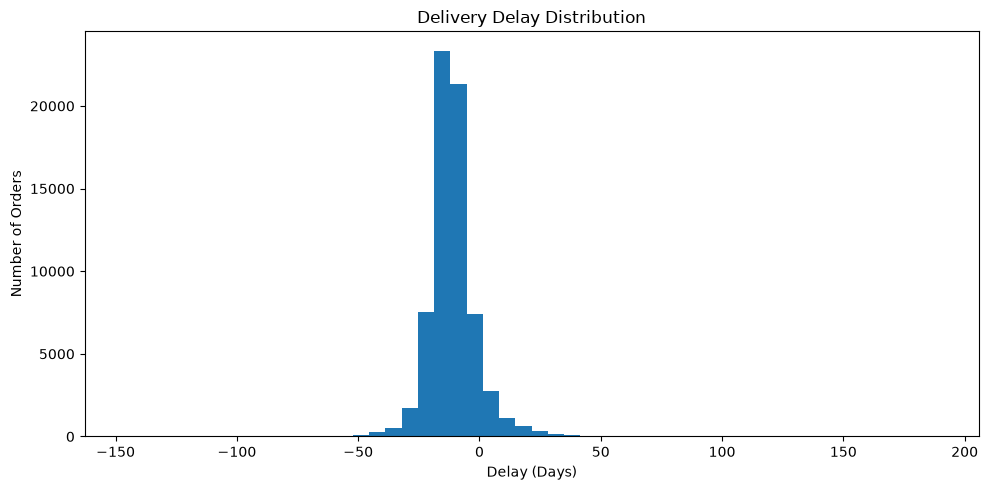

In [108]:
# ============================================================
# DELIVERED + ESTIMATED DELIVERY DATE — DATETIME EDA
# ============================================================

delivered_cols = [
    "delivered_date_min",
    "delivered_date_max",
    "delivered_date_median"
]

estimated_cols = [
    "estimated_delivery_date_min",
    "estimated_delivery_date_max",
    "estimated_delivery_date_median"
]

# ------------------------------------------------------------
# 1. Convert to datetime
# ------------------------------------------------------------

for col in delivered_cols + estimated_cols:
    train[col] = pd.to_datetime(
        train[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# 2. Basic summaries
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELIVERED DATE — SUMMARY")
print("=" * 100)

delivered_summary = pd.DataFrame({
    "count": train[delivered_cols].count(),
    "missing": train[delivered_cols].isna().sum(),
    "missing_%": train[delivered_cols].isna().mean() * 100,
    "unique": train[delivered_cols].nunique(),
    "min": train[delivered_cols].min(),
    "max": train[delivered_cols].max()
})

print(delivered_summary)

print("\n" + "=" * 100)
print("ESTIMATED DELIVERY DATE — SUMMARY")
print("=" * 100)

estimated_summary = pd.DataFrame({
    "count": train[estimated_cols].count(),
    "missing": train[estimated_cols].isna().sum(),
    "missing_%": train[estimated_cols].isna().mean() * 100,
    "unique": train[estimated_cols].nunique(),
    "min": train[estimated_cols].min(),
    "max": train[estimated_cols].max()
})

print(estimated_summary)

# ------------------------------------------------------------
# 3. Consistency checks
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DATE CONSISTENCY CHECK")
print("=" * 100)

invalid_delivered = (
    (train["delivered_date_min"] > train["delivered_date_median"]) |
    (train["delivered_date_median"] > train["delivered_date_max"])
).sum()

invalid_estimated = (
    (train["estimated_delivery_date_min"] >
     train["estimated_delivery_date_median"]) |
    (train["estimated_delivery_date_median"] >
     train["estimated_delivery_date_max"])
).sum()

print(
    f"Invalid delivered min <= median <= max: "
    f"{invalid_delivered:,}"
)

print(
    f"Invalid estimated min <= median <= max: "
    f"{invalid_estimated:,}"
)

# ------------------------------------------------------------
# 4. Actual delivery time
# Purchase → Delivered
# ------------------------------------------------------------

train["purchase_to_delivery_days"] = (
    (
        train["delivered_date_median"]
        -
        train["purchase_time_median"]
    ).dt.total_seconds() / 86400
)

print("\n" + "=" * 100)
print("PURCHASE → DELIVERY")
print("=" * 100)

print(
    train["purchase_to_delivery_days"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 5. Estimated delivery time
# Purchase → Estimated
# ------------------------------------------------------------

train["purchase_to_estimated_days"] = (
    (
        train["estimated_delivery_date_median"]
        -
        train["purchase_time_median"]
    ).dt.total_seconds() / 86400
)

print("\n" + "=" * 100)
print("PURCHASE → ESTIMATED DELIVERY")
print("=" * 100)

print(
    train["purchase_to_estimated_days"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 6. Recalculate delay
# Actual - Estimated
# ------------------------------------------------------------

train["calculated_delay_days"] = (
    (
        train["delivered_date_median"]
        -
        train["estimated_delivery_date_median"]
    ).dt.total_seconds() / 86400
)

print("\n" + "=" * 100)
print("CALCULATED DELAY")
print("=" * 100)

print(
    train["calculated_delay_days"]
    .describe()
    .round(2)
)

# ------------------------------------------------------------
# 7. Compare calculated delay with target
# ------------------------------------------------------------

delay_difference = (
    train["calculated_delay_days"]
    -
    train["delay_days"]
)

print("\n" + "=" * 100)
print("TARGET CONSISTENCY CHECK")
print("=" * 100)

print(
    f"Maximum absolute difference: "
    f"{delay_difference.abs().max():.6f}"
)

print(
    f"Rows with different delay values: "
    f"{(delay_difference.abs() > 1e-6).sum():,}"
)

# ------------------------------------------------------------
# 8. Delayed vs on-time delivery
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELIVERY TIME VS DELAY")
print("=" * 100)

delivery_delay_comparison = (
    train.groupby("delayed")["purchase_to_delivery_days"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    )
)

print(
    delivery_delay_comparison.round(2)
)

# ------------------------------------------------------------
# 9. Delay distribution by target
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("DELAY DAYS BY TARGET")
print("=" * 100)

print(
    train.groupby("delayed")["delay_days"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        min="min",
        max="max"
    )
    .round(2)
)

# ------------------------------------------------------------
# 10. Visualization — actual delivery time
# ------------------------------------------------------------

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
train["purchase_to_delivery_days"].plot(
    kind="hist",
    bins=50
)
plt.title("Purchase → Actual Delivery Time")
plt.xlabel("Days")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 11. Visualization — actual delivery by target
# ------------------------------------------------------------

plt.figure(figsize=(8, 5))
train.boxplot(
    column="purchase_to_delivery_days",
    by="delayed"
)
plt.title("Purchase → Delivery Time by Delay Status")
plt.suptitle("")
plt.xlabel("Delayed")
plt.ylabel("Days")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 12. Visualization — delay distribution
# ------------------------------------------------------------

plt.figure(figsize=(10, 5))
train["delay_days"].plot(
    kind="hist",
    bins=50
)
plt.title("Delivery Delay Distribution")
plt.xlabel("Delay (Days)")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()

## Delay (Target)

TARGET EDA

delay_days — CONTINUOUS TARGET

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
delay_days,67533.0,-10.77,10.49,-146.02,-15.97,-11.94,-7.01,188.98



--- Missing Values ---
0

--- Unique Values ---
65314

--- Quantiles ---


,delay_days
0.00,-146.02
0.01,-34.31
0.05,-24.14
0.25,-15.97
0.50,-11.94
0.75,-7.01
0.95,5.76
0.99,21.86
1.00,188.98


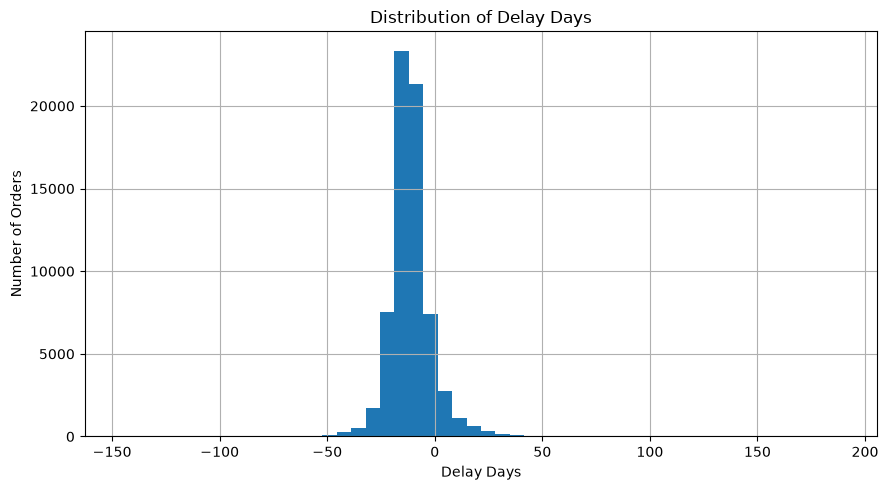

/tmp/ipykernel_829/3738277618.py:48: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(train["delay_days"], vert=False)


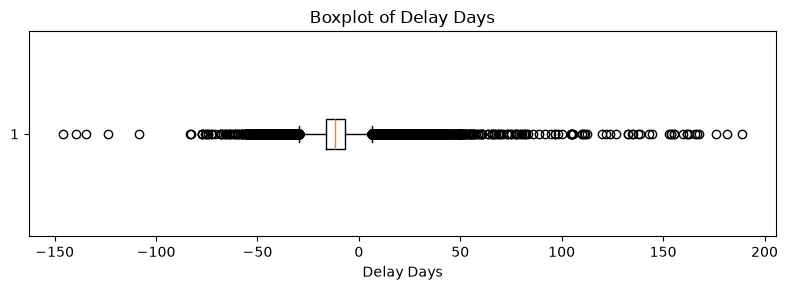


delayed — BINARY TARGET

--- Value Counts ---
delayed
0    61436
1     6097
Name: count, dtype: int64

--- Percentage ---


,percentage
delayed,
0,90.97
1,9.03


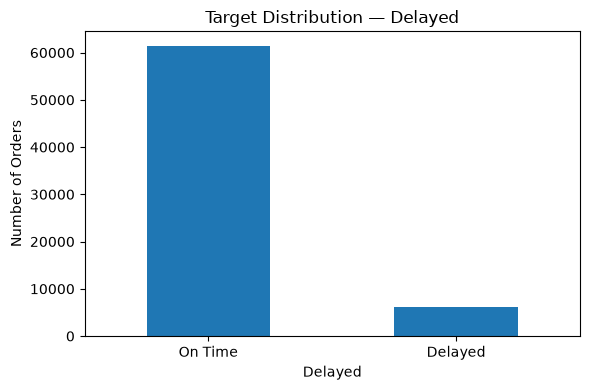


delay_days vs delayed


,count,min,mean,median,max
delayed,,,,,
0,61436,-146.02,-12.90,-12.34,-0.00
1,6097,0.00,10.63,6.77,188.98



--- Target Consistency Check ---
Inconsistent rows: 0


In [109]:
# ============================================================
# TARGET — delay_days + delayed
# ============================================================

print("=" * 90)
print("TARGET EDA")
print("=" * 90)


# ============================================================
# 1. delay_days — Continuous Target
# ============================================================

print("\n" + "=" * 90)
print("delay_days — CONTINUOUS TARGET")
print("=" * 90)

print("\n--- Summary ---")
display(train["delay_days"].describe().to_frame().T.round(2))

print("\n--- Missing Values ---")
print(train["delay_days"].isna().sum())

print("\n--- Unique Values ---")
print(train["delay_days"].nunique())

print("\n--- Quantiles ---")
display(
    train["delay_days"]
    .quantile([0, 0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99, 1.00])
    .to_frame("delay_days")
    .round(2)
)


# Distribution
plt.figure(figsize=(9, 5))
train["delay_days"].hist(bins=50)
plt.title("Distribution of Delay Days")
plt.xlabel("Delay Days")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()


# Boxplot
plt.figure(figsize=(8, 3))
plt.boxplot(train["delay_days"], vert=False)
plt.title("Boxplot of Delay Days")
plt.xlabel("Delay Days")
plt.tight_layout()
plt.show()


# ============================================================
# 2. delayed — Binary Target
# ============================================================

print("\n" + "=" * 90)
print("delayed — BINARY TARGET")
print("=" * 90)

print("\n--- Value Counts ---")
print(train["delayed"].value_counts().sort_index())

print("\n--- Percentage ---")
display(
    train["delayed"]
    .value_counts(normalize=True)
    .sort_index()
    .mul(100)
    .round(2)
    .rename("percentage")
    .to_frame()
)


# Target distribution
plt.figure(figsize=(6, 4))
train["delayed"].value_counts().sort_index().plot(kind="bar")
plt.title("Target Distribution — Delayed")
plt.xlabel("Delayed")
plt.ylabel("Number of Orders")
plt.xticks([0, 1], ["On Time", "Delayed"], rotation=0)
plt.tight_layout()
plt.show()


# ============================================================
# 3. Relationship between both targets
# ============================================================

print("\n" + "=" * 90)
print("delay_days vs delayed")
print("=" * 90)

display(
    train.groupby("delayed")["delay_days"]
    .agg(["count", "min", "mean", "median", "max"])
    .round(2)
)


# Check consistency
print("\n--- Target Consistency Check ---")

inconsistent = (
    ((train["delayed"] == 1) & (train["delay_days"] <= 0)) |
    ((train["delayed"] == 0) & (train["delay_days"] > 0))
)

print("Inconsistent rows:", inconsistent.sum())

# 6- Geography

## customer

### customer_city

CITY GROUPING — DELAY ANALYSIS
Total cities:             3,747
Cities with >= 5 orders: 1,321
Cities excluded:          2,426

DELAY DISTRIBUTION ACROSS CITIES
Minimum mean delay:    -24.69 days
Q1:                    -14.04 days
Median:                -12.01 days
Q3:                    -10.07 days
Maximum mean delay:    20.98 days
Std of city means:      4.13 days

CITIES WITH LOWEST AVERAGE DELAY


,customer_city,count,mean_delay,median_delay,std_delay,delayed_rate
0,presidente bernardes,5,-24.69,-27.54,13.28,0.00
1,afogados da ingazeira,6,-24.40,-22.16,8.70,0.00
2,cacoal,5,-24.39,-23.23,4.80,0.00
3,encruzilhada do sul,5,-23.83,-19.01,14.19,0.00
4,jaru,6,-23.01,-22.11,6.05,0.00
5,espigao do oeste,5,-22.59,-20.41,4.37,0.00
6,diamantino,5,-22.53,-19.26,6.15,0.00
7,rondon do para,7,-22.48,-19.22,16.18,0.00
8,bayeux,5,-22.18,-19.37,6.45,0.00
9,sao gabriel,16,-22.15,-18.36,30.84,12.50



CITIES WITH HIGHEST AVERAGE DELAY


,customer_city,count,mean_delay,median_delay,std_delay,delayed_rate
1320,perdizes,5,20.98,-13.20,79.28,20.00
1319,currais novos,5,20.41,-9.26,66.23,40.00
1318,montanha,8,10.26,-13.35,69.32,12.50
1317,lagarto,10,9.50,-9.66,55.93,30.00
1316,tiangua,9,6.37,-1.19,29.57,44.44
1315,acarau,7,5.55,5.01,18.14,71.43
1314,porto real,7,5.23,4.78,22.50,57.14
1313,presidente dutra,11,4.78,-8.04,33.77,36.36
1312,sumidouro,5,4.54,1.03,14.39,80.00
1311,armacao dos buzios,17,4.47,3.46,12.17,64.71



COMPARISON OF CITY GROUPING LEVELS


,groups_requested,groups_created,cramers_v,chi2,p_value,min_city_count,max_city_count,min_orders,max_orders,min_mean_delay,max_mean_delay,min_delayed_rate,max_delayed_rate
0,2,2,0.0837,442.0845,0.0,660,661,14039,49019,-13.6776,-9.8237,4.5445,10.3184
1,3,3,0.1086,743.7651,0.0,440,441,5876,36292,-15.2217,-9.2815,2.8761,11.5838
2,4,4,0.1634,1684.4493,0.0,330,331,3893,29748,-16.0560,-8.2578,2.3632,15.9151
3,5,5,0.1535,1485.3915,0.0,264,265,2874,31102,-16.6545,-7.4344,2.2269,17.6250
4,6,6,0.1590,1594.7652,0.0,220,221,2371,26844,-17.0213,-7.1109,2.1088,18.9458
5,8,8,0.1788,2016.3683,0.0,165,166,1648,22270,-17.6486,-6.2676,2.0631,21.7214
6,10,10,0.1687,1793.9013,0.0,132,133,1201,22502,-18.2259,-5.5047,1.9983,23.7921
7,12,12,0.1809,2063.3940,0.0,110,111,982,17021,-18.6050,-4.9828,2.0878,24.4267
8,15,15,0.1808,2061.9149,0.0,88,89,811,14446,-18.9398,-4.2474,1.6377,26.6573
9,18,18,0.1876,2220.2626,0.0,73,74,659,13105,-19.2965,-3.8878,1.9637,27.5956



BEST CITY GROUPING BY CRAMÉR'S V
Groups created:       25
Cramér's V:           0.1886
Chi-square:           2243.1942
P-value:              0.0000000000
Min cities/group:     52
Max cities/group:     53

BEST CITY DELAY GROUPS — 25 GROUPS


,delay_group,city_count,orders,mean_delay,median_delay,delayed,delayed_rate
0,"(-24.689, -18.337]",53,397,-20.27,-20.03,5,1.26
1,"(-18.337, -16.889]",53,546,-17.52,-17.29,16,2.93
2,"(-16.889, -16.006]",53,581,-16.33,-15.56,11,1.89
3,"(-16.006, -15.412]",53,716,-15.70,-15.29,16,2.23
4,"(-15.412, -14.699]",53,634,-15.01,-14.47,16,2.52
5,"(-14.699, -14.175]",52,867,-14.42,-14.25,25,2.88
6,"(-14.175, -13.728]",53,715,-13.90,-13.50,26,3.64
7,"(-13.728, -13.311]",53,1063,-13.55,-13.45,39,3.67
8,"(-13.311, -12.937]",53,2234,-13.05,-13.24,111,4.97
9,"(-12.937, -12.625]",53,1509,-12.81,-13.25,94,6.23



CITY → DELAY GROUP


,customer_city,count,mean_delay,median_delay,delayed_rate,delay_group
0,presidente bernardes,5,-24.69,-27.54,0.00,"(-24.689, -18.337]"
1,afogados da ingazeira,6,-24.40,-22.16,0.00,"(-24.689, -18.337]"
2,cacoal,5,-24.39,-23.23,0.00,"(-24.689, -18.337]"
3,encruzilhada do sul,5,-23.83,-19.01,0.00,"(-24.689, -18.337]"
4,jaru,6,-23.01,-22.11,0.00,"(-24.689, -18.337]"
...,...,...,...,...,...,...
1316,tiangua,9,6.37,-1.19,44.44,"(-5.059, 20.981]"
1317,lagarto,10,9.50,-9.66,30.00,"(-5.059, 20.981]"
1318,montanha,8,10.26,-13.35,12.50,"(-5.059, 20.981]"
1319,currais novos,5,20.41,-9.26,40.00,"(-5.059, 20.981]"


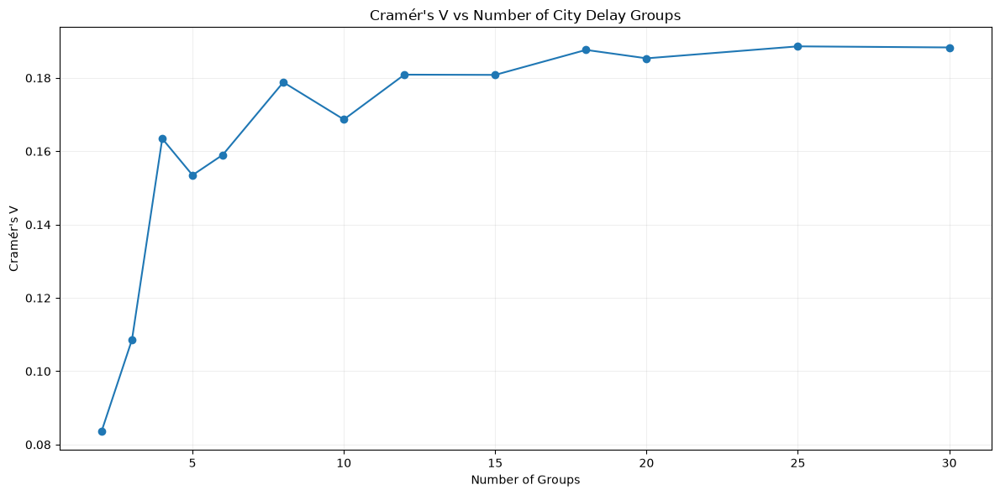

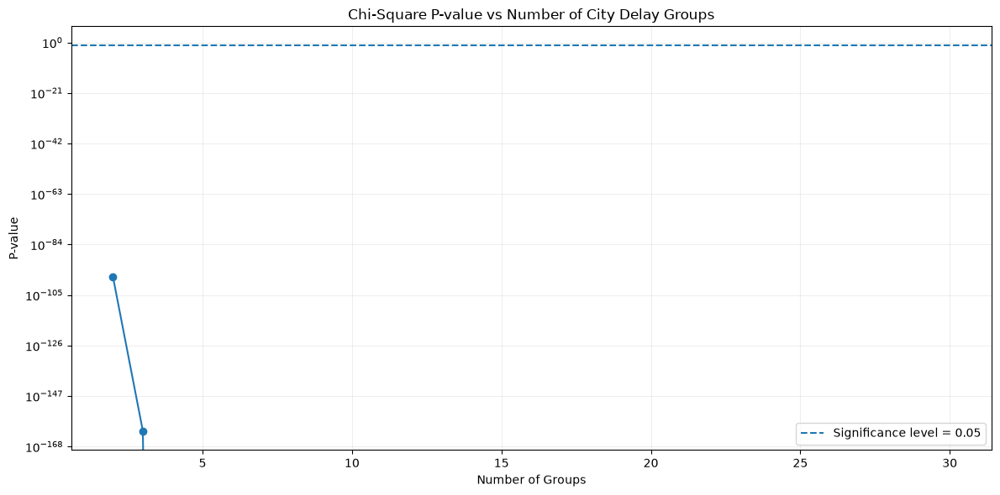

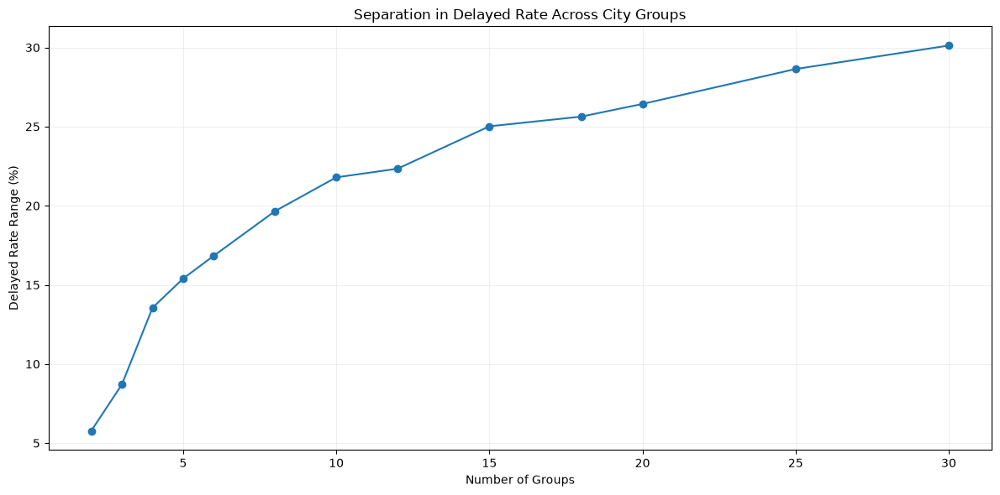

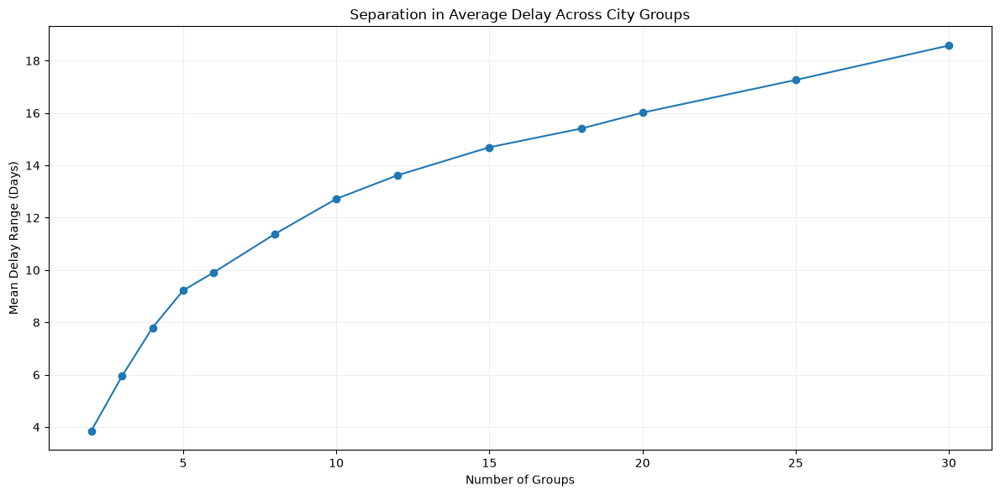

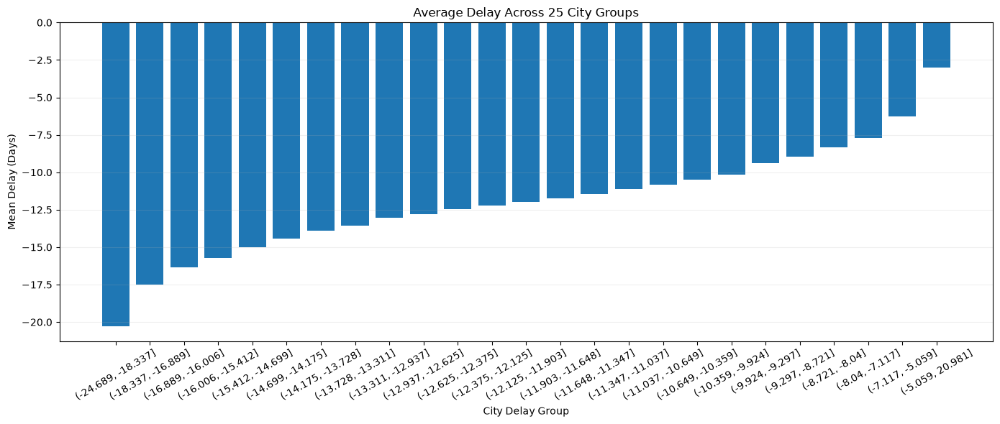

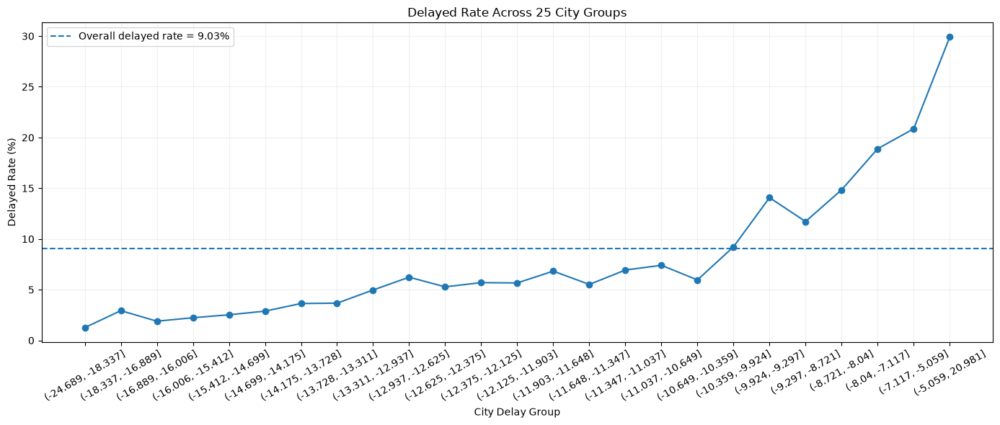

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# ============================================================
# SETTINGS
# ============================================================

city_col = "customer_city"
delay_col = "delay_days"
target = "delayed"

min_count = 5

group_options = [
    2, 3, 4, 5, 6, 8, 10,
    12, 15, 18, 20, 25, 30
]

# ============================================================
# PREPARE DATA
# ============================================================

df = train[[city_col, delay_col, target]].copy()

df[delay_col] = pd.to_numeric(
    df[delay_col],
    errors="coerce"
)

df = df.dropna(
    subset=[city_col, delay_col, target]
)

# ============================================================
# CITY-LEVEL SUMMARY
# ============================================================

city_summary = (
    df.groupby(city_col)
    .agg(
        count=(delay_col, "count"),
        mean_delay=(delay_col, "mean"),
        median_delay=(delay_col, "median"),
        std_delay=(delay_col, "std"),
        delayed=(target, "sum"),
        delayed_rate=(target, "mean")
    )
    .reset_index()
)

city_summary["delayed_rate"] *= 100

# ============================================================
# REMOVE RARE CITIES
# ============================================================

city_valid = city_summary[
    city_summary["count"] >= min_count
].copy()

city_valid = city_valid.sort_values(
    "mean_delay"
).reset_index(drop=True)

print("=" * 100)
print("CITY GROUPING — DELAY ANALYSIS")
print("=" * 100)

print(f"Total cities:             {len(city_summary):,}")
print(f"Cities with >= {min_count} orders: {len(city_valid):,}")
print(f"Cities excluded:          {len(city_summary) - len(city_valid):,}")

# ============================================================
# CITY DELAY DISTRIBUTION
# ============================================================

print("\n" + "=" * 100)
print("DELAY DISTRIBUTION ACROSS CITIES")
print("=" * 100)

print(
    f"Minimum mean delay:    "
    f"{city_valid['mean_delay'].min():.2f} days"
)

print(
    f"Q1:                    "
    f"{city_valid['mean_delay'].quantile(.25):.2f} days"
)

print(
    f"Median:                "
    f"{city_valid['mean_delay'].median():.2f} days"
)

print(
    f"Q3:                    "
    f"{city_valid['mean_delay'].quantile(.75):.2f} days"
)

print(
    f"Maximum mean delay:    "
    f"{city_valid['mean_delay'].max():.2f} days"
)

print(
    f"Std of city means:      "
    f"{city_valid['mean_delay'].std():.2f} days"
)

# ============================================================
# LOWEST DELAY CITIES
# ============================================================

print("\n" + "=" * 100)
print("CITIES WITH LOWEST AVERAGE DELAY")
print("=" * 100)

display(
    city_valid[
        [
            city_col,
            "count",
            "mean_delay",
            "median_delay",
            "std_delay",
            "delayed_rate"
        ]
    ]
    .head(30)
    .round(2)
)

# ============================================================
# HIGHEST DELAY CITIES
# ============================================================

print("\n" + "=" * 100)
print("CITIES WITH HIGHEST AVERAGE DELAY")
print("=" * 100)

display(
    city_valid[
        [
            city_col,
            "count",
            "mean_delay",
            "median_delay",
            "std_delay",
            "delayed_rate"
        ]
    ]
    .tail(30)
    .sort_values(
        "mean_delay",
        ascending=False
    )
    .round(2)
)

# ============================================================
# TEST DIFFERENT NUMBERS OF GROUPS
# ============================================================

results = []

for n_groups in group_options:

    temp = city_valid.copy()

    try:

        # ----------------------------------------------------
        # GROUP CITIES BY SIMILAR AVERAGE DELAY
        # ----------------------------------------------------

        temp["delay_group"] = pd.qcut(
            temp["mean_delay"],
            q=n_groups,
            duplicates="drop"
        )

        # ----------------------------------------------------
        # MAP GROUPS BACK TO ORDERS
        # ----------------------------------------------------

        analysis = df.merge(
            temp[
                [
                    city_col,
                    "delay_group"
                ]
            ],
            on=city_col,
            how="inner"
        )

        # ----------------------------------------------------
        # CONTINGENCY TABLE
        # ----------------------------------------------------

        contingency = pd.crosstab(
            analysis["delay_group"],
            analysis[target]
        )

        # ----------------------------------------------------
        # CHI-SQUARE
        # ----------------------------------------------------

        chi2, p_value, dof, expected = (
            chi2_contingency(contingency)
        )

        # ----------------------------------------------------
        # CRAMÉR'S V
        # ----------------------------------------------------

        n = contingency.values.sum()
        r, k = contingency.shape

        cramers_v = np.sqrt(
            chi2 /
            (
                n *
                min(r - 1, k - 1)
            )
        )

        # ----------------------------------------------------
        # GROUP SIZES
        # ----------------------------------------------------

        group_city_counts = (
            temp["delay_group"]
            .value_counts()
        )

        group_order_counts = (
            analysis
            .groupby(
                "delay_group",
                observed=True
            )
            .size()
        )

        # ----------------------------------------------------
        # GROUP DELAY
        # ----------------------------------------------------

        group_mean_delay = (
            analysis
            .groupby(
                "delay_group",
                observed=True
            )[delay_col]
            .mean()
        )

        # ----------------------------------------------------
        # TARGET RATE
        # ----------------------------------------------------

        delayed_rates = (
            analysis
            .groupby(
                "delay_group",
                observed=True
            )[target]
            .mean()
            * 100
        )

        # ----------------------------------------------------
        # SAVE RESULTS
        # ----------------------------------------------------

        results.append({

            "groups_requested":
                n_groups,

            "groups_created":
                temp["delay_group"].nunique(),

            "cramers_v":
                cramers_v,

            "chi2":
                chi2,

            "p_value":
                p_value,

            "min_city_count":
                group_city_counts.min(),

            "max_city_count":
                group_city_counts.max(),

            "min_orders":
                group_order_counts.min(),

            "max_orders":
                group_order_counts.max(),

            "min_mean_delay":
                group_mean_delay.min(),

            "max_mean_delay":
                group_mean_delay.max(),

            "min_delayed_rate":
                delayed_rates.min(),

            "max_delayed_rate":
                delayed_rates.max()
        })

    except Exception as e:

        print(
            f"Could not evaluate "
            f"{n_groups} groups: {e}"
        )

# ============================================================
# RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(results)

print("\n" + "=" * 100)
print("COMPARISON OF CITY GROUPING LEVELS")
print("=" * 100)

display(
    results_df[
        [
            "groups_requested",
            "groups_created",
            "cramers_v",
            "chi2",
            "p_value",
            "min_city_count",
            "max_city_count",
            "min_orders",
            "max_orders",
            "min_mean_delay",
            "max_mean_delay",
            "min_delayed_rate",
            "max_delayed_rate"
        ]
    ].round(4)
)

# ============================================================
# BEST GROUPING BY CRAMÉR'S V
# ============================================================

best = results_df.loc[
    results_df["cramers_v"].idxmax()
]

print("\n" + "=" * 100)
print("BEST CITY GROUPING BY CRAMÉR'S V")
print("=" * 100)

print(
    f"Groups created:       "
    f"{int(best['groups_created'])}"
)

print(
    f"Cramér's V:           "
    f"{best['cramers_v']:.4f}"
)

print(
    f"Chi-square:           "
    f"{best['chi2']:.4f}"
)

print(
    f"P-value:              "
    f"{best['p_value']:.10f}"
)

print(
    f"Min cities/group:     "
    f"{int(best['min_city_count'])}"
)

print(
    f"Max cities/group:     "
    f"{int(best['max_city_count'])}"
)

# ============================================================
# CREATE BEST GROUPING
# ============================================================

best_n = int(
    best["groups_created"]
)

city_grouped = city_valid.copy()

city_grouped["delay_group"] = pd.qcut(
    city_grouped["mean_delay"],
    q=best_n,
    duplicates="drop"
)

# ============================================================
# BEST GROUP SUMMARY
# ============================================================

best_analysis = df.merge(
    city_grouped[
        [
            city_col,
            "delay_group"
        ]
    ],
    on=city_col,
    how="inner"
)

best_group_summary = (
    best_analysis
    .groupby(
        "delay_group",
        observed=True
    )
    .agg(
        city_count=(city_col, "nunique"),
        orders=(city_col, "size"),
        mean_delay=(delay_col, "mean"),
        median_delay=(delay_col, "median"),
        delayed=(target, "sum"),
        delayed_rate=(target, "mean")
    )
    .reset_index()
)

best_group_summary["delayed_rate"] *= 100

print("\n" + "=" * 100)
print(
    f"BEST CITY DELAY GROUPS — "
    f"{best_n} GROUPS"
)
print("=" * 100)

display(
    best_group_summary.round(2)
)

# ============================================================
# CITY → GROUP MAPPING
# ============================================================

print("\n" + "=" * 100)
print("CITY → DELAY GROUP")
print("=" * 100)

display(
    city_grouped[
        [
            city_col,
            "count",
            "mean_delay",
            "median_delay",
            "delayed_rate",
            "delay_group"
        ]
    ]
    .sort_values(
        "mean_delay"
    )
    .round(2)
)

# ============================================================
# 1. CRAMÉR'S V VS NUMBER OF GROUPS
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    results_df["groups_created"],
    results_df["cramers_v"],
    marker="o"
)

plt.xlabel("Number of Groups")
plt.ylabel("Cramér's V")
plt.title(
    "Cramér's V vs Number of City Delay Groups"
)

plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. P-VALUE VS NUMBER OF GROUPS
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    results_df["groups_created"],
    results_df["p_value"],
    marker="o"
)

plt.axhline(
    0.05,
    linestyle="--",
    label="Significance level = 0.05"
)

plt.xlabel("Number of Groups")
plt.ylabel("P-value")
plt.title(
    "Chi-Square P-value vs Number of City Delay Groups"
)

plt.yscale("log")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. DELAY RATE RANGE
# ============================================================

plt.figure(figsize=(12, 6))

rate_range = (
    results_df["max_delayed_rate"]
    -
    results_df["min_delayed_rate"]
)

plt.plot(
    results_df["groups_created"],
    rate_range,
    marker="o"
)

plt.xlabel("Number of Groups")
plt.ylabel(
    "Delayed Rate Range (%)"
)

plt.title(
    "Separation in Delayed Rate Across City Groups"
)

plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. MEAN DELAY RANGE
# ============================================================

plt.figure(figsize=(12, 6))

delay_range = (
    results_df["max_mean_delay"]
    -
    results_df["min_mean_delay"]
)

plt.plot(
    results_df["groups_created"],
    delay_range,
    marker="o"
)

plt.xlabel("Number of Groups")
plt.ylabel(
    "Mean Delay Range (Days)"
)

plt.title(
    "Separation in Average Delay Across City Groups"
)

plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 5. BEST GROUPS — MEAN DELAY
# ============================================================

plt.figure(figsize=(14, 6))

plt.bar(
    best_group_summary["delay_group"].astype(str),
    best_group_summary["mean_delay"]
)

plt.xlabel("City Delay Group")
plt.ylabel("Mean Delay (Days)")
plt.title(
    f"Average Delay Across {best_n} City Groups"
)

plt.xticks(rotation=30)
plt.grid(
    axis="y",
    alpha=0.2
)

plt.tight_layout()
plt.show()

# ============================================================
# 6. BEST GROUPS — DELAYED RATE
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    best_group_summary["delay_group"].astype(str),
    best_group_summary["delayed_rate"],
    marker="o"
)

plt.axhline(
    df[target].mean() * 100,
    linestyle="--",
    label=(
        f"Overall delayed rate = "
        f"{df[target].mean() * 100:.2f}%"
    )
)

plt.xlabel("City Delay Group")
plt.ylabel("Delayed Rate (%)")
plt.title(
    f"Delayed Rate Across {best_n} City Groups"
)

plt.xticks(rotation=30)
plt.legend()
plt.grid(alpha=0.2)

plt.tight_layout()
plt.show()

In [112]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# ============================================================
# SETTINGS
# ============================================================

col = "customer_city"
target = "delayed"
min_count = 5

# ============================================================
# BASIC INFORMATION
# ============================================================

x = train[[col, target]].dropna().copy()

print("=" * 80)
print(f"ANALYSIS — {col}")
print("=" * 80)

print("\n--- BASIC INFORMATION ---")
print(f"Total rows:          {len(train):,}")
print(f"Missing values:      {train[col].isna().sum():,}")
print(f"Valid values:        {len(x):,}")
print(f"Unique categories:   {x[col].nunique():,}")
print(f"Data type:           {train[col].dtype}")

# ============================================================
# TOP CATEGORIES
# ============================================================

print("\n--- TOP 20 CATEGORIES BY FREQUENCY ---")

frequency = (
    x[col]
    .value_counts()
    .head(20)
    .rename("frequency")
    .to_frame()
)

frequency["percentage"] = (
    frequency["frequency"] / len(x) * 100
).round(3)

display(frequency)

# ============================================================
# CARDINALITY
# ============================================================

counts = x[col].value_counts()

print("\n--- CARDINALITY ---")
print(f"Unique categories:       {len(counts):,}")
print(f"Category-to-row ratio:   {len(counts) / len(x):.4f}")
print(f"Categories used once:    {(counts == 1).sum():,}")
print(f"Categories used <= 5:    {(counts <= 5).sum():,}")
print(f"Categories used <= 10:   {(counts <= 10).sum():,}")

# ============================================================
# TARGET RELATIONSHIP
# ============================================================

print("\n" + "=" * 80)
print(f"{col} vs TARGET")
print("=" * 80)

target_by_category = (
    x.groupby(col, observed=True)[target]
    .agg(
        count="count",
        delayed="sum",
        delayed_rate="mean"
    )
)

target_by_category["delayed_rate"] *= 100

# ============================================================
# CHI-SQUARE + CRAMÉR'S V
# ============================================================

contingency = pd.crosstab(
    x[col],
    x[target]
)

chi2, p_value, dof, expected = chi2_contingency(
    contingency
)

n = contingency.values.sum()
r, k = contingency.shape

cramers_v = np.sqrt(
    chi2 / (n * min(r - 1, k - 1))
)

print("\n--- CHI-SQUARE TEST ---")
print(f"Chi-square statistic: {chi2:.4f}")
print(f"Degrees of freedom:   {dof:,}")
print(f"P-value:              {p_value:.10f}")
print(f"Cramér's V:           {cramers_v:.4f}")

if p_value < 0.05:
    print("Result: Significant association with the target.")
else:
    print("Result: No statistically significant association.")

# ============================================================
# CATEGORIES WITH ENOUGH OBSERVATIONS
# ============================================================

valid_categories = counts[counts >= min_count].index

valid_summary = (
    target_by_category
    .loc[target_by_category.index.isin(valid_categories)]
    .sort_values("delayed_rate", ascending=False)
)

print("\n--- HIGHEST DELAYED-RATE CATEGORIES ---")

display(
    valid_summary.head(20).round(2)
)

print("\n--- LOWEST DELAYED-RATE CATEGORIES ---")

display(
    valid_summary.tail(20).sort_values("delayed_rate").round(2)
)

# ============================================================
# OVERALL TARGET RATE
# ============================================================

print("\n--- TARGET RATE COMPARISON ---")

overall_rate = x[target].mean() * 100

print(f"Overall delayed rate:              {overall_rate:.2f}%")
print(
    f"Category delayed-rate mean "
    f"(count >= {min_count}):           "
    f"{valid_summary['delayed_rate'].mean():.2f}%"
)
print(
    f"Category delayed-rate std:         "
    f"{valid_summary['delayed_rate'].std():.2f}%"
)
print(
    f"Category delayed-rate min:         "
    f"{valid_summary['delayed_rate'].min():.2f}%"
)
print(
    f"Category delayed-rate max:         "
    f"{valid_summary['delayed_rate'].max():.2f}%"
)

ANALYSIS — customer_city

--- BASIC INFORMATION ---
Total rows:          67,533
Missing values:      0
Valid values:        67,533
Unique categories:   3,747
Data type:           str

--- TOP 20 CATEGORIES BY FREQUENCY ---


,frequency,percentage
customer_city,,
sao paulo,9921,14.691
rio de janeiro,4780,7.078
belo horizonte,1869,2.768
brasilia,1395,2.066
curitiba,1020,1.510
porto alegre,975,1.444
campinas,967,1.432
salvador,823,1.219
guarulhos,724,1.072



--- CARDINALITY ---
Unique categories:       3,747
Category-to-row ratio:   0.0555
Categories used once:    1,219
Categories used <= 5:    2,630
Categories used <= 10:   3,058

customer_city vs TARGET

--- CHI-SQUARE TEST ---
Chi-square statistic: 6154.5455
Degrees of freedom:   3,746
P-value:              0.0000000000
Cramér's V:           0.3019
Result: Significant association with the target.

--- HIGHEST DELAYED-RATE CATEGORIES ---


,count,delayed,delayed_rate
customer_city,,,
sumidouro,5,4,80.00
acarau,7,5,71.43
armacao dos buzios,17,11,64.71
senges,5,3,60.00
porto real,7,4,57.14
catu,9,4,44.44
tiangua,9,4,44.44
trancoso,5,2,40.00
inhambupe,5,2,40.00



--- LOWEST DELAYED-RATE CATEGORIES ---


,count,delayed,delayed_rate
customer_city,,,
osvaldo cruz,14,0,0.0
ourilandia do norte,5,0,0.0
pacaembu,5,0,0.0
paicandu,5,0,0.0
panorama,5,0,0.0
papanduva,5,0,0.0
campos novos,5,0,0.0
canapolis,6,0,0.0
canavieiras,5,0,0.0



--- TARGET RATE COMPARISON ---
Overall delayed rate:              9.03%
Category delayed-rate mean (count >= 5):           8.12%
Category delayed-rate std:         9.85%
Category delayed-rate min:         0.00%
Category delayed-rate max:         80.00%


CUSTOMER CITY vs ZIP — EDA

--- CITY ↔ ZIP ---
Unique cities: 3747
Unique ZIPs: 13748
Cramér's V: 0.9976
ZIPs mapped to one city: 99.75 %
Cities mapped to one ZIP: 86.44 %


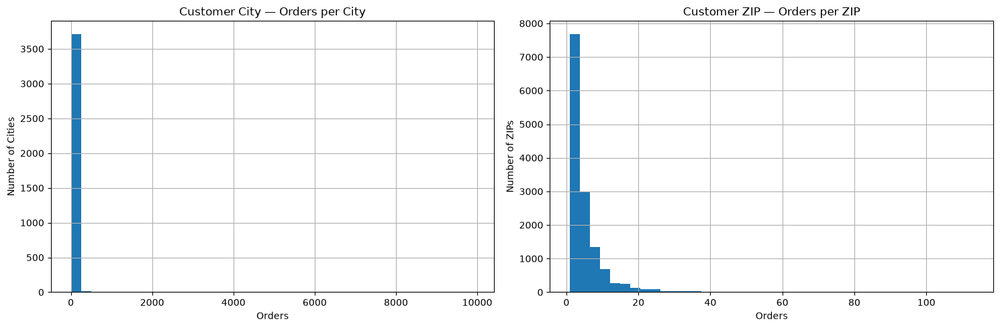


--- CITY vs DELAY ---
Cities with >=10 orders: 755
City delayed-rate range: 0.0 % → 64.71 %
City avg-delay range: -22.15 → 9.5

--- ZIP vs DELAY ---
ZIPs with >=10 orders: 1723
ZIP delayed-rate range: 0.0 % → 64.71 %
ZIP avg-delay range: -22.15 → 9.5


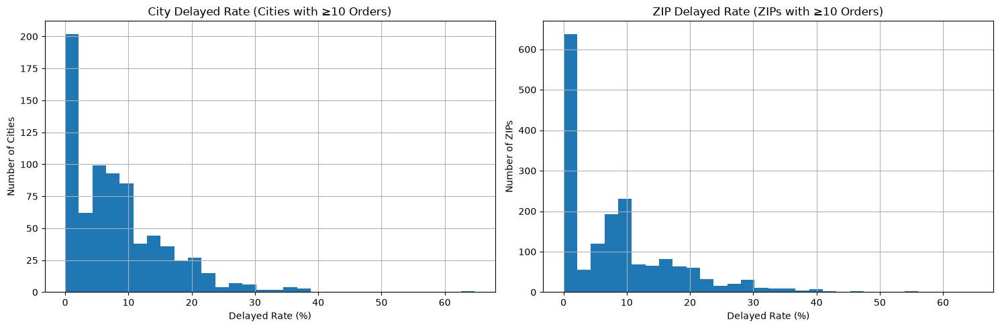

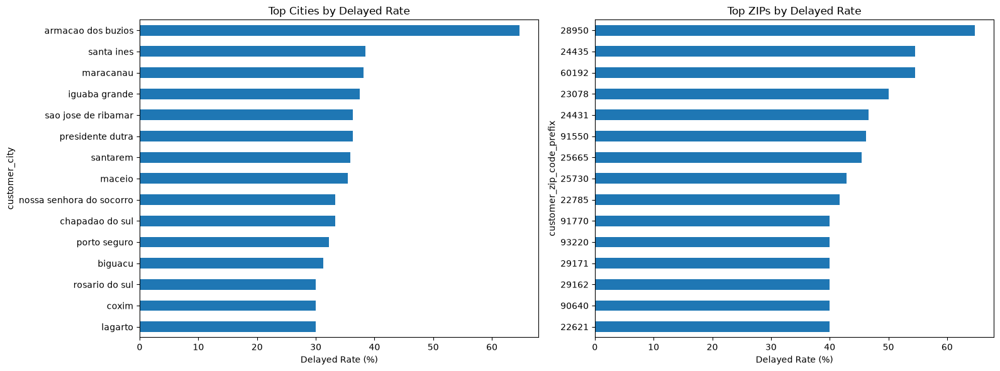

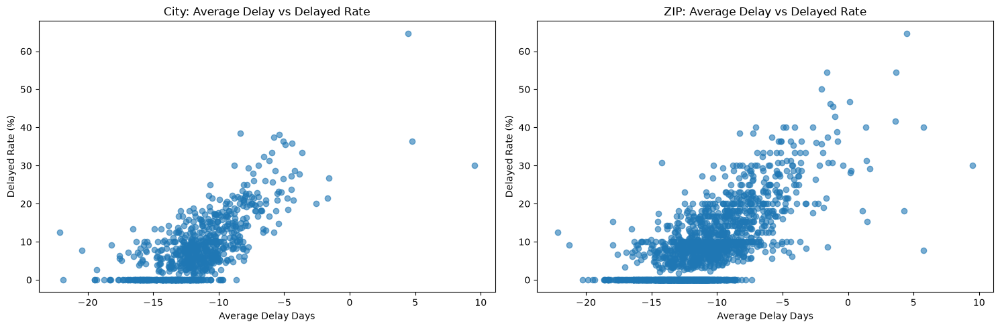


KEY VALUES
Overall delayed rate: 9.03 %
Overall mean delay_days: -10.77

City:
  Pearson(avg delay, delayed rate): 0.714
  Spearman: 0.671

ZIP:
  Pearson(avg delay, delayed rate): 0.6958
  Spearman: 0.6383


In [34]:
# ============================================================
# CUSTOMER CITY vs ZIP — DISTRIBUTION & DELAY
# ============================================================

from scipy.stats import chi2_contingency
import numpy as np
import matplotlib.pyplot as plt

city = train["customer_city"]
zip_col = train["customer_zip_code_prefix"]

print("=" * 90)
print("CUSTOMER CITY vs ZIP — EDA")
print("=" * 90)


# ============================================================
# 1. GENERAL RELATIONSHIP — CITY ↔ ZIP
# ============================================================

contingency = pd.crosstab(city, zip_col)

chi2, p, dof, expected = chi2_contingency(contingency)

n = contingency.values.sum()
r, k = contingency.shape

cramers_v = np.sqrt(
    chi2 / (n * min(r - 1, k - 1))
)

city_zip_corr = (
    train.groupby(zip_col)["customer_city"]
    .nunique()
)

zip_city_corr = (
    train.groupby(city)["customer_zip_code_prefix"]
    .nunique()
)

print("\n--- CITY ↔ ZIP ---")
print("Unique cities:", city.nunique())
print("Unique ZIPs:", zip_col.nunique())
print("Cramér's V:", round(cramers_v, 4))
print("ZIPs mapped to one city:",
      round((city_zip_corr == 1).mean() * 100, 2), "%")
print("Cities mapped to one ZIP:",
      round((zip_city_corr == 1).mean() * 100, 2), "%")


# ============================================================
# 2. CITY DISTRIBUTION
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

city.value_counts().hist(
    bins=40,
    ax=axes[0]
)
axes[0].set_title("Customer City — Orders per City")
axes[0].set_xlabel("Orders")
axes[0].set_ylabel("Number of Cities")

zip_col.value_counts().hist(
    bins=40,
    ax=axes[1]
)
axes[1].set_title("Customer ZIP — Orders per ZIP")
axes[1].set_xlabel("Orders")
axes[1].set_ylabel("Number of ZIPs")

plt.tight_layout()
plt.show()


# ============================================================
# 3. CITY vs DELAY
# ============================================================

city_target = (
    train.groupby(city)
    .agg(
        orders=("order_id", "count"),
        delayed_rate=("delayed", "mean"),
        avg_delay=("delay_days", "mean")
    )
)

city_target["delayed_rate"] *= 100

city_10 = city_target[city_target["orders"] >= 10]

print("\n--- CITY vs DELAY ---")
print("Cities with >=10 orders:", len(city_10))
print("City delayed-rate range:",
      round(city_10["delayed_rate"].min(), 2), "%",
      "→",
      round(city_10["delayed_rate"].max(), 2), "%")

print(
    "City avg-delay range:",
    round(city_10["avg_delay"].min(), 2),
    "→",
    round(city_10["avg_delay"].max(), 2)
)


# ============================================================
# 4. ZIP vs DELAY
# ============================================================

zip_target = (
    train.groupby(zip_col)
    .agg(
        orders=("order_id", "count"),
        delayed_rate=("delayed", "mean"),
        avg_delay=("delay_days", "mean")
    )
)

zip_target["delayed_rate"] *= 100

zip_10 = zip_target[zip_target["orders"] >= 10]

print("\n--- ZIP vs DELAY ---")
print("ZIPs with >=10 orders:", len(zip_10))
print("ZIP delayed-rate range:",
      round(zip_10["delayed_rate"].min(), 2), "%",
      "→",
      round(zip_10["delayed_rate"].max(), 2), "%")

print(
    "ZIP avg-delay range:",
    round(zip_10["avg_delay"].min(), 2),
    "→",
    round(zip_10["avg_delay"].max(), 2)
)


# ============================================================
# 5. TARGET DISTRIBUTION — CITY vs ZIP
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

city_10["delayed_rate"].hist(
    bins=30,
    ax=axes[0]
)
axes[0].set_title("City Delayed Rate (Cities with ≥10 Orders)")
axes[0].set_xlabel("Delayed Rate (%)")
axes[0].set_ylabel("Number of Cities")

zip_10["delayed_rate"].hist(
    bins=30,
    ax=axes[1]
)
axes[1].set_title("ZIP Delayed Rate (ZIPs with ≥10 Orders)")
axes[1].set_xlabel("Delayed Rate (%)")
axes[1].set_ylabel("Number of ZIPs")

plt.tight_layout()
plt.show()


# ============================================================
# 6. TOP CITY / ZIP DELAY RATES
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

city_top = (
    city_10
    .sort_values("delayed_rate", ascending=False)
    .head(15)
)

zip_top = (
    zip_10
    .sort_values("delayed_rate", ascending=False)
    .head(15)
)

city_top["delayed_rate"].sort_values().plot(
    kind="barh",
    ax=axes[0]
)
axes[0].set_title("Top Cities by Delayed Rate")
axes[0].set_xlabel("Delayed Rate (%)")

zip_top["delayed_rate"].sort_values().plot(
    kind="barh",
    ax=axes[1]
)
axes[1].set_title("Top ZIPs by Delayed Rate")
axes[1].set_xlabel("Delayed Rate (%)")

plt.tight_layout()
plt.show()


# ============================================================
# 7. CITY vs ZIP HISTORICAL DELAY
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].scatter(
    city_10["avg_delay"],
    city_10["delayed_rate"],
    alpha=0.6
)
axes[0].set_title("City: Average Delay vs Delayed Rate")
axes[0].set_xlabel("Average Delay Days")
axes[0].set_ylabel("Delayed Rate (%)")

axes[1].scatter(
    zip_10["avg_delay"],
    zip_10["delayed_rate"],
    alpha=0.6
)
axes[1].set_title("ZIP: Average Delay vs Delayed Rate")
axes[1].set_xlabel("Average Delay Days")
axes[1].set_ylabel("Delayed Rate (%)")

plt.tight_layout()
plt.show()


# ============================================================
# 8. FINAL TARGET CORRELATION VALUES
# ============================================================

print("\n" + "=" * 90)
print("KEY VALUES")
print("=" * 90)

print("Overall delayed rate:",
      round(train["delayed"].mean() * 100, 2), "%")

print("Overall mean delay_days:",
      round(train["delay_days"].mean(), 2))

print("\nCity:")
print("  Pearson(avg delay, delayed rate):",
      round(
          city_10["avg_delay"].corr(
              city_10["delayed_rate"],
              method="pearson"
          ), 4
      ))
print("  Spearman:",
      round(
          city_10["avg_delay"].corr(
              city_10["delayed_rate"],
              method="spearman"
          ), 4
      ))

print("\nZIP:")
print("  Pearson(avg delay, delayed rate):",
      round(
          zip_10["avg_delay"].corr(
              zip_10["delayed_rate"],
              method="pearson"
          ), 4
      ))
print("  Spearman:",
      round(
          zip_10["avg_delay"].corr(
              zip_10["delayed_rate"],
              method="spearman"
          ), 4
      ))

### customer_zip_code_prefix


CUSTOMER ZIP CODE — CARDINALITY & FREQUENCY
Total rows            : 67,533
Unique ZIP prefixes   : 13,748
Missing ZIPs          : 0
ZIPs with 1 order     : 3,577
ZIPs with <=5 orders  : 9,947
ZIPs with >=10 orders : 1,723
ZIPs with >=50 orders : 29

ZIP frequency statistics:


count    13748.00
mean         4.91
std          5.99
min          1.00
25%          1.00
50%          3.00
75%          6.00
max        113.00
Name: count, dtype: float64

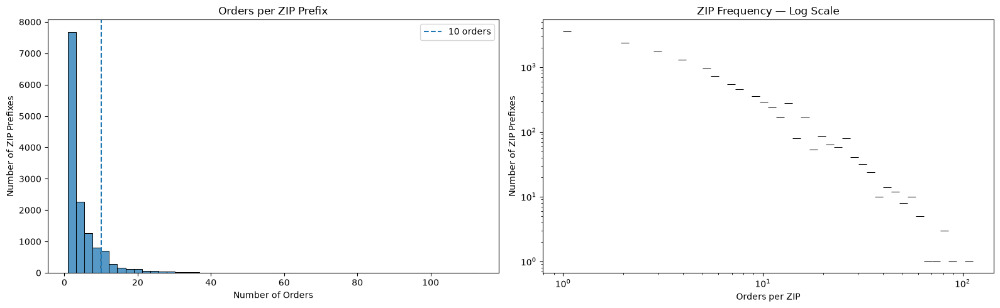


ZIP HISTORICAL TARGET BEHAVIOR
ZIPs with >= 10 orders : 1,723


,customer_zip_code_prefix,orders,mean_delay_days,median_delay_days,delayed_rate
13550,97300,16,-22.150,-18.358,12.500
9099,58051,11,-21.300,-23.136,9.091
5888,25946,10,-20.281,-18.283,0.000
10315,69918,10,-19.830,-19.849,0.000
12342,87005,12,-19.504,-15.592,0.000
13652,98910,10,-19.327,-19.804,0.000
11214,76824,15,-18.631,-22.144,0.000
6651,30626,10,-18.596,-16.320,0.000
8286,45820,12,-18.561,-16.787,0.000
4083,13225,16,-18.492,-16.735,0.000



ZIP HISTORICAL DELAY vs DELAY RATE
Pearson correlation  : 0.6958
Spearman correlation : 0.6383


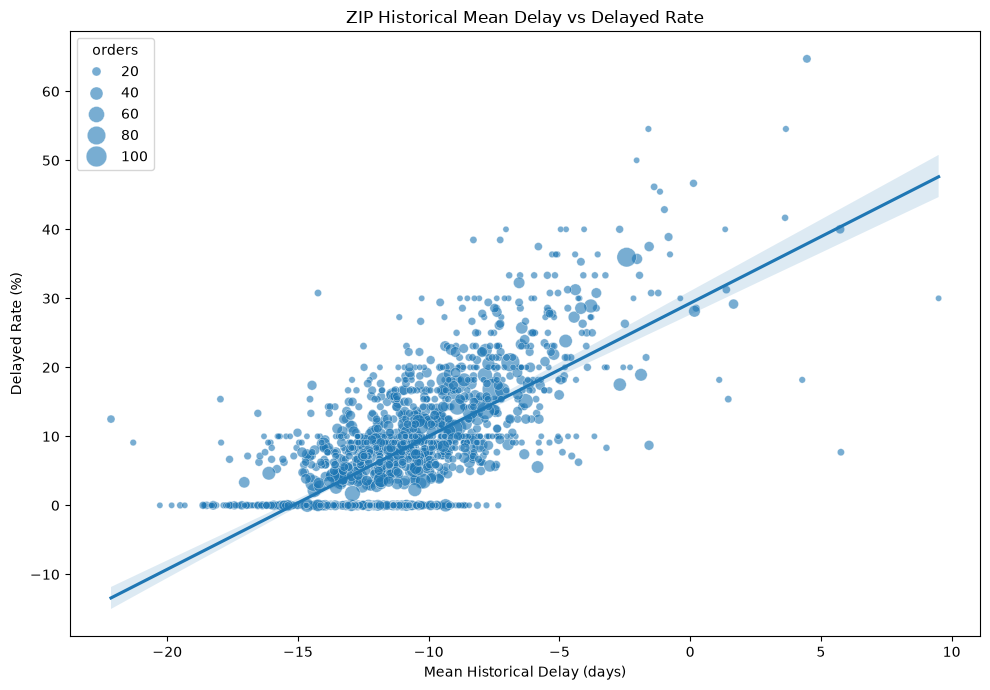


ZIP DELAY GROUPING — COMPARISON


,groups_tested,actual_groups,chi2,p_value,cramers_v,min_group_orders,max_group_orders,min_delayed_rate_%,max_delayed_rate_%
0,5,5,1338.1069,0.0,0.2148,5355,6247,2.6704,19.8236
1,10,10,1503.7815,0.0,0.2277,2449,3148,2.2458,24.2647
2,15,15,1561.8818,0.0,0.2320,1569,2195,1.8483,27.0733
3,20,20,1570.2196,0.0,0.2326,1150,1696,2.0870,27.6944
4,25,25,1594.4629,0.0,0.2344,910,1349,1.9628,29.4167
5,30,30,1602.7035,0.0,0.2350,746,1152,1.7011,30.2846


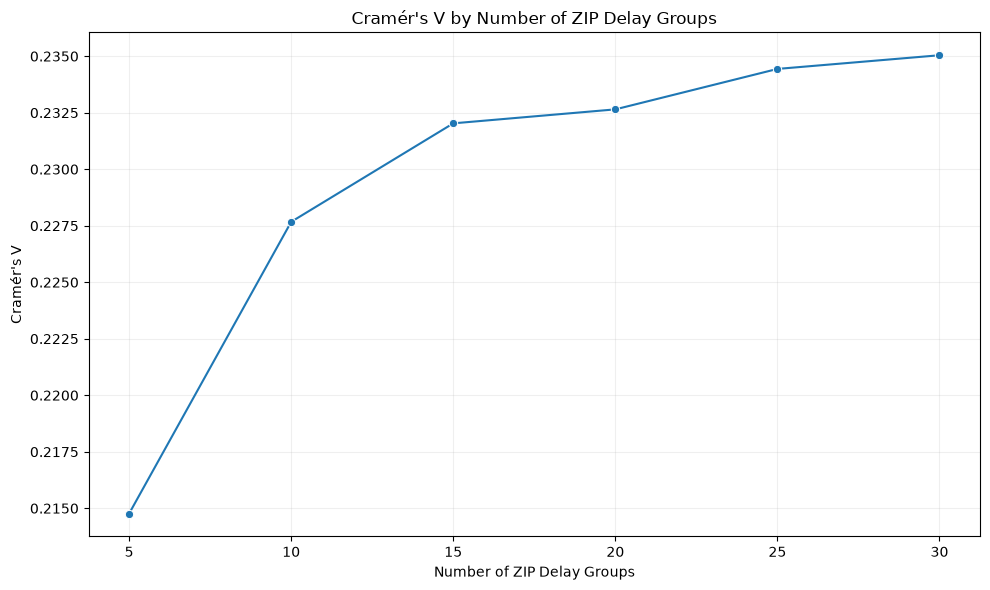


20 ZIP DELAY GROUPS — TARGET BEHAVIOR


,orders,delayed_orders,delayed_rate,mean_delay_days,median_delay_days
delay_group,,,,,
0,1150,24,2.087,-17.017,-16.169
1,1299,31,2.386,-15.001,-14.272
2,1460,47,3.219,-14.161,-13.993
3,1446,41,2.835,-13.575,-13.320
4,1479,68,4.598,-13.111,-13.236
5,1404,55,3.917,-12.716,-12.461
6,1460,60,4.110,-12.391,-12.353
7,1431,89,6.219,-11.989,-12.338
8,1460,70,4.795,-11.679,-12.173


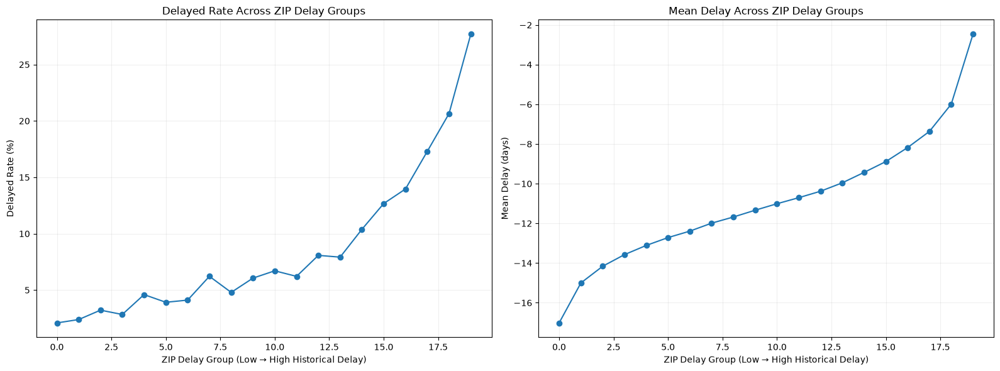


20 ZIP DELAY GROUPS — STATISTICAL ASSOCIATION
Groups              : 20
Chi-square          : 1570.2196
Degrees of freedom  : 19
P-value             : 0
Cramér's V          : 0.2326
Delayed rate range  : 2.09% – 27.69%


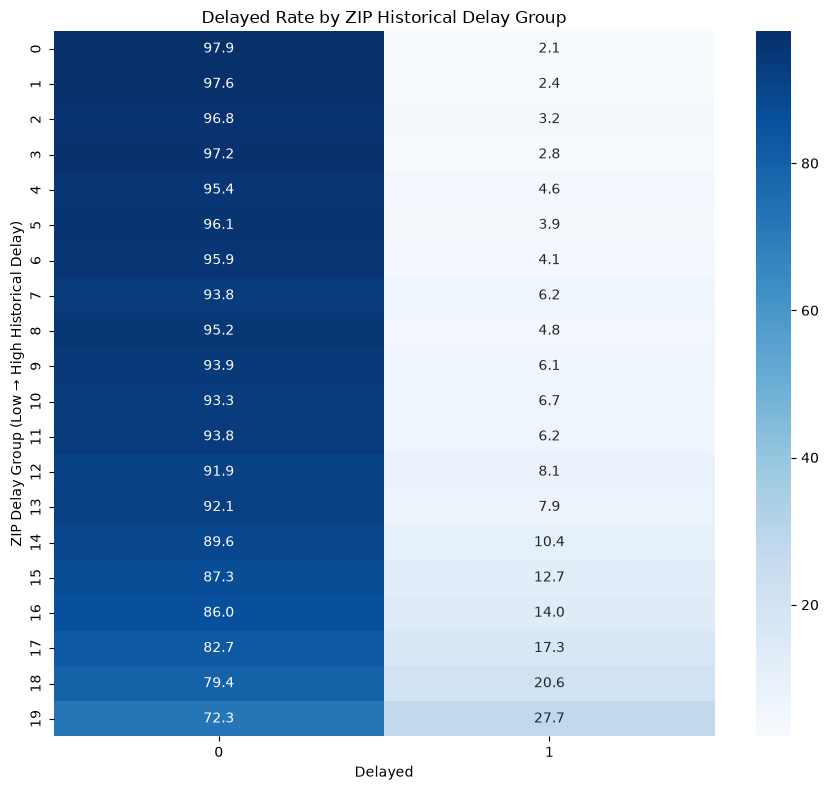


DELAY_DAYS — FIXED ±50-DAY THRESHOLD
Total rows          : 67,533
Below -50 days      : 88
Above +50 days      : 111
Total outliers      : 199
Outlier percentage  : 0.295%

Inside ±50 days     : 67,334 (99.705%)

Delay days statistics:


count    67533.000
mean       -10.773
std         10.487
min       -146.016
1%         -34.309
2.5%       -27.602
5%         -24.139
25%        -15.974
50%        -11.938
75%         -7.012
95%          5.761
97.5%       12.588
99%         21.857
max        188.975
Name: delay_days, dtype: float64

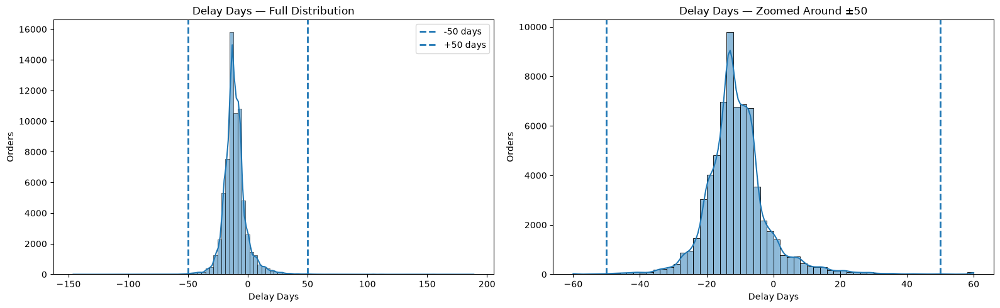


OUTLIER METHOD COMPARISON


,method,lower_threshold,upper_threshold,outliers,outlier_%
0,Fixed ±50 days,-50.0000,50.0000,199,0.2947
1,IQR,-29.4165,6.4307,4485,6.6412



Lowest delay values:


,order_id,delay_days,delayed
58587,0607f0efea4b566f1eb8f7d3c2397320,-146.016123,0
1483,c72727d29cde4cf870d569bf65edabfd,-139.397396,0
52071,eec7f369423b033e549c02f3c5381205,-134.308530,0
10196,c2bb89b5c1dd978d507284be78a04cb2,-123.433403,0
27154,40dc2ba6f322a17626aac6244332828c,-108.424225,0
41651,1a695d543b7302aa9446c8d5fbd632bf,-83.070567,0
48122,39e0115911bf404857e14baa7f097feb,-82.921829,0
33476,559eea5a72341a4c82dbce9884277cb7,-77.324421,0
49924,38930f76efb00b138f4d632e4d557341,-77.193299,0
28245,c5132855100a12d63ed4e8ae05f9594d,-77.151273,0



Highest delay values:


,order_id,delay_days,delayed
2639,2ba1366baecad3c3536f27546d129017,152.683171,1
4010,dfe5f68118c2576143240b8d78e5940a,153.759248,1
37776,ed8e9faf1b75f43ee027103957135663,153.765486,1
9422,6e82dcfb5eada6283dba34f164e636f5,155.456076,1
3260,2fb597c2f772eca01b1f5c561bf6cc7b,155.606447,1
3811,2d7561026d542c8dbd8f0daeadf67a43,159.609931,1
3314,0f4519c5f1c541ddec9f21b3bddd533a,161.609965,1
12358,d24e8541128cea179a11a65176e0a96f,161.775336,1
3886,c27815f7e3dd0b926b58552628481575,162.718345,1
3213,440d0d17af552815d15a9e41abe49359,165.633912,1


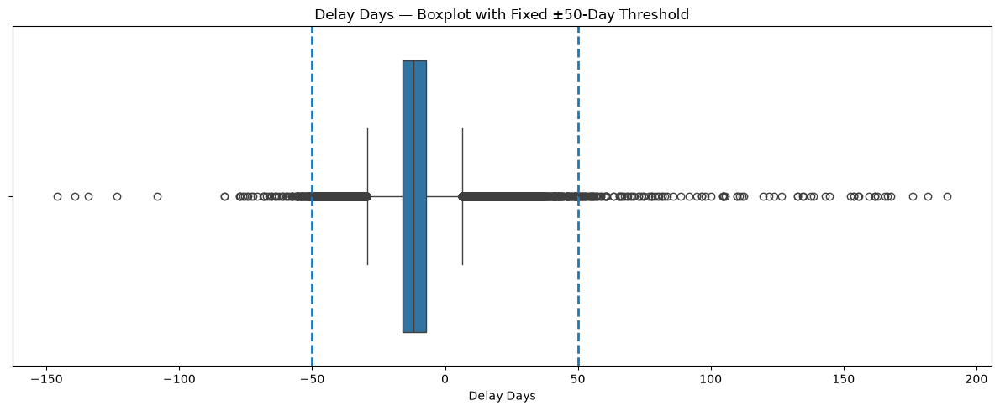


DELAY_DAYS — BEFORE vs AFTER ±50


,metric,Before,After ±50
0,Rows,67533.000,67334.000
1,Mean,-10.773,-10.872
2,Median,-11.938,-11.945
3,Std,10.487,9.317
4,Min,-146.016,-49.940
5,Max,188.975,49.996


In [29]:
# ============================================================
# CUSTOMER ZIP + DELAY_DAYS — EDA & FEATURE ENGINEERING DECISION
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import chi2_contingency


# ============================================================
# PART 1 — CUSTOMER ZIP CODE
# ============================================================

zip_col = "customer_zip_code_prefix"

print("\n" + "=" * 80)
print("CUSTOMER ZIP CODE — CARDINALITY & FREQUENCY")
print("=" * 80)

zip_counts = train[zip_col].value_counts()

print(f"Total rows            : {len(train):,}")
print(f"Unique ZIP prefixes   : {train[zip_col].nunique():,}")
print(f"Missing ZIPs          : {train[zip_col].isna().sum():,}")
print(f"ZIPs with 1 order     : {(zip_counts == 1).sum():,}")
print(f"ZIPs with <=5 orders  : {(zip_counts <= 5).sum():,}")
print(f"ZIPs with >=10 orders : {(zip_counts >= 10).sum():,}")
print(f"ZIPs with >=50 orders : {(zip_counts >= 50).sum():,}")

print("\nZIP frequency statistics:")
display(zip_counts.describe().round(2))


# ============================================================
# ZIP FREQUENCY — VISUAL
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

sns.histplot(
    zip_counts,
    bins=50,
    ax=axes[0]
)

axes[0].axvline(
    10,
    linestyle="--",
    label="10 orders"
)

axes[0].set_title("Orders per ZIP Prefix")
axes[0].set_xlabel("Number of Orders")
axes[0].set_ylabel("Number of ZIP Prefixes")
axes[0].legend()

sns.histplot(
    zip_counts,
    bins=50,
    log_scale=(True, True),
    ax=axes[1]
)

axes[1].set_title("ZIP Frequency — Log Scale")
axes[1].set_xlabel("Orders per ZIP")
axes[1].set_ylabel("Number of ZIP Prefixes")

plt.tight_layout()
plt.show()


# ============================================================
# PART 2 — ZIP HISTORICAL TARGET BEHAVIOR
# ============================================================

MIN_ZIP_ORDERS = 10

zip_stats = (
    train.groupby(zip_col)
    .agg(
        orders=("order_id", "size"),
        mean_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean")
    )
    .reset_index()
)

zip_stats["delayed_rate"] *= 100

zip_stats = zip_stats[
    zip_stats["orders"] >= MIN_ZIP_ORDERS
].copy()

print("\n" + "=" * 80)
print("ZIP HISTORICAL TARGET BEHAVIOR")
print("=" * 80)

print(f"ZIPs with >= {MIN_ZIP_ORDERS} orders : {len(zip_stats):,}")

display(
    zip_stats[
        [
            zip_col,
            "orders",
            "mean_delay_days",
            "median_delay_days",
            "delayed_rate"
        ]
    ]
    .sort_values("mean_delay_days")
    .head(15)
    .round(3)
)


# ============================================================
# ZIP MEAN DELAY vs DELAY RATE
# ============================================================

pearson_zip = zip_stats["mean_delay_days"].corr(
    zip_stats["delayed_rate"]
)

spearman_zip = zip_stats["mean_delay_days"].corr(
    zip_stats["delayed_rate"],
    method="spearman"
)

print("\n" + "=" * 80)
print("ZIP HISTORICAL DELAY vs DELAY RATE")
print("=" * 80)

print(f"Pearson correlation  : {pearson_zip:.4f}")
print(f"Spearman correlation : {spearman_zip:.4f}")


# ============================================================
# ZIP DELAY BEHAVIOR — VISUAL
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=zip_stats,
    x="mean_delay_days",
    y="delayed_rate",
    size="orders",
    sizes=(20, 250),
    alpha=0.6
)

sns.regplot(
    data=zip_stats,
    x="mean_delay_days",
    y="delayed_rate",
    scatter=False
)

plt.title(
    "ZIP Historical Mean Delay vs Delayed Rate"
)

plt.xlabel("Mean Historical Delay (days)")
plt.ylabel("Delayed Rate (%)")

plt.tight_layout()
plt.show()


# ============================================================
# PART 3 — TEST DIFFERENT ZIP GROUP COUNTS
# ============================================================

group_numbers = [5, 10, 15, 20, 25, 30]

zip_stats = zip_stats.sort_values(
    "mean_delay_days"
).reset_index(drop=True)

group_results = []

for n_groups in group_numbers:

    temp = zip_stats.copy()

    temp["delay_group"] = pd.qcut(
        temp["mean_delay_days"],
        q=n_groups,
        labels=False,
        duplicates="drop"
    )

    group_map = temp.set_index(
        zip_col
    )["delay_group"]

    analysis = train[
        [zip_col, "delayed", "delay_days"]
    ].copy()

    analysis["delay_group"] = (
        analysis[zip_col]
        .map(group_map)
    )

    analysis = analysis.dropna(
        subset=["delay_group"]
    )

    analysis["delay_group"] = (
        analysis["delay_group"]
        .astype(int)
    )

    contingency = pd.crosstab(
        analysis["delay_group"],
        analysis["delayed"]
    )

    chi2, p_value, dof, expected = chi2_contingency(
        contingency
    )

    n = contingency.values.sum()
    min_dim = min(contingency.shape) - 1

    cramers_v = np.sqrt(
        chi2 / (n * min_dim)
    )

    group_stats_temp = (
        analysis
        .groupby("delay_group")
        .agg(
            orders=("delayed", "size"),
            delayed_rate=("delayed", "mean")
        )
    )

    group_results.append({
        "groups_tested": n_groups,
        "actual_groups": analysis["delay_group"].nunique(),
        "chi2": chi2,
        "p_value": p_value,
        "cramers_v": cramers_v,
        "min_group_orders": group_stats_temp["orders"].min(),
        "max_group_orders": group_stats_temp["orders"].max(),
        "min_delayed_rate_%":
            group_stats_temp["delayed_rate"].min() * 100,
        "max_delayed_rate_%":
            group_stats_temp["delayed_rate"].max() * 100
    })


group_results = pd.DataFrame(group_results)

print("\n" + "=" * 80)
print("ZIP DELAY GROUPING — COMPARISON")
print("=" * 80)

display(
    group_results.round(4)
)


# ============================================================
# CRAMER'S V — VISUAL
# ============================================================

plt.figure(figsize=(10, 6))

sns.lineplot(
    data=group_results,
    x="groups_tested",
    y="cramers_v",
    marker="o"
)

plt.title(
    "Cramér's V by Number of ZIP Delay Groups"
)

plt.xlabel("Number of ZIP Delay Groups")
plt.ylabel("Cramér's V")
plt.xticks(group_numbers)

plt.grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# PART 4 — DETAILED ANALYSIS OF 20 GROUPS
# ============================================================

N_GROUPS = 20

zip_stats["delay_group"] = pd.qcut(
    zip_stats["mean_delay_days"],
    q=N_GROUPS,
    labels=False,
    duplicates="drop"
)

zip_group_map = (
    zip_stats
    .set_index(zip_col)["delay_group"]
)

zip_analysis = train[
    [zip_col, "delayed", "delay_days"]
].copy()

zip_analysis["delay_group"] = (
    zip_analysis[zip_col]
    .map(zip_group_map)
)

zip_analysis = zip_analysis.dropna(
    subset=["delay_group"]
)

zip_analysis["delay_group"] = (
    zip_analysis["delay_group"]
    .astype(int)
)

group_stats = (
    zip_analysis
    .groupby("delay_group")
    .agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        mean_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
)

group_stats["delayed_rate"] *= 100

print("\n" + "=" * 80)
print("20 ZIP DELAY GROUPS — TARGET BEHAVIOR")
print("=" * 80)

display(
    group_stats.round(3)
)


# ============================================================
# MONOTONIC RELATIONSHIP — VISUAL
# ============================================================

fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 6)
)

axes[0].plot(
    group_stats.index,
    group_stats["delayed_rate"],
    marker="o"
)

axes[0].set_title(
    "Delayed Rate Across ZIP Delay Groups"
)

axes[0].set_xlabel(
    "ZIP Delay Group (Low → High Historical Delay)"
)

axes[0].set_ylabel(
    "Delayed Rate (%)"
)

axes[0].grid(alpha=0.2)


axes[1].plot(
    group_stats.index,
    group_stats["mean_delay_days"],
    marker="o"
)

axes[1].set_title(
    "Mean Delay Across ZIP Delay Groups"
)

axes[1].set_xlabel(
    "ZIP Delay Group (Low → High Historical Delay)"
)

axes[1].set_ylabel(
    "Mean Delay (days)"
)

axes[1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


# ============================================================
# CHI-SQUARE + CRAMER'S V — 20 GROUPS
# ============================================================

contingency = pd.crosstab(
    zip_analysis["delay_group"],
    zip_analysis["delayed"]
)

chi2, p_value, dof, expected = chi2_contingency(
    contingency
)

n = contingency.values.sum()
min_dim = min(contingency.shape) - 1

cramers_v = np.sqrt(
    chi2 / (n * min_dim)
)

print("\n" + "=" * 80)
print("20 ZIP DELAY GROUPS — STATISTICAL ASSOCIATION")
print("=" * 80)

print(f"Groups              : {N_GROUPS}")
print(f"Chi-square          : {chi2:.4f}")
print(f"Degrees of freedom  : {dof}")
print(f"P-value             : {p_value:.6g}")
print(f"Cramér's V          : {cramers_v:.4f}")
print(
    f"Delayed rate range  : "
    f"{group_stats['delayed_rate'].min():.2f}% – "
    f"{group_stats['delayed_rate'].max():.2f}%"
)


# ============================================================
# ZIP GROUP × TARGET — HEATMAP
# ============================================================

plt.figure(figsize=(9, 8))

sns.heatmap(
    pd.crosstab(
        zip_analysis["delay_group"],
        zip_analysis["delayed"],
        normalize="index"
    ) * 100,
    annot=True,
    fmt=".1f",
    cmap="Blues"
)

plt.title(
    "Delayed Rate by ZIP Historical Delay Group"
)

plt.xlabel("Delayed")
plt.ylabel(
    "ZIP Delay Group (Low → High Historical Delay)"
)

plt.tight_layout()
plt.show()


# ============================================================
# PART 5 — DELAY_DAYS ±50 OUTLIER ANALYSIS
# ============================================================

LOWER_LIMIT = -50
UPPER_LIMIT = 50

target = train["delay_days"].dropna()

outlier_mask = (
    (train["delay_days"] < LOWER_LIMIT) |
    (train["delay_days"] > UPPER_LIMIT)
)

inside_mask = ~outlier_mask

n_below = (
    train["delay_days"] < LOWER_LIMIT
).sum()

n_above = (
    train["delay_days"] > UPPER_LIMIT
).sum()

n_outliers = outlier_mask.sum()

print("\n" + "=" * 80)
print("DELAY_DAYS — FIXED ±50-DAY THRESHOLD")
print("=" * 80)

print(f"Total rows          : {len(train):,}")
print(f"Below -50 days      : {n_below:,}")
print(f"Above +50 days      : {n_above:,}")
print(f"Total outliers      : {n_outliers:,}")
print(
    f"Outlier percentage  : "
    f"{n_outliers / len(train) * 100:.3f}%"
)

print(
    f"\nInside ±50 days     : "
    f"{inside_mask.sum():,} "
    f"({inside_mask.mean() * 100:.3f}%)"
)

print("\nDelay days statistics:")

display(
    train["delay_days"]
    .describe(
        percentiles=[
            .01, .025, .05,
            .25, .50, .75,
            .95, .975, .99
        ]
    )
    .round(3)
)


# ============================================================
# DELAY_DAYS — DISTRIBUTION
# ============================================================

fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 5)
)

sns.histplot(
    train["delay_days"],
    bins=100,
    kde=True,
    ax=axes[0]
)

axes[0].axvline(
    -50,
    linestyle="--",
    linewidth=2,
    label="-50 days"
)

axes[0].axvline(
    50,
    linestyle="--",
    linewidth=2,
    label="+50 days"
)

axes[0].set_title(
    "Delay Days — Full Distribution"
)

axes[0].set_xlabel("Delay Days")
axes[0].set_ylabel("Orders")
axes[0].legend()


sns.histplot(
    train["delay_days"].clip(-60, 60),
    bins=60,
    kde=True,
    ax=axes[1]
)

axes[1].axvline(
    -50,
    linestyle="--",
    linewidth=2
)

axes[1].axvline(
    50,
    linestyle="--",
    linewidth=2
)

axes[1].set_title(
    "Delay Days — Zoomed Around ±50"
)

axes[1].set_xlabel("Delay Days")
axes[1].set_ylabel("Orders")

plt.tight_layout()
plt.show()


# ============================================================
# PART 6 — IQR vs FIXED ±50
# ============================================================

q1 = target.quantile(0.25)
q3 = target.quantile(0.75)
iqr = q3 - q1

iqr_lower = q1 - 1.5 * iqr
iqr_upper = q3 + 1.5 * iqr

iqr_mask = (
    (train["delay_days"] < iqr_lower) |
    (train["delay_days"] > iqr_upper)
)

comparison = pd.DataFrame({
    "method": [
        "Fixed ±50 days",
        "IQR"
    ],
    "lower_threshold": [
        LOWER_LIMIT,
        iqr_lower
    ],
    "upper_threshold": [
        UPPER_LIMIT,
        iqr_upper
    ],
    "outliers": [
        outlier_mask.sum(),
        iqr_mask.sum()
    ],
    "outlier_%": [
        outlier_mask.mean() * 100,
        iqr_mask.mean() * 100
    ]
})

print("\n" + "=" * 80)
print("OUTLIER METHOD COMPARISON")
print("=" * 80)

display(
    comparison.round(4)
)


# ============================================================
# EXTREME VALUES
# ============================================================

extreme_values = (
    train.loc[
        outlier_mask,
        ["order_id", "delay_days", "delayed"]
    ]
    .sort_values("delay_days")
)

print("\nLowest delay values:")
display(extreme_values.head(15))

print("\nHighest delay values:")
display(extreme_values.tail(15))


# ============================================================
# BOXplot — ±50 THRESHOLD
# ============================================================

plt.figure(figsize=(12, 5))

sns.boxplot(
    x=train["delay_days"]
)

plt.axvline(
    -50,
    linestyle="--",
    linewidth=2
)

plt.axvline(
    50,
    linestyle="--",
    linewidth=2
)

plt.title(
    "Delay Days — Boxplot with Fixed ±50-Day Threshold"
)

plt.xlabel("Delay Days")

plt.tight_layout()
plt.show()


# ============================================================
# BEFORE vs AFTER ±50 — TARGET DISTRIBUTION
# ============================================================

before = train["delay_days"].dropna()

after = train.loc[
    inside_mask,
    "delay_days"
].dropna()

target_comparison = pd.DataFrame({
    "metric": [
        "Rows",
        "Mean",
        "Median",
        "Std",
        "Min",
        "Max"
    ],
    "Before": [
        len(before),
        before.mean(),
        before.median(),
        before.std(),
        before.min(),
        before.max()
    ],
    "After ±50": [
        len(after),
        after.mean(),
        after.median(),
        after.std(),
        after.min(),
        after.max()
    ]
})

print("\n" + "=" * 80)
print("DELAY_DAYS — BEFORE vs AFTER ±50")
print("=" * 80)

display(
    target_comparison.round(3)
)

In [30]:
################ extar:

NATURAL ZIP GROUPING BASED ON MEAN DELAY
Minimum ZIP observations: 10
Gap threshold:            1.00 days
Number of ZIPs used:      1,723
Number of groups created: 5

GROUP SUMMARY


,delay_group_id,zip_count,orders,min_delay,max_delay,delay_range,mean_delay,median_delay,delayed_rate
0,0,2,27,-22.15,-21.30,0.85,-21.73,-21.73,0.11
1,1,1714,28890,-20.28,1.66,21.94,-10.92,-11.19,0.08
2,2,4,51,3.63,4.47,0.83,4.01,3.97,0.45
3,3,2,33,5.73,5.77,0.03,5.75,5.75,0.24
4,4,1,10,9.50,9.50,0.00,9.50,9.50,0.30



ZIP RANGE INSIDE EACH GROUP
Group 0: -22.15 → -21.30 days | 2 ZIPs
Group 1: -20.28 → 1.66 days | 1,714 ZIPs
Group 2: 3.63 → 4.47 days | 4 ZIPs
Group 3: 5.73 → 5.77 days | 2 ZIPs
Group 4: 9.50 → 9.50 days | 1 ZIPs

DELAYED RATE BY GROUP


,orders,delayed,delayed_rate
delay_group_id,,,
0,27,3,11.11
1,28890,2495,8.64
2,51,24,47.06
3,33,9,27.27
4,10,3,30.00



ZIP DELAY GROUP vs TARGET — CHI-SQUARE TEST
Chi-square statistic: 114.4065
Degrees of freedom:  4
P-value:             0.000000
Cramér's V:          0.0628
Result: Significant association with the target.


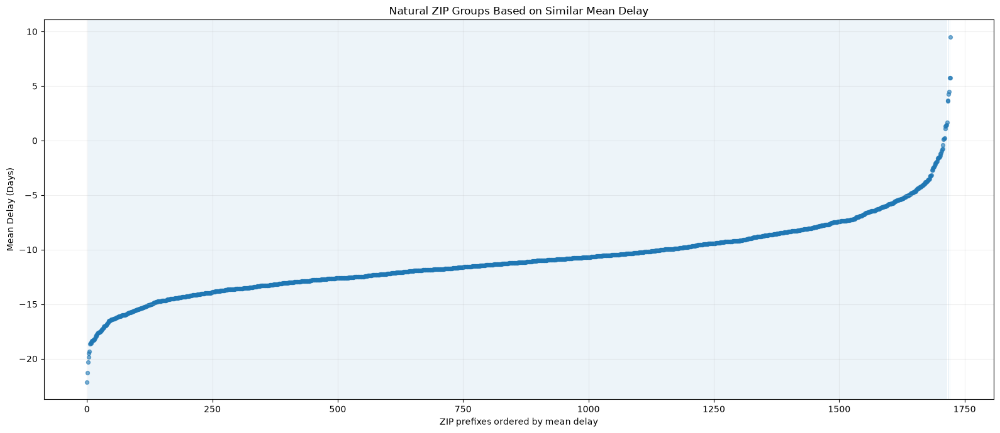

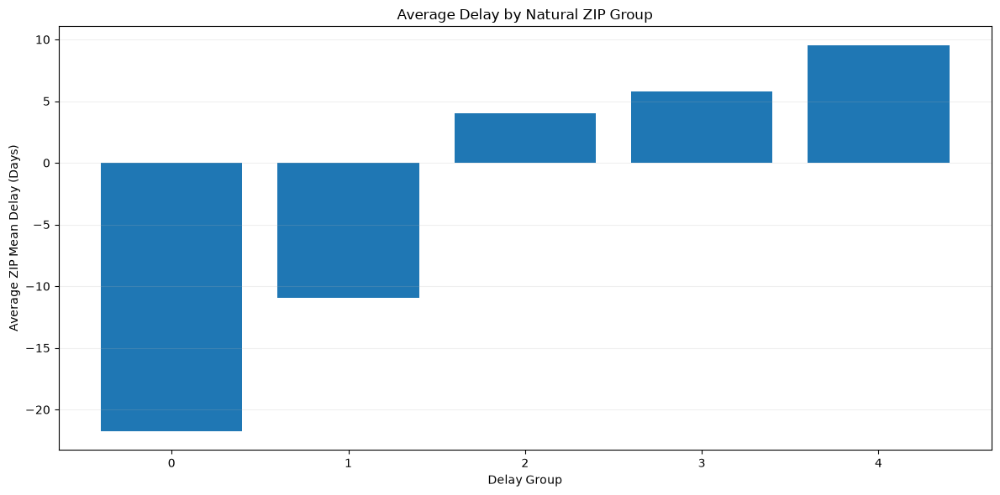

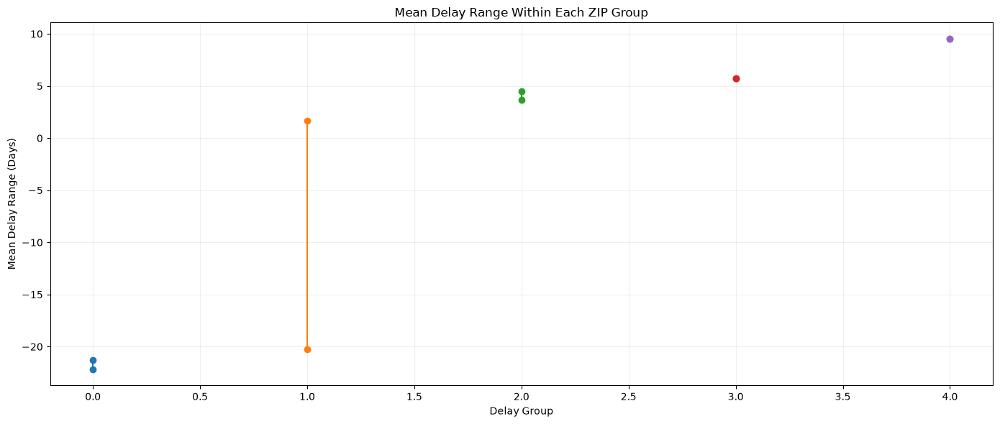

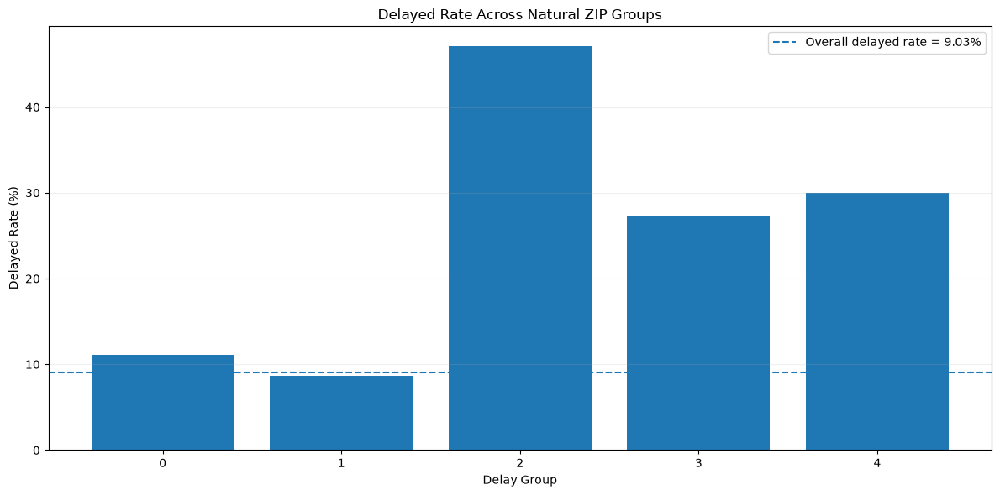

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# ============================================================
# SETTINGS
# ============================================================

zip_col = "customer_zip_code_prefix"
delay_col = "delay_days"
target = "delayed"

min_count = 10

# Minimum gap between consecutive ZIP mean delays
# that will create a new group.
gap_threshold = 1.0

# ============================================================
# PREPARE DATA
# ============================================================

df = train[[zip_col, delay_col, target]].copy()

df[zip_col] = pd.to_numeric(df[zip_col], errors="coerce")
df[delay_col] = pd.to_numeric(df[delay_col], errors="coerce")

df = df.dropna(subset=[zip_col, delay_col, target])

# ============================================================
# ZIP-LEVEL SUMMARY
# ============================================================

zip_summary = (
    df.groupby(zip_col)
    .agg(
        count=(delay_col, "count"),
        mean_delay=(delay_col, "mean"),
        median_delay=(delay_col, "median"),
        delayed=("delayed", "sum"),
        delayed_rate=("delayed", "mean")
    )
    .reset_index()
)

# Keep ZIPs with enough observations
zip_valid = (
    zip_summary[zip_summary["count"] >= min_count]
    .copy()
    .sort_values("mean_delay")
    .reset_index(drop=True)
)

# ============================================================
# FIND NATURAL GROUPS BASED ON DELAY GAPS
# ============================================================

zip_valid["delay_gap"] = (
    zip_valid["mean_delay"].diff()
)

zip_valid["delay_group_id"] = (
    zip_valid["delay_gap"] > gap_threshold
).cumsum()

# ============================================================
# GROUP SUMMARY
# ============================================================

group_summary = (
    zip_valid
    .groupby("delay_group_id")
    .agg(
        zip_count=(zip_col, "count"),
        orders=("count", "sum"),
        min_delay=("mean_delay", "min"),
        max_delay=("mean_delay", "max"),
        mean_delay=("mean_delay", "mean"),
        median_delay=("mean_delay", "median"),
        delayed_rate=("delayed_rate", "mean")
    )
    .reset_index()
)

group_summary["delay_range"] = (
    group_summary["max_delay"] -
    group_summary["min_delay"]
)

# ============================================================
# PRINT GROUPS
# ============================================================

print("=" * 100)
print("NATURAL ZIP GROUPING BASED ON MEAN DELAY")
print("=" * 100)

print(f"Minimum ZIP observations: {min_count}")
print(f"Gap threshold:            {gap_threshold:.2f} days")
print(f"Number of ZIPs used:      {len(zip_valid):,}")
print(f"Number of groups created: {len(group_summary):,}")

print("\n" + "=" * 100)
print("GROUP SUMMARY")
print("=" * 100)

display(
    group_summary[
        [
            "delay_group_id",
            "zip_count",
            "orders",
            "min_delay",
            "max_delay",
            "delay_range",
            "mean_delay",
            "median_delay",
            "delayed_rate"
        ]
    ].round(2)
)

# ============================================================
# ZIPs INSIDE EACH GROUP
# ============================================================

print("\n" + "=" * 100)
print("ZIP RANGE INSIDE EACH GROUP")
print("=" * 100)

for group_id, group in zip_valid.groupby("delay_group_id"):
    print(
        f"Group {group_id}: "
        f"{group['mean_delay'].min():.2f} → "
        f"{group['mean_delay'].max():.2f} days | "
        f"{len(group):,} ZIPs"
    )

# ============================================================
# DELAY RATE BY GROUP
# ============================================================

group_target = (
    zip_valid
    .groupby("delay_group_id")
    .agg(
        orders=("count", "sum"),
        delayed=("delayed", "sum")
    )
)

group_target["delayed_rate"] = (
    group_target["delayed"] /
    group_target["orders"] * 100
)

print("\n" + "=" * 100)
print("DELAYED RATE BY GROUP")
print("=" * 100)

display(
    group_target.round(2)
)

# ============================================================
# CHI-SQUARE TEST
# ============================================================

analysis_df = df.merge(
    zip_valid[[zip_col, "delay_group_id"]],
    on=zip_col,
    how="inner"
)

contingency = pd.crosstab(
    analysis_df["delay_group_id"],
    analysis_df[target]
)

chi2, p_value, dof, expected = chi2_contingency(
    contingency
)

n = contingency.values.sum()
r, k = contingency.shape

cramers_v = np.sqrt(
    chi2 / (n * min(r - 1, k - 1))
)

print("\n" + "=" * 100)
print("ZIP DELAY GROUP vs TARGET — CHI-SQUARE TEST")
print("=" * 100)

print(f"Chi-square statistic: {chi2:.4f}")
print(f"Degrees of freedom:  {dof}")
print(f"P-value:             {p_value:.6f}")
print(f"Cramér's V:          {cramers_v:.4f}")

if p_value < 0.05:
    print("Result: Significant association with the target.")
else:
    print("Result: No statistically significant association with the target.")

# ============================================================
# 1. ZIP MEAN DELAY + GROUPS
# ============================================================

plt.figure(figsize=(16, 7))

plt.scatter(
    zip_valid.index,
    zip_valid["mean_delay"],
    s=18,
    alpha=0.6
)

for group_id, group in zip_valid.groupby("delay_group_id"):
    start = group.index.min()
    end = group.index.max()

    plt.axvspan(
        start,
        end,
        alpha=0.08
    )

plt.xlabel("ZIP prefixes ordered by mean delay")
plt.ylabel("Mean Delay (Days)")
plt.title("Natural ZIP Groups Based on Similar Mean Delay")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. GROUP MEAN DELAY
# ============================================================

plt.figure(figsize=(12, 6))

plt.bar(
    group_summary["delay_group_id"].astype(str),
    group_summary["mean_delay"]
)

plt.xlabel("Delay Group")
plt.ylabel("Average ZIP Mean Delay (Days)")
plt.title("Average Delay by Natural ZIP Group")
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. DELAY RANGE OF EACH GROUP
# ============================================================

plt.figure(figsize=(14, 6))

for _, row in group_summary.iterrows():
    plt.plot(
        [row["delay_group_id"], row["delay_group_id"]],
        [row["min_delay"], row["max_delay"]],
        marker="o"
    )

plt.xlabel("Delay Group")
plt.ylabel("Mean Delay Range (Days)")
plt.title("Mean Delay Range Within Each ZIP Group")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. DELAYED RATE BY GROUP
# ============================================================

plt.figure(figsize=(12, 6))

plt.bar(
    group_target.index.astype(str),
    group_target["delayed_rate"]
)

plt.axhline(
    df[target].mean() * 100,
    linestyle="--",
    label=f"Overall delayed rate = {df[target].mean() * 100:.2f}%"
)

plt.xlabel("Delay Group")
plt.ylabel("Delayed Rate (%)")
plt.title("Delayed Rate Across Natural ZIP Groups")
plt.legend()
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

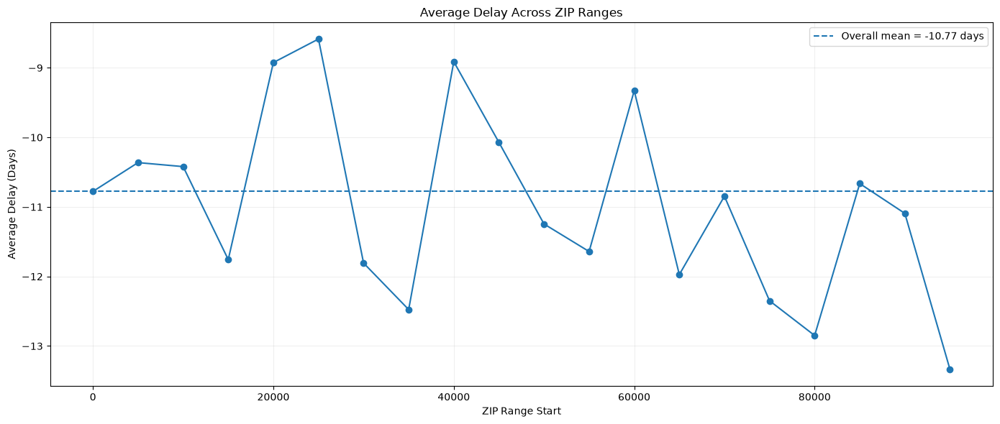

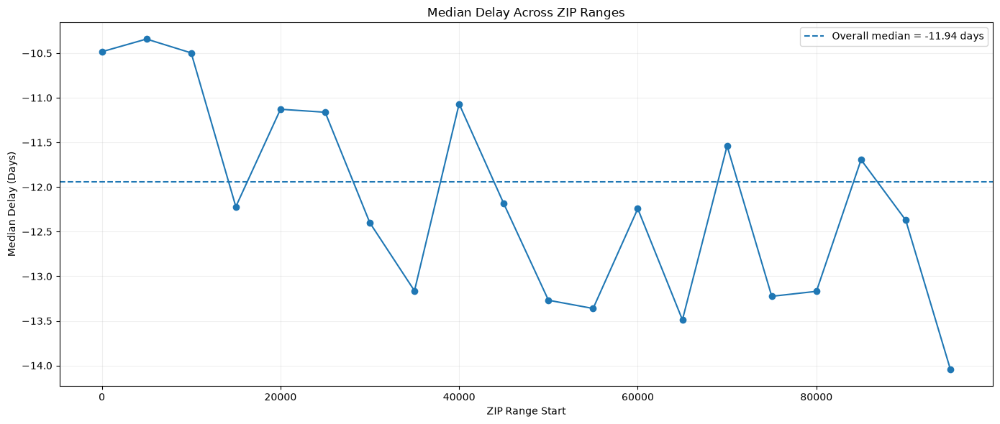

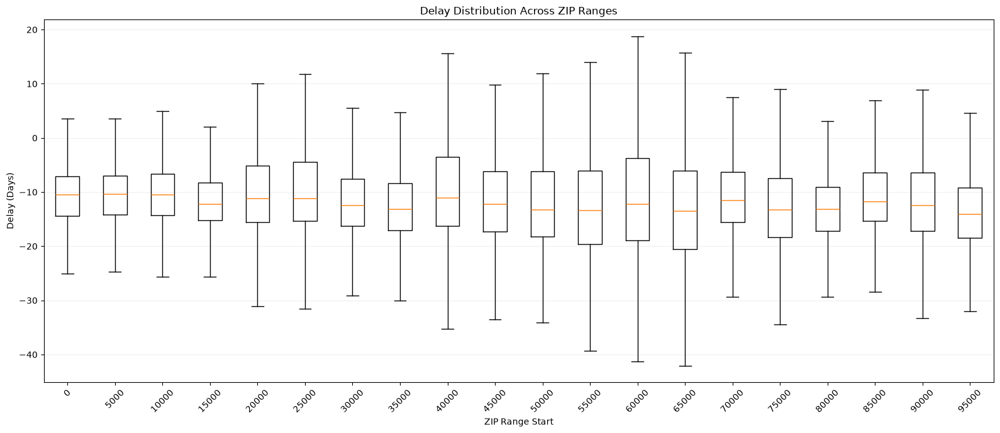

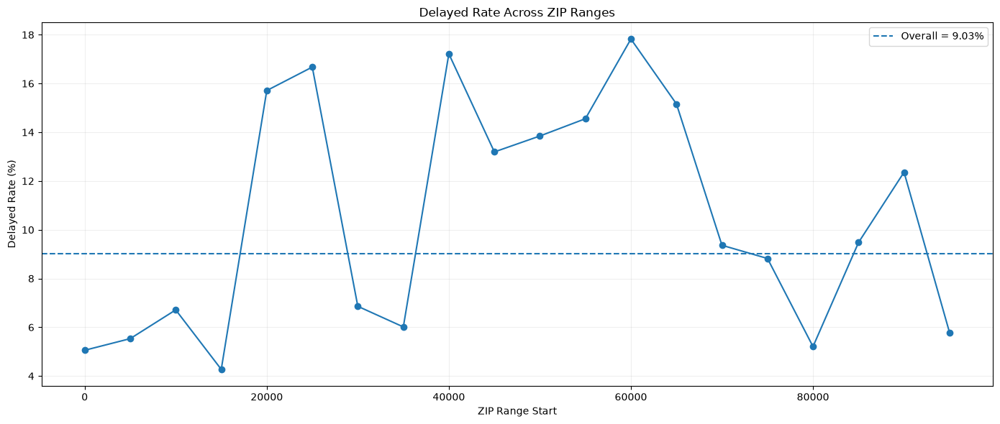

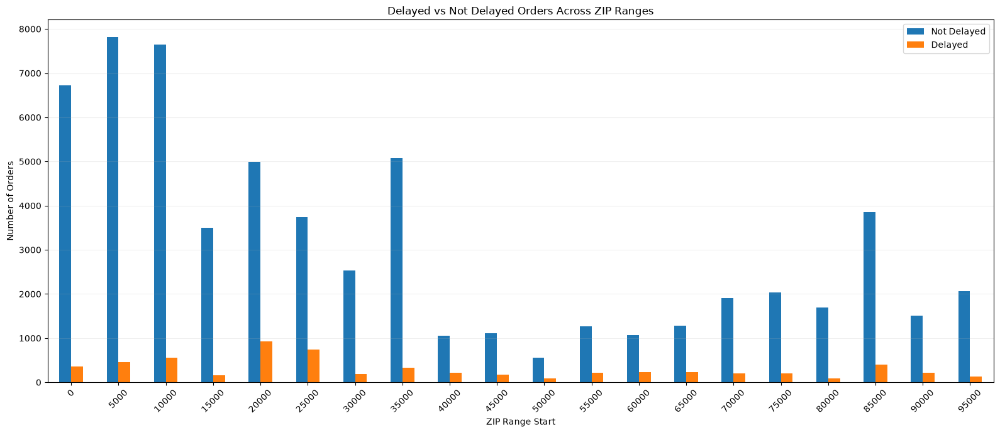

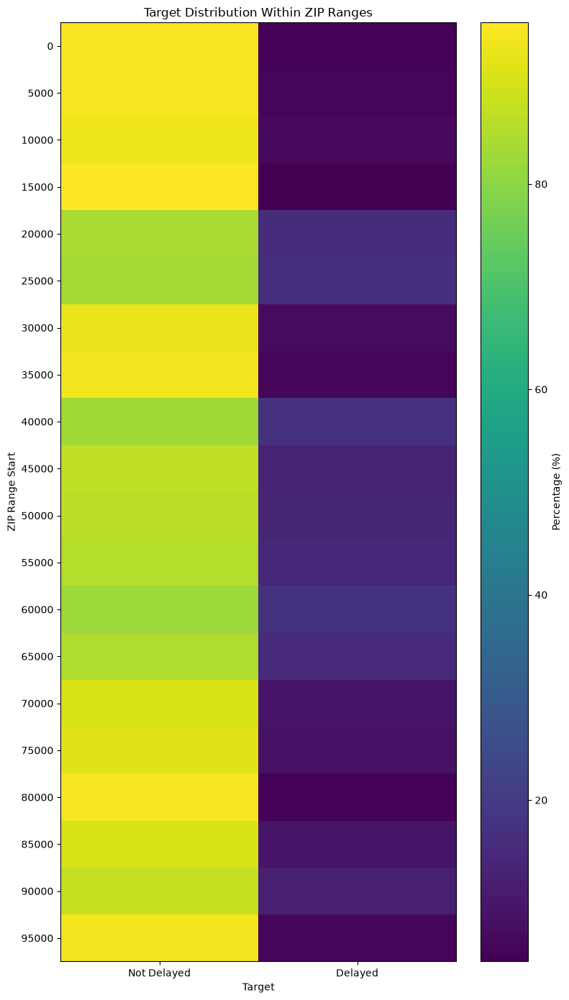

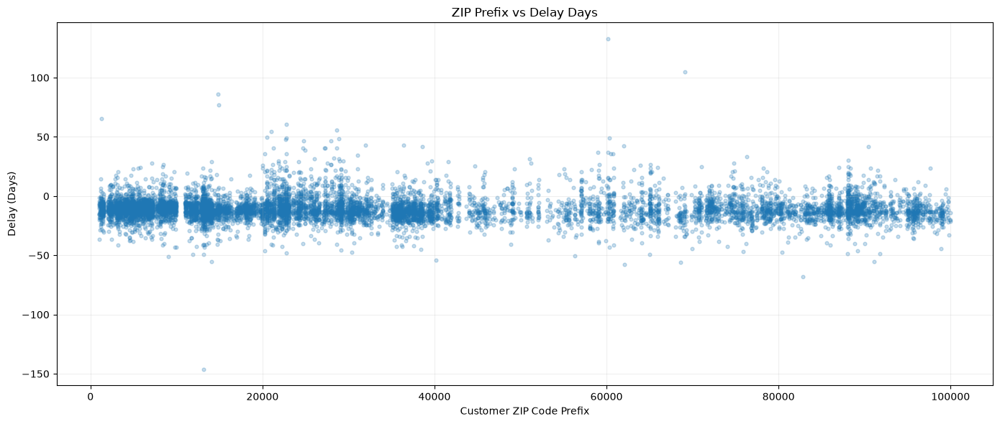

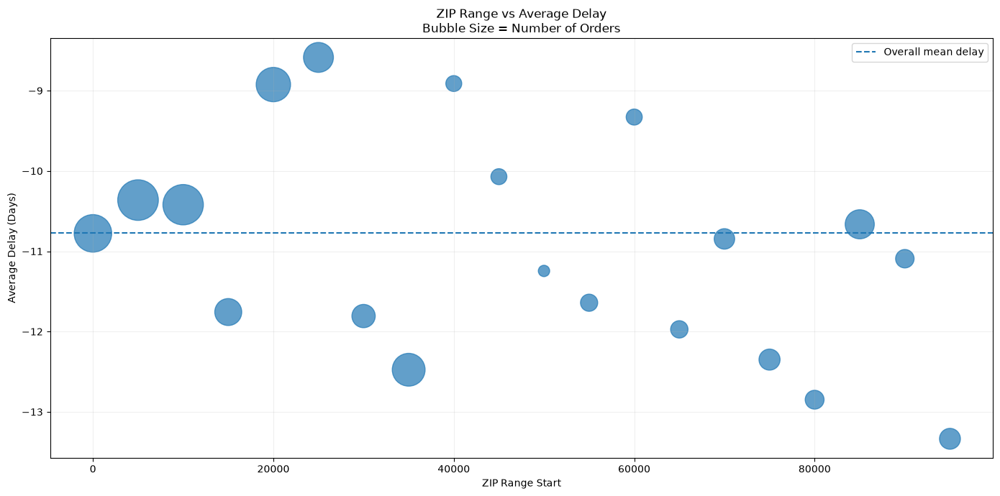

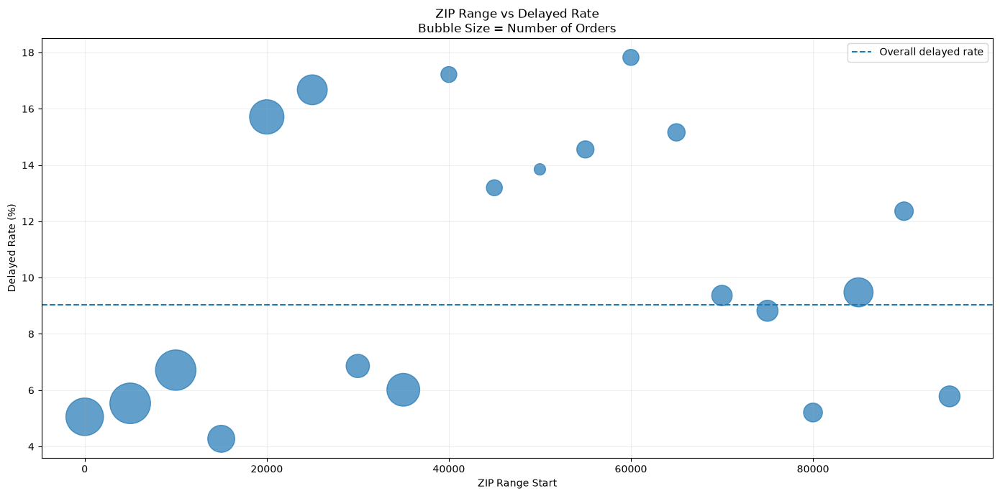

ZIP RANGE — DELAY SUMMARY


,zip_range,orders,mean_delay,median_delay,std_delay,delayed,delayed_rate
0,0,7081,-10.78,-10.48,7.67,358,5.06
1,5000,8278,-10.36,-10.34,8.24,458,5.53
2,10000,8194,-10.42,-10.50,9.34,550,6.71
3,15000,3651,-11.76,-12.22,7.62,156,4.27
4,20000,5926,-8.92,-11.13,13.21,931,15.71
5,25000,4486,-8.59,-11.16,13.16,748,16.67
6,30000,2726,-11.81,-12.40,8.48,187,6.86
7,35000,5404,-12.48,-13.16,8.90,325,6.01
8,40000,1272,-8.91,-11.07,13.60,219,17.22
9,45000,1281,-10.07,-12.19,14.87,169,13.19


In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# SETTINGS
# ============================================================

zip_col = "customer_zip_code_prefix"
delay_col = "delay_days"
target = "delayed"
range_size = 5000

# ============================================================
# PREPARE DATA
# ============================================================

df_plot = train[[zip_col, delay_col, target]].dropna().copy()

df_plot[zip_col] = pd.to_numeric(df_plot[zip_col], errors="coerce")
df_plot[delay_col] = pd.to_numeric(df_plot[delay_col], errors="coerce")

df_plot = df_plot.dropna(subset=[zip_col, delay_col])

df_plot[zip_col] = df_plot[zip_col].astype(int)

# ZIP ranges
df_plot["zip_range"] = (
    df_plot[zip_col] // range_size * range_size
).astype(int)

overall_delay_mean = df_plot[delay_col].mean()
overall_delay_median = df_plot[delay_col].median()
overall_delayed_rate = df_plot[target].mean() * 100

# ============================================================
# RANGE SUMMARY
# ============================================================

range_summary = (
    df_plot.groupby("zip_range")
    .agg(
        orders=(delay_col, "count"),
        mean_delay=(delay_col, "mean"),
        median_delay=(delay_col, "median"),
        std_delay=(delay_col, "std"),
        delayed=("delayed", "sum"),
        delayed_rate=("delayed", "mean")
    )
    .reset_index()
)

range_summary["delayed_rate"] *= 100

# ============================================================
# 1. AVERAGE DELAY BY ZIP RANGE
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    range_summary["zip_range"],
    range_summary["mean_delay"],
    marker="o"
)

plt.axhline(
    overall_delay_mean,
    linestyle="--",
    label=f"Overall mean = {overall_delay_mean:.2f} days"
)

plt.title("Average Delay Across ZIP Ranges")
plt.xlabel("ZIP Range Start")
plt.ylabel("Average Delay (Days)")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. MEDIAN DELAY BY ZIP RANGE
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    range_summary["zip_range"],
    range_summary["median_delay"],
    marker="o"
)

plt.axhline(
    overall_delay_median,
    linestyle="--",
    label=f"Overall median = {overall_delay_median:.2f} days"
)

plt.title("Median Delay Across ZIP Ranges")
plt.xlabel("ZIP Range Start")
plt.ylabel("Median Delay (Days)")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. BOX PLOT — DELAY DISTRIBUTION
# ============================================================

ranges = sorted(df_plot["zip_range"].unique())

box_data = [
    df_plot.loc[
        df_plot["zip_range"] == r,
        delay_col
    ]
    for r in ranges
]
plt.figure(figsize=(16, 7))

plt.boxplot(
    box_data,
    tick_labels=[str(r) for r in ranges],
    showfliers=False
)

plt.title("Delay Distribution Across ZIP Ranges")
plt.xlabel("ZIP Range Start")
plt.ylabel("Delay (Days)")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. DELAYED RATE BY ZIP RANGE
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    range_summary["zip_range"],
    range_summary["delayed_rate"],
    marker="o"
)

plt.axhline(
    overall_delayed_rate,
    linestyle="--",
    label=f"Overall = {overall_delayed_rate:.2f}%"
)

plt.title("Delayed Rate Across ZIP Ranges")
plt.xlabel("ZIP Range Start")
plt.ylabel("Delayed Rate (%)")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 5. DELAYED VS NOT DELAYED
# ============================================================

target_counts = pd.crosstab(
    df_plot["zip_range"],
    df_plot[target]
)

target_counts.columns = [
    "Not Delayed" if c == 0 else "Delayed"
    for c in target_counts.columns
]

target_counts.plot(
    kind="bar",
    figsize=(16, 7)
)

plt.title("Delayed vs Not Delayed Orders Across ZIP Ranges")
plt.xlabel("ZIP Range Start")
plt.ylabel("Number of Orders")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 6. TARGET DISTRIBUTION HEATMAP
# ============================================================

heatmap_data = pd.crosstab(
    df_plot["zip_range"],
    df_plot[target],
    normalize="index"
) * 100

heatmap_data = heatmap_data.reindex(columns=[0, 1], fill_value=0)
heatmap_data.columns = ["Not Delayed", "Delayed"]

plt.figure(figsize=(8, 14))

plt.imshow(
    heatmap_data,
    aspect="auto"
)

plt.colorbar(label="Percentage (%)")

plt.xticks(
    range(len(heatmap_data.columns)),
    heatmap_data.columns
)

plt.yticks(
    range(len(heatmap_data.index)),
    heatmap_data.index
)

plt.title("Target Distribution Within ZIP Ranges")
plt.xlabel("Target")
plt.ylabel("ZIP Range Start")

plt.tight_layout()
plt.show()

# ============================================================
# 7. ZIP NUMERIC VALUE VS DELAY
# ============================================================

sample = df_plot.sample(
    min(10000, len(df_plot)),
    random_state=42
)

plt.figure(figsize=(14, 6))

plt.scatter(
    sample[zip_col],
    sample[delay_col],
    alpha=0.25,
    s=12
)

plt.title("ZIP Prefix vs Delay Days")
plt.xlabel("Customer ZIP Code Prefix")
plt.ylabel("Delay (Days)")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 8. ZIP RANGE VS AVERAGE DELAY
#    Bubble size = number of orders
# ============================================================

plt.figure(figsize=(14, 7))

plt.scatter(
    range_summary["zip_range"],
    range_summary["mean_delay"],
    s=range_summary["orders"] / 5,
    alpha=0.7
)

plt.axhline(
    overall_delay_mean,
    linestyle="--",
    label="Overall mean delay"
)

plt.title(
    "ZIP Range vs Average Delay\n"
    "Bubble Size = Number of Orders"
)

plt.xlabel("ZIP Range Start")
plt.ylabel("Average Delay (Days)")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 9. ZIP RANGE VS DELAYED RATE
#    Bubble size = number of orders
# ============================================================

plt.figure(figsize=(14, 7))

plt.scatter(
    range_summary["zip_range"],
    range_summary["delayed_rate"],
    s=range_summary["orders"] / 5,
    alpha=0.7
)

plt.axhline(
    overall_delayed_rate,
    linestyle="--",
    label="Overall delayed rate"
)

plt.title(
    "ZIP Range vs Delayed Rate\n"
    "Bubble Size = Number of Orders"
)

plt.xlabel("ZIP Range Start")
plt.ylabel("Delayed Rate (%)")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 10. PRINT SUMMARY
# ============================================================

print("=" * 100)
print("ZIP RANGE — DELAY SUMMARY")
print("=" * 100)

display(
    range_summary[
        [
            "zip_range",
            "orders",
            "mean_delay",
            "median_delay",
            "std_delay",
            "delayed",
            "delayed_rate"
        ]
    ].round(2)
)

qCUT GROUPING — ZIP PREFIXES BY MEAN DELAY
Total ZIP prefixes:       13,748
ZIPs with >= 10 orders: 1,723
Number of groups:          10


,delay_group,zip_count,orders,min_delay,max_delay,delay_range,mean_delay,mean_delayed_rate
0,"(-22.151, -14.485]",173,2449,-22.15,-14.49,7.66,-16.05,2.13
1,"(-14.485, -13.331]",172,2906,-14.48,-13.33,1.15,-13.87,2.65
2,"(-13.331, -12.58]",172,2883,-13.33,-12.58,0.75,-12.92,3.94
3,"(-12.58, -11.826]",172,2891,-12.58,-11.83,0.75,-12.19,4.87
4,"(-11.826, -11.186]",173,2846,-11.83,-11.19,0.64,-11.51,5.04
5,"(-11.186, -10.533]",172,2892,-11.18,-10.53,0.65,-10.86,6.03
6,"(-10.533, -9.693]",172,3148,-10.53,-9.70,0.83,-10.16,7.67
7,"(-9.693, -8.529]",172,3099,-9.69,-8.54,1.15,-9.15,10.85
8,"(-8.529, -6.775]",172,3041,-8.52,-6.78,1.74,-7.78,15.86
9,"(-6.775, 9.502]",173,2856,-6.77,9.50,16.28,-4.14,24.38



TARGET DISTRIBUTION BY ZIP DELAY GROUP


,delay_group,orders,delayed,delayed_rate
0,"(-22.151, -14.485]",2449,55,2.25
1,"(-14.485, -13.331]",2906,88,3.03
2,"(-13.331, -12.58]",2883,123,4.27
3,"(-12.58, -11.826]",2891,149,5.15
4,"(-11.826, -11.186]",2846,154,5.41
5,"(-11.186, -10.533]",2892,187,6.47
6,"(-10.533, -9.693]",3148,252,8.01
7,"(-9.693, -8.529]",3099,357,11.52
8,"(-8.529, -6.775]",3041,476,15.65
9,"(-6.775, 9.502]",2856,693,24.26



ZIP DELAY GROUP vs TARGET — CHI-SQUARE TEST
Chi-square statistic: 1503.7815
Degrees of freedom:  9
P-value:             0.000000
Cramér's V:          0.2277
Result: Significant association with the target.


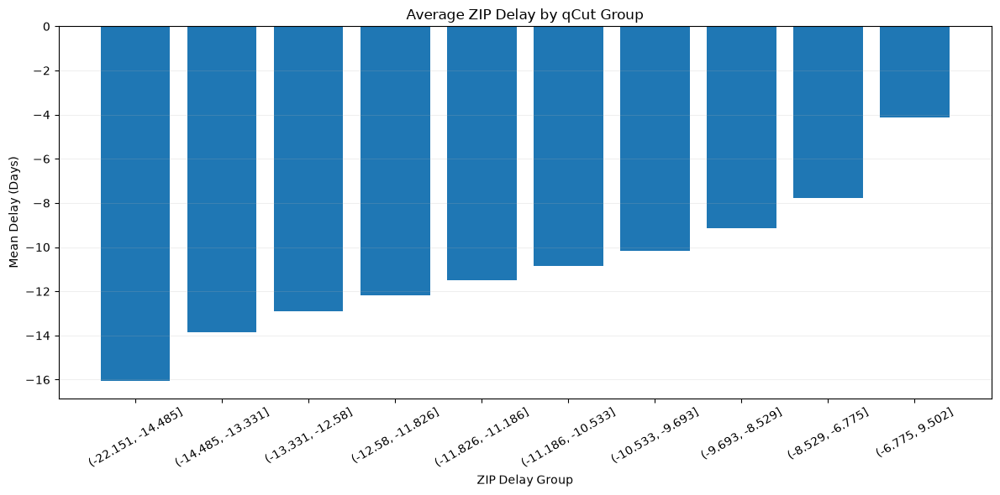

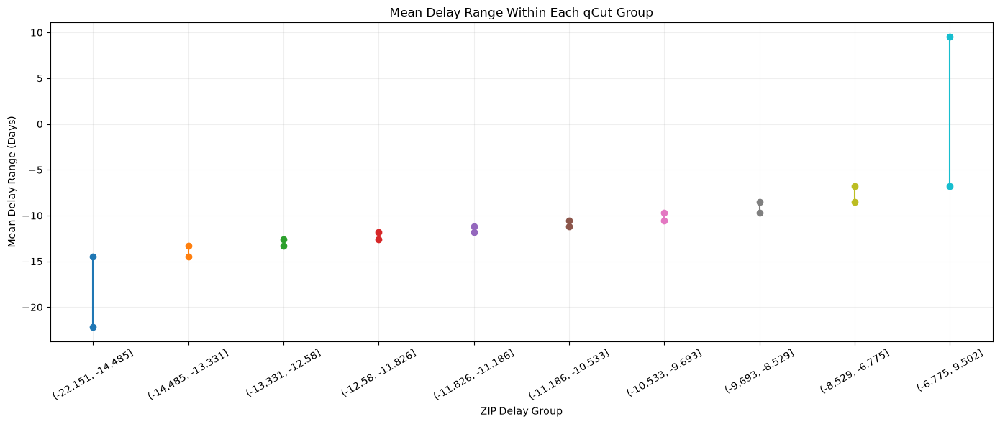

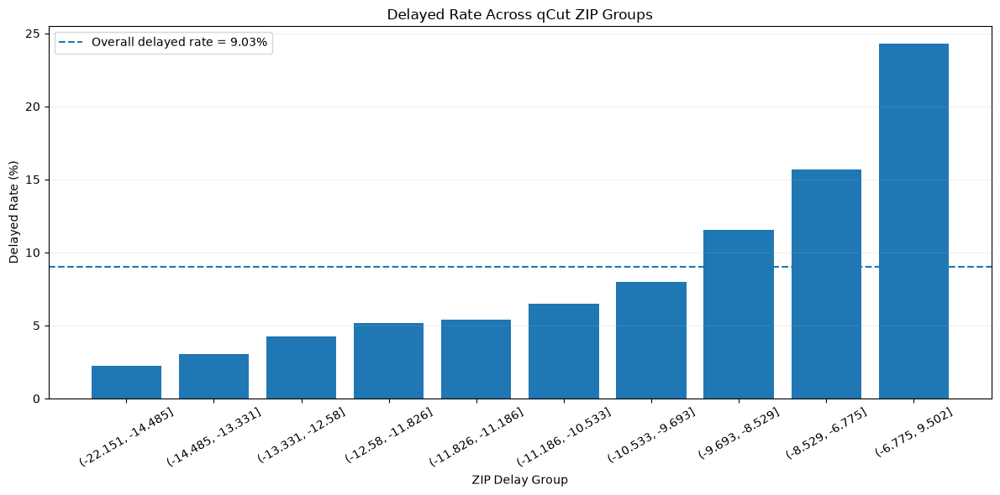

In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# ============================================================
# SETTINGS
# ============================================================

zip_col = "customer_zip_code_prefix"
delay_col = "delay_days"
target = "delayed"

min_count = 10
n_groups = 10

# ============================================================
# PREPARE DATA
# ============================================================

df = train[[zip_col, delay_col, target]].copy()

df[zip_col] = pd.to_numeric(df[zip_col], errors="coerce")
df[delay_col] = pd.to_numeric(df[delay_col], errors="coerce")

df = df.dropna(subset=[zip_col, delay_col, target])

# ============================================================
# ZIP-LEVEL DELAY SUMMARY
# ============================================================

zip_summary = (
    df.groupby(zip_col)
    .agg(
        count=(delay_col, "count"),
        mean_delay=(delay_col, "mean"),
        median_delay=(delay_col, "median"),
        std_delay=(delay_col, "std"),
        delayed=("delayed", "sum"),
        delayed_rate=("delayed", "mean")
    )
    .reset_index()
)

zip_summary["delayed_rate"] *= 100

# ============================================================
# REMOVE RARE ZIP PREFIXES
# ============================================================

zip_valid = (
    zip_summary[zip_summary["count"] >= min_count]
    .copy()
    .sort_values("mean_delay")
    .reset_index(drop=True)
)

# ============================================================
# CREATE 5 GROUPS USING qcut
# ============================================================

zip_valid["delay_group"] = pd.qcut(
    zip_valid["mean_delay"],
    q=n_groups,
    duplicates="drop"
)

# ============================================================
# GROUP SUMMARY
# ============================================================

group_summary = (
    zip_valid
    .groupby("delay_group", observed=True)
    .agg(
        zip_count=(zip_col, "count"),
        orders=("count", "sum"),
        mean_delay=("mean_delay", "mean"),
        min_delay=("mean_delay", "min"),
        max_delay=("mean_delay", "max"),
        mean_delayed_rate=("delayed_rate", "mean")
    )
    .reset_index()
)

group_summary["delay_range"] = (
    group_summary["max_delay"] -
    group_summary["min_delay"]
)

print("=" * 100)
print("qCUT GROUPING — ZIP PREFIXES BY MEAN DELAY")
print("=" * 100)

print(f"Total ZIP prefixes:       {len(zip_summary):,}")
print(f"ZIPs with >= {min_count} orders: {len(zip_valid):,}")
print(f"Number of groups:          {len(group_summary)}")

display(
    group_summary[
        [
            "delay_group",
            "zip_count",
            "orders",
            "min_delay",
            "max_delay",
            "delay_range",
            "mean_delay",
            "mean_delayed_rate"
        ]
    ].round(2)
)

# ============================================================
# ASSIGN GROUP TO EVERY ORDER
# ============================================================

analysis_df = df.merge(
    zip_valid[[zip_col, "delay_group"]],
    on=zip_col,
    how="inner"
)

# ============================================================
# ACTUAL TARGET RATE PER GROUP
# ============================================================

target_summary = (
    analysis_df
    .groupby("delay_group", observed=True)
    .agg(
        orders=(target, "count"),
        delayed=(target, "sum"),
        delayed_rate=(target, "mean")
    )
    .reset_index()
)

target_summary["delayed_rate"] *= 100

print("\n" + "=" * 100)
print("TARGET DISTRIBUTION BY ZIP DELAY GROUP")
print("=" * 100)

display(
    target_summary.round(2)
)

# ============================================================
# CHI-SQUARE TEST
# ============================================================

contingency = pd.crosstab(
    analysis_df["delay_group"],
    analysis_df[target]
)

chi2, p_value, dof, expected = chi2_contingency(
    contingency
)

# ============================================================
# CRAMÉR'S V
# ============================================================

n = contingency.values.sum()
r, k = contingency.shape

cramers_v = np.sqrt(
    chi2 / (n * min(r - 1, k - 1))
)

print("\n" + "=" * 100)
print("ZIP DELAY GROUP vs TARGET — CHI-SQUARE TEST")
print("=" * 100)

print(f"Chi-square statistic: {chi2:.4f}")
print(f"Degrees of freedom:  {dof}")
print(f"P-value:             {p_value:.6f}")
print(f"Cramér's V:          {cramers_v:.4f}")

if p_value < 0.05:
    print("Result: Significant association with the target.")
else:
    print("Result: No statistically significant association with the target.")

# ============================================================
# 1. MEAN DELAY BY GROUP
# ============================================================

plt.figure(figsize=(12, 6))

plt.bar(
    group_summary["delay_group"].astype(str),
    group_summary["mean_delay"]
)

plt.xlabel("ZIP Delay Group")
plt.ylabel("Mean Delay (Days)")
plt.title("Average ZIP Delay by qCut Group")
plt.xticks(rotation=30)
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. DELAY RANGE OF GROUPS
# ============================================================

plt.figure(figsize=(14, 6))

for i, row in group_summary.iterrows():
    plt.plot(
        [i, i],
        [row["min_delay"], row["max_delay"]],
        marker="o"
    )

plt.xticks(
    range(len(group_summary)),
    group_summary["delay_group"].astype(str),
    rotation=30
)

plt.xlabel("ZIP Delay Group")
plt.ylabel("Mean Delay Range (Days)")
plt.title("Mean Delay Range Within Each qCut Group")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. DELAYED RATE
# ============================================================

plt.figure(figsize=(12, 6))

plt.bar(
    target_summary["delay_group"].astype(str),
    target_summary["delayed_rate"]
)

plt.axhline(
    df[target].mean() * 100,
    linestyle="--",
    label=f"Overall delayed rate = {df[target].mean() * 100:.2f}%"
)

plt.xlabel("ZIP Delay Group")
plt.ylabel("Delayed Rate (%)")
plt.title("Delayed Rate Across qCut ZIP Groups")
plt.xticks(rotation=30)
plt.legend()
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

### lat and long

CUSTOMER COORDINATES — BASIC INFO

customer_lat
Missing        : 181
Unique         : 13,627
Min            : -33.690972
Max            : 41.146203
Mean           : -21.132510
Median         : -22.915533

customer_lng
Missing        : 181
Unique         : 13,626
Min            : -72.670987
Max            : -8.577855
Mean           : -46.177258
Median         : -46.627314

INVALID COORDINATES
Invalid latitude : 181
Invalid longitude: 181

CORRELATION WITH TARGETS
customer_lat       | Pearson delayed: 0.06141 | Spearman delayed: 0.05593 | Pearson delay_days: -0.00800 | Spearman delay_days: -0.04712
customer_lng       | Pearson delayed: 0.08266 | Spearman delayed: 0.08342 | Pearson delay_days: 0.06937 | Spearman delay_days: 0.04773

QUANTILES

customer_lat
0.00   -33.690972
0.01   -30.090744
0.05   -28.714528
0.25   -23.588022
0.50   -22.915533
0.75   -19.996322
0.95    -7.251747
0.99    -2.499473
1.00    41.146203

customer_lng
0.00   -72.670987
0.01   -56.104504
0.05   -52.406503
0.25  

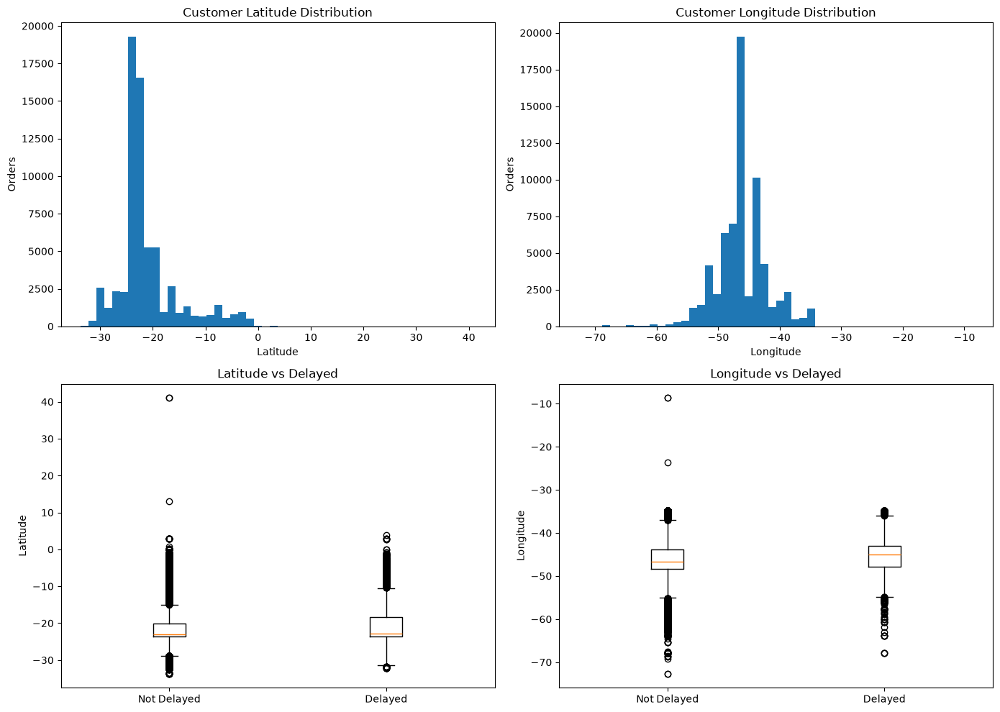

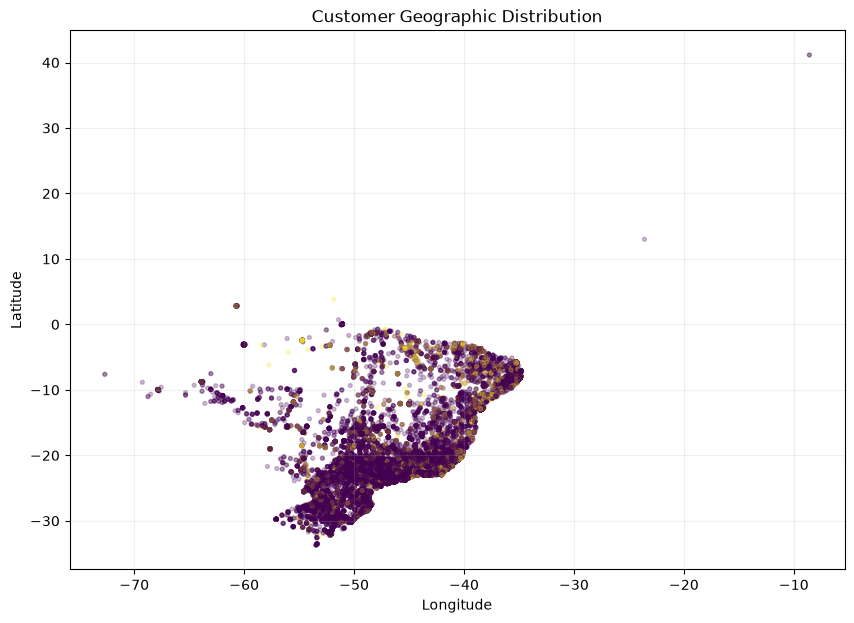

In [36]:
# ============================================================
# CUSTOMER LATITUDE / LONGITUDE — EDA
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

coord_cols = ["customer_lat", "customer_lng"]

# ------------------------------------------------------------
# 1. Basic information
# ------------------------------------------------------------
print("=" * 70)
print("CUSTOMER COORDINATES — BASIC INFO")
print("=" * 70)

for col in coord_cols:
    s = train[col]

    print(f"\n{col}")
    print(f"Missing        : {s.isna().sum():,}")
    print(f"Unique         : {s.nunique():,}")
    print(f"Min            : {s.min():.6f}")
    print(f"Max            : {s.max():.6f}")
    print(f"Mean           : {s.mean():.6f}")
    print(f"Median         : {s.median():.6f}")

# ------------------------------------------------------------
# 2. Valid geographic ranges
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("INVALID COORDINATES")
print("=" * 70)

invalid_lat = train["customer_lat"].isna() | ~train["customer_lat"].between(-90, 90)
invalid_lng = train["customer_lng"].isna() | ~train["customer_lng"].between(-180, 180)

print(f"Invalid latitude : {invalid_lat.sum():,}")
print(f"Invalid longitude: {invalid_lng.sum():,}")

# ------------------------------------------------------------
# 3. Correlation with targets
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("CORRELATION WITH TARGETS")
print("=" * 70)

for col in coord_cols:
    print(
        f"{col:18s} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.5f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.5f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.5f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.5f}"
    )

# ------------------------------------------------------------
# 4. Quantiles / possible extreme values
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("QUANTILES")
print("=" * 70)

for col in coord_cols:
    print(f"\n{col}")
    print(
        train[col].quantile(
            [0, .01, .05, .25, .50, .75, .95, .99, 1]
        ).to_string()
    )

# ------------------------------------------------------------
# 5. Target relationship by coordinate quartiles
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("TARGET RATE BY COORDINATE QUARTILES")
print("=" * 70)

for col in coord_cols:
    temp = train[[col, "delayed", "delay_days"]].dropna().copy()
    temp["quartile"] = pd.qcut(
        temp[col],
        q=4,
        labels=["Q1", "Q2", "Q3", "Q4"],
        duplicates="drop"
    )

    grouped = temp.groupby("quartile", observed=True).agg(
        orders=("delayed", "size"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )

    grouped["delayed_rate"] *= 100

    print(f"\n{col}")
    print(grouped.round(3).to_string())

# ------------------------------------------------------------
# 6. Visualizations — GRID
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Latitude distribution
axes[0, 0].hist(train["customer_lat"].dropna(), bins=50)
axes[0, 0].set_title("Customer Latitude Distribution")
axes[0, 0].set_xlabel("Latitude")
axes[0, 0].set_ylabel("Orders")

# Longitude distribution
axes[0, 1].hist(train["customer_lng"].dropna(), bins=50)
axes[0, 1].set_title("Customer Longitude Distribution")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Orders")

# Latitude vs delayed
axes[1, 0].boxplot(
    [
        train.loc[train["delayed"] == 0, "customer_lat"].dropna(),
        train.loc[train["delayed"] == 1, "customer_lat"].dropna()
    ],
    tick_labels=["Not Delayed", "Delayed"]
)
axes[1, 0].set_title("Latitude vs Delayed")
axes[1, 0].set_ylabel("Latitude")

# Longitude vs delayed
axes[1, 1].boxplot(
    [
        train.loc[train["delayed"] == 0, "customer_lng"].dropna(),
        train.loc[train["delayed"] == 1, "customer_lng"].dropna()
    ],
    tick_labels=["Not Delayed", "Delayed"]
)
axes[1, 1].set_title("Longitude vs Delayed")
axes[1, 1].set_ylabel("Longitude")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Geographic scatter
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

plt.scatter(
    train["customer_lng"],
    train["customer_lat"],
    c=train["delayed"],
    alpha=0.25,
    s=8
)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Customer Geographic Distribution")
plt.grid(alpha=0.2)
plt.show()

CUSTOMER COORDINATES vs CITY / ZIP

--- UNIQUE COMBINATIONS ---
Unique cities              : 3,747
Unique ZIPs                : 13,748
Unique latitude            : 13,627
Unique longitude           : 13,626
Unique (lat, lng) pairs    : 13,627

--- ZIP → COORDINATES ---
ZIPs with exactly 1 latitude  : 100.00%
ZIPs with exactly 1 longitude : 100.00%
ZIPs with multiple latitudes  : 0
ZIPs with multiple longitudes : 0

--- CITY → COORDINATES ---
Cities with exactly 1 latitude  : 86.49%
Cities with exactly 1 longitude : 86.49%
Cities with multiple latitudes  : 502
Cities with multiple longitudes : 502

--- CITY ↔ ZIP ---
Cramér's V (City ↔ ZIP): 0.9976
ZIPs mapped to one city : 99.75%
Cities mapped to one ZIP : 86.44%

--- ZIP ↔ COORDINATES ---
Mean latitude std within ZIP  : 0.00000000
Mean longitude std within ZIP : 0.00000000

--- CITY ↔ COORDINATES ---
Mean latitude std within city  : 0.20403606
Mean longitude std within city : 0.16999796

--- COORDINATES vs TARGET ---
customer_lat     

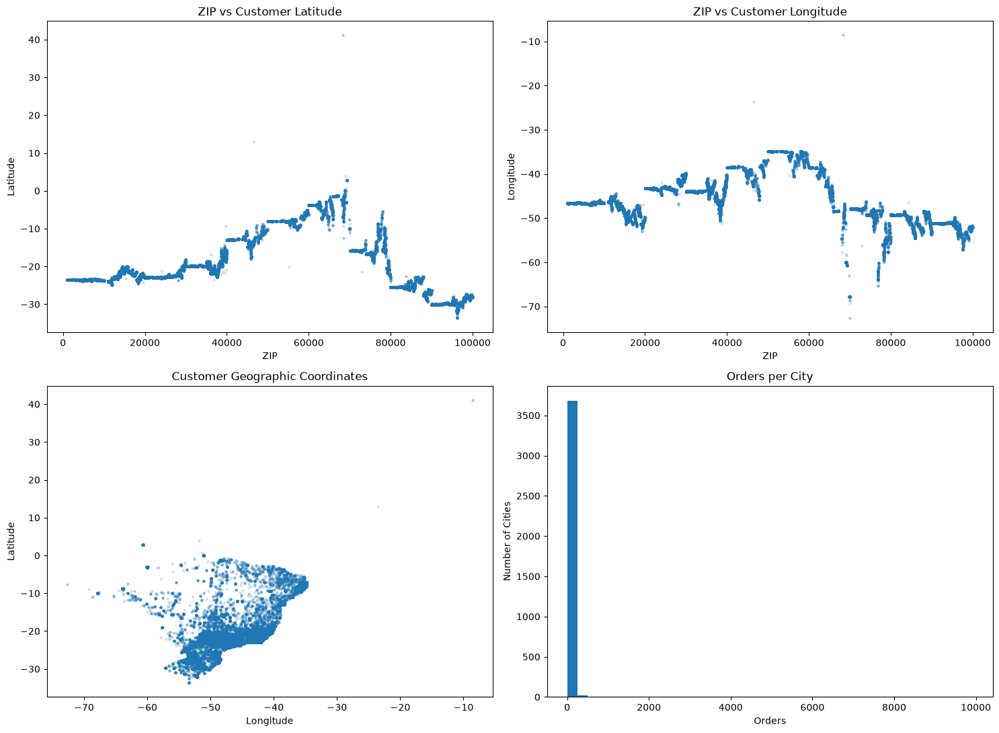

In [37]:
# ============================================================
# CUSTOMER COORDINATES vs CITY / ZIP
# ============================================================

import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

lat = "customer_lat"
lng = "customer_lng"
city = "customer_city"
zip_col = "customer_zip_code_prefix"

print("=" * 75)
print("CUSTOMER COORDINATES vs CITY / ZIP")
print("=" * 75)

# ------------------------------------------------------------
# 1. Unique combinations
# ------------------------------------------------------------
print("\n--- UNIQUE COMBINATIONS ---")

print(f"Unique cities              : {train[city].nunique():,}")
print(f"Unique ZIPs                : {train[zip_col].nunique():,}")
print(f"Unique latitude            : {train[lat].nunique():,}")
print(f"Unique longitude           : {train[lng].nunique():,}")
print(
    f"Unique (lat, lng) pairs    : "
    f"{train[[lat, lng]].dropna().drop_duplicates().shape[0]:,}"
)

# ------------------------------------------------------------
# 2. ZIP -> coordinates consistency
# ------------------------------------------------------------
print("\n--- ZIP → COORDINATES ---")

zip_coord = (
    train.dropna(subset=[lat, lng])
    .groupby(zip_col)
    .agg(
        unique_lat=(lat, "nunique"),
        unique_lng=(lng, "nunique"),
        orders=(lat, "size")
    )
)

print(f"ZIPs with exactly 1 latitude  : "
      f"{(zip_coord['unique_lat'] == 1).mean() * 100:.2f}%")

print(f"ZIPs with exactly 1 longitude : "
      f"{(zip_coord['unique_lng'] == 1).mean() * 100:.2f}%")

print(f"ZIPs with multiple latitudes  : "
      f"{(zip_coord['unique_lat'] > 1).sum():,}")

print(f"ZIPs with multiple longitudes : "
      f"{(zip_coord['unique_lng'] > 1).sum():,}")

# ------------------------------------------------------------
# 3. City -> coordinates consistency
# ------------------------------------------------------------
print("\n--- CITY → COORDINATES ---")

city_coord = (
    train.dropna(subset=[lat, lng])
    .groupby(city)
    .agg(
        unique_lat=(lat, "nunique"),
        unique_lng=(lng, "nunique"),
        orders=(lat, "size")
    )
)

print(f"Cities with exactly 1 latitude  : "
      f"{(city_coord['unique_lat'] == 1).mean() * 100:.2f}%")

print(f"Cities with exactly 1 longitude : "
      f"{(city_coord['unique_lng'] == 1).mean() * 100:.2f}%")

print(f"Cities with multiple latitudes  : "
      f"{(city_coord['unique_lat'] > 1).sum():,}")

print(f"Cities with multiple longitudes : "
      f"{(city_coord['unique_lng'] > 1).sum():,}")

# ------------------------------------------------------------
# 4. City ↔ ZIP association
# ------------------------------------------------------------
print("\n--- CITY ↔ ZIP ---")

city_zip = pd.crosstab(train[city], train[zip_col])

chi2, p, dof, expected = chi2_contingency(city_zip)

n = city_zip.values.sum()
r, k = city_zip.shape

cramers_v = np.sqrt(
    (chi2 / n) /
    min(k - 1, r - 1)
)

print(f"Cramér's V (City ↔ ZIP): {cramers_v:.4f}")

# ZIPs belonging to one city
zip_city_counts = train.groupby(zip_col)[city].nunique()

# Cities belonging to one ZIP
city_zip_counts = train.groupby(city)[zip_col].nunique()

print(
    f"ZIPs mapped to one city : "
    f"{(zip_city_counts == 1).mean() * 100:.2f}%"
)

print(
    f"Cities mapped to one ZIP : "
    f"{(city_zip_counts == 1).mean() * 100:.2f}%"
)

# ------------------------------------------------------------
# 5. ZIP ↔ LAT/LNG relationship
# ------------------------------------------------------------
print("\n--- ZIP ↔ COORDINATES ---")

zip_coord_unique = (
    train.dropna(subset=[lat, lng])
    .groupby(zip_col)
    .agg(
        mean_lat=(lat, "mean"),
        mean_lng=(lng, "mean"),
        std_lat=(lat, "std"),
        std_lng=(lng, "std")
    )
)

print(
    f"Mean latitude std within ZIP  : "
    f"{zip_coord_unique['std_lat'].mean():.8f}"
)

print(
    f"Mean longitude std within ZIP : "
    f"{zip_coord_unique['std_lng'].mean():.8f}"
)

# ------------------------------------------------------------
# 6. CITY ↔ LAT/LNG relationship
# ------------------------------------------------------------
print("\n--- CITY ↔ COORDINATES ---")

city_coord_unique = (
    train.dropna(subset=[lat, lng])
    .groupby(city)
    .agg(
        mean_lat=(lat, "mean"),
        mean_lng=(lng, "mean"),
        std_lat=(lat, "std"),
        std_lng=(lng, "std")
    )
)

print(
    f"Mean latitude std within city  : "
    f"{city_coord_unique['std_lat'].mean():.8f}"
)

print(
    f"Mean longitude std within city : "
    f"{city_coord_unique['std_lng'].mean():.8f}"
)

# ------------------------------------------------------------
# 7. Coordinates vs targets
# ------------------------------------------------------------
print("\n--- COORDINATES vs TARGET ---")

for col in [lat, lng]:
    print(
        f"{col:18s} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.4f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.4f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.4f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.4f}"
    )

# ------------------------------------------------------------
# 8. Visual comparison — GRID
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(15, 11))

# ZIP vs latitude
axes[0, 0].scatter(
    train[zip_col],
    train[lat],
    alpha=0.15,
    s=5
)
axes[0, 0].set_title("ZIP vs Customer Latitude")
axes[0, 0].set_xlabel("ZIP")
axes[0, 0].set_ylabel("Latitude")

# ZIP vs longitude
axes[0, 1].scatter(
    train[zip_col],
    train[lng],
    alpha=0.15,
    s=5
)
axes[0, 1].set_title("ZIP vs Customer Longitude")
axes[0, 1].set_xlabel("ZIP")
axes[0, 1].set_ylabel("Longitude")

# Geographic coordinates
axes[1, 0].scatter(
    train[lng],
    train[lat],
    alpha=0.15,
    s=5
)
axes[1, 0].set_title("Customer Geographic Coordinates")
axes[1, 0].set_xlabel("Longitude")
axes[1, 0].set_ylabel("Latitude")

# City coordinate spread
city_sample = (
    train[[city, lat, lng]]
    .dropna()
    .groupby(city)
    .size()
)

axes[1, 1].hist(city_sample, bins=40)
axes[1, 1].set_title("Orders per City")
axes[1, 1].set_xlabel("Orders")
axes[1, 1].set_ylabel("Number of Cities")

plt.tight_layout()
plt.show()

## seller&customer state

SELLER GEOGRAPHY vs CUSTOMER

UNIQUE SELLER STATES

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
unique_seller_states,67533.0,1.0,0.07,1.0,1.0,1.0,1.0,3.0



--- Value Counts ---


,orders
unique_seller_states,
1.0,67222
2.0,306
3.0,5



--- Unique Seller States vs Target ---


,unique_seller_states,orders,delayed_orders,delayed_rate,avg_delay_days,median_delay_days
0,1.0,67222,6093,9.06,-10.74,-11.68
1,2.0,306,4,1.31,-17.68,-17.30
2,3.0,5,0,0.00,-16.40,-15.21



--- Pearson Correlation ---
with delay_days: -0.0442
with delayed: -0.0183


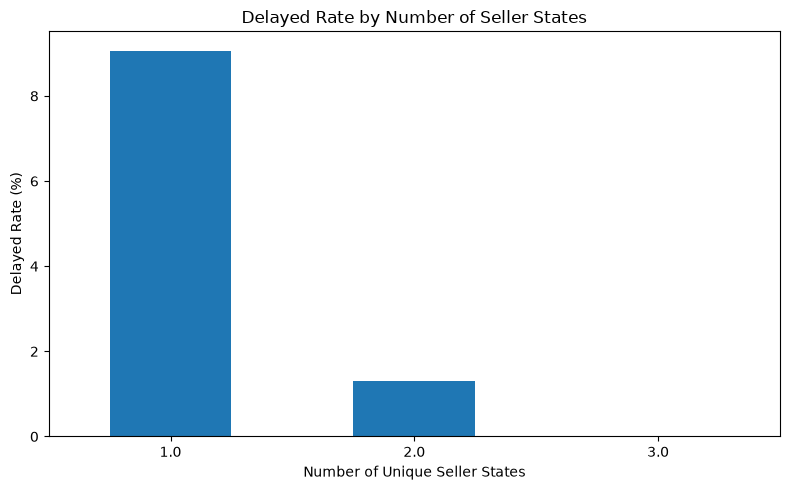

<Figure size 800x500 with 0 Axes>

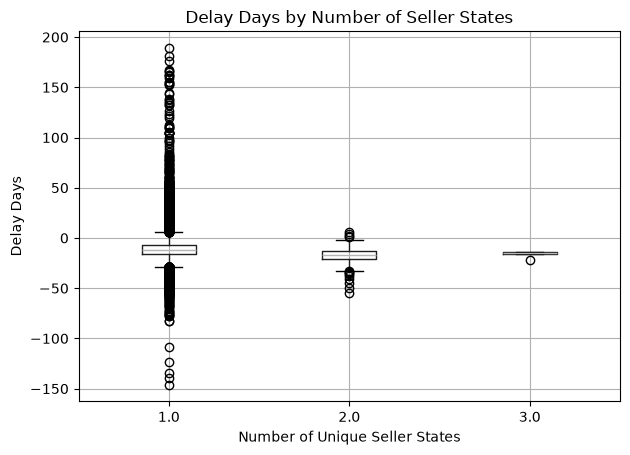


SELLERS SAME CUSTOMER STATE

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
sellers_same_customer_state,67533.0,0.34,0.47,0.0,0.0,0.0,1.0,1.0



--- Value Counts ---


,orders
sellers_same_customer_state,
0.0,44373
1.0,23160



--- Same Seller/Customer State vs Target ---


,sellers_same_customer_state,orders,delayed_orders,delayed_rate,avg_delay_days,median_delay_days
0,0.0,44373,4832,10.89,-11.14,-12.57
1,1.0,23160,1265,5.46,-10.08,-10.20



--- Pearson Correlation ---
with delay_days: 0.0479
with delayed: -0.0899


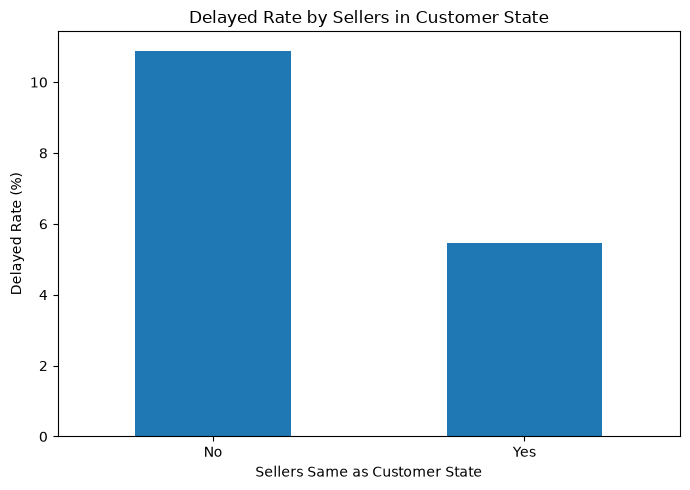

<Figure size 700x500 with 0 Axes>

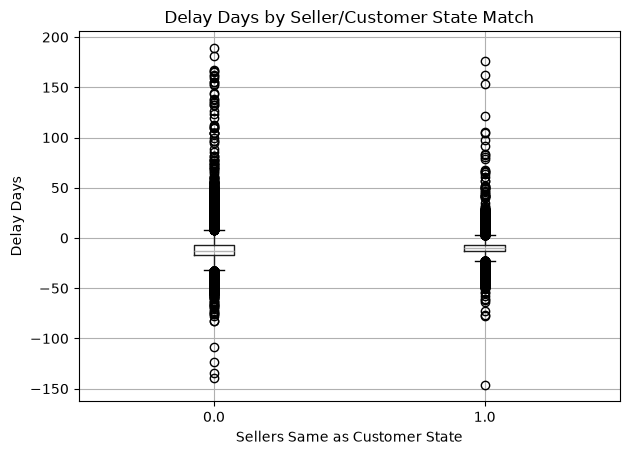


COMBINED SELLER GEOGRAPHY VIEW


,unique_seller_states,sellers_same_customer_state,orders,delayed_rate,avg_delay_days
0,1.0,0.0,44217,10.92,-11.11
1,1.0,1.0,23005,5.49,-10.03
3,2.0,1.0,154,0.65,-17.66
2,2.0,0.0,152,1.97,-17.69
4,3.0,0.0,4,0.00,-16.97
5,3.0,1.0,1,0.00,-14.14


In [118]:
# ============================================================
# SELLER GEOGRAPHY vs CUSTOMER
# ============================================================

print("=" * 90)
print("SELLER GEOGRAPHY vs CUSTOMER")
print("=" * 90)


# ============================================================
# 1. UNIQUE SELLER STATES
# ============================================================

print("\n" + "=" * 90)
print("UNIQUE SELLER STATES")
print("=" * 90)

print("\n--- Summary ---")
display(
    train["unique_seller_states"]
    .describe()
    .to_frame()
    .T
    .round(2)
)

print("\n--- Value Counts ---")
display(
    train["unique_seller_states"]
    .value_counts()
    .sort_index()
    .to_frame("orders")
)


# Relationship with target
seller_states_summary = (
    train.groupby("unique_seller_states")
    .agg(
        orders=("order_id", "count"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

seller_states_summary["delayed_rate"] *= 100

print("\n--- Unique Seller States vs Target ---")
display(
    seller_states_summary
    .round(2)
)


# Pearson correlation
print("\n--- Pearson Correlation ---")

print(
    "with delay_days:",
    train[
        ["unique_seller_states", "delay_days"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)

print(
    "with delayed:",
    train[
        ["unique_seller_states", "delayed"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)


# Plot delayed rate
plt.figure(figsize=(8, 5))

(
    seller_states_summary
    .set_index("unique_seller_states")["delayed_rate"]
    .plot(kind="bar")
)

plt.title("Delayed Rate by Number of Seller States")
plt.xlabel("Number of Unique Seller States")
plt.ylabel("Delayed Rate (%)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


# Boxplot
plt.figure(figsize=(8, 5))

train.boxplot(
    column="delay_days",
    by="unique_seller_states"
)

plt.title("Delay Days by Number of Seller States")
plt.suptitle("")
plt.xlabel("Number of Unique Seller States")
plt.ylabel("Delay Days")
plt.tight_layout()
plt.show()


# ============================================================
# 2. SELLERS SAME CUSTOMER STATE
# ============================================================

print("\n" + "=" * 90)
print("SELLERS SAME CUSTOMER STATE")
print("=" * 90)

print("\n--- Summary ---")
display(
    train["sellers_same_customer_state"]
    .describe()
    .to_frame()
    .T
    .round(2)
)

print("\n--- Value Counts ---")
display(
    train["sellers_same_customer_state"]
    .value_counts()
    .sort_index()
    .to_frame("orders")
)


# Relationship with target
same_state_summary = (
    train.groupby("sellers_same_customer_state")
    .agg(
        orders=("order_id", "count"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
    .reset_index()
)

same_state_summary["delayed_rate"] *= 100

print("\n--- Same Seller/Customer State vs Target ---")
display(
    same_state_summary
    .round(2)
)


# Pearson correlation
print("\n--- Pearson Correlation ---")

print(
    "with delay_days:",
    train[
        ["sellers_same_customer_state", "delay_days"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)

print(
    "with delayed:",
    train[
        ["sellers_same_customer_state", "delayed"]
    ].corr(method="pearson").iloc[0, 1].round(4)
)


# Delayed rate
plt.figure(figsize=(7, 5))

(
    same_state_summary
    .set_index("sellers_same_customer_state")["delayed_rate"]
    .plot(kind="bar")
)

plt.title("Delayed Rate by Sellers in Customer State")
plt.xlabel("Sellers Same as Customer State")
plt.ylabel("Delayed Rate (%)")
plt.xticks([0, 1], ["No", "Yes"], rotation=0)
plt.tight_layout()
plt.show()


# Boxplot
plt.figure(figsize=(7, 5))

train.boxplot(
    column="delay_days",
    by="sellers_same_customer_state"
)

plt.title("Delay Days by Seller/Customer State Match")
plt.suptitle("")
plt.xlabel("Sellers Same as Customer State")
plt.ylabel("Delay Days")
plt.tight_layout()
plt.show()


# ============================================================
# 3. COMBINED VIEW
# ============================================================

print("\n" + "=" * 90)
print("COMBINED SELLER GEOGRAPHY VIEW")
print("=" * 90)

combined_summary = (
    train.groupby(
        ["unique_seller_states", "sellers_same_customer_state"]
    )
    .agg(
        orders=("order_id", "count"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean")
    )
    .reset_index()
)

combined_summary["delayed_rate"] *= 100

display(
    combined_summary
    .sort_values("orders", ascending=False)
    .round(2)
)

UNIQUE SELLER STATES — OUTLIER ANALYSIS

Missing : 0
Unique  : 3
Min     : 1.0
Max     : 3.0
Mean    : 1.005
Median  : 1.000

Value counts:
unique_seller_states
1.0    67222
2.0      306
3.0        5

----------------------------------------------------------------------
IQR OUTLIERS
----------------------------------------------------------------------
Q1              : 1.000
Q3              : 1.000
IQR             : 0.000
Lower threshold : 1.000
Upper threshold : 1.000
Outliers        : 311
Outlier %       : 0.461%

Outlier value distribution:
unique_seller_states
2.0    306
3.0      5

CORRELATION WITH TARGETS
Pearson  delayed    : -0.01828
Spearman delayed    : -0.01838
Pearson  delay_days : -0.04419
Spearman delay_days : -0.05726

TARGET DISTRIBUTION BY UNIQUE SELLER STATES
                      orders  delayed_orders  delayed_rate  avg_delay_days  median_delay_days
unique_seller_states                                                                         
1.0                   

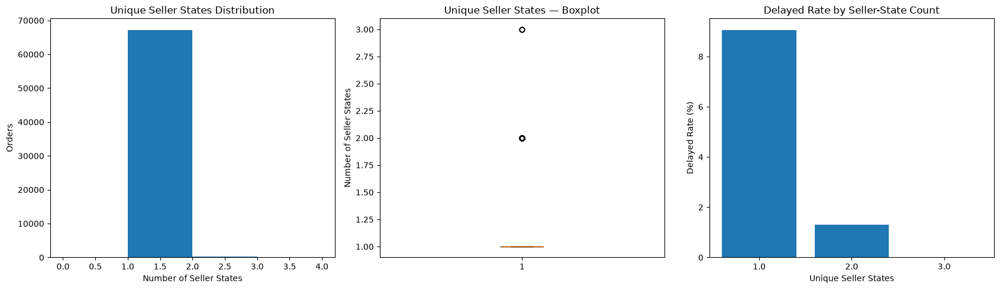

In [40]:
# ============================================================
# UNIQUE_SELLER_STATES — OUTLIER ANALYSIS
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt

col = "unique_seller_states"

print("=" * 70)
print("UNIQUE SELLER STATES — OUTLIER ANALYSIS")
print("=" * 70)

# ------------------------------------------------------------
# 1. Basic distribution
# ------------------------------------------------------------
s = train[col].dropna()

print(f"\nMissing : {train[col].isna().sum():,}")
print(f"Unique  : {train[col].nunique():,}")
print(f"Min     : {s.min()}")
print(f"Max     : {s.max()}")
print(f"Mean    : {s.mean():.3f}")
print(f"Median  : {s.median():.3f}")

print("\nValue counts:")
print(s.value_counts().sort_index().to_string())

# ------------------------------------------------------------
# 2. IQR outliers
# ------------------------------------------------------------
q1 = s.quantile(0.25)
q3 = s.quantile(0.75)
iqr = q3 - q1

lower = q1 - 1.5 * iqr
upper = q3 + 1.5 * iqr

outlier = (train[col] < lower) | (train[col] > upper)

print("\n" + "-" * 70)
print("IQR OUTLIERS")
print("-" * 70)

print(f"Q1              : {q1:.3f}")
print(f"Q3              : {q3:.3f}")
print(f"IQR             : {iqr:.3f}")
print(f"Lower threshold : {lower:.3f}")
print(f"Upper threshold : {upper:.3f}")
print(f"Outliers        : {outlier.sum():,}")
print(f"Outlier %       : {outlier.mean() * 100:.3f}%")

# ------------------------------------------------------------
# 3. Outlier values
# ------------------------------------------------------------
print("\nOutlier value distribution:")

print(
    train.loc[outlier, col]
    .value_counts()
    .sort_index()
    .to_string()
)

# ------------------------------------------------------------
# 4. Relationship with targets
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("CORRELATION WITH TARGETS")
print("=" * 70)

print(
    f"Pearson  delayed    : "
    f"{train[col].corr(train['delayed']):.5f}"
)

print(
    f"Spearman delayed    : "
    f"{train[col].corr(train['delayed'], method='spearman'):.5f}"
)

print(
    f"Pearson  delay_days : "
    f"{train[col].corr(train['delay_days']):.5f}"
)

print(
    f"Spearman delay_days : "
    f"{train[col].corr(train['delay_days'], method='spearman'):.5f}"
)

# ------------------------------------------------------------
# 5. Target distribution by value
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("TARGET DISTRIBUTION BY UNIQUE SELLER STATES")
print("=" * 70)

grouped = (
    train.groupby(col)
    .agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
)

grouped["delayed_rate"] *= 100

print(grouped.round(3).to_string())

# ------------------------------------------------------------
# 6. Quartile target relationship
# ------------------------------------------------------------
# ============================================================
# TARGET RELATIONSHIP — DISCRETE VALUES
# ============================================================

print("\n" + "=" * 70)
print("TARGET RELATIONSHIP BY UNIQUE SELLER STATES")
print("=" * 70)

grouped = (
    train.groupby("unique_seller_states")
    .agg(
        orders=("delayed", "size"),
        delayed_orders=("delayed", "sum"),
        delayed_rate=("delayed", "mean"),
        avg_delay_days=("delay_days", "mean"),
        median_delay_days=("delay_days", "median")
    )
)

grouped["delayed_rate"] *= 100

print(grouped.round(3).to_string())

# ------------------------------------------------------------
# Percentage of observations
# ------------------------------------------------------------

grouped["percentage"] = (
    grouped["orders"] / len(train) * 100
)

print("\nPercentage of orders:")
print(
    grouped[["orders", "percentage"]]
    .round(3)
    .to_string()
)

# ------------------------------------------------------------
# 7. Visualizations
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(17, 5))

axes[0].hist(s, bins=range(int(s.max()) + 2))
axes[0].set_title("Unique Seller States Distribution")
axes[0].set_xlabel("Number of Seller States")
axes[0].set_ylabel("Orders")

axes[1].boxplot(s)
axes[1].set_title("Unique Seller States — Boxplot")
axes[1].set_ylabel("Number of Seller States")

axes[2].bar(
    grouped.index.astype(str),
    grouped["delayed_rate"]
)
axes[2].set_title("Delayed Rate by Seller-State Count")
axes[2].set_xlabel("Unique Seller States")
axes[2].set_ylabel("Delayed Rate (%)")

plt.tight_layout()
plt.show()

## sellers

SELLER COORDINATES EDA

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
seller_lat,67369.0,-22.8440,2.4820,-32.0747,-23.6133,-23.4165,-21.7577,-2.4989
seller_lng,67369.0,-47.2733,2.3335,-63.8931,-48.8298,-46.7555,-46.5221,-34.8551



--- Missing Values ---


,missing,missing_%
seller_lat,164,0.24
seller_lng,164,0.24



--- Unique Values ---


,unique_values
seller_lat,2194
seller_lng,2195



SELLER COORDINATES vs TARGET — PEARSON

--- Correlation Matrix ---


,seller_lat,seller_lng,delay_days,delayed
seller_lat,1.0000,0.4185,0.0283,0.0239
seller_lng,0.4185,1.0000,0.0148,-0.0048
delay_days,0.0283,0.0148,1.0000,0.6429
delayed,0.0239,-0.0048,0.6429,1.0000



--- Pearson with delay_days ---


,pearson_r
seller_lng,0.0148
seller_lat,0.0283
delayed,0.6429



--- Pearson with delayed ---


,pearson_r
seller_lng,-0.0048
seller_lat,0.0239
delay_days,0.6429



SELLER COORDINATES BY DELAY STATUS


seller_lat                                            seller_lng  \
             count     mean   median     std      min     max      count   
delayed                                                                    
0            61286 -22.8627 -23.4244  2.4821 -32.0747 -2.4989      61286   
1             6083 -22.6558 -23.2111  2.4743 -30.1120 -2.4989       6083   

                                                     
            mean   median     std      min      max  
delayed                                              
0       -47.2698 -46.7555  2.3458 -63.8931 -34.8551  
1       -47.3086 -46.8071  2.2053 -60.0220 -34.8946

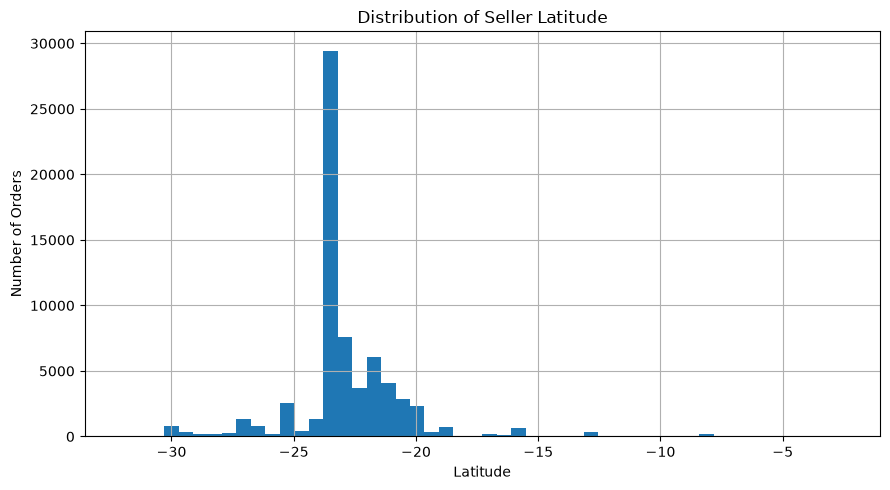

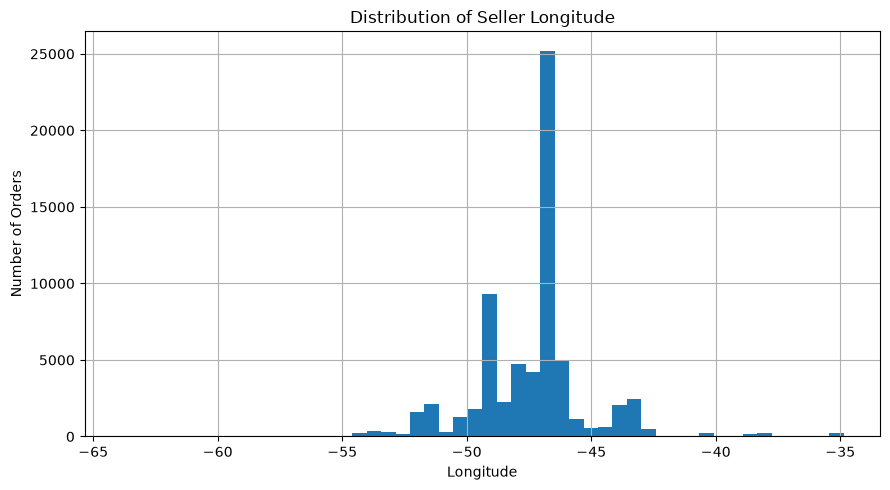

<Figure size 800x500 with 0 Axes>

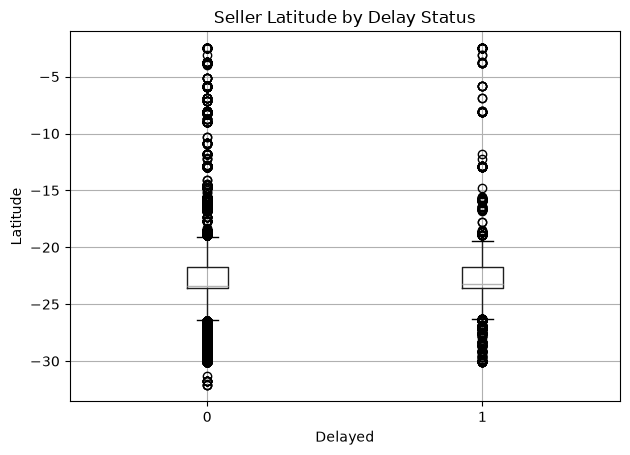

<Figure size 800x500 with 0 Axes>

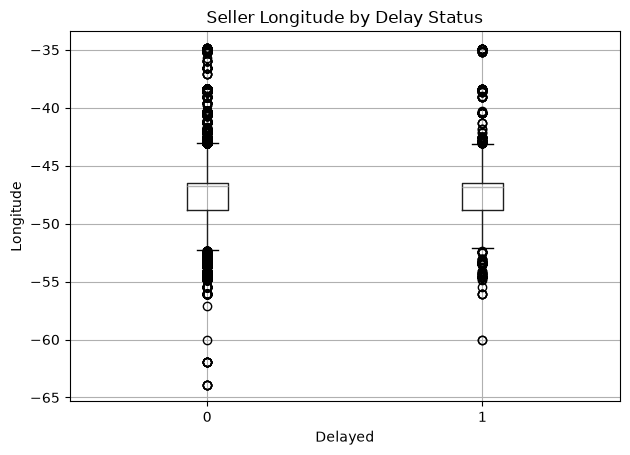

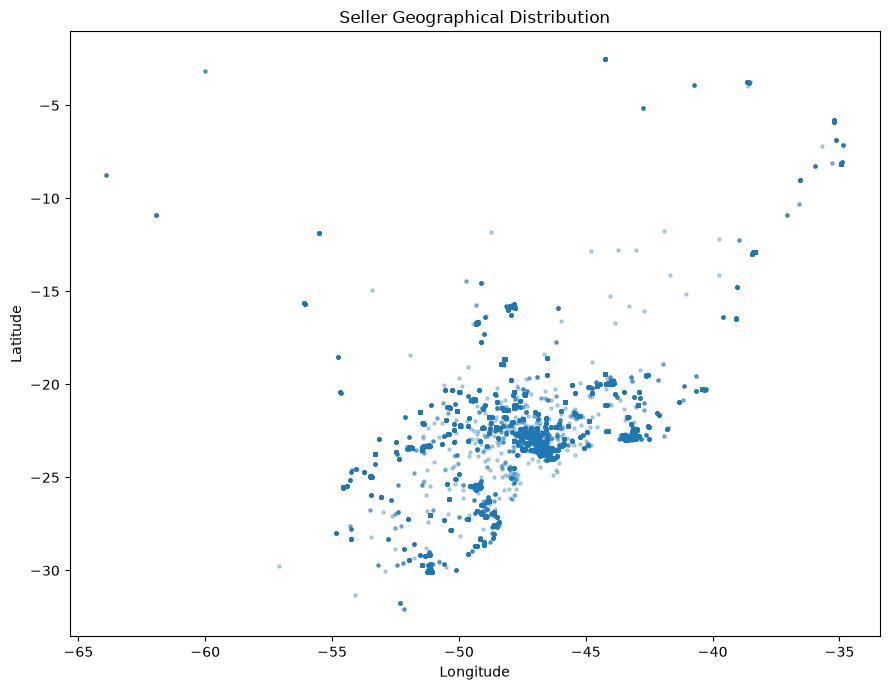

In [119]:
# ============================================================
# SELLER COORDINATES — LATITUDE + LONGITUDE
# ============================================================

print("=" * 90)
print("SELLER COORDINATES EDA")
print("=" * 90)


# ============================================================
# 1. SUMMARY
# ============================================================

coordinate_cols = [
    "seller_lat",
    "seller_lng"
]

print("\n--- Summary ---")

display(
    train[coordinate_cols]
    .describe()
    .T
    .round(4)
)


# ============================================================
# 2. MISSING VALUES
# ============================================================

print("\n--- Missing Values ---")

seller_missing = pd.DataFrame({
    "missing": train[coordinate_cols].isna().sum(),
    "missing_%": train[coordinate_cols].isna().mean().mul(100)
})

display(seller_missing.round(2))


# ============================================================
# 3. UNIQUE VALUES
# ============================================================

print("\n--- Unique Values ---")

display(
    train[coordinate_cols]
    .nunique()
    .to_frame("unique_values")
)


# ============================================================
# 4. SELLER COORDINATES vs TARGET — PEARSON
# ============================================================

print("\n" + "=" * 90)
print("SELLER COORDINATES vs TARGET — PEARSON")
print("=" * 90)

corr_data = train[
    [
        "seller_lat",
        "seller_lng",
        "delay_days",
        "delayed"
    ]
].corr(method="pearson")

print("\n--- Correlation Matrix ---")
display(corr_data.round(4))


print("\n--- Pearson with delay_days ---")

display(
    corr_data["delay_days"]
    .drop("delay_days")
    .sort_values()
    .to_frame("pearson_r")
    .round(4)
)


print("\n--- Pearson with delayed ---")

display(
    corr_data["delayed"]
    .drop("delayed")
    .sort_values()
    .to_frame("pearson_r")
    .round(4)
)


# ============================================================
# 5. SELLER COORDINATES BY DELAY STATUS
# ============================================================

print("\n" + "=" * 90)
print("SELLER COORDINATES BY DELAY STATUS")
print("=" * 90)

display(
    train.groupby("delayed")[coordinate_cols]
    .agg([
        "count",
        "mean",
        "median",
        "std",
        "min",
        "max"
    ])
    .round(4)
)


# ============================================================
# 6. SELLER LATITUDE DISTRIBUTION
# ============================================================

plt.figure(figsize=(9, 5))

train["seller_lat"].hist(bins=50)

plt.title("Distribution of Seller Latitude")
plt.xlabel("Latitude")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()


# ============================================================
# 7. SELLER LONGITUDE DISTRIBUTION
# ============================================================

plt.figure(figsize=(9, 5))

train["seller_lng"].hist(bins=50)

plt.title("Distribution of Seller Longitude")
plt.xlabel("Longitude")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.show()


# ============================================================
# 8. LATITUDE vs DELAY
# ============================================================

plt.figure(figsize=(8, 5))

train.boxplot(
    column="seller_lat",
    by="delayed"
)

plt.title("Seller Latitude by Delay Status")
plt.suptitle("")
plt.xlabel("Delayed")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


# ============================================================
# 9. LONGITUDE vs DELAY
# ============================================================

plt.figure(figsize=(8, 5))

train.boxplot(
    column="seller_lng",
    by="delayed"
)

plt.title("Seller Longitude by Delay Status")
plt.suptitle("")
plt.xlabel("Delayed")
plt.ylabel("Longitude")
plt.tight_layout()
plt.show()


# ============================================================
# 10. SELLER GEOGRAPHICAL DISTRIBUTION
# ============================================================

plt.figure(figsize=(9, 7))

plt.scatter(
    train["seller_lng"],
    train["seller_lat"],
    s=5,
    alpha=0.3
)

plt.title("Seller Geographical Distribution")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

SELLER–CUSTOMER DISTANCE EDA

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
min_seller_distance_km,67189.0,613.52,595.63,0.0,216.43,447.17,810.40,8032.94
max_seller_distance_km,67189.0,615.84,595.98,0.0,220.29,449.89,812.06,8032.94
mean_seller_distance_km,67189.0,614.68,595.55,0.0,219.18,448.47,810.70,8032.94
median_seller_distance_km,67189.0,614.68,595.57,0.0,219.07,448.47,810.71,8032.94



--- Missing Values ---


,missing,missing_%
min_seller_distance_km,344,0.51
max_seller_distance_km,344,0.51
mean_seller_distance_km,344,0.51
median_seller_distance_km,344,0.51



--- Unique Values ---


,unique_values
min_seller_distance_km,63640
max_seller_distance_km,63645
mean_seller_distance_km,63694
median_seller_distance_km,63691



--- Skewness ---


,skewness
min_seller_distance_km,1.68
max_seller_distance_km,1.68
mean_seller_distance_km,1.68
median_seller_distance_km,1.68



DISTANCE vs TARGET — PEARSON

--- Correlation Matrix ---


,min_seller_distance_km,max_seller_distance_km,mean_seller_distance_km,median_seller_distance_km,delay_days,delayed
min_seller_distance_km,1.0000,0.9982,0.9996,0.9995,-0.0411,0.0869
max_seller_distance_km,0.9982,1.0000,0.9996,0.9996,-0.0438,0.0858
mean_seller_distance_km,0.9996,0.9996,1.0000,1.0000,-0.0425,0.0864
median_seller_distance_km,0.9995,0.9996,1.0000,1.0000,-0.0425,0.0864
delay_days,-0.0411,-0.0438,-0.0425,-0.0425,1.0000,0.6429
delayed,0.0869,0.0858,0.0864,0.0864,0.6429,1.0000



--- Pearson with delay_days ---


,pearson_r
max_seller_distance_km,-0.0438
median_seller_distance_km,-0.0425
mean_seller_distance_km,-0.0425
min_seller_distance_km,-0.0411
delayed,0.6429



--- Pearson with delayed ---


,pearson_r
max_seller_distance_km,0.0858
median_seller_distance_km,0.0864
mean_seller_distance_km,0.0864
min_seller_distance_km,0.0869
delay_days,0.6429



DISTANCE BY DELAY STATUS


min_seller_distance_km                                         \
                         count    mean  median     std   min      max   
delayed                                                                 
0                        61130  597.23  435.94  585.18  0.00  8032.94   
1                         6059  777.92  550.66  670.60  1.45  3322.48   

        max_seller_distance_km                          ...  \
                         count    mean  median     std  ...   
delayed                                                 ...   
0                        61130  599.75  439.07  585.61  ...   
1                         6059  778.17  550.66  670.79  ...   

        mean_seller_distance_km                         \
                         median     std   min      max   
delayed                                                  
0                        437.43  585.11  0.00  8032.94   
1                        550.66  670.68  1.45  3322.48   

        median_seller_distance_km                                         
                            count    mean  median     std   min      max  
delayed                                                                   
0                           61130  598.49  437.43  585.13  0.00  8032.94  
1                            6059  778.04  550.66  670.68  1.45  3322.48  

[2 rows x 24 columns]


DISTANCE QUANTILES


,min_seller_distance_km,max_seller_distance_km,mean_seller_distance_km,median_seller_distance_km
0.00,0.00,0.00,0.00,0.00
0.01,6.02,6.04,6.04,6.04
0.05,17.79,17.87,17.86,17.86
0.25,216.43,220.29,219.18,219.07
0.50,447.17,449.89,448.47,448.47
0.75,810.40,812.06,810.70,810.71
0.95,2103.00,2104.06,2103.48,2103.48
0.99,2491.75,2492.53,2491.75,2491.75
1.00,8032.94,8032.94,8032.94,8032.94


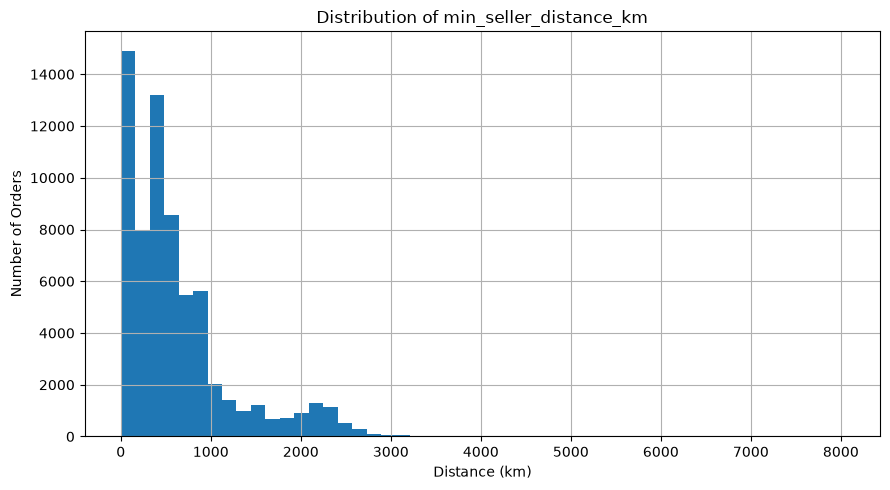

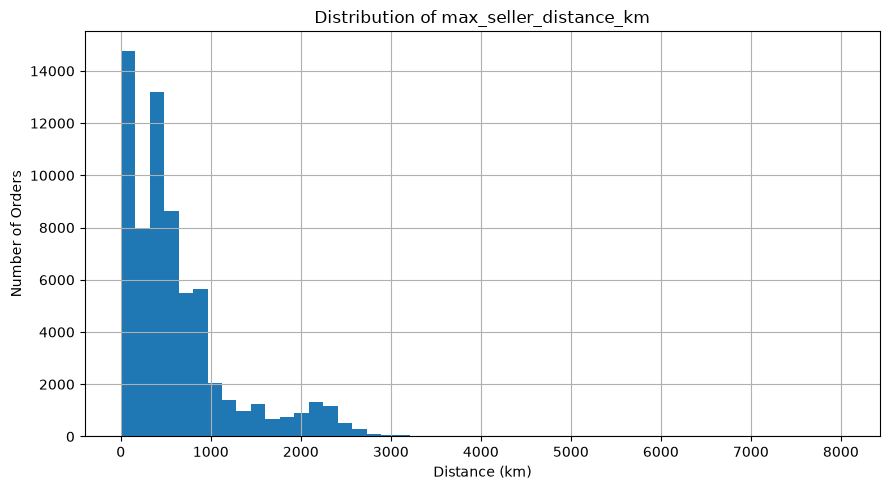

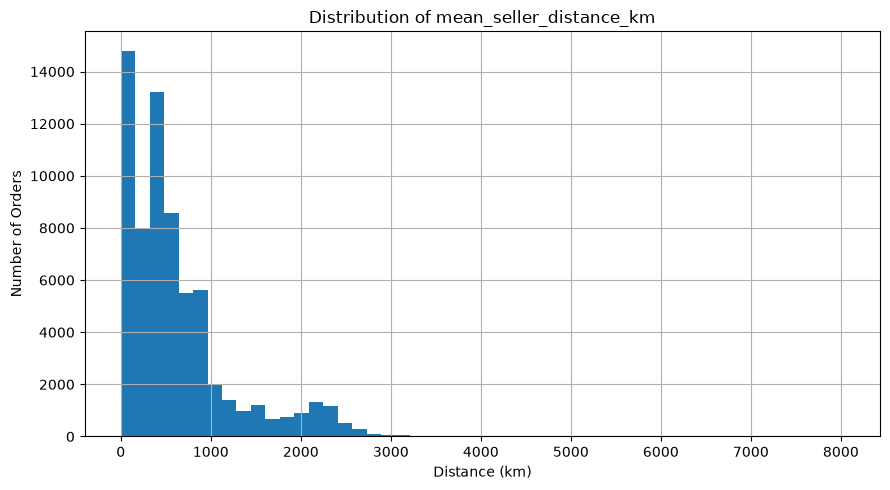

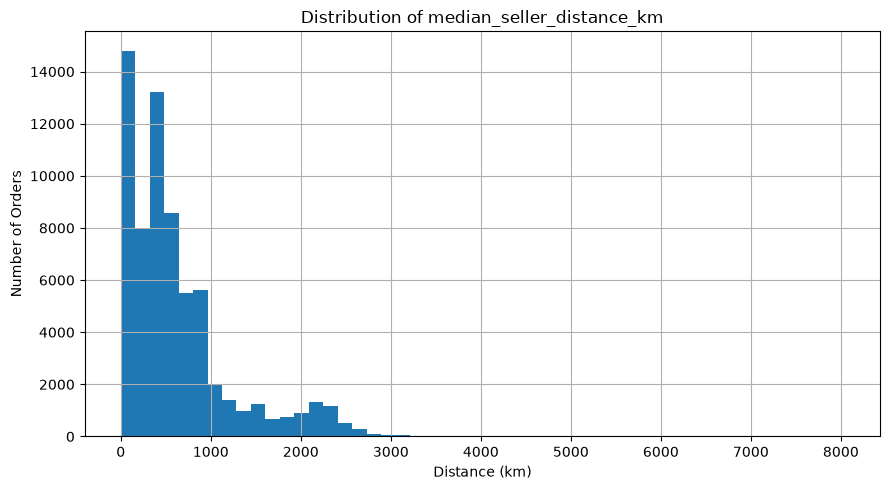

<Figure size 800x500 with 0 Axes>

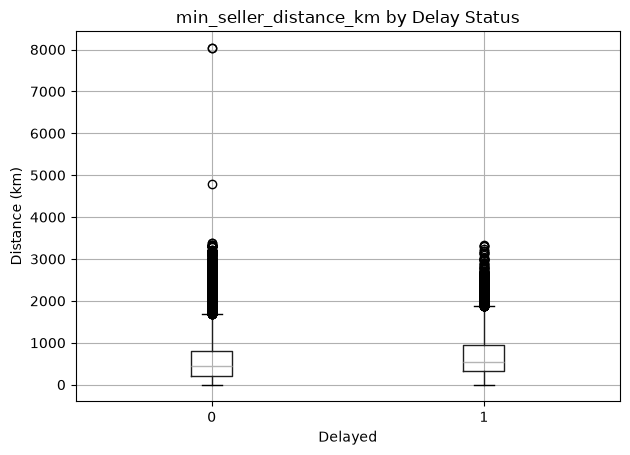

<Figure size 800x500 with 0 Axes>

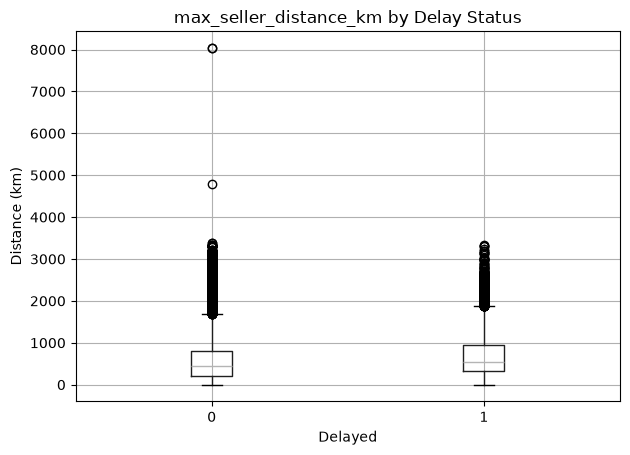

<Figure size 800x500 with 0 Axes>

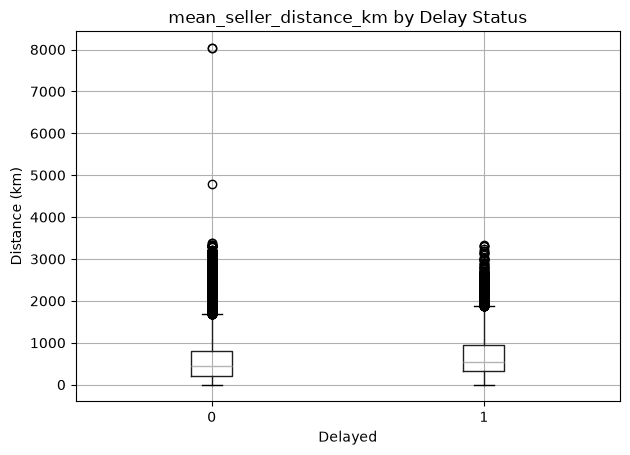

<Figure size 800x500 with 0 Axes>

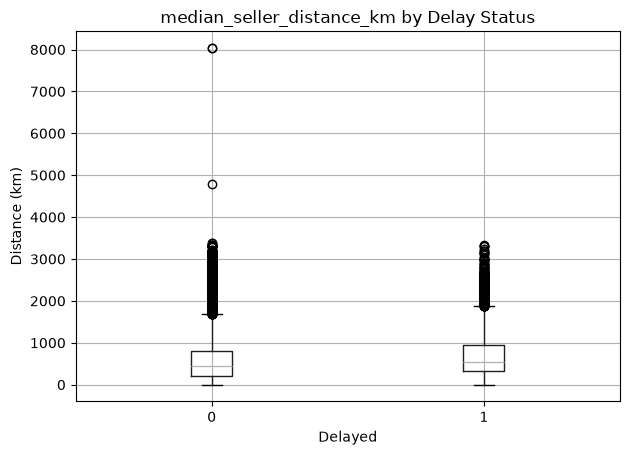


DELAY RATE BY DISTANCE QUARTILES

--- min_seller_distance_km ---


,distance_group,orders,delayed_rate,avg_delay_days,median_delay_days
0,"(-0.001, 216.428]",16798,5.26,-9.96,-9.98
1,"(216.428, 447.173]",16797,8.91,-10.77,-12.17
2,"(447.173, 810.395]",16797,10.04,-10.78,-12.26
3,"(810.395, 8032.941]",16797,11.86,-11.61,-13.19



--- max_seller_distance_km ---


,distance_group,orders,delayed_rate,avg_delay_days,median_delay_days
0,"(-0.001, 220.287]",16798,5.29,-9.91,-9.89
1,"(220.287, 449.888]",16797,8.99,-10.75,-12.17
2,"(449.888, 812.058]",16797,9.98,-10.81,-12.27
3,"(812.058, 8032.941]",16797,11.81,-11.65,-13.20



--- mean_seller_distance_km ---


,distance_group,orders,delayed_rate,avg_delay_days,median_delay_days
0,"(-0.001, 219.178]",16798,5.27,-9.93,-9.95
1,"(219.178, 448.466]",16797,8.96,-10.76,-12.18
2,"(448.466, 810.696]",16797,9.99,-10.81,-12.27
3,"(810.696, 8032.941]",16797,11.85,-11.62,-13.19



--- median_seller_distance_km ---


,distance_group,orders,delayed_rate,avg_delay_days,median_delay_days
0,"(-0.001, 219.066]",16798,5.27,-9.93,-9.95
1,"(219.066, 448.466]",16797,8.96,-10.76,-12.18
2,"(448.466, 810.713]",16797,9.99,-10.81,-12.27
3,"(810.713, 8032.941]",16797,11.85,-11.62,-13.19



CORRELATION BETWEEN DISTANCE FEATURES


,min_seller_distance_km,max_seller_distance_km,mean_seller_distance_km,median_seller_distance_km
min_seller_distance_km,1.0000,0.9982,0.9996,0.9995
max_seller_distance_km,0.9982,1.0000,0.9996,0.9996
mean_seller_distance_km,0.9996,0.9996,1.0000,1.0000
median_seller_distance_km,0.9995,0.9996,1.0000,1.0000



SELLER DISTANCE RANGE

--- Summary ---


,count,mean,std,min,25%,50%,75%,max
seller_distance_range_km,67189.0,2.32,35.43,0.0,0.0,0.0,0.0,2254.96



--- Pearson with Targets ---
delay_days: -0.0453
delayed: -0.0183


,count,mean,median,std,min,max
delayed,,,,,,
0,61130,2.52,0.0,37.04,0.0,2254.96
1,6059,0.25,0.0,8.40,0.0,463.88


In [120]:
# ============================================================
# SELLER–CUSTOMER DISTANCE — EDA
# ============================================================

print("=" * 90)
print("SELLER–CUSTOMER DISTANCE EDA")
print("=" * 90)

distance_cols = [
    "min_seller_distance_km",
    "max_seller_distance_km",
    "mean_seller_distance_km",
    "median_seller_distance_km"
]


# ============================================================
# 1. SUMMARY
# ============================================================

print("\n--- Summary ---")

display(
    train[distance_cols]
    .describe()
    .T
    .round(2)
)


# ============================================================
# 2. MISSING VALUES
# ============================================================

print("\n--- Missing Values ---")

distance_missing = pd.DataFrame({
    "missing": train[distance_cols].isna().sum(),
    "missing_%": train[distance_cols].isna().mean().mul(100)
})

display(distance_missing.round(2))


# ============================================================
# 3. UNIQUE VALUES
# ============================================================

print("\n--- Unique Values ---")

display(
    train[distance_cols]
    .nunique()
    .to_frame("unique_values")
)


# ============================================================
# 4. SKEWNESS
# ============================================================

print("\n--- Skewness ---")

display(
    train[distance_cols]
    .skew()
    .to_frame("skewness")
    .round(2)
)


# ============================================================
# 5. DISTANCE vs TARGET — PEARSON
# ============================================================

print("\n" + "=" * 90)
print("DISTANCE vs TARGET — PEARSON")
print("=" * 90)

corr_data = train[
    distance_cols + [
        "delay_days",
        "delayed"
    ]
].corr(method="pearson")

print("\n--- Correlation Matrix ---")

display(
    corr_data.round(4)
)


print("\n--- Pearson with delay_days ---")

display(
    corr_data["delay_days"]
    .drop("delay_days")
    .sort_values()
    .to_frame("pearson_r")
    .round(4)
)


print("\n--- Pearson with delayed ---")

display(
    corr_data["delayed"]
    .drop("delayed")
    .sort_values()
    .to_frame("pearson_r")
    .round(4)
)


# ============================================================
# 6. DISTANCE BY DELAY STATUS
# ============================================================

print("\n" + "=" * 90)
print("DISTANCE BY DELAY STATUS")
print("=" * 90)

distance_target_summary = (
    train.groupby("delayed")[distance_cols]
    .agg([
        "count",
        "mean",
        "median",
        "std",
        "min",
        "max"
    ])
    .round(2)
)

display(distance_target_summary)


# ============================================================
# 7. QUANTILES
# ============================================================

print("\n" + "=" * 90)
print("DISTANCE QUANTILES")
print("=" * 90)

display(
    train[distance_cols]
    .quantile(
        [0, .01, .05, .25, .50, .75, .95, .99, 1]
    )
    .round(2)
)


# ============================================================
# 8. DISTRIBUTIONS
# ============================================================

for col in distance_cols:

    plt.figure(figsize=(9, 5))

    train[col].hist(bins=50)

    plt.title(f"Distribution of {col}")
    plt.xlabel("Distance (km)")
    plt.ylabel("Number of Orders")
    plt.tight_layout()
    plt.show()


# ============================================================
# 9. BOXPLOTS BY DELAY STATUS
# ============================================================

for col in distance_cols:

    plt.figure(figsize=(8, 5))

    train.boxplot(
        column=col,
        by="delayed"
    )

    plt.title(f"{col} by Delay Status")
    plt.suptitle("")
    plt.xlabel("Delayed")
    plt.ylabel("Distance (km)")
    plt.tight_layout()
    plt.show()


# ============================================================
# 10. DELAY RATE BY DISTANCE QUARTILES
# ============================================================

print("\n" + "=" * 90)
print("DELAY RATE BY DISTANCE QUARTILES")
print("=" * 90)

for col in distance_cols:

    temp = train[[col, "delayed", "delay_days"]].dropna().copy()

    temp["distance_group"] = pd.qcut(
        temp[col],
        q=4,
        duplicates="drop"
    )

    summary = (
        temp.groupby("distance_group", observed=True)
        .agg(
            orders=("delayed", "count"),
            delayed_rate=("delayed", "mean"),
            avg_delay_days=("delay_days", "mean"),
            median_delay_days=("delay_days", "median")
        )
        .reset_index()
    )

    summary["delayed_rate"] *= 100

    print(f"\n--- {col} ---")

    display(
        summary.round(2)
    )


# ============================================================
# 11. CORRELATION BETWEEN DISTANCE FEATURES
# ============================================================

print("\n" + "=" * 90)
print("CORRELATION BETWEEN DISTANCE FEATURES")
print("=" * 90)

display(
    train[distance_cols]
    .corr(method="pearson")
    .round(4)
)


# ============================================================
# 12. DISTANCE RANGE WITHIN ORDER
# ============================================================

train["seller_distance_range_km"] = (
    train["max_seller_distance_km"]
    - train["min_seller_distance_km"]
)

print("\n" + "=" * 90)
print("SELLER DISTANCE RANGE")
print("=" * 90)

print("\n--- Summary ---")

display(
    train["seller_distance_range_km"]
    .describe()
    .to_frame()
    .T
    .round(2)
)

print("\n--- Pearson with Targets ---")

print(
    "delay_days:",
    train[
        ["seller_distance_range_km", "delay_days"]
    ].corr().iloc[0, 1].round(4)
)

print(
    "delayed:",
    train[
        ["seller_distance_range_km", "delayed"]
    ].corr().iloc[0, 1].round(4)
)


# ============================================================
# 13. DISTANCE RANGE BY DELAY STATUS
# ============================================================

display(
    train.groupby("delayed")["seller_distance_range_km"]
    .agg([
        "count",
        "mean",
        "median",
        "std",
        "min",
        "max"
    ])
    .round(2)
)

In [41]:
cols = [
    "customer_lat",
    "customer_lng",
    "seller_lat",
    "seller_lng",
    "min_seller_distance_km"
]

print("=" * 80)
print("GEOGRAPHIC FEATURES — TARGET RELATIONSHIP")
print("=" * 80)

for col in cols:
    print(
        f"{col:28s} | "
        f"Pearson delayed: {train[col].corr(train['delayed']):.4f} | "
        f"Spearman delayed: {train[col].corr(train['delayed'], method='spearman'):.4f} | "
        f"Pearson delay_days: {train[col].corr(train['delay_days']):.4f} | "
        f"Spearman delay_days: {train[col].corr(train['delay_days'], method='spearman'):.4f}"
    )

GEOGRAPHIC FEATURES — TARGET RELATIONSHIP
customer_lat                 | Pearson delayed: 0.0614 | Spearman delayed: 0.0559 | Pearson delay_days: -0.0080 | Spearman delay_days: -0.0471
customer_lng                 | Pearson delayed: 0.0827 | Spearman delayed: 0.0834 | Pearson delay_days: 0.0694 | Spearman delay_days: 0.0477
seller_lat                   | Pearson delayed: 0.0239 | Spearman delayed: 0.0329 | Pearson delay_days: 0.0283 | Spearman delay_days: 0.0349
seller_lng                   | Pearson delayed: -0.0048 | Spearman delayed: -0.0112 | Pearson delay_days: 0.0148 | Spearman delay_days: 0.0320
min_seller_distance_km       | Pearson delayed: 0.0869 | Spearman delayed: 0.0882 | Pearson delay_days: -0.0411 | Spearman delay_days: -0.1332


## check methodology

/tmp/ipykernel_70/1958733642.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  ax.boxplot(mean_delay, vert=False)


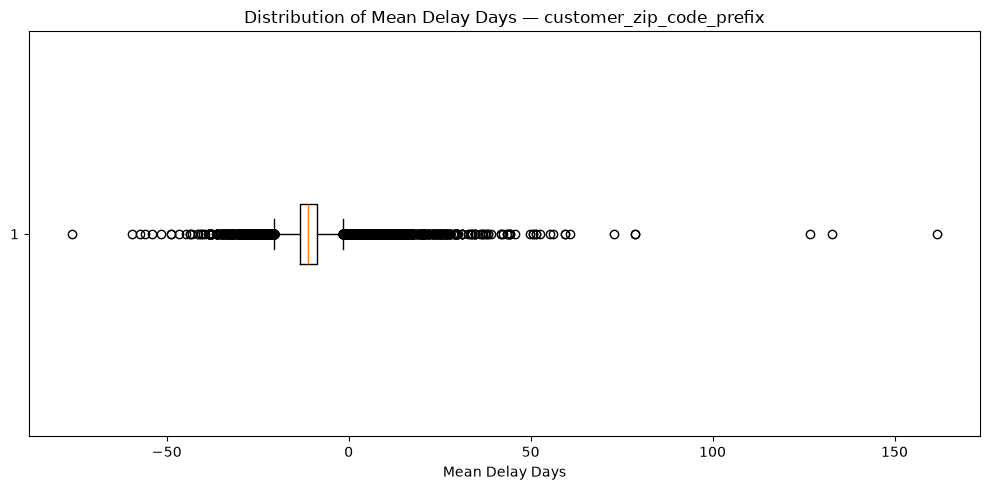

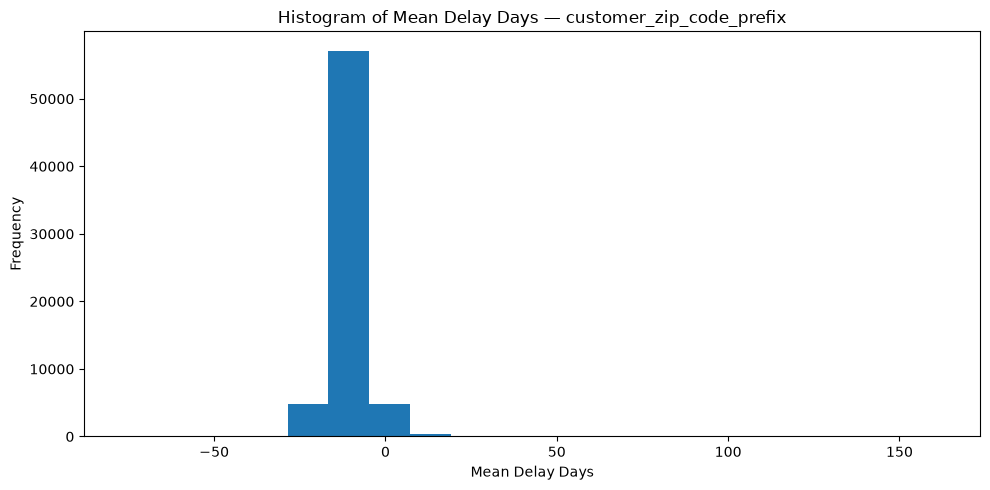

/tmp/ipykernel_70/1958733642.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  ax.boxplot(mean_delay, vert=False)


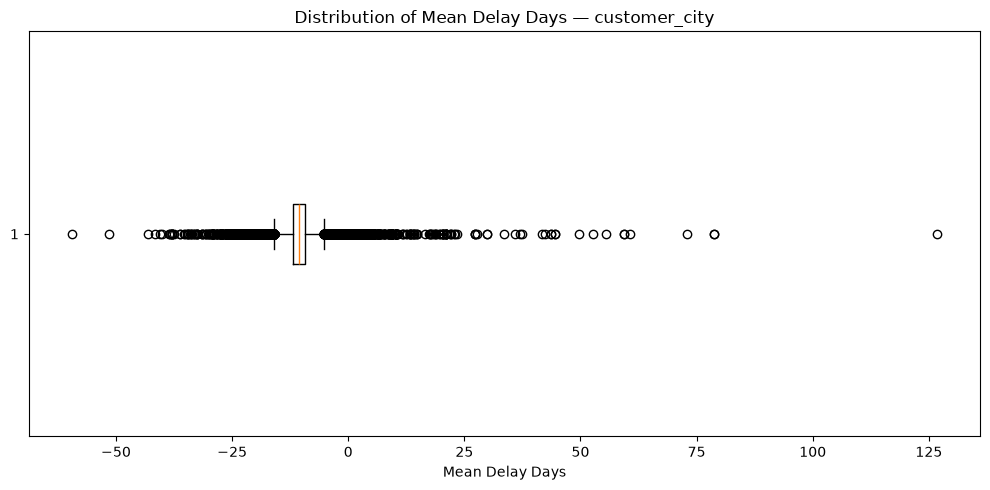

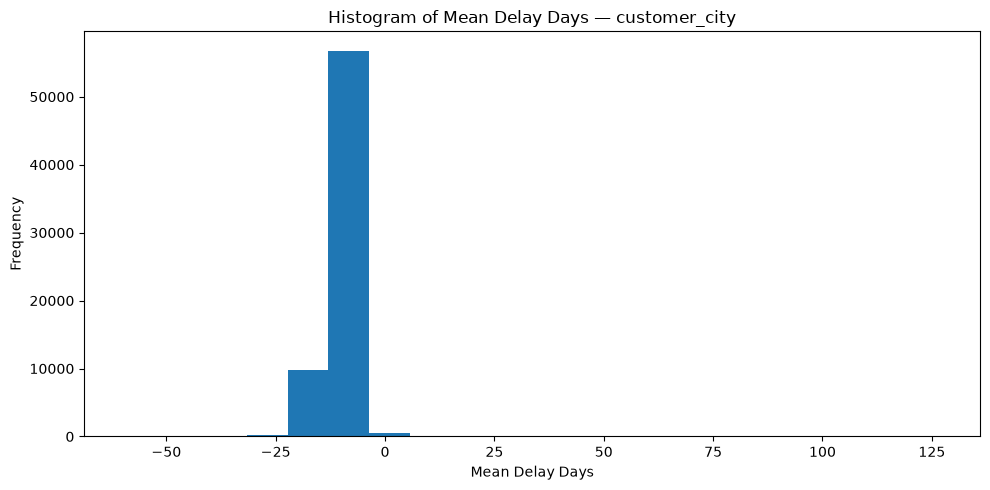

/tmp/ipykernel_70/1958733642.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  ax.boxplot(mean_delay, vert=False)


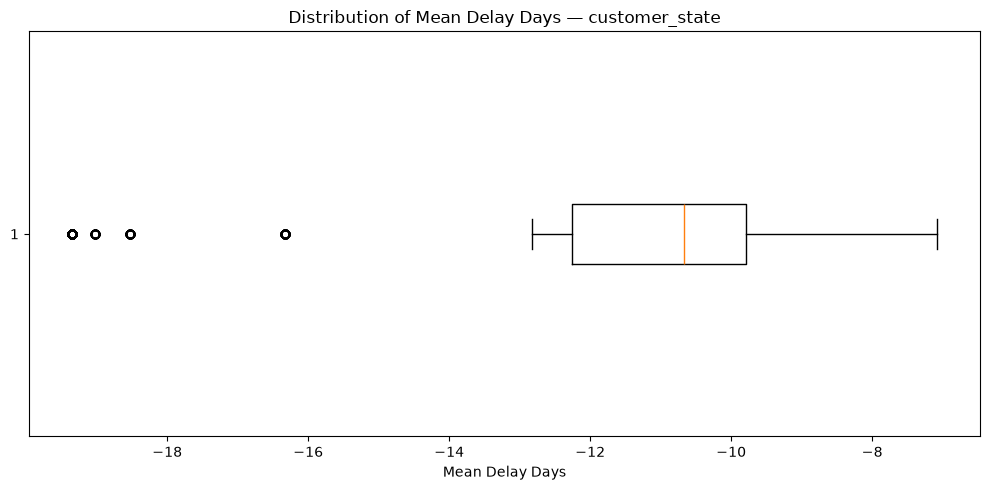

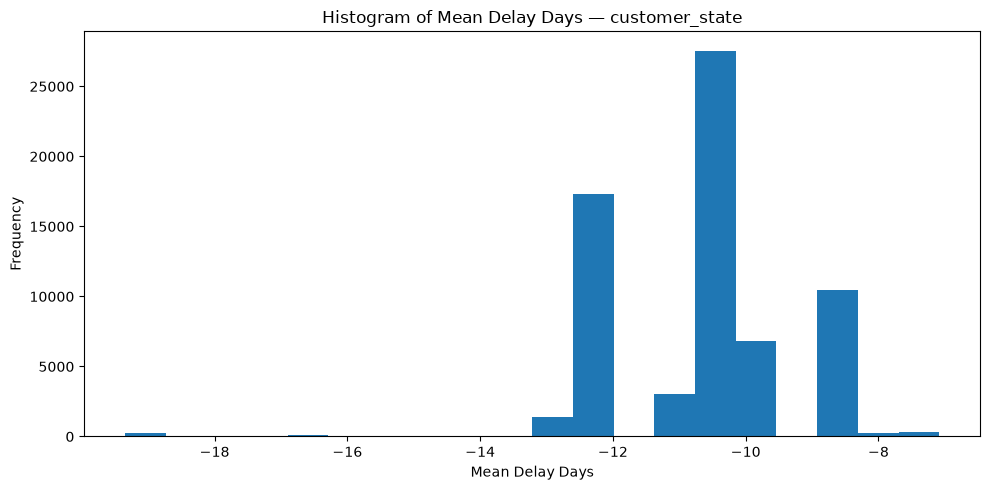

/tmp/ipykernel_70/1958733642.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  ax.boxplot(mean_delay, vert=False)


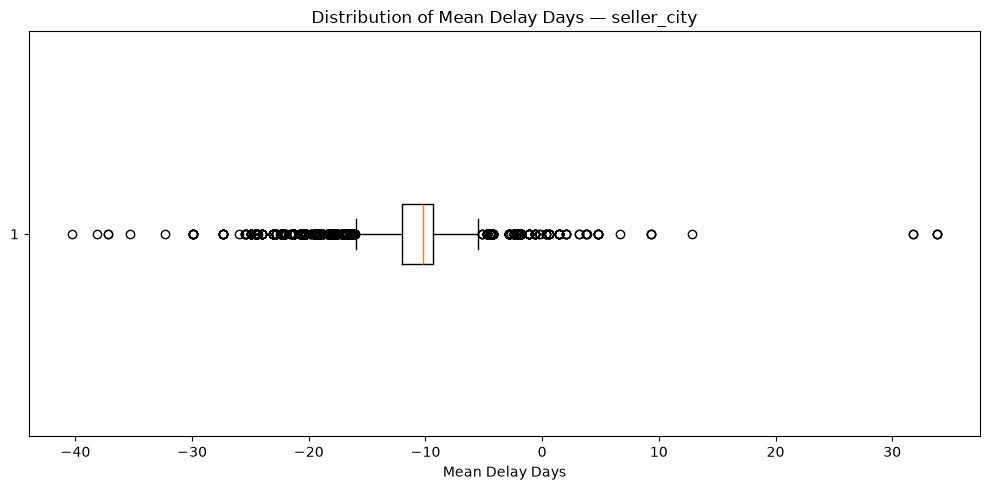

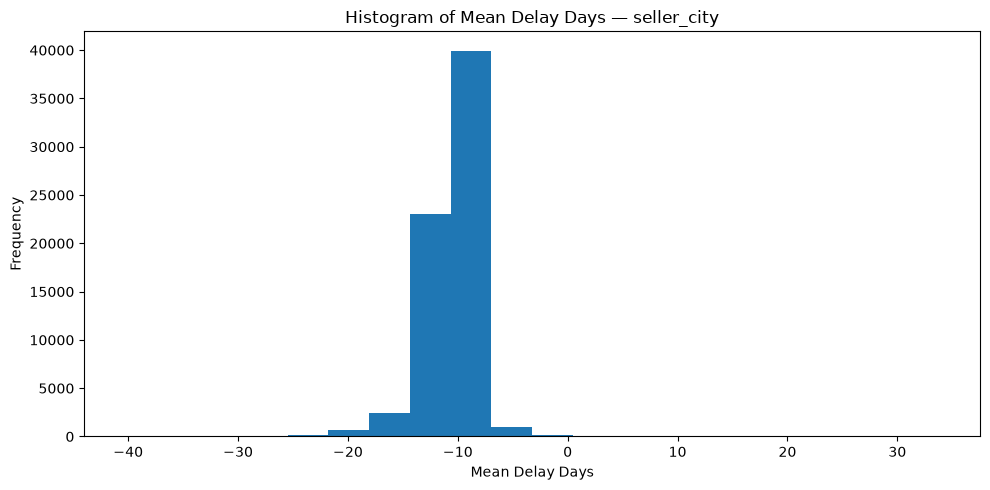

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

train = pd.read_csv("../data/train_3.csv")
geo_cols = ["customer_zip_code_prefix", "customer_city", "customer_state", "seller_city"]

for col in geo_cols:
    mapping = train.groupby(col)["delay_days"].mean()
    mean_delay = train[col].map(mapping).dropna()

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.boxplot(mean_delay, vert=False)
    ax.set_xlabel("Mean Delay Days")
    ax.set_title(f"Distribution of Mean Delay Days — {col}")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.hist(mean_delay, bins=20)
    plt.xlabel("Mean Delay Days")
    plt.ylabel("Frequency")
    plt.title(f"Histogram of Mean Delay Days — {col}")
    plt.tight_layout()
    plt.show()

# Final Notes

In [ ]:
# Review-related features are excluded from model training (leakage)

# seller_count values more than 3 become 3 or more than 2 become 2 cause its few

# price : choose total_price, delete max mean med min, delete outliers where delay=0 only

# frieght : choose  min , delete max mean med total, delete outliers where delay=0 only

# item_count : delete value=21 , each value more than 6 become 6 

# unique_products : each value more than 4 become 4

# unique_category : delete value = 6

# item_weight : choose min , delete other , delete outliers where delay = 0 

# volume : choose  min

# ignore (delete) photos

# payment : choose max_installments , total_payment , delete other



# purchase : choose min and create:
#purchase_year = purchase_time.dt.year
#purchase_month = purchase_time.dt.month
#purchase_weekday = purchase_time.dt.weekday
#purchase_hour = purchase_time.dt.hour
#purchase_quarter = purchase_time.dt.quarter

# remove NA/nan from trining data only ( not the future & leakage)

# approval : choose approval min and create:
#   year quarter month week day hour


#`customer_zip_code_prefix`: Group ZIP codes into 20 ordered groups based on historical mean `delay_days`, 
#  then drop the raw ZIP and keep only `customer_zip_delay_group`.


#  unique_seller_states : delete value = 3

# choose lat & long customer , and min_seller_distance_km  ,   delete else (max mean med seller_lat seeler_long)

#



In [6]:
"""
# Review-related features are excluded from model training (leakage)

# seller_count: values more than 3 become 3

# price: choose total_price, delete max/mean/median/min, delete outliers where delay_days = 0 only

# freight: choose min, delete max/mean/median/total, delete outliers where delay_days = 0 only

# item_count: delete value = 21, values more than 6 become 6

# unique_products: values more than 4 become 4

# unique_category: delete value = 6

# item_weight: choose min, delete other aggregations, delete outliers where delay_days = 0 only

# volume: choose min

# photos: ignore (delete)

# payment: choose max_installments and total_payment, delete other aggregations

# purchase: choose min and create:

# purchase_year = purchase_time.dt.year

# purchase_month = purchase_time.dt.month

# purchase_weekday = purchase_time.dt.weekday

# purchase_hour = purchase_time.dt.hour

# purchase_quarter = purchase_time.dt.quarter

# Remove NA/NaN from training data only

# Do not remove future/inference data based on the target

# approval: choose min and create:

# approval_year

# approval_quarter

# approval_month

# approval_week

# approval_day

# approval_hour

# Geographic features:

# customer_zip_code_prefix: replace each ZIP code with its historical mean delay_days

# customer_city: replace each customer city with its historical mean delay_days

# customer_state: replace each customer state with its historical mean delay_days

# seller_city: replace each seller city with its historical mean delay_days

#

# The mean delay_days is calculated for each category using training data only.

# The original categorical columns are then removed and replaced by their

# corresponding mean-delay encoded numerical features.

#

# This approach preserves the continuous delay information of each category

# instead of converting categories into ordered groups.

# Cap delay_days at 70:

# values greater than 70 are replaced with 70,

# treating 70 as the maximum delay value.

# unique_seller_states: delete value = 3

# Location features:

# choose customer_lat, customer_long, and min_seller_distance_km

# delete max/mean/median seller distance and seller_lat/seller_long

"""

'\n# Review-related features are excluded from model training (leakage)\n\n# seller_count: values more than 3 become 3\n\n# price: choose total_price, delete max/mean/median/min, delete outliers where delay_days = 0 only\n\n# freight: choose min, delete max/mean/median/total, delete outliers where delay_days = 0 only\n\n# item_count: delete value = 21, values more than 6 become 6\n\n# unique_products: values more than 4 become 4\n\n# unique_category: delete value = 6\n\n# item_weight: choose min, delete other aggregations, delete outliers where delay_days = 0 only\n\n# volume: choose min\n\n# photos: ignore (delete)\n\n# payment: choose max_installments and total_payment, delete other aggregations\n\n# purchase: choose min and create:\n\n# purchase_year = purchase_time.dt.year\n\n# purchase_month = purchase_time.dt.month\n\n# purchase_weekday = purchase_time.dt.weekday\n\n# purchase_hour = purchase_time.dt.hour\n\n# purchase_quarter = purchase_time.dt.quarter\n\n# Remove NA/NaN from tr

In [7]:
# from pathlib import Path

# EDA_SUMMARY = """
# # EDA Summary — Feature Selection & Data Preparation Decisions

# ## 1. Leakage Prevention

# - Review-related features are excluded from model training because they may contain information that would not be available at prediction time and could introduce data leakage.

# ## 2. Order / Seller Features

# ### seller_count
# - Values greater than 2 are grouped into `2+` because higher values are rare.
# - The raw high-cardinality values are therefore consolidated into a single category.

# ### unique_seller_states
# - The value `3` is removed because it is rare.

# ## 3. Price Features

# ### total_price
# - `total_price` is retained as the representative price feature.
# - `max_price`, `mean_price`, `median_price`, and `min_price` are removed as redundant alternatives.
# - Outliers are removed only from observations where `delayed = 0`.

# ## 4. Freight Features

# ### min_freight
# - `min_freight` is retained as the representative freight feature.
# - `max_freight`, `mean_freight`, `median_freight`, and `total_freight` are removed.
# - Outliers are removed only from observations where `delayed = 0`.

# ## 5. Item Features

# ### item_count
# - The value `21` is removed as an extreme/rare value.
# - Values greater than 6 are grouped into `6+`.

# ### unique_products
# - Values greater than 4 are grouped into `4+`.

# ### unique_category
# - The value `6` is removed because it is rare.

# ## 6. Product Weight and Volume

# ### item_weight
# - `min_item_weight` is retained.
# - Other item-weight aggregation features are removed.
# - Outliers are removed only from observations where `delayed = 0`.

# ### volume
# - The minimum volume feature is retained.
# - Other volume aggregation features are removed.

# ## 7. Photos

# - Photo-related features are excluded from model training.

# ## 8. Payment Features

# - `max_installments` is retained.
# - `total_payment` is retained.
# - Other payment aggregation features are removed.

# ## 9. Purchase Time Features

# ### purchase_time
# - The minimum purchase timestamp is retained as the representative purchase time.

# The following time-based features are created:

# - `purchase_year` — year of purchase
# - `purchase_month` — month of purchase
# - `purchase_weekday` — weekday of purchase
# - `purchase_hour` — hour of purchase
# - `purchase_quarter` — quarter of purchase

# ## 10. Approval Time Features

# ### approval_time
# - The minimum approval timestamp is retained as the representative approval time.

# The following time-based features are created:

# - `approval_year`
# - `approval_quarter`
# - `approval_month`
# - `approval_week`
# - `approval_day`
# - `approval_hour`

# ## 11. Missing Values

# - Missing values are removed from the training data where appropriate.
# - Missing values are not removed from future/inference data solely for the purpose of matching the training data.
# - Missing-value handling for inference must be performed using the fitted preprocessing objects from the training stage.

# ## 12. Customer ZIP Code

# ### customer_zip_code_prefix
# - The raw customer ZIP-code prefix is not used directly as a model feature.
# - ZIP codes are grouped into 20 ordered groups according to their historical mean `delay_days`.
# - The resulting feature is:
#   `customer_zip_delay_group`
# - The raw `customer_zip_code_prefix` is then removed.

# ## 13. Geographic Features

# The following geographic features are retained:

# - `customer_lat`
# - `customer_long`
# - `min_seller_distance_km`

# The following features are removed:

# - `max_seller_distance_km`
# - `mean_seller_distance_km`
# - `median_seller_distance_km`
# - `seller_lat`
# - `seller_long`

# ## 14. Final Feature Selection Principle

# Feature selection is based on:

# 1. Avoiding data leakage.
# 2. Removing redundant aggregations.
# 3. Reducing the effect of rare/extreme values where justified by EDA.
# 4. Retaining representative features from highly correlated feature groups.
# 5. Keeping only information that is available at prediction time.
# 6. Preparing the data so that the same feature definitions and preprocessing decisions can be reproduced in production.
# """

# output_path = Path("../artifacts/eda/eda_summary.md")
# output_path.parent.mkdir(parents=True, exist_ok=True)
# output_path.write_text(EDA_SUMMARY.strip(), encoding="utf-8")

# print(f"EDA summary saved to: {output_path.resolve()}")

In [5]:
from pathlib import Path

EDA_SUMMARY = """
# EDA Summary — Feature Selection & Data Preparation Decisions

## 1. Leakage Prevention

- Review-related features are excluded from model training because they may contain information that would not be available at prediction time and could introduce data leakage.
- Target-derived geographic mean-delay encoding is calculated using training data only and then applied to validation, test, and future/inference data.

## 2. Order / Seller Features

### seller_count
- Values greater than 3 are capped at 3 because higher values are rare.

### unique_seller_states
- The value `3` is removed because it is rare.

## 3. Price Features

### total_price
- `total_price` is retained as the representative price feature.
- `max_price`, `mean_price`, `median_price`, and `min_price` are removed as redundant alternatives.
- Outliers are removed only from observations where `delayed = 0`.

## 4. Freight Features

### min_freight
- `min_freight` is retained as the representative freight feature.
- `max_freight`, `mean_freight`, `median_freight`, and `total_freight` are removed.
- Outliers are removed only from observations where `delayed = 0`.

## 5. Item Features

### item_count
- The value `21` is removed as an extreme/rare value.
- Values greater than 6 are capped at 6.

### unique_products
- Values greater than 4 are capped at 4.

### unique_category
- The value `6` is removed because it is rare.

## 6. Product Weight and Volume

### item_weight
- `min_item_weight` is retained.
- Other item-weight aggregation features are removed.
- Outliers are removed only from observations where `delayed = 0`.

### volume
- The minimum volume feature is retained.
- Other volume aggregation features are removed.

## 7. Photos

- Photo-related features are excluded from model training.

## 8. Payment Features

- `max_installments` is retained.
- `total_payment` is retained.
- Other payment aggregation features are removed.

## 9. Purchase Time Features

### purchase_time
- The minimum purchase timestamp is retained as the representative purchase time.

The following time-based features are created:

- `purchase_year` — year of purchase
- `purchase_month` — month of purchase
- `purchase_weekday` — weekday of purchase
- `purchase_hour` — hour of purchase
- `purchase_quarter` — quarter of purchase

## 10. Approval Time Features

### approval_time
- The minimum approval timestamp is retained as the representative approval time.

The following time-based features are created:

- `approval_year`
- `approval_quarter`
- `approval_month`
- `approval_week`
- `approval_day`
- `approval_hour`

## 11. Missing Values

- Missing values are removed from the training data where appropriate.
- Missing values are not removed from future/inference data solely for the purpose of matching the training data.
- Missing-value handling for inference must be performed using the fitted preprocessing objects from the training stage.

## 12. Delay Days

### delay_days
- Delay values greater than 70 days are capped at 70 days.
- A value of 70 is therefore treated as the maximum delay value.

## 13. Geographic Features

The following geographic categorical features are transformed using mean delay encoding:

### customer_zip_code_prefix
- Each ZIP-code prefix is replaced with its historical mean `delay_days`.

### customer_city
- Each customer city is replaced with its historical mean `delay_days`.

### customer_state
- Each customer state is replaced with its historical mean `delay_days`.

### seller_city
- Each seller city is replaced with its historical mean `delay_days`.

For all geographic features:

- The mean `delay_days` is calculated separately for each category.
- The encoding is calculated using training data only to prevent target leakage.
- Each category is represented by its corresponding historical mean delay value.
- The original categorical geographic feature is removed after encoding.
- This preserves continuous information about the historical delay level of each geographic category instead of reducing categories into discrete groups.

## 14. Geographic Coordinates and Distance

The following geographic features are retained:

- `customer_lat`
- `customer_long`
- `min_seller_distance_km`

The following features are removed:

- `max_seller_distance_km`
- `mean_seller_distance_km`
- `median_seller_distance_km`
- `seller_lat`
- `seller_long`

## 15. Final Feature Selection Principle

Feature selection is based on:

1. Avoiding data leakage.
2. Removing redundant aggregations.
3. Reducing the effect of rare/extreme values where justified by EDA.
4. Retaining representative features from highly correlated feature groups.
5. Preserving useful continuous information through mean delay encoding where appropriate.
6. Keeping only information that is available at prediction time.
7. Ensuring target-derived transformations are fitted on training data only.
8. Preparing the data so that the same feature definitions and preprocessing decisions can be reproduced in production.
"""

output_path = Path("../artifacts/eda/eda_summary.md")
output_path.parent.mkdir(parents=True, exist_ok=True)
output_path.write_text(EDA_SUMMARY.strip(), encoding="utf-8")

print(f"EDA summary saved to: {output_path.resolve()}")

EDA summary saved to: /app/artifacts/eda/eda_summary.md
